# Necessary Imports

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler, LabelBinarizer

from sklearn.model_selection import train_test_split, GridSearchCV, KFold

from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
# from xgboost import XGBClassifier
# from lightgbm import LGBMClassifier

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import warnings

# Mount Drive and Load Dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd

df = pd.read_excel('/content/drive/MyDrive/RTA Data 2020 to July 2023.xlsx')

df.head()

,EcYear,EcNumber,CallTime,EmergencyArea,TotalPatientsInEmergency,Gender,Age,HospitalName,Reason,responsetime,...,BikesInvolved,BusesInvolved,CarsInvolved,CartInvovled,RickshawsInvolved,TractorInvovled,TrainsInvovled,TrucksInvolved,VansInvolved,OthersInvolved
0,2020,31486,2020-12-31 22:41:47,NEAR APS SCHOOL FORT ROAD RWP,1,Male,27.0,BBH,Bike Slip,10.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2020,31485,2020-12-31 22:25:00,"Infront of Daig.com, Near Dha gate 2, gt road...",1,Male,20.0,NaN,Car hit Footpath,12.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2020,31483,2020-12-31 21:54:59,Muhammadi chowk arshad bakery khyaban e sirsye...,1,Male,48.0,BBH,Rickshaw hit with Car,10.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,2020,31482,2020-12-31 21:24:22,"Gulzar e quaid, T/W Katcheri Near Attock Pump,...",1,Male,45.0,NaN,Car hit Car and runaway,5.0,...,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2020,31479,2020-12-31 21:03:49,Taaj Company Gawalmandi Chowk Liaqat Baag Road...,1,Male,22.0,NaN,Unknown Bike hit Bike and runaway,5.0,...,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Dataset Overview

In [ ]:
# Column and Row Count
print("columns:", df.shape[1])
print("rows:", len(df))

columns: 25
rows: 46189


In [ ]:
# First row
print(df.iloc[0])

EcYear                                               2020
EcNumber                                            31486
CallTime                              2020-12-31 22:41:47
EmergencyArea               NEAR APS SCHOOL FORT ROAD RWP
TotalPatientsInEmergency                                1
Gender                                               Male
Age                                                  27.0
HospitalName                                          BBH
Reason                                          Bike Slip
responsetime                                         10.0
EducationTitle                               Intermediate
InjuryType                                          Minor
Cause                                          Over Speed
PatientStatus                            Alive & unstable
BicycleInvovled                                       0.0
BikesInvolved                                         1.0
BusesInvolved                                         0.0
CarsInvolved  

In [ ]:
# Data types for each column
print(df.dtypes)

EcYear                              object
EcNumber                            object
CallTime                    datetime64[ns]
EmergencyArea                       object
TotalPatientsInEmergency            object
Gender                              object
Age                                float64
HospitalName                        object
Reason                              object
responsetime                       float64
EducationTitle                      object
InjuryType                          object
Cause                               object
PatientStatus                       object
BicycleInvovled                    float64
BikesInvolved                      float64
BusesInvolved                      float64
CarsInvolved                       float64
CartInvovled                       float64
RickshawsInvolved                  float64
TractorInvovled                    float64
TrainsInvovled                     float64
TrucksInvolved                     float64
VansInvolve

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46189 entries, 0 to 46188
Data columns (total 25 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   EcYear                    46189 non-null  object        
 1   EcNumber                  38978 non-null  object        
 2   CallTime                  40233 non-null  datetime64[ns]
 3   EmergencyArea             46188 non-null  object        
 4   TotalPatientsInEmergency  46189 non-null  object        
 5   Gender                    46188 non-null  object        
 6   Age                       46188 non-null  float64       
 7   HospitalName              24239 non-null  object        
 8   Reason                    46188 non-null  object        
 9   responsetime              46184 non-null  float64       
 10  EducationTitle            46188 non-null  object        
 11  InjuryType                46187 non-null  object        
 12  Cause             

In [ ]:
df.describe()

,CallTime,Age,responsetime,BicycleInvovled,BikesInvolved,BusesInvolved,CarsInvolved,CartInvovled,RickshawsInvolved,TractorInvovled,TrainsInvovled,TrucksInvolved,VansInvolved,OthersInvolved
count,40233,46188.000000,46184.000000,46187.000000,46187.000000,46187.000000,46187.000000,46187.000000,46187.000000,46187.000000,46187.000000,46187.000000,46187.000000,46187.000000
mean,2021-11-23 18:43:21.099967744,32.447129,6.256106,0.008725,0.967242,0.009202,0.234049,0.001970,0.087297,0.009830,0.002208,0.044948,0.117392,0.009656
min,1900-01-02 00:00:00,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2021-01-03 12:01:47,21.000000,3.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2021-12-01 09:01:00,29.000000,5.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2022-11-03 20:15:00,42.000000,8.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,2023-07-31 17:11:00,118.000000,101.000000,2.000000,10.000000,2.000000,5.000000,1.000000,2.000000,1.000000,1.000000,3.000000,4.000000,2.000000
std,NaN,15.176229,4.901342,0.093467,0.578776,0.100349,0.448054,0.044344,0.289319,0.098657,0.046942,0.220947,0.334686,0.098893


# Data Preprocessing <font color='blue'>**[PHASE-1]**

In [ ]:
preprocessed_df = df.copy()

## Missing Value Overview

In [ ]:
# missing values count for each column
print(df.isnull().sum())

EcYear                          0
EcNumber                     7211
CallTime                     5956
EmergencyArea                   1
TotalPatientsInEmergency        0
Gender                          1
Age                             1
HospitalName                21950
Reason                          1
responsetime                    5
EducationTitle                  1
InjuryType                      2
Cause                           2
PatientStatus                   2
BicycleInvovled                 2
BikesInvolved                   2
BusesInvolved                   2
CarsInvolved                    2
CartInvovled                    2
RickshawsInvolved               2
TractorInvovled                 2
TrainsInvovled                  2
TrucksInvolved                  2
VansInvolved                    2
OthersInvolved                  2
dtype: int64


In [ ]:
# Display number of unique values for each column
print(df.nunique())

EcYear                          5
EcNumber                    34800
CallTime                    40170
EmergencyArea               37520
TotalPatientsInEmergency       13
Gender                          4
Age                           100
HospitalName                  162
Reason                      23940
responsetime                   68
EducationTitle                  9
InjuryType                      5
Cause                           7
PatientStatus                   3
BicycleInvovled                 3
BikesInvolved                   5
BusesInvolved                   3
CarsInvolved                    6
CartInvovled                    2
RickshawsInvolved               3
TractorInvovled                 2
TrainsInvovled                  2
TrucksInvolved                  4
VansInvolved                    5
OthersInvolved                  3
dtype: int64


In [ ]:
# Show missing value count and unique values side by side with better formatting
print(f"{'Column':<24} | {'Missing Values':<15} | {'Unique Values':<15}")
print('-' * 60)

for column in df.columns:
    missing_count = df[column].isnull().sum()
    unique_values = df[column].nunique()
    print(f"{column:<24} | {missing_count:<15} | {unique_values:<15}")

Column                   | Missing Values  | Unique Values  
------------------------------------------------------------
EcYear                   | 0               | 5              
EcNumber                 | 7211            | 34800          
CallTime                 | 5956            | 40170          
EmergencyArea            | 1               | 37520          
TotalPatientsInEmergency | 0               | 13             
Gender                   | 1               | 4              
Age                      | 1               | 100            
HospitalName             | 21950           | 162            
Reason                   | 1               | 23940          
responsetime             | 5               | 68             
EducationTitle           | 1               | 9              
InjuryType               | 2               | 5              
Cause                    | 2               | 7              
PatientStatus            | 2               | 3              
BicycleInvovled         

## Handling Missing Values

### Initial Status

In [ ]:
# initial missing value count
print(df.isnull().sum())

EcYear                          0
EcNumber                     7211
CallTime                     5956
EmergencyArea                   1
TotalPatientsInEmergency        0
Gender                          1
Age                             1
HospitalName                21950
Reason                          1
responsetime                    5
EducationTitle                  1
InjuryType                      2
Cause                           2
PatientStatus                   2
BicycleInvovled                 2
BikesInvolved                   2
BusesInvolved                   2
CarsInvolved                    2
CartInvovled                    2
RickshawsInvolved               2
TractorInvovled                 2
TrainsInvovled                  2
TrucksInvolved                  2
VansInvolved                    2
OthersInvolved                  2
dtype: int64


### Dropping Entire Column

In [ ]:
# Ecnumber with 7211 missing values
# not necessary for our model, so dropping the entire column
preprocessed_df = preprocessed_df.drop('EcNumber', axis=1)

### Filling with Central tendency

In [ ]:
# Age and responsetime has 'float' datatype.
# 'Age' has 1 missing value.
# 'responsetime' has 5 missing values and 68 unique
# Filling the empty cells with median
preprocessed_df['Age'] = preprocessed_df['Age'].fillna(preprocessed_df['Age'].median())
preprocessed_df['responsetime'] = preprocessed_df['responsetime'].fillna(preprocessed_df['responsetime'].median())

In [ ]:
# Gender, EducationTitle, has 1 missing value each, and Cause has 2 missing values
# All of them has 'Object' datatype
# filling those empty cells with mode
preprocessed_df['Gender'] = preprocessed_df['Gender'].fillna(preprocessed_df['Gender'].mode()[0])
preprocessed_df['EducationTitle'] = preprocessed_df['EducationTitle'].fillna(preprocessed_df['EducationTitle'].mode()[0])
preprocessed_df['Cause'] = preprocessed_df['Cause'].fillna(preprocessed_df['Cause'].mode()[0])

### Handled Columns with missing values

In [ ]:
print(preprocessed_df['Age'].isnull().sum())
print(preprocessed_df['responsetime'].isnull().sum())
print(preprocessed_df['Gender'].isnull().sum())
print(preprocessed_df['EducationTitle'].isnull().sum())
print(preprocessed_df['Cause'].isnull().sum())

0
0
0
0
0


### Remaining Missing values

In [ ]:
for x in preprocessed_df:
    cnt = preprocessed_df[x].isnull().sum()
    print(f"{x:<24}", cnt) if cnt > 0 else None

CallTime                 5956
EmergencyArea            1
HospitalName             21950
Reason                   1
InjuryType               2
PatientStatus            2
BicycleInvovled          2
BikesInvolved            2
BusesInvolved            2
CarsInvolved             2
CartInvovled             2
RickshawsInvolved        2
TractorInvovled          2
TrainsInvovled           2
TrucksInvolved           2
VansInvolved             2
OthersInvolved           2


<font color="lime">*The remaining missing values will be handled within EDA section*

# EDA (handle Outliers and missing values)

### Age

In [ ]:
# Check missing values
print("Missing value count:")
print(preprocessed_df[['Age']].isnull().sum())

Missing value count:
Age    0
dtype: int64


In [ ]:
# Summary statistics before imputation
print("\nSummary statistics for 'Age':")
print(preprocessed_df[['Age']].describe())


Summary statistics for 'Age':
                Age
count  46189.000000
mean      32.447054
std       15.176073
min        0.000000
25%       21.000000
50%       29.000000
75%       42.000000
max      118.000000


Check for Outliers with Quartiles

In [ ]:
# View Outlier for Age
Q1_age = preprocessed_df['Age'].quantile(0.25) # First Quartile
Q3_age = preprocessed_df['Age'].quantile(0.75) # Third Quartile

IQR_age = Q3_age - Q1_age # middle 50% of the data

lower_bound_age = Q1_age - 1.5 * IQR_age
upper_bound_age = Q3_age + 1.5 * IQR_age

print("First Quartile:", Q1_age)
print("Third Quartile:", Q3_age)
print("\n")
print("Lower Bound:", lower_bound_age)
print("Upper Bound:", upper_bound_age)
print("\n")

# Count the number of values beyond the range
num_lower_outliers = (preprocessed_df['Age'] < lower_bound_age).sum()  # Count lower outliers
num_upper_outliers = (preprocessed_df['Age'] > upper_bound_age).sum()  # Count upper outliers

print(f"lower outliers: {num_lower_outliers}")
print(f"upper outliers: {num_upper_outliers}")

First Quartile: 21.0
Third Quartile: 42.0


Lower Bound: -10.5
Upper Bound: 73.5


lower outliers: 0
upper outliers: 468


Age Distribution Graphs (Initial Condition)

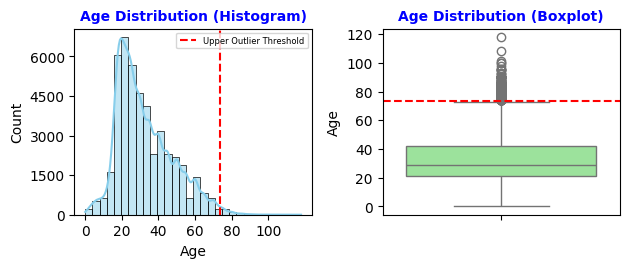

In [ ]:
# Histogram for Age
plt.subplot(2, 2, 1)
sns.histplot(preprocessed_df['Age'].dropna(), bins=30, kde=True, color='skyblue')
plt.xticks(ticks=range(0, 120, 20))
plt.yticks(ticks=range(0, 7000, 1500))
plt.axvline(upper_bound_age, color='red', linestyle='--', label='Upper Outlier Threshold')
plt.legend(fontsize=6)
plt.title('Age Distribution (Histogram)', fontsize=10, color='blue', fontweight='bold')

# Boxplot for Age
plt.subplot(2, 2, 2)
sns.boxplot(preprocessed_df['Age'].dropna(), color='lightgreen')
plt.yticks(ticks=range(0, 130, 20))
plt.axhline(upper_bound_age, color='red', linestyle='--')
plt.title('Age Distribution (Boxplot)', fontsize=10, color='blue', fontweight='bold')
plt.tight_layout()
plt.show()

In [ ]:
# Cap outliers for Age
preprocessed_df['Age'] = np.where(preprocessed_df['Age'] > upper_bound_age, upper_bound_age, preprocessed_df['Age'])

Histogram and Boxplot (after Outlier Handling)

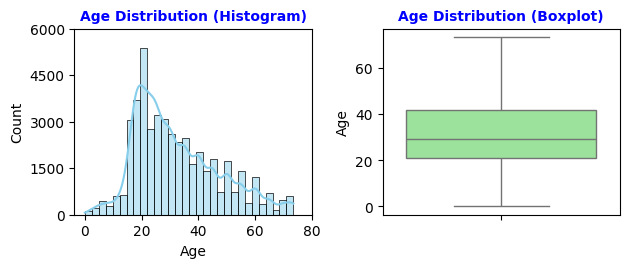

In [ ]:
# Histogram for Age
plt.subplot(2, 2, 1)
sns.histplot(preprocessed_df['Age'].dropna(), bins=30, kde=True, color='skyblue')
plt.xticks(ticks=range(0, int(preprocessed_df['Age'].max()) + 20, 20))
plt.yticks(ticks=range(0, 7000, 1500))
plt.title('Age Distribution (Histogram)', fontsize=10, color='blue', fontweight='bold')

# Boxplot for Age
plt.subplot(2, 2, 2)
sns.boxplot(preprocessed_df['Age'].dropna(), color='lightgreen')
plt.title('Age Distribution (Boxplot)', fontsize=10, color='blue', fontweight='bold')

plt.tight_layout()
plt.show()

### Response Time

In [ ]:
# Check missing values
print("Missing value count:")
print(preprocessed_df[['responsetime']].isnull().sum())
# Summary statistics before imputation
print("\nSummary statistics for 'responsetime':")
print(preprocessed_df[['responsetime']].describe())

Missing value count:
responsetime    0
dtype: int64

Summary statistics for 'responsetime':
       responsetime
count  46189.000000
mean       6.255970
std        4.901094
min        1.000000
25%        3.000000
50%        5.000000
75%        8.000000
max      101.000000


Check for Outliers with Quartiles

In [ ]:
# View Outlier for Age
Q1_responsetime = preprocessed_df['responsetime'].quantile(0.25) # First Quartile
Q3_responsetime = preprocessed_df['responsetime'].quantile(0.75) # Third Quartile

IQR_responsetime = Q3_responsetime - Q1_responsetime # middle 50% of the data

lower_bound_responsetime = Q1_responsetime - 1.5 * IQR_responsetime
upper_bound_responsetime = Q3_responsetime + 1.5 * IQR_responsetime

print("First Quartile:", Q1_responsetime)
print("Third Quartile:", Q3_responsetime)
print("\n")
print("Lower Bound:", lower_bound_responsetime)
print("Upper Bound:", upper_bound_responsetime)
print("\n")

# Count the number of values beyond the range
num_lower_outliers = (preprocessed_df['responsetime'] < lower_bound_responsetime).sum()  # Count lower outliers
num_upper_outliers = (preprocessed_df['responsetime'] > upper_bound_responsetime).sum()  # Count upper outliers

print(f"lower outliers: {num_lower_outliers}")
print(f"upper outliers: {num_upper_outliers}")

First Quartile: 3.0
Third Quartile: 8.0


Lower Bound: -4.5
Upper Bound: 15.5


lower outliers: 0
upper outliers: 2268


Age Distribution Graphs (Initial Condition)

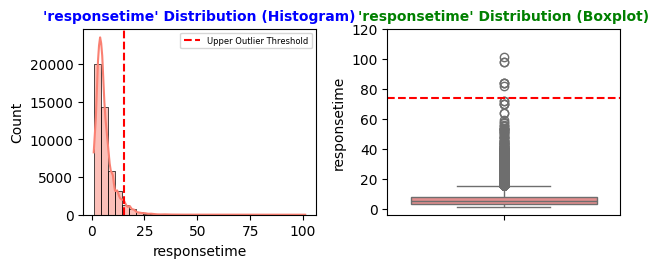

In [ ]:
# Histogram for responsetime
plt.subplot(2, 2, 1)
sns.histplot(preprocessed_df['responsetime'].dropna(), bins=30, kde=True, color='salmon')
plt.axvline(upper_bound_responsetime, color='red', linestyle='--', label='Upper Outlier Threshold')
plt.legend(fontsize=6)
plt.title("'responsetime' Distribution (Histogram)", fontsize=10, color='blue', fontweight='bold')

# Boxplot for responsetime
plt.subplot(2, 2, 2)
sns.boxplot(preprocessed_df['responsetime'].dropna(), color='lightcoral')
plt.yticks(ticks=range(0, 130, 20))
plt.axhline(upper_bound_age, color='red', linestyle='--')
plt.title("'responsetime' Distribution (Boxplot)", fontsize=10, color='green', fontweight='bold')
plt.tight_layout()
plt.show()

In [ ]:
# Cap outliers for responsetime
preprocessed_df['responsetime'] = np.where(preprocessed_df['responsetime'] > upper_bound_responsetime, upper_bound_responsetime, preprocessed_df['responsetime'])

Histogram and Boxplot (after Outlier Handling)

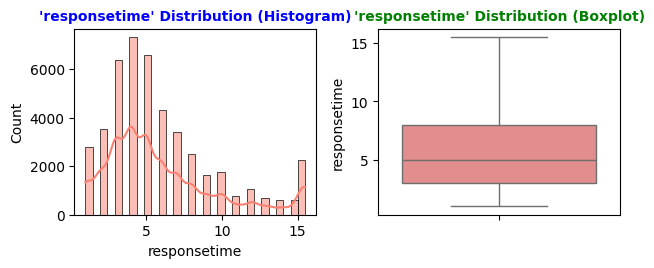

In [ ]:
# Histogram for responsetime
plt.subplot(2, 2, 1)
sns.histplot(preprocessed_df['responsetime'].dropna(), bins=30, kde=True, color='salmon')
plt.title("'responsetime' Distribution (Histogram)", fontsize=10, color='blue', fontweight='bold')

# Boxplot for responsetime
plt.subplot(2, 2, 2)
sns.boxplot(preprocessed_df['responsetime'].dropna(), color='lightcoral')
plt.title("'responsetime' Distribution (Boxplot)", fontsize=10, color='green', fontweight='bold')
plt.tight_layout()
plt.show()

### Gender


In [ ]:
# Check missing values
print("Missing value count:")
print(preprocessed_df[['Gender']].isnull().sum())
# Summary statistics before imputation
print("\nSummary statistics for 'Gender':")
print(preprocessed_df[['Gender']].describe())

Missing value count:
Gender    0
dtype: int64

Summary statistics for 'Gender':
       Gender
count   46189
unique      4
top      Male
freq    39795


In [ ]:
# unique values in 'Gender' column
preprocessed_df['Gender'].unique()

array(['Male', 'Female', 'Other', 0], dtype=object)

In [ ]:
# value counts for each category
print(preprocessed_df['Gender'].value_counts())

Gender
Male      39795
Female     6392
Other         1
0             1
Name: count, dtype: int64


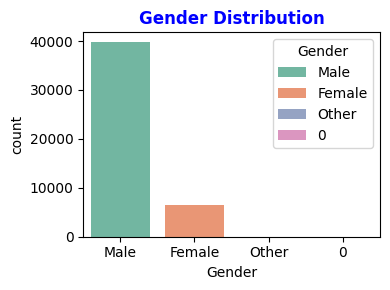

In [ ]:
# Bar plot for Gender
plt.figure(figsize=(4, 3))
sns.countplot(data=preprocessed_df, x='Gender', hue='Gender', palette='Set2')
plt.title('Gender Distribution', fontweight='bold', color='blue')
plt.tight_layout()
plt.show()

Merging '0' and 'Other' values in the 'Gender' column

In [ ]:
# Merge '0' and 'Other' values in the 'Gender' column
preprocessed_df['Gender'] = preprocessed_df['Gender'].replace({0: 'Other', 'Other': 'Other'})

In [ ]:
# value counts for each category
print(preprocessed_df['Gender'].value_counts())

Gender
Male      39795
Female     6392
Other         2
Name: count, dtype: int64


Bar plot after merging to 'Other' category

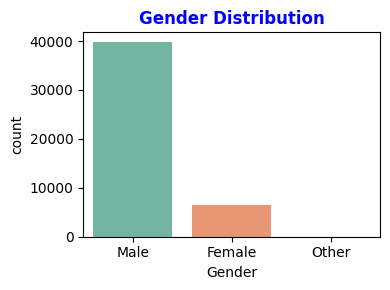

In [ ]:
# Bar plot for Gender
plt.figure(figsize=(4, 3))
sns.countplot(data=preprocessed_df, x='Gender', hue='Gender', palette='Set2')
plt.title('Gender Distribution', fontweight='bold', color='blue')
plt.tight_layout()
plt.show()

### Education Title

In [ ]:
# Check missing values
print("Missing value count:")
print(preprocessed_df[['EducationTitle']].isnull().sum())
# Summary statistics before imputation
print("\nSummary statistics for 'EducationTitle':")
print(preprocessed_df[['EducationTitle']].describe())

Missing value count:
EducationTitle    0
dtype: int64

Summary statistics for 'EducationTitle':
       EducationTitle
count           46189
unique              9
top            Matric
freq            15698


In [ ]:
# unique values in 'Gender' column
preprocessed_df['EducationTitle'].unique()

array(['Intermediate', 'Illetrate', 'Matric', 'Primary', 'Graduation',
       'Masters', 'Middle', 'PHD', 0], dtype=object)

In [ ]:
# value counts for each category
print(preprocessed_df['EducationTitle'].value_counts())

EducationTitle
Matric          15698
Primary         11717
Illetrate       10845
Intermediate     5675
Graduation       1686
Masters           439
Middle            119
PHD                 9
0                   1
Name: count, dtype: int64


In [ ]:
# Replace '0' with the mode value
mode_education = preprocessed_df['EducationTitle'].mode()[0]
preprocessed_df['EducationTitle'] = preprocessed_df['EducationTitle'].replace(0, mode_education)

In [ ]:
# Updated value counts
print(preprocessed_df['EducationTitle'].value_counts())

EducationTitle
Matric          15699
Primary         11717
Illetrate       10845
Intermediate     5675
Graduation       1686
Masters           439
Middle            119
PHD                 9
Name: count, dtype: int64


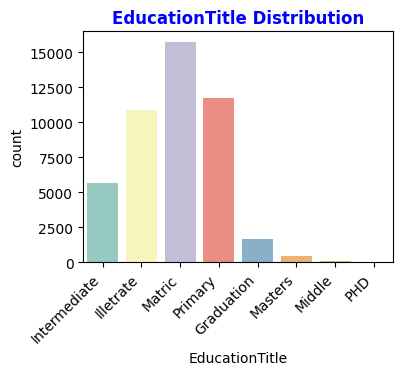

In [ ]:
# Bar plot for EducationTitle
plt.figure(figsize=(4, 3))
sns.countplot(data=preprocessed_df, x='EducationTitle', hue='EducationTitle', palette='Set3')
plt.title('EducationTitle Distribution', fontweight='bold', color='blue')
plt.xticks(rotation=45, ha='right')
plt.show()

### Cause

In [ ]:
# Check missing values
print("Missing value count:")
print(preprocessed_df[['Cause']].isnull().sum())
# Summary statistics before imputation
print("\nSummary statistics for 'Cause':")
print(preprocessed_df[['Cause']].describe())

Missing value count:
Cause    0
dtype: int64

Summary statistics for 'Cause':
             Cause
count        46189
unique           7
top     Over Speed
freq         29588


In [ ]:
# unique values in 'Cause' column
preprocessed_df['Cause'].unique()

array(['Over Speed', 'Carelessness', 'Tyre Burst', 'U Turn', 'Others',
       'Wrong Turn', 'One Wheeling'], dtype=object)

In [ ]:
# value counts for each category
print(preprocessed_df['Cause'].value_counts())

Cause
Over Speed      29588
Carelessness    14177
U Turn            934
Wrong Turn        841
Tyre Burst        481
Others            104
One Wheeling       64
Name: count, dtype: int64


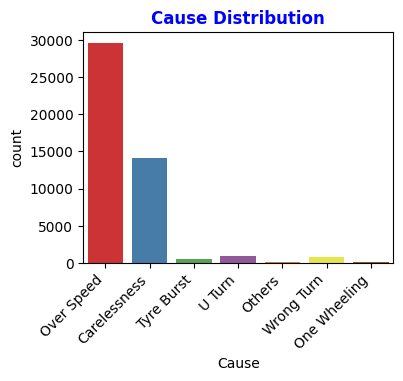

In [ ]:
# Bar plot for EducationTitle
plt.figure(figsize=(4, 3))
sns.countplot(data=preprocessed_df, x='Cause', hue='Cause', palette='Set1')
plt.title('Cause Distribution', fontweight='bold', color='blue')
plt.xticks(rotation=45, ha='right')
plt.show()

'Cause' column seems fine. nothing to change

### Emergency Area

#### Initial Condition

In [ ]:
# Check missing values
print("Missing value count:")
print(preprocessed_df[['EmergencyArea']].isnull().sum())
# Summary statistics before imputation
print("\nSummary statistics for 'EmergencyArea':")
print(preprocessed_df[['EmergencyArea']].describe())

Missing value count:
EmergencyArea    1
dtype: int64

Summary statistics for 'EmergencyArea':
                                            EmergencyArea
count                                               46188
unique                                              37520
top      Railway Track Underpass Nazar Chowk Near Kach...
freq                                                   42


In [ ]:
# Number of unique values in 'EmergencyArea' column
preprocessed_df['EmergencyArea'].nunique()

37520

In [ ]:
# top unique values in 'EmergencyArea' column
print(preprocessed_df['EmergencyArea'].value_counts()[:20])

EmergencyArea
 Railway Track Underpass Nazar Chowk Near Kacheri, Rwp.    42
 Cod Chowk Adyala Road Rawalpindi                          38
 502 Chowk, Adyala Road, Rwp                               33
Near Pc Hotel Signal Mall Road Rwp                         31
 22 No. Chungi Damiyal Road, Main Chowk, Rawalpindi        29
 Bohar Masjid Chore Peshawer Road Rwp                      28
 Near Pc Hotel Signal Mall Road Rwp                        24
Railway Track Underpass Nazar Chowk Near Kacheri, Rwp.     23
 Mandra Toll Plaza G.t Road                                22
 Near Romi Park, Saddar, Rawalpindi                        22
 Gulshanabad Stop, Adyala Road, Rwp                        21
 Kacha Stop I.j.p Road                                     21
Ammar Shaheed Chowk, Airport Road, Rawalpindi.             20
Khawaja Corporation Chowk, Adyala Road, Rwp.               20
 Adiala Road, Kalyal Stop, Rwp                             20
Gpo Chowk, Mall Road Saddar Rawalpindi                  

Create txt file for further analysis

In [ ]:
# # txt file to view all the unique categories
# EmergencyArea_unique = preprocessed_df['EmergencyArea'].unique()
# EmergencyArea_unique = sorted(EmergencyArea_unique)

# with open('/content/drive/MyDrive/Varsity/CSE445_SVa/EmergencyArea_unique.txt','w') as out:
#     for x in EmergencyArea_unique:
#         out.write(f"{x}\n")
# out.close()
# print("file created")

In [ ]:
# Count of the number of values that has only 1 occurrence
value_counts = preprocessed_df['EmergencyArea'].value_counts()
single_occurrence_count = (value_counts == 1).sum()
print("Single Occurance", single_occurrence_count)
print("Multiple Occurance", (value_counts > 1).sum())

Single Occurance 32370
Multiple Occurance 5150


In [ ]:
# Imputing the missing value with the mode
preprocessed_df['EmergencyArea'] = preprocessed_df['EmergencyArea'].fillna(preprocessed_df['EmergencyArea'].mode()[0])

In [ ]:
# Checking for missing values (verification)
print(preprocessed_df[['EmergencyArea']].isnull().sum())

EmergencyArea    0
dtype: int64


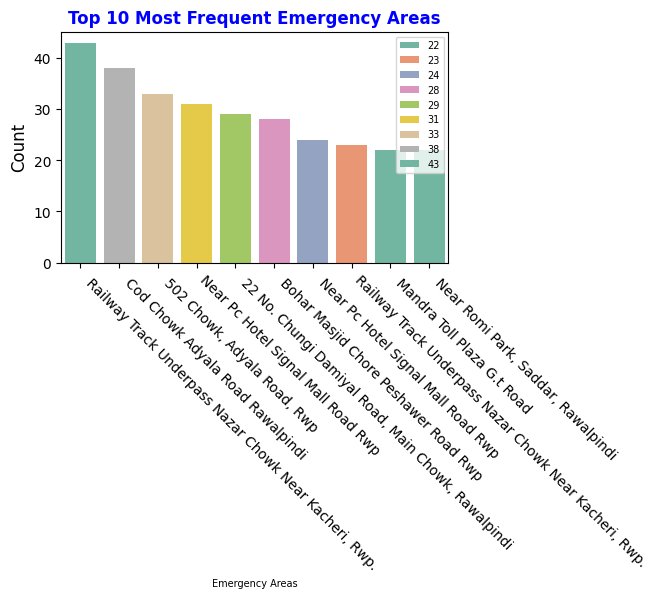

In [ ]:
# Bar plot for EmergencyArea
top_emergency_areas = preprocessed_df['EmergencyArea'].value_counts().nlargest(10)

plt.figure(figsize=(5, 3))
sns.barplot(x=top_emergency_areas.index, y=top_emergency_areas.values, hue=top_emergency_areas, palette='Set2')
plt.title('Top 10 Most Frequent Emergency Areas', fontweight='bold', color='blue')
plt.xlabel('Emergency Areas', fontsize=7)
plt.ylabel('Count', fontsize=12)
plt.legend(fontsize=7)
plt.xticks(rotation=-45, ha='left')
plt.show()

#### KMeans Clustering: Group Similar categories

Using TF-IDF and KMeans Clustering <br>
TF-IDF: Captures the importance of words in the EmergencyArea descriptions, making it useful for identifying patterns. <br>
KMeans Clustering: Automatically groups similar areas based on these patterns.

In [ ]:
value_counts = preprocessed_df['EmergencyArea'].value_counts()
n=10
print(f"More than {n} occurances", (value_counts > n).sum())

More than 10 occurances 78


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import numpy as np

# Get unique EmergencyArea values
EmergencyArea_unique = preprocessed_df['EmergencyArea'].unique()

# Convert EmergencyArea values to TF-IDF features
tfidf = TfidfVectorizer(stop_words='english', max_features=1000)
X = tfidf.fit_transform(EmergencyArea_unique)

# Apply KMeans clustering
num_clusters = 80
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(X)

# Create a mapping of EmergencyArea to cluster labels
area_to_cluster = {area: cluster for area, cluster in zip(EmergencyArea_unique, clusters)}

# Assign each area to a cluster
preprocessed_df['EmergencyArea_Cluster'] = preprocessed_df['EmergencyArea'].map(area_to_cluster)

# Extract top terms for each cluster
terms = tfidf.get_feature_names_out()
cluster_names = {}
for i in range(num_clusters):
    # Get the indices of areas in this cluster
    cluster_indices = np.where(clusters == i)[0]
    # Sum up the TF-IDF scores for the areas in this cluster
    cluster_tfidf = np.sum(X[cluster_indices], axis=0).A1
    # Get the top terms with the highest scores
    top_terms_indices = cluster_tfidf.argsort()[-5:][::-1]
    top_terms = [terms[idx] for idx in top_terms_indices]
    # Assign a descriptive name
    cluster_names[i] = " & ".join(top_terms)

# Replace the cluster numbers with descriptive names in the same column
preprocessed_df['EmergencyArea_Cluster'] = preprocessed_df['EmergencyArea_Cluster'].map(cluster_names)

New Unique values for the column

In [ ]:
print(preprocessed_df['EmergencyArea_Cluster'].value_counts()[:20])

EmergencyArea_Cluster
rwp & road & near & infront & gt              6042
chowk & rwp & main & road & near              2360
rawalpindi & road & punjab & near & chowk     1964
mandra & chakwal & road & gt & stop           1165
adyala & road & rwp & stop & gulshanabad      1158
kallar & syedan & road & pindori & near       1135
taxila & gt & road & near & wah               1027
airport & old & road & rwp & koral            1027
stop & road & rwp & kacha & main               947
saddar & murree & rwp & road & chowk           888
mall & road & rwp & saddar & asghar            856
peshawar & road & rwp & saddar & infront       851
faizabad & murree & road & rwp & shamsabad     828
gujjar & khan & mandra & gt & road             808
chakri & road & rwp & stop & mohra             775
hospital & rwp & road & infront & near         735
office & nadra & rwp & near & road             651
rawal & road & rwp & chowk & near              650
wah & cantt & gt & road & city                 625
town & sa

In [ ]:
# Check the result
(preprocessed_df[['EmergencyArea', 'EmergencyArea_Cluster']].head(10))

,EmergencyArea,EmergencyArea_Cluster
0,NEAR APS SCHOOL FORT ROAD RWP,rwp & road & near & infront & gt
1,"Infront of Daig.com, Near Dha gate 2, gt road...",dha & gate & phase & gt & rwp
2,Muhammadi chowk arshad bakery khyaban e sirsye...,chowk & rwp & main & road & near
3,"Gulzar e quaid, T/W Katcheri Near Attock Pump,...",gulzar & quaid & airport & qaid & rwp
4,Taaj Company Gawalmandi Chowk Liaqat Baag Road...,chowk & rwp & main & road & near
5,Chour chowk under bridge towards saddar peshaw...,chour & chowk & peshawar & rwp & road
6,Infront of Zam Zam CNG tipu road rwp,hotel & tipu & road & rwp & near
7,Commite chowk pehlwan raveri murree road t.w f...,faizabad & murree & road & rwp & shamsabad
8,Near Saint marys school gate Mazhar Qayoom roa...,rwp & road & near & infront & gt
9,Infront of rasheed sweets kamran market kashmi...,kamran & chowk & market & rawalpindi & saddar


In [ ]:
# Override the EmergencyArea column with the EmergencyArea_Cluster values
preprocessed_df['EmergencyArea'] = preprocessed_df['EmergencyArea_Cluster']

# Drop the EmergencyArea_Cluster column if you no longer need it
preprocessed_df.drop('EmergencyArea_Cluster', axis=1, inplace=True)

In [ ]:
preprocessed_df['EmergencyArea'].nunique()

80

### Reason

#### Initial condition

In [ ]:
# Check missing values
print("Missing value count:")
print(preprocessed_df[['Reason']].isnull().sum())
# Summary statistics before imputation
print("\nSummary statistics for 'Reason':")
print(preprocessed_df[['Reason']].describe())

Missing value count:
Reason    1
dtype: int64

Summary statistics for 'Reason':
       Reason
count   46188
unique  23940
top      same
freq     2328


In [ ]:
# Number of unique values in 'Reason' column
preprocessed_df['Reason'].nunique()

23940

In [ ]:
# Count of the number of values that has only 1 occurrence
value_counts = preprocessed_df['Reason'].value_counts()
print("Single Occurance\t:", (value_counts == 1).sum())
print("Multiple Occurance\t:", (value_counts > 1).sum())

Single Occurance	: 22194
Multiple Occurance	: 1746


In [ ]:
# top unique values in 'Reason' column
print(preprocessed_df['Reason'].value_counts()[:20])

Reason
same                                    2328
Same                                    1323
Bike Slipped                            1223
Same                                    1015
Bike Slip                                957
Bike slipped                             956
.                                        647
bike slipped                             476
Bike hit the Pedestrian and Runaway      381
Car hit the Bike and Runaway             375
Bike hit Pedestrian and runaway          364
Bike hit Bike and runaway                334
Car hit Bike and runaway                 299
Bike hit the Pedestrian                  261
two bikes collieds                       223
Bike hit the Bike and Runaway            207
Bike hit Pedestrian                      189
Car hit the Bike                         172
Bike hit pedistarian                     166
car hit bike and escaped                 151
Name: count, dtype: int64


<font color="red">*Observation: Multiple categories with similar names (Ex: Bike Slipped, Bike Slip, bike slipped)*

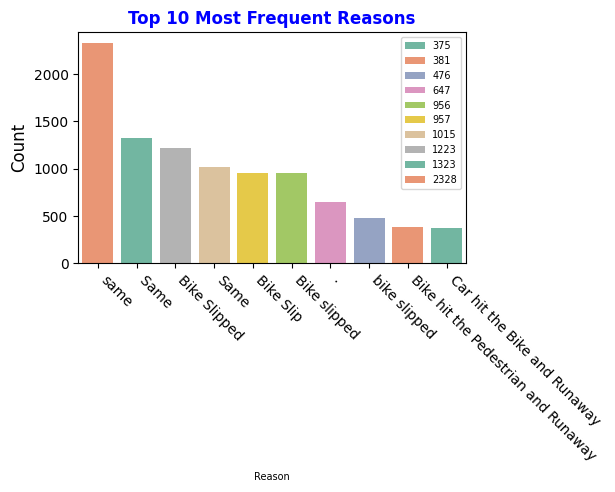

In [ ]:
# Bar plot for Reason
top_reasons = preprocessed_df['Reason'].value_counts().nlargest(10)

plt.figure(figsize=(5, 3))
sns.barplot(x=top_reasons.index, y=top_reasons.values, hue=top_reasons, palette='Set2')
plt.title('Top 10 Most Frequent Reasons', fontweight='bold', color='blue')
plt.xlabel('Reason', fontsize=7)
plt.ylabel('Count', fontsize=12)
plt.legend(fontsize=7)
plt.xticks(rotation=-45, ha='left')
plt.show()

#### Modifying values

In [ ]:
# Convert all values in 'Reason' column to lowercase and strip extra spaces
preprocessed_df['Reason'] = preprocessed_df['Reason'].str.lower().str.strip()

In [ ]:
# Count of the number of values that has only 1 occurrence
value_counts = preprocessed_df['Reason'].value_counts()
print("Single Occurance\t:", (value_counts == 1).sum())
print("Multiple Occurance\t:", (value_counts > 1).sum())

Single Occurance	: 20338
Multiple Occurance	: 1564


In [ ]:
# Current missing values
print(preprocessed_df[['Reason']].isnull().sum())

Reason    2
dtype: int64


Values with 'same' or 'Same' should inherit it's previous column's *value*

In [ ]:
# number of values containing 'same'
same_count = (preprocessed_df['Reason']=='same').sum()
print(same_count)

4734


In [ ]:
# Replace 'same' with NaN, so we can use forward fill to replace them with the previous value
preprocessed_df['Reason'] = preprocessed_df['Reason'].replace('same', pd.NA)

In [ ]:
# total missing values
print(preprocessed_df[['Reason']].isnull().sum())

Reason    4736
dtype: int64


In [ ]:
# Use forward fill to replace NaN with the previous value
preprocessed_df['Reason'] = preprocessed_df['Reason'].ffill()

In [ ]:
print(preprocessed_df[['Reason']].isnull().sum())

Reason    0
dtype: int64


Assuming values with '.' also inherits it's previous column's value

In [ ]:
# number of values containing '.'
dot_count = (preprocessed_df['Reason']=='.').sum()
print(dot_count)

651


In [ ]:
# Replace '.' with NaN, so we can use forward fill to replace them with the previous value
preprocessed_df['Reason'] = preprocessed_df['Reason'].replace('.', pd.NA)

In [ ]:
# Use forward fill to replace NaN with the previous value
preprocessed_df['Reason'] = preprocessed_df['Reason'].ffill()

In [ ]:
print(preprocessed_df[['Reason']].isnull().sum())

Reason    0
dtype: int64


#### Improved Condition

In [ ]:
# final missing value count
print(preprocessed_df[['Reason']].isnull().sum())

Reason    0
dtype: int64


In [ ]:
# Count of the number of values that has only 1 occurrence
value_counts = preprocessed_df['Reason'].value_counts()
print("Single Occurance\t:", (value_counts == 1).sum())
print("Multiple Occurance\t:", (value_counts > 1).sum())

Single Occurance	: 17930
Multiple Occurance	: 3970


In [ ]:
# top unique values in 'Reason' column
print(preprocessed_df['Reason'].value_counts()[:20])

Reason
bike slipped                           3048
bike slip                              1128
car hit bike                            488
bike hit bike                           470
bike hit the pedestrian and runaway     461
car hit the bike and runaway            436
bike hit pedestrian and runaway         435
two bikes collieds                      435
bike hit bike and runaway               411
car hit bike and runaway                405
bike hit pedistarian                    396
car hit bike and escaped                353
bike hit the pedestrian                 342
bike hit pedestrian                     337
bike hit bike and escaped               330
bike hit the bike and runaway           244
bike hit pedistarian and escaped        244
bike hit with car                       234
car hit the bike                        218
fall from bike                          169
Name: count, dtype: int64


#### create txt file for further analysis

In [ ]:
# # txt file to view all the unique categories
# reason_unique = preprocessed_df['Reason'].unique()
# reason_unique = sorted(reason_unique)

# with open('/content/drive/MyDrive/Varsity/CSE445_SVa/reason_unique.txt','w') as out:
#     for x in reason_unique:
#         out.write(f"{x}\n")
# out.close()
# print("file created")

#### KMeans Clustering

to combine these type of categories later
> bike slipped - 3048 <br>
> bike slip    - 1128


In [ ]:
value_counts = preprocessed_df['Reason'].value_counts()
n=30
print(f"More than {n} occurances", (value_counts > n).sum())

More than 30 occurances 104


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import numpy as np

# Get unique Reason values
Reason_unique = preprocessed_df['Reason'].unique()

# Convert Reason values to TF-IDF features
tfidf = TfidfVectorizer(stop_words='english', max_features=1000)
X = tfidf.fit_transform(Reason_unique)

# Apply KMeans clustering
num_clusters = 30
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(X)

# Create a mapping of Reason to cluster labels
reason_to_cluster = {area: cluster for area, cluster in zip(Reason_unique, clusters)}

# Assign each area to a cluster
preprocessed_df['Reason_Cluster'] = preprocessed_df['Reason'].map(reason_to_cluster)

# Extract top terms for each cluster
terms = tfidf.get_feature_names_out()
cluster_names = {}
for i in range(num_clusters):
    # Get the indices of areas in this cluster
    cluster_indices = np.where(clusters == i)[0]
    # Sum up the TF-IDF scores for the areas in this cluster
    cluster_tfidf = np.sum(X[cluster_indices], axis=0).A1
    # Get the top terms with the highest scores
    top_terms_indices = cluster_tfidf.argsort()[-5:][::-1]
    top_terms = [terms[idx] for idx in top_terms_indices]
    # Assign a descriptive name
    cluster_names[i] = " & ".join(top_terms)

# Replace the cluster numbers with descriptive names in the same column
preprocessed_df['Reason_Cluster'] = preprocessed_df['Reason_Cluster'].map(cluster_names)

In [ ]:
print(preprocessed_df['Reason_Cluster'].value_counts()[:20])

Reason_Cluster
bike & hit & ko & bikes & road                      6142
bike & hit & fall & escaped & pedestrian            5096
slipped & bike & speed & road & overspeed           4952
runaway & bike & unknown & hit & car                4766
car & hit & bike & pedestrian & footpath            4211
slip & speed & bike & 70cc & road                   2397
run & away & unknown & bike & car                   2148
rickshaw & hit & runaway & bike & riu               1793
70 & cd & bike & cc & speed                         1449
vehicle & hit & bike & runaway & unknown            1141
70cc & bike & speed & slipped & honda               1120
ki & waja & sy & gir & ho                           1100
suzuki & hit & bike & car & bolan                    914
van & hit & bike & runaway & suzuki                  878
rikshaw & hit & escaped & bike & car                 859
truck & hit & bike & car & runaway                   852
tyre & stuck & bike & burst & fall                   766
125 & honda & bi

In [ ]:
# Check the result
(preprocessed_df[['Reason', 'Reason_Cluster']].head(10))

,Reason,Reason_Cluster
0,bike slip,slip & speed & bike & 70cc & road
1,car hit footpath,car & hit & bike & pedestrian & footpath
2,rickshaw hit with car,rickshaw & hit & runaway & bike & riu
3,car hit car and runaway,car & hit & bike & pedestrian & footpath
4,unknown bike hit bike and runaway,runaway & bike & unknown & hit & car
5,bike hit bike and runaway,runaway & bike & unknown & hit & car
6,bike slip,slip & speed & bike & 70cc & road
7,"fall from bike, where patient tak lift from bi...",bike & hit & fall & escaped & pedestrian
8,bike slip due to oil on road,slip & speed & bike & 70cc & road
9,rickshaw hit pedestrian and runaway,rickshaw & hit & runaway & bike & riu


In [ ]:
# Override the EmergencyArea column with the Reason_Cluster values
preprocessed_df['Reason'] = preprocessed_df['Reason_Cluster']

# Drop the Reason_Cluster column if you no longer need it
preprocessed_df.drop('Reason_Cluster', axis=1, inplace=True)

In [ ]:
preprocessed_df['Reason'].nunique()

30

#### Updated Bar plot for Reason column

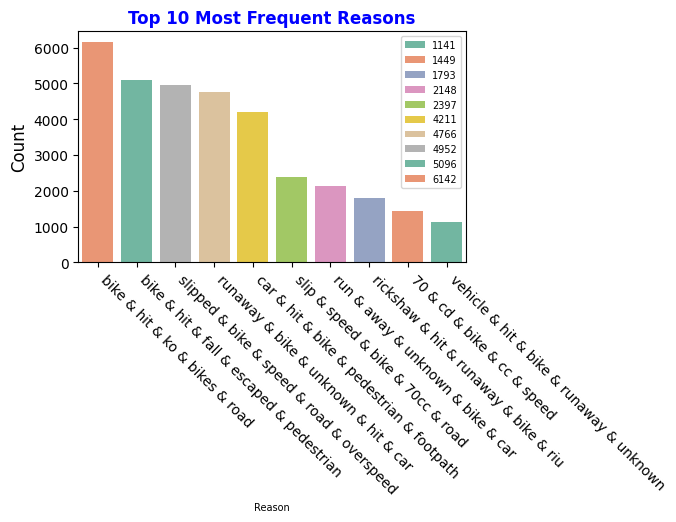

In [ ]:
# Bar plot for Reason
top_reasons = preprocessed_df['Reason'].value_counts().nlargest(10)

plt.figure(figsize=(5, 3))
sns.barplot(x=top_reasons.index, y=top_reasons.values, hue=top_reasons, palette='Set2')
plt.title('Top 10 Most Frequent Reasons', fontweight='bold', color='blue')
plt.xlabel('Reason', fontsize=7)
plt.ylabel('Count', fontsize=12)
plt.legend(fontsize=7)
plt.xticks(rotation=-45, ha='left')
plt.show()

### Injury Type

In [ ]:
# Check missing values
print("Missing value count:")
print(preprocessed_df[['InjuryType']].isnull().sum())
# Summary statistics before imputation
print("\nSummary statistics for 'InjuryType':")
print(preprocessed_df[['InjuryType']].describe())

Missing value count:
InjuryType    2
dtype: int64

Summary statistics for 'InjuryType':
       InjuryType
count       46187
unique          5
top         Minor
freq        34788


In [ ]:
# unique values in 'InjuryType' column
preprocessed_df['InjuryType'].unique()

array(['Minor', 'Single Fracture', 'Head Injury', 'Multiple Fractures',
       'Spinal Injury', nan], dtype=object)

In [ ]:
# value counts for each category
print(preprocessed_df['InjuryType'].value_counts())

InjuryType
Minor                 34788
Single Fracture        6737
Head Injury            3503
Multiple Fractures      778
Spinal Injury           381
Name: count, dtype: int64


<font color='violet'>'InjuryType' depends on other column values and imputing the missing values with mode could lead to unsuitable value for the rows <br>
And as 'InjuryType' is one of our target column, unsuitable values could affect model performance <br>
So, it is better to drop the rows with missing values for this column. By doing so, we ensure the dataset remains accurate without introducing bias from imputation

In [ ]:
# Drop rows with missing values in 'InjuryType' column
preprocessed_df = preprocessed_df.dropna(subset=['InjuryType'])

In [ ]:
print(preprocessed_df[['InjuryType']].isnull().sum())

InjuryType    0
dtype: int64


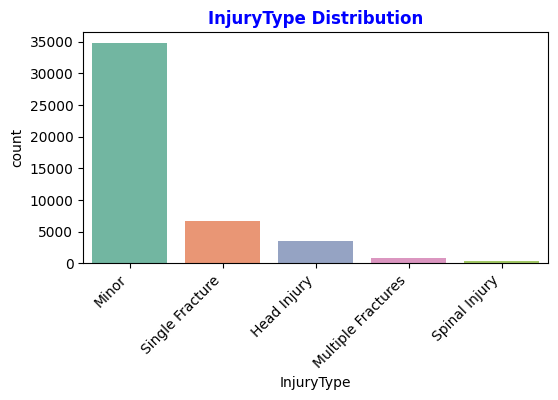

In [ ]:
# Bar plot for InjuryType
plt.figure(figsize=(6, 3))
sns.countplot(data=preprocessed_df, x='InjuryType', hue='InjuryType', palette='Set2')
plt.title('InjuryType Distribution', fontweight='bold', color='blue')
plt.xticks(rotation=45, ha='right')
plt.show()

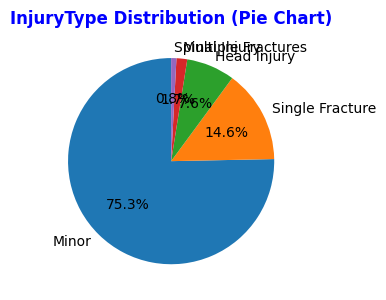

In [ ]:
# Subplot for the pie chart
plt.subplot(1, 2, 2)
patient_status_counts = preprocessed_df['InjuryType'].value_counts()
patient_status_counts.plot(kind='pie', autopct='%1.1f%%', startangle=90)
plt.title('InjuryType Distribution (Pie Chart)', fontweight='bold', color='blue')
plt.ylabel('')  # Hides the ylabel for the pie chart

plt.tight_layout()
plt.show()

### Patient Status

In [ ]:
# Check missing values
print("Missing value count:")
print(preprocessed_df[['PatientStatus']].isnull().sum())
# Summary statistics before imputation
print("\nSummary statistics for 'PatientStatus':")
print(preprocessed_df[['PatientStatus']].describe())

Missing value count:
PatientStatus    0
dtype: int64

Summary statistics for 'PatientStatus':
           PatientStatus
count              46187
unique                 3
top     Alive & unstable
freq               23788


In [ ]:
# value counts for each category
print(preprocessed_df['PatientStatus'].value_counts())

PatientStatus
Alive & unstable    23788
Alive & stable      21812
Dead                  587
Name: count, dtype: int64


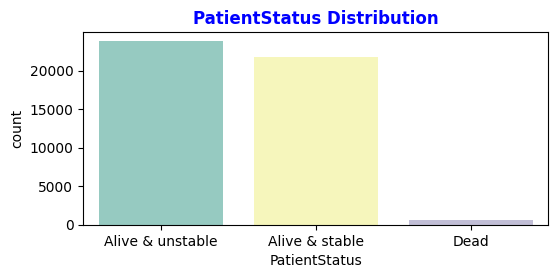

In [ ]:
# Bar plot for PatientStatus
plt.figure(figsize=(6, 2.5))
sns.countplot(data=preprocessed_df, x='PatientStatus', hue='PatientStatus', palette='Set3')
plt.title('PatientStatus Distribution', fontweight='bold', color='blue')
plt.show()

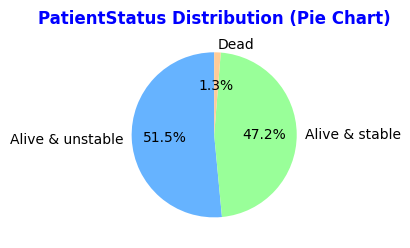

In [ ]:
# Subplot for the pie chart
plt.subplot(1, 2, 2)
patient_status_counts = preprocessed_df['PatientStatus'].value_counts()
patient_status_counts.plot(kind='pie', autopct='%1.1f%%', colors=['#66b3ff', '#99ff99', '#ffcc99'], startangle=90)
plt.title('PatientStatus Distribution (Pie Chart)', fontweight='bold', color='blue')
plt.ylabel('')  # Hides the ylabel for the pie chart

plt.tight_layout()
plt.show()

No changes needed

### Vehicle Columns

In [ ]:
vehicle_columns = ['BicycleInvovled', 'BikesInvolved', 'BusesInvolved', 'CarsInvolved', 'CartInvovled', 'RickshawsInvolved', 'TractorInvovled', 'TrainsInvovled', 'TrucksInvolved', 'VansInvolved', 'OthersInvolved']

In [ ]:
print("Missing Values:\n")
for column in vehicle_columns:
    missing_count = preprocessed_df[column].isnull().sum()
    print(f"{column:<25}: {missing_count}")

Missing Values:

BicycleInvovled          : 0
BikesInvolved            : 0
BusesInvolved            : 0
CarsInvolved             : 0
CartInvovled             : 0
RickshawsInvolved        : 0
TractorInvovled          : 0
TrainsInvovled           : 0
TrucksInvolved           : 0
VansInvolved             : 0
OthersInvolved           : 0


In [ ]:
# Count of accidents involving each type of vehicle
print(preprocessed_df[vehicle_columns].sum())

BicycleInvovled        403.0
BikesInvolved        44674.0
BusesInvolved          425.0
CarsInvolved         10810.0
CartInvovled            91.0
RickshawsInvolved     4032.0
TractorInvovled        454.0
TrainsInvovled         102.0
TrucksInvolved        2076.0
VansInvolved          5422.0
OthersInvolved         446.0
dtype: float64


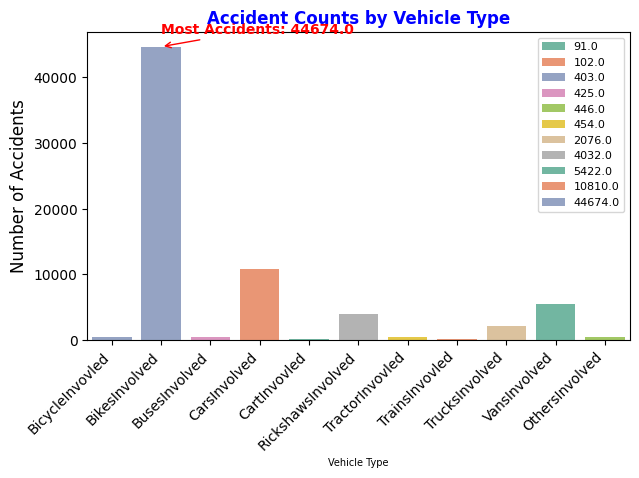

In [ ]:
# Visualizing the counts of vehicle involvement
vehicle_counts = preprocessed_df[vehicle_columns].sum()

plt.figure(figsize=(7, 4))
sns.barplot(x=vehicle_counts.index, y=vehicle_counts.values, hue=vehicle_counts, palette='Set2')
plt.title('Accident Counts by Vehicle Type', fontweight='bold', color='blue')
plt.xlabel('Vehicle Type', fontsize=7)
plt.ylabel('Number of Accidents', fontsize=12)
plt.legend(fontsize=8)
plt.xticks(rotation=45, ha='right')

max_count = vehicle_counts.max()
plt.annotate(f'Most Accidents: {max_count}',
             xy=(vehicle_counts.idxmax(), max_count),
             xytext=(vehicle_counts.idxmax(), max_count + 2000),
             arrowprops=dict(arrowstyle='->', color='red'),
             fontsize=10, color='red', fontweight='bold')

# plt.tight_layout()
plt.show()

No changes needed

### Calltime

#### Overview

In [ ]:
# Summary statistics for calltime
print("\nSummary statistics for 'CallTime':\n")
print(preprocessed_df[['CallTime']].describe())


Summary statistics for 'CallTime':

                            CallTime
count                          40231
mean   2021-11-24 21:09:29.746588416
min              2020-01-01 01:12:13
25%              2021-01-03 12:05:38
50%              2021-12-01 09:01:00
75%              2022-11-03 20:32:00
max              2023-07-31 17:11:00


In [ ]:
# Check missing values
print("Missing value count:")
print(preprocessed_df[['CallTime']].isnull().sum())

Missing value count:
CallTime    5956
dtype: int64


In [ ]:
print("Earliest Date:", preprocessed_df['CallTime'].min())
print("Latest Date:", preprocessed_df['CallTime'].max())

Earliest Date: 2020-01-01 01:12:13
Latest Date: 2023-07-31 17:11:00


In [ ]:
print(preprocessed_df['CallTime'].head(10))

0   2020-12-31 22:41:47
1   2020-12-31 22:25:00
2   2020-12-31 21:54:59
3   2020-12-31 21:24:22
4   2020-12-31 21:03:49
5   2020-12-31 20:54:02
6   2020-12-31 20:04:50
7   2020-12-31 18:46:19
8   2020-12-31 18:20:37
9   2020-12-31 17:38:21
Name: CallTime, dtype: datetime64[ns]


In [ ]:
# datatype of values in the column
type(preprocessed_df['CallTime'][0])

pandas._libs.tslibs.timestamps.Timestamp

#### Visualization for 'CallTime' column (before imputation)


In [ ]:
# Ensure 'CallTime' is in datetime format if not already
preprocessed_df.loc[:, 'CallTime'] = pd.to_datetime(preprocessed_df['CallTime'])

# Ignore missing values for plotting
calltime_series = preprocessed_df['CallTime'].dropna()

In [ ]:
# Check unique years in the data
calltime_series.dt.year.unique()

array([2020, 2021, 2022, 2023], dtype=int32)

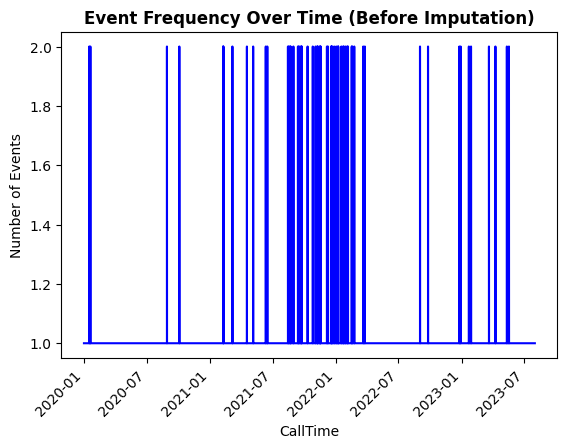

In [ ]:
# Create a time series plot for 'CallTime' before imputation
calltime_series.value_counts().sort_index().plot(kind='line', color='blue')
plt.title('Event Frequency Over Time (Before Imputation)', fontweight='bold')
plt.xlabel('CallTime')
plt.ylabel('Number of Events')
plt.xticks(rotation=45)
plt.show()

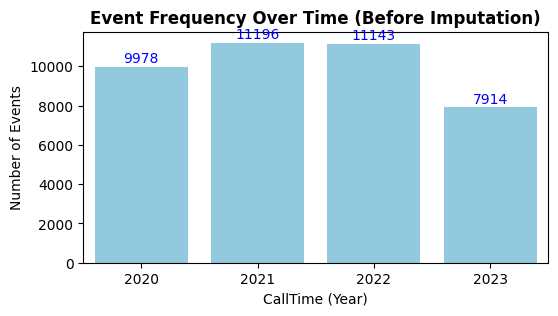

In [ ]:
# Get counts for each year
year_counts = calltime_series.dt.year.value_counts().sort_index()

# Create a bar plot with Seaborn
plt.figure(figsize=(6, 3))
sns.barplot(x=year_counts.index, y=year_counts.values, color='skyblue')

# Add counts to each bar
for i, count in enumerate(year_counts.values):
    plt.text(i, count + 50, str(count), ha='center', va='bottom', fontsize=10, color='blue')

# Plot styling
plt.title('Event Frequency Over Time (Before Imputation)', fontweight='bold')
plt.xlabel('CallTime (Year)')
plt.ylabel('Number of Events')
plt.show()

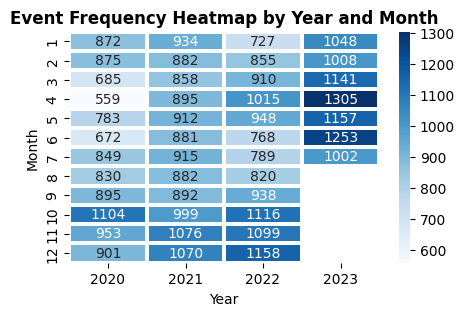

In [ ]:
heatmap_data = calltime_series.dt.to_period('M').value_counts().sort_index()

# Convert to DataFrame for reshaping
heatmap_df = heatmap_data.rename_axis('YearMonth').reset_index(name='Counts')
heatmap_df['Year'] = heatmap_df['YearMonth'].dt.year
heatmap_df['Month'] = heatmap_df['YearMonth'].dt.month

# Create a pivot table for the heatmap
pivot_table = heatmap_df.pivot(index='Month', columns='Year', values='Counts')

# Plot heatmap
plt.figure(figsize=(5, 3))
sns.heatmap(pivot_table, cmap='Blues', annot=True, fmt=".0f", linewidths=1.5)
plt.title('Event Frequency Heatmap by Year and Month', fontweight='bold')
plt.xlabel('Year')
plt.ylabel('Month')
plt.show()

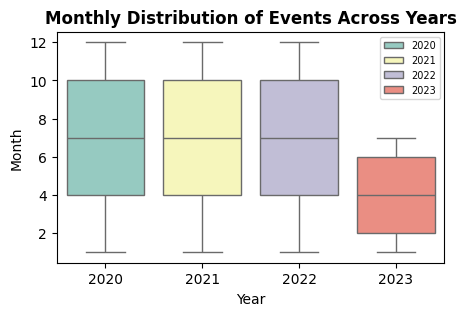

In [ ]:
# Plot a boxplot for monthly distributions across years
boxplot_data = calltime_series.to_frame(name='CallTime')
boxplot_data['Year'] = boxplot_data['CallTime'].dt.year
boxplot_data['Month'] = boxplot_data['CallTime'].dt.month

plt.figure(figsize=(5, 3))
sns.boxplot(data=boxplot_data, x='Year', y='Month', palette='Set3', hue='Year')
plt.title('Monthly Distribution of Events Across Years', fontweight='bold')
plt.xlabel('Year')
plt.ylabel('Month')
plt.legend(fontsize=7)
plt.show()

In [ ]:
%pip install calmap

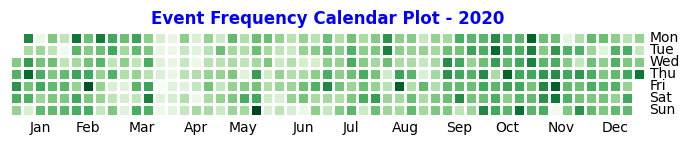

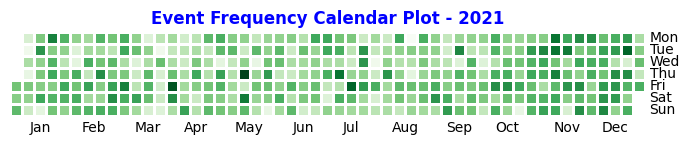

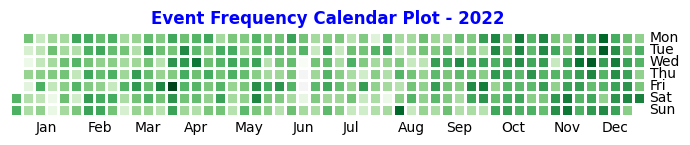

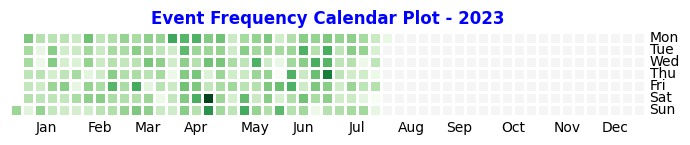

In [ ]:
import calmap
years = calltime_series.dt.year.unique()

for year in years:
    # Filter the calltime_series for the current year
    calltime_year = calltime_series[calltime_series.dt.year == year]

    # Aggregate the number of events by day
    calltime_year_daily = calltime_year.groupby(calltime_year.dt.date).size()

    # Ensure the index is datetime (if it isn't already)
    calltime_year_daily.index = pd.to_datetime(calltime_year_daily.index)

    # Create a calendar plot for the current year
    plt.figure(figsize=(7, 6))
    calmap.yearplot(calltime_year_daily, cmap='Greens')
    plt.title(f'Event Frequency Calendar Plot - {year}', fontweight='bold', color='blue')
    plt.tight_layout()
    plt.show()

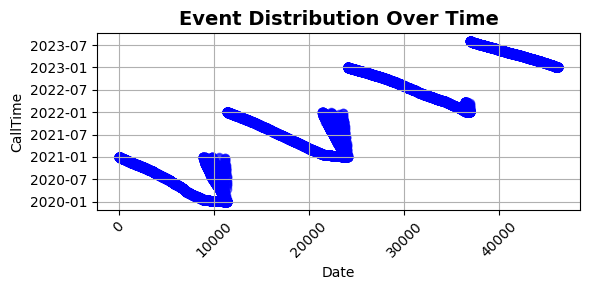

In [ ]:
# Scatter plot showing the distribution of events over time
plt.figure(figsize=(6, 3))
plt.scatter(calltime_series.index, calltime_series.values, color='blue', alpha=0.5)
plt.title('Event Distribution Over Time', fontsize=14, fontweight='bold')
plt.xlabel('Date')
plt.ylabel('CallTime')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

<ipython-input-118-a5e1219833ca>:4: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  preprocessed_df.resample('M', on='CallTime').size().plot(color='blue')


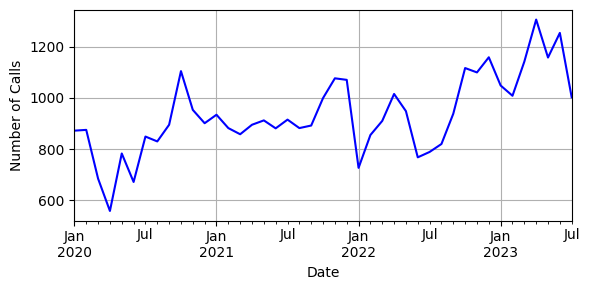

In [ ]:
# monthly frequency plot
plt.figure(figsize=(6, 3))
# Resample the data by month and count the number of calls
preprocessed_df.resample('M', on='CallTime').size().plot(color='blue')

plt.xlabel('Date')
plt.ylabel('Number of Calls')
plt.grid(True)
plt.tight_layout()
plt.show()

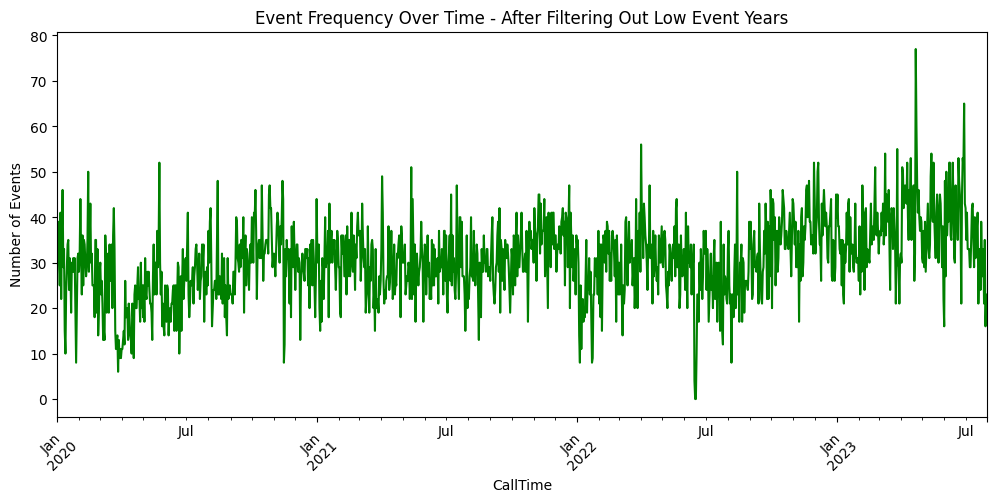

In [ ]:
# time series plot for 'CallTime'
plt.figure(figsize=(12, 5))
preprocessed_df.set_index('CallTime').resample('D').size().plot(kind='line', color='green')
plt.title('Event Frequency Over Time - After Filtering Out Low Event Years')
plt.xlabel('CallTime')
plt.ylabel('Number of Events')
plt.xticks(rotation=45)
plt.show()

#### Handle Missing values for 'CallTime' Column


In [ ]:
# Check missing values
print("Missing value count:")
print(preprocessed_df[['CallTime']].isnull().sum())

Missing value count:
CallTime    5956
dtype: int64


In [ ]:
# Forward  fill for short gaps in the time series, and then interpolate the remaining(if any)
preprocessed_df['CallTime'] = preprocessed_df['CallTime'].ffill().interpolate(method='linear')

In [ ]:
print("Remaining missing values:")
print(preprocessed_df[['CallTime']].isnull().sum())

Remaining missing values:
CallTime    0
dtype: int64


#### Visualization for 'CallTime' column (After imputation)


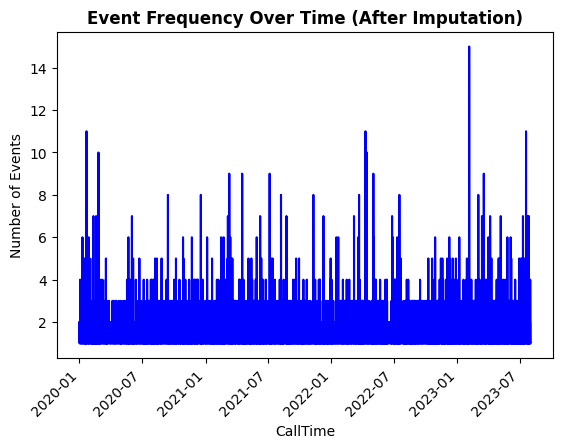

In [ ]:
# Create a time series plot for 'CallTime' after imputation
preprocessed_df['CallTime'].value_counts().sort_index().plot(kind='line', color='blue')
plt.title('Event Frequency Over Time (After Imputation)', fontweight='bold')
plt.xlabel('CallTime')
plt.ylabel('Number of Events')
plt.xticks(rotation=45)
plt.show()

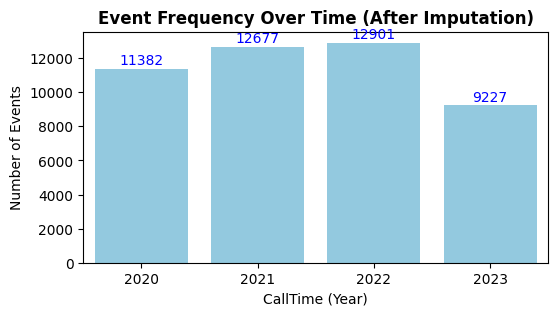

In [ ]:
# Get counts for each year
year_counts = preprocessed_df['CallTime'].dt.year.value_counts().sort_index()

# Create a bar plot with Seaborn
plt.figure(figsize=(6, 3))
sns.barplot(x=year_counts.index, y=year_counts.values, color='skyblue')

# Add counts to each bar
for i, count in enumerate(year_counts.values):
    plt.text(i, count + 50, str(count), ha='center', va='bottom', fontsize=10, color='blue')

# Plot styling
plt.title('Event Frequency Over Time (After Imputation)', fontweight='bold')
plt.xlabel('CallTime (Year)')
plt.ylabel('Number of Events')
plt.show()

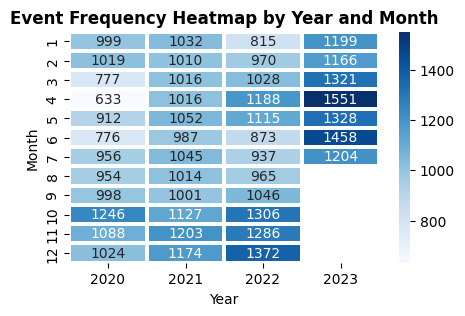

In [ ]:
heatmap_data = preprocessed_df['CallTime'].dt.to_period('M').value_counts().sort_index()

# Convert to DataFrame for reshaping
heatmap_df = heatmap_data.rename_axis('YearMonth').reset_index(name='Counts')
heatmap_df['Year'] = heatmap_df['YearMonth'].dt.year
heatmap_df['Month'] = heatmap_df['YearMonth'].dt.month

# Create a pivot table for the heatmap
pivot_table = heatmap_df.pivot(index='Month', columns='Year', values='Counts')

# Plot heatmap
plt.figure(figsize=(5, 3))
sns.heatmap(pivot_table, cmap='Blues', annot=True, fmt=".0f", linewidths=1.5)
plt.title('Event Frequency Heatmap by Year and Month', fontweight='bold')
plt.xlabel('Year')
plt.ylabel('Month')
plt.show()

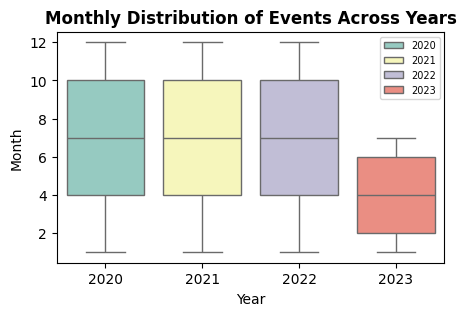

In [ ]:
# Plot a boxplot for monthly distributions across years
boxplot_data = preprocessed_df['CallTime'].to_frame(name='CallTime')
boxplot_data['Year'] = boxplot_data['CallTime'].dt.year
boxplot_data['Month'] = boxplot_data['CallTime'].dt.month

plt.figure(figsize=(5, 3))
sns.boxplot(data=boxplot_data, x='Year', y='Month', palette='Set3', hue='Year')
plt.title('Monthly Distribution of Events Across Years', fontweight='bold')
plt.xlabel('Year')
plt.ylabel('Month')
plt.legend(fontsize=7)
plt.show()

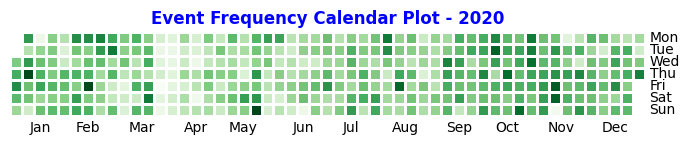

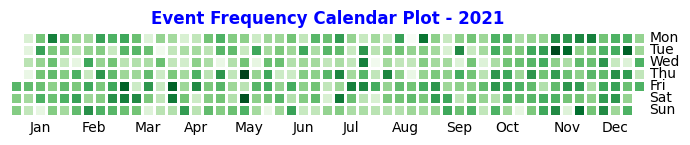

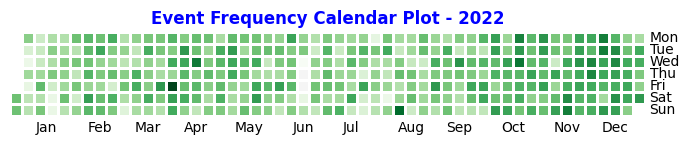

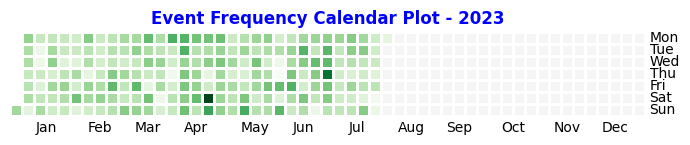

In [ ]:
import calmap
years = preprocessed_df['CallTime'].dt.year.unique()

for year in years:
    # Filter the calltime_series for the current year
    calltime_year = preprocessed_df[preprocessed_df['CallTime'].dt.year == year]['CallTime']

    # Aggregate the number of events by day
    calltime_year_daily = calltime_year.groupby(calltime_year.dt.date).size()

    # Ensure the index is datetime (if it isn't already)
    calltime_year_daily.index = pd.to_datetime(calltime_year_daily.index)

    # Create a calendar plot for the current year
    plt.figure(figsize=(7, 6))
    calmap.yearplot(calltime_year_daily, cmap='Greens')
    plt.title(f'Event Frequency Calendar Plot - {year}', fontweight='bold', color='blue')
    plt.tight_layout()
    plt.show()

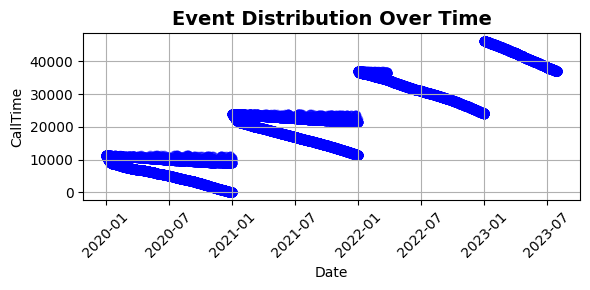

In [ ]:
# Scatter plot showing the distribution of events over time
plt.figure(figsize=(6, 3))
plt.scatter(preprocessed_df['CallTime'], preprocessed_df.index, color='blue', alpha=0.5)
plt.title('Event Distribution Over Time', fontsize=14, fontweight='bold')
plt.xlabel('Date')
plt.ylabel('CallTime')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

<ipython-input-129-a5e1219833ca>:4: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  preprocessed_df.resample('M', on='CallTime').size().plot(color='blue')


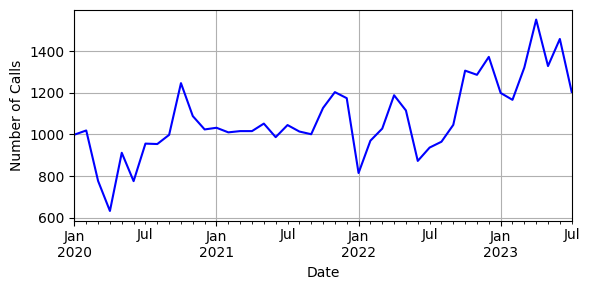

In [ ]:
# monthly frequency plot
plt.figure(figsize=(6, 3))
# Resample the data by month and count the number of calls
preprocessed_df.resample('M', on='CallTime').size().plot(color='blue')

plt.xlabel('Date')
plt.ylabel('Number of Calls')
plt.grid(True)
plt.tight_layout()
plt.show()

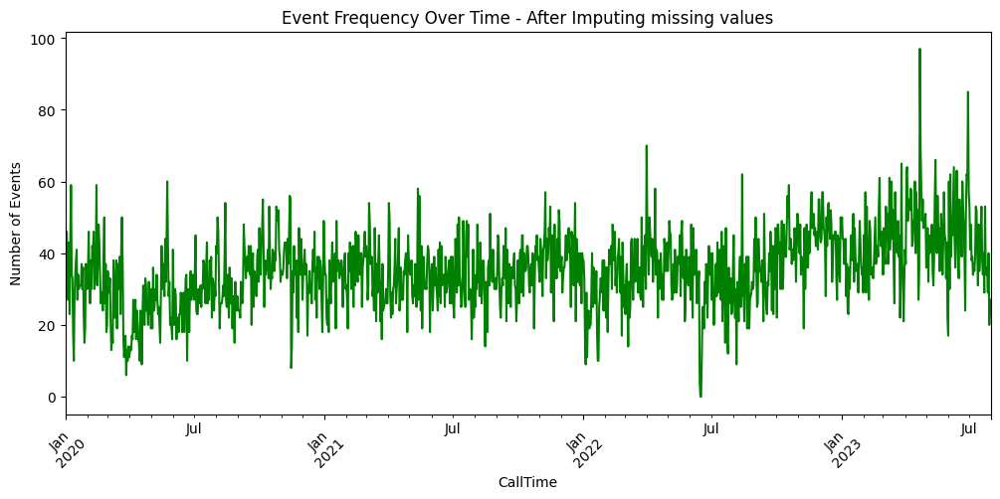

In [ ]:
# time series plot for 'CallTime'
plt.figure(figsize=(12, 5))
preprocessed_df.set_index('CallTime').resample('D').size().plot(kind='line', color='green')
plt.title('Event Frequency Over Time - After Imputing missing values')
plt.xlabel('CallTime')
plt.ylabel('Number of Events')
plt.xticks(rotation=45)
plt.show()

### Hospital Name

#### Overview

In [ ]:
# Check missing values
print("Missing value count:")
print(preprocessed_df[['HospitalName']].isnull().sum())
# Summary statistics before imputation
print("\nSummary statistics for 'HospitalName':")
print(preprocessed_df[['HospitalName']].describe())

Missing value count:
HospitalName    21949
dtype: int64

Summary statistics for 'HospitalName':
       HospitalName
count         24238
unique          161
top             BBH
freq           6953


In [ ]:
# Count of the number of values that has only 1 occurrence
value_counts = preprocessed_df['HospitalName'].value_counts()
print("Single Occurance\t:", (value_counts == 1).sum())
print("Multiple Occurance\t:", (value_counts > 1).sum())

Single Occurance	: 61
Multiple Occurance	: 100


In [ ]:
# top unique values in 'HospitalName' column
print(preprocessed_df['HospitalName'].value_counts()[:-20])

HospitalName
BBH                           6953
DHQ                           6099
PIMS                          1663
RHC,Mandra,Rawalpindi         1655
Wah General Hospital          1231
                              ... 
THQ, Fateh Jang                  1
Hussain Hospital, Rwp            1
Mega Medical Complex, Rwp        1
Medicare, Hospital, Rwp          1
Hamza Camp, Rawalpindi           1
Name: count, Length: 141, dtype: int64


#### Visualization

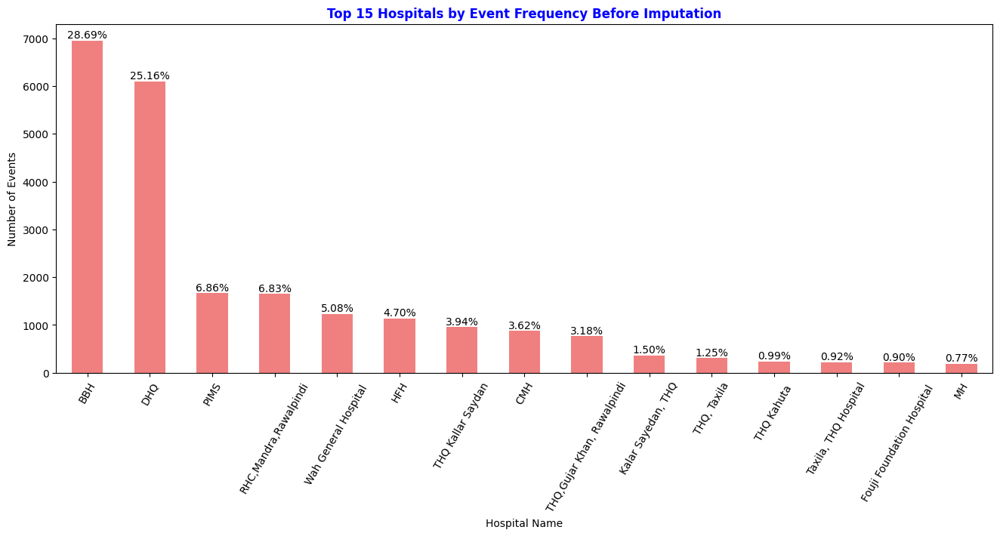

In [ ]:
# Visualize the distribution of HospitalName before imputation
top_hospitals_before = preprocessed_df['HospitalName'].value_counts().nlargest(15)

# Calculate percentages before imputation
total_events_before = preprocessed_df['HospitalName'].notna().sum()  # Total non-missing hospital events
percentages_before = (top_hospitals_before / total_events_before) * 100

# Plot bar chart before imputation
plt.figure(figsize=(16, 6))
bars_before = top_hospitals_before.plot(kind='bar', color='lightcoral')
plt.title('Top 15 Hospitals by Event Frequency Before Imputation', fontweight='bold', color='blue')
plt.xlabel('Hospital Name')
plt.ylabel('Number of Events')
plt.xticks(rotation=60)

# Add percentage annotations on top of each bar using iloc to access the values
for i, bar in enumerate(bars_before.patches):
    height = bar.get_height()
    # Use iloc to access percentages by position
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{percentages_before.iloc[i]:.2f}%',
             ha='center', va='bottom', fontsize=10)

plt.show()

#### Impute missing values of 'HospitalName' using the 'EmergencyArea' column.

In [ ]:
print(preprocessed_df[['HospitalName']].isnull().sum())

HospitalName    21949
dtype: int64


In [ ]:
print(preprocessed_df['EmergencyArea'].nunique())
print(preprocessed_df['HospitalName'].nunique())

80
161


In [ ]:
# Find the most frequent HospitalName for each EmergencyArea
area_hospital_mapping = (
    preprocessed_df.groupby('EmergencyArea')['HospitalName']
    .apply(lambda x: x.mode().iloc[0] if not x.mode().empty else np.nan)
)

In [ ]:
# most frequent HospitalName for that EmergencyArea
area_hospital_mapping

,HospitalName
EmergencyArea,
502 & adyala & workshop & road & rwp,BBH
6th & road & flyover & rwp & murree,BBH
abid & majeed & army & medical & college,DHQ
adda & sawan & rwp & road & near,DHQ
adyala & road & rwp & stop & gulshanabad,BBH
...,...
shifa & eye & trust & al & hospital,BBH
stop & road & rwp & kacha & main,DHQ
taxila & gt & road & near & wah,Wah General Hospital


In [ ]:
# number of entries in mapping where the most frequent HospitalName still couldn't be determined
print("Number of EmergencyArea entries without a mode:", area_hospital_mapping.isna().sum())

Number of EmergencyArea entries without a mode: 0


In [ ]:
# Map the most frequent HospitalName back to the DataFrame
preprocessed_df['HospitalName'] = preprocessed_df.apply(
    lambda row: area_hospital_mapping[row['EmergencyArea']] if pd.isna(row['HospitalName']) else row['HospitalName'],
    axis=1
)

In [ ]:
# current missing value count
print(preprocessed_df[['HospitalName']].isnull().sum())

HospitalName    0
dtype: int64


In [ ]:
# current top unique values in 'HospitalName' column
print(preprocessed_df['HospitalName'].value_counts()[:20])

HospitalName
BBH                            16848
DHQ                            16271
PIMS                            2194
RHC,Mandra,Rawalpindi           2090
Wah General Hospital            1661
HFH                             1282
THQ Kallar Saydan               1031
THQ,Gujar Khan, Rawalpindi       979
CMH                              877
Kalar Sayedan, THQ               363
THQ, Taxila                      304
THQ Kahuta                       282
Taxila, THQ Hospital             223
Fouji Foundation Hospital        218
MH                               187
THQ, Kotli Satian                166
Cantonment General Hospital      146
RHC, Baga Sheikhan, Rwp          123
POF Hospital, Wah Cantt          114
Safari Hospital                   57
Name: count, dtype: int64


#### Visualization after imputation

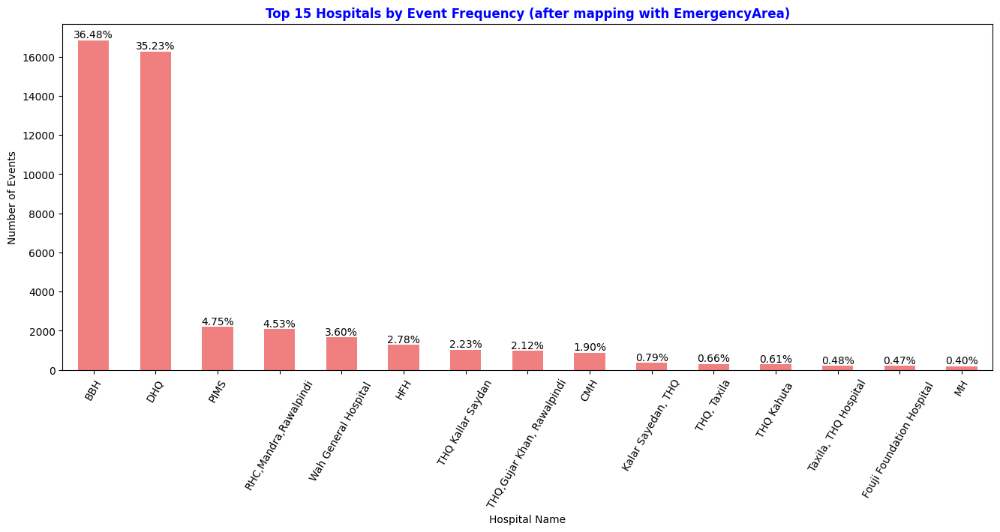

In [ ]:
# Visualize the distribution of HospitalName
top_hospitals_before = preprocessed_df['HospitalName'].value_counts().nlargest(15)

# Calculate percentages
total_events_before = preprocessed_df['HospitalName'].notna().sum()  # Total non-missing hospital events
percentages_before = (top_hospitals_before / total_events_before) * 100

# Plot bar chart
plt.figure(figsize=(16, 6))
bars_before = top_hospitals_before.plot(kind='bar', color='lightcoral')
plt.title('Top 15 Hospitals by Event Frequency (after mapping with EmergencyArea)', fontweight='bold', color='blue')
plt.xlabel('Hospital Name')
plt.ylabel('Number of Events')
plt.xticks(rotation=60)

# Add percentage annotations on top of each bar using iloc to access the values
for i, bar in enumerate(bars_before.patches):
    height = bar.get_height()
    # Use iloc to access percentages by position
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{percentages_before.iloc[i]:.2f}%',
             ha='center', va='bottom', fontsize=10)

plt.show()

#### <font color="red">KNN imputation for rest of the missing values (don't need it anymore, as we could handle it with updated 'EmergencyArea column')

In [ ]:
# print(preprocessed_df[['HospitalName']].isnull().sum())

In [ ]:
# print(preprocessed_df.dtypes)

will proceed for the imputation with the following columns
* EmergencyArea
* responsetime
* InjuryType
* Cause
* PatientStatus

In [ ]:
# columns_to_copy = ['EmergencyArea', 'responsetime', 'InjuryType', 'Cause', 'PatientStatus', 'HospitalName']
# temp_df = preprocessed_df[columns_to_copy].copy()

In [ ]:
# temp_df.head()

In [ ]:
# print(temp_df.isnull().sum())

In [ ]:
# print(temp_df.dtypes)

In [ ]:
# # necessary encoding before knn imputation
# from sklearn.preprocessing import LabelEncoder
# le = LabelEncoder()

# # Label encode the categorical columns to numeric values
# categorical_columns = ['EmergencyArea', 'InjuryType', 'Cause', 'PatientStatus']

# # Encode each categorical column in predictor
# for col in categorical_columns:
#     temp_df[col] = le.fit_transform(temp_df[col].astype(str))

In [ ]:
# # Encode HospitalName column (ignoring the missing cells)

# # Filter non-missing values
# non_null_hospitalnames = temp_df[temp_df['HospitalName'].notna()]['HospitalName']

# # Apply label encoding to non-missing values
# temp_df.loc[temp_df['HospitalName'].notna(), 'HospitalName'] = le.fit_transform(non_null_hospitalnames)

In [ ]:
# print(temp_df.dtypes)

In [ ]:
# print(temp_df[['HospitalName']].isnull().sum())

In [ ]:
# temp_df.head()

In [ ]:
# # necessary scaling
# from sklearn.preprocessing import MinMaxScaler
# scaler = MinMaxScaler()

# # Select only the numeric columns
# numeric_columns = temp_df.select_dtypes(include=['float64']).columns
# temp_df[numeric_columns] = scaler.fit_transform(temp_df[numeric_columns])

# temp_df.head()

In [ ]:
# from sklearn.impute import KNNImputer

# imputer = KNNImputer(n_neighbors=5)

# temp_df = pd.DataFrame(imputer.fit_transform(temp_df), columns=temp_df.columns)

In [ ]:
# print(f"Remaining NaN values in 'HospitalName': {temp_df['HospitalName'].isna().sum()}")

In [ ]:
# # Decode the 'HospitalName' back to original names
# temp_df['HospitalName'] = le.inverse_transform(temp_df['HospitalName'].astype(int))

In [ ]:
# temp_df.head()

In [ ]:
# print(temp_df['HospitalName'].value_counts()[:20])

In [ ]:
# preprocessed_df['HospitalName'] = temp_df['HospitalName']

In [ ]:
# preprocessed_df[preprocessed_df['HospitalName'].isna()]

In [ ]:
# temp_df[temp_df['HospitalName'].isna()]

Wtf man! how come there's still 2 missing values!

In [ ]:
# preprocessed_df['HospitalName'] = preprocessed_df['HospitalName'].fillna(preprocessed_df['HospitalName'].mode()[0])

In [ ]:
# # Visualize the distribution of HospitalName
# top_hospitals_before = preprocessed_df['HospitalName'].value_counts().nlargest(15)

# # Calculate percentages
# total_events_before = preprocessed_df['HospitalName'].notna().sum()  # Total non-missing hospital events
# percentages_before = (top_hospitals_before / total_events_before) * 100

# # Plot bar chart
# plt.figure(figsize=(16, 6))
# bars_before = top_hospitals_before.plot(kind='bar', color='lightcoral')
# plt.title('Top 15 Hospitals by Event Frequency (after imputing all missing values)', fontweight='bold', color='blue')
# plt.xlabel('Hospital Name')
# plt.ylabel('Number of Events')
# plt.xticks(rotation=60)

# # Add percentage annotations on top of each bar using iloc to access the values
# for i, bar in enumerate(bars_before.patches):
#     height = bar.get_height()
#     # Use iloc to access percentages by position
#     plt.text(bar.get_x() + bar.get_width() / 2, height, f'{percentages_before.iloc[i]:.2f}%',
#              ha='center', va='bottom', fontsize=10)

# plt.show()

# Final condition after preprocessing & EDA

In [ ]:
# Total columns and rows dropped
print("columns dropped:", df.shape[1]-preprocessed_df.shape[1])
print("rows dropped   :", df.shape[0]-preprocessed_df.shape[0])

columns dropped: 1
rows dropped   : 2


In [ ]:
# Current Column and Row Count
print("columns:", preprocessed_df.shape[1])
print("rows   :", preprocessed_df.shape[0])

columns: 24
rows   : 46187


In [ ]:
# Current missing values count
print(preprocessed_df.isnull().sum())

EcYear                      0
CallTime                    0
EmergencyArea               0
TotalPatientsInEmergency    0
Gender                      0
Age                         0
HospitalName                0
Reason                      0
responsetime                0
EducationTitle              0
InjuryType                  0
Cause                       0
PatientStatus               0
BicycleInvovled             0
BikesInvolved               0
BusesInvolved               0
CarsInvolved                0
CartInvovled                0
RickshawsInvolved           0
TractorInvovled             0
TrainsInvovled              0
TrucksInvolved              0
VansInvolved                0
OthersInvolved              0
dtype: int64


In [ ]:
# # store the current dataframe
# file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/preprocessed_df.csv'
# # Save the DataFrame to the file
# preprocessed_df.to_csv(file_path, index=False)
# print("file saved")

# Data Encoding

In [ ]:
# # Load preprocessed_df
# file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/preprocessed_df.csv'
# preprocessed_df = pd.read_csv(file_path)
# preprocessed_df.head()

## Initial Status

In [ ]:
print(preprocessed_df.nunique())

EcYear                          4
CallTime                    40168
EmergencyArea                  80
TotalPatientsInEmergency       12
Gender                          3
Age                            75
HospitalName                  161
Reason                         30
responsetime                   18
EducationTitle                  8
InjuryType                      5
Cause                           7
PatientStatus                   3
BicycleInvovled                 3
BikesInvolved                   5
BusesInvolved                   3
CarsInvolved                    6
CartInvovled                    2
RickshawsInvolved               3
TractorInvovled                 2
TrainsInvovled                  2
TrucksInvolved                  4
VansInvolved                    5
OthersInvolved                  3
dtype: int64


In [ ]:
print(preprocessed_df.dtypes)

EcYear                              object
CallTime                    datetime64[ns]
EmergencyArea                       object
TotalPatientsInEmergency            object
Gender                              object
Age                                float64
HospitalName                        object
Reason                              object
responsetime                       float64
EducationTitle                      object
InjuryType                          object
Cause                               object
PatientStatus                       object
BicycleInvovled                    float64
BikesInvolved                      float64
BusesInvolved                      float64
CarsInvolved                       float64
CartInvovled                       float64
RickshawsInvolved                  float64
TractorInvovled                    float64
TrainsInvovled                     float64
TrucksInvolved                     float64
VansInvolved                       float64
OthersInvol

In [ ]:
# Unique values in each column
for col in preprocessed_df:
    print(col,": ", preprocessed_df[col].unique(),"\n")

EcYear :  [2020 2021 2022 2023] 

CallTime :  <DatetimeArray>
['2020-12-31 22:41:47', '2020-12-31 22:25:00', '2020-12-31 21:54:59',
 '2020-12-31 21:24:22', '2020-12-31 21:03:49', '2020-12-31 20:54:02',
 '2020-12-31 20:04:50', '2020-12-31 18:46:19', '2020-12-31 18:20:37',
 '2020-12-31 17:38:21',
 ...
 '2023-01-01 09:56:00', '2023-01-01 09:46:00', '2023-01-01 09:38:00',
 '2023-01-01 09:26:00', '2023-01-01 09:21:00', '2023-01-01 06:53:00',
 '2023-01-01 04:23:00', '2023-01-01 02:16:00', '2023-01-01 02:02:00',
 '2023-01-01 01:00:00']
Length: 40168, dtype: datetime64[ns] 

EmergencyArea :  ['rwp & road & near & infront & gt' 'dha & gate & phase & gt & rwp'
 'chowk & rwp & main & road & near'
 'gulzar & quaid & airport & qaid & rwp'
 'chour & chowk & peshawar & rwp & road'
 'hotel & tipu & road & rwp & near'
 'faizabad & murree & road & rwp & shamsabad'
 'kamran & chowk & market & rawalpindi & saddar'
 'check & post & army & near & rwp'
 'chandni & chowk & flyover & murree & rwp'
 'rawal & ro

## notes

**Decided Encoding methods** <br>

one-hot - gender, cause  <br>
label - educationtitle, injurytype, PatientStatus<br>
frequency - EmergencyArea, Reason,<br>

to int - EcYear, TotalPatientsInEmergency<br>
                                        
\
EcYear                       object - changed to int<br>
EmergencyArea                object - frequency<br>
TotalPatientsInEmergency     object - changed to int<br>
Gender                       object - one-hot<br>
Reason                       object - frequency<br>
EducationTitle               object - label<br>
InjuryType                   object - label<br>
Cause                        object - one hot<br>
PatientStatus                object - label<br>

## Ordinal Encoding


*   EducationTitle, PatientStatus, InjuryType
*   These columns have ordinal values
*   So, Ordinal Encoding is the best option

In [ ]:
from sklearn.preprocessing import OrdinalEncoder

In [ ]:
education_order = [['Illetrate', 'Primary', 'Middle', 'Matric', 'Intermediate', 'Graduation', 'Masters', 'PHD']]

oe_education = OrdinalEncoder(categories = education_order)
oe_education.fit(preprocessed_df[['EducationTitle']])
preprocessed_df['EducationTitle'] = oe_education.transform(preprocessed_df[['EducationTitle']])

In [ ]:
patient_status_order = [['Alive & stable', 'Alive & unstable', 'Dead']]

oe_patient = OrdinalEncoder(categories = patient_status_order)
oe_patient.fit(preprocessed_df[['PatientStatus']])
preprocessed_df['PatientStatus'] = oe_patient.transform(preprocessed_df[['PatientStatus']])

In [ ]:
injury_type_order = [['Minor', 'Single Fracture', 'Multiple Fractures', 'Head Injury', 'Spinal Injury']]

oe_injuryType = OrdinalEncoder(categories = injury_type_order)
oe_injuryType.fit(preprocessed_df[['InjuryType']])
preprocessed_df['InjuryType'] = oe_injuryType.transform(preprocessed_df[['InjuryType']])

## One-Hot Encoding


*   Gender, Cause doesn't contain ordinal values. and

*   only contains few unique values
So, Using One-Hot Encoding for these columns

In [ ]:
print(preprocessed_df['Cause'].nunique())

7


In [ ]:
preprocessed_df = pd.get_dummies(preprocessed_df, columns=['Gender', 'Cause', 'EcYear'], prefix=['Gender', 'Cause', 'EcYear'])

## Frequency Encoding


In [ ]:
print(preprocessed_df['EmergencyArea'].nunique())
print(preprocessed_df['Reason'].nunique())
print(preprocessed_df['HospitalName'].nunique())

80
30
161


In [ ]:
# EmergencyArea, Reason, HospitalName has high cardinality. 37518, 23900 and  161 unique values respectively
# So, Frequency Encoding is the best option for these columns

emergency_area_freq = preprocessed_df['EmergencyArea'].value_counts(normalize=True)
preprocessed_df['EmergencyArea_Encoded'] = preprocessed_df['EmergencyArea'].map(emergency_area_freq)

reason_freq = preprocessed_df['Reason'].value_counts(normalize=True)
preprocessed_df['Reason_Encoded'] = preprocessed_df['Reason'].map(reason_freq)

HospitalName_freq = preprocessed_df['HospitalName'].value_counts(normalize=True)
preprocessed_df['HospitalName_Encoded'] = preprocessed_df['HospitalName'].map(HospitalName_freq)

# Dropping redundant columns
preprocessed_df.drop(['EmergencyArea', 'Reason', 'HospitalName'], axis=1, inplace=True)

## Change Datatype from object to int

In [ ]:
# print(preprocessed_df['EcYear'].dtypes)
# print(preprocessed_df['EcYear'].unique())

In [ ]:
# # 'EcYear' has numeric values [2020 2021 2022 2023] , but it's given as object datatype
# # Converting the datatype to numeric
# preprocessed_df['EcYear'] = pd.to_numeric(preprocessed_df['EcYear'])

# print(preprocessed_df['EcYear'].dtype)

In [ ]:
print(preprocessed_df['TotalPatientsInEmergency'].dtypes)
print(preprocessed_df['TotalPatientsInEmergency'].unique())

object
[1 2 3 4 8 6 5 10 7 11 9 15]


In [ ]:
# 'TotalPatientsInEmergency' has numeric values [1 2 3 4 8 6 5 10 7 11 9 15], but it's given as object datatype
# Converting the datatype to numeric
preprocessed_df['TotalPatientsInEmergency'] = pd.to_numeric(preprocessed_df['TotalPatientsInEmergency'])

print(preprocessed_df['TotalPatientsInEmergency'].dtype)
print(preprocessed_df['TotalPatientsInEmergency'].unique())

int64
[ 1  2  3  4  8  6  5 10  7 11  9 15]


## Change Datatype from Boolean to Int

In [ ]:
boolean_columns = ['Gender_Female', 'Gender_Male', 'Gender_Other', 'Cause_Carelessness', 'Cause_One Wheeling', 'Cause_Others', 'Cause_Over Speed', 'Cause_Tyre Burst', 'Cause_U Turn', 'Cause_Wrong Turn', 'EcYear_2020', 'EcYear_2021', 'EcYear_2022', 'EcYear_2023']
preprocessed_df[boolean_columns] = preprocessed_df[boolean_columns].astype(int)
print(preprocessed_df[boolean_columns].dtypes)

Gender_Female         int64
Gender_Male           int64
Gender_Other          int64
Cause_Carelessness    int64
Cause_One Wheeling    int64
Cause_Others          int64
Cause_Over Speed      int64
Cause_Tyre Burst      int64
Cause_U Turn          int64
Cause_Wrong Turn      int64
EcYear_2020           int64
EcYear_2021           int64
EcYear_2022           int64
EcYear_2023           int64
dtype: object


## Datetime extraction

we can extract relevant features from the CallTime column for more meaningful input

In [ ]:
print(preprocessed_df['CallTime'])

0       2020-12-31 22:41:47
1       2020-12-31 22:25:00
2       2020-12-31 21:54:59
3       2020-12-31 21:24:22
4       2020-12-31 21:03:49
                ...        
46184   2023-01-01 06:53:00
46185   2023-01-01 04:23:00
46186   2023-01-01 02:16:00
46187   2023-01-01 02:02:00
46188   2023-01-01 01:00:00
Name: CallTime, Length: 46187, dtype: datetime64[ns]


In [ ]:
preprocessed_df['CallTime'].dtype

dtype('<M8[ns]')

In [ ]:
# Convert 'CallTime' to datetime format
preprocessed_df['CallTime'] = pd.to_datetime(preprocessed_df['CallTime'])

# preprocessed_df['CallTime_Year'] = preprocessed_df['CallTime'].dt.year
preprocessed_df['CallTime_Month'] = preprocessed_df['CallTime'].dt.month
preprocessed_df['CallTime_Day'] = preprocessed_df['CallTime'].dt.day
preprocessed_df['CallTime_Hour'] = preprocessed_df['CallTime'].dt.hour

In [ ]:
# # So i don't need the EcYear column
# preprocessed_df.drop(['CallTime_Year'], axis=1, inplace=True)

Date-based Features

In [ ]:
# Create a new column to check if it's a weekend
preprocessed_df['IsWeekend'] = preprocessed_df['CallTime'].dt.weekday.isin([5, 6])  # 5=Saturday, 6=Sunday
preprocessed_df['IsWeekend'] = preprocessed_df['IsWeekend'].astype(int) # 0=weekday, 1=weekend

## datetime to unix

Unix timestamps. This format represents the number of seconds since January 1, 1970 (the epoch), and is easily interpretable by models.

In [ ]:
preprocessed_df['CallTime'] = pd.to_datetime(preprocessed_df['CallTime']).astype(np.int64) // 10**9
print(preprocessed_df['CallTime'].dtype)

int64


## Final Status

In [ ]:
print(preprocessed_df.dtypes)

CallTime                      int64
TotalPatientsInEmergency      int64
Age                         float64
responsetime                float64
EducationTitle              float64
InjuryType                  float64
PatientStatus               float64
BicycleInvovled             float64
BikesInvolved               float64
BusesInvolved               float64
CarsInvolved                float64
CartInvovled                float64
RickshawsInvolved           float64
TractorInvovled             float64
TrainsInvovled              float64
TrucksInvolved              float64
VansInvolved                float64
OthersInvolved              float64
Gender_Female                 int64
Gender_Male                   int64
Gender_Other                  int64
Cause_Carelessness            int64
Cause_One Wheeling            int64
Cause_Others                  int64
Cause_Over Speed              int64
Cause_Tyre Burst              int64
Cause_U Turn                  int64
Cause_Wrong Turn            

In [ ]:
# Unique values in each column
for col in preprocessed_df:
  print(col,": ", preprocessed_df[col].unique(),"\n")

CallTime :  [1609454507 1609453500 1609451699 ... 1672539360 1672538520 1672534800] 

TotalPatientsInEmergency :  [ 1  2  3  4  8  6  5 10  7 11  9 15] 

Age :  [27.  20.  48.  45.  22.  50.  18.  25.  19.  36.  15.  51.  26.  16.
 62.  65.  42.  35.  73.5 24.  40.  56.  23.  52.  60.  53.  39.  31.
 38.  46.  33.  29.  28.  32.  17.  21.  10.  47.  55.   2.  30.  54.
 70.  37.  14.  34.   4.   9.  69.  43.  68.  63.  49.  41.  71.  12.
  5.  67.  61.  57.  59.  73.   6.   8.  11.  58.  44.   7.  64.  13.
  3.  66.  72.   1.   0. ] 

responsetime :  [10.   12.    5.    6.    4.    3.    1.    2.    7.    8.   14.    9.
 15.5  13.   15.   11.    6.1   3.92] 

EducationTitle :  [4. 0. 3. 1. 5. 6. 2. 7.] 

InjuryType :  [0. 1. 3. 2. 4.] 

PatientStatus :  [1. 0. 2.] 

BicycleInvovled :  [0. 1. 2.] 

BikesInvolved :  [ 1.  0.  2.  3. 10.] 

BusesInvolved :  [0. 1. 2.] 

CarsInvolved :  [0. 1. 2. 3. 4. 5.] 

CartInvovled :  [0. 1.] 

RickshawsInvolved :  [0. 1. 2.] 

TractorInvovled :  [0. 

In [ ]:
preprocessed_df.head()

,CallTime,TotalPatientsInEmergency,Age,responsetime,EducationTitle,InjuryType,PatientStatus,BicycleInvovled,BikesInvolved,BusesInvolved,...,EcYear_2021,EcYear_2022,EcYear_2023,EmergencyArea_Encoded,Reason_Encoded,HospitalName_Encoded,CallTime_Month,CallTime_Day,CallTime_Hour,IsWeekend
0,1609454507,1,27.0,10.0,4.0,0.0,1.0,0.0,1.0,0.0,...,0,0,0,0.130794,0.051898,0.364778,12,31,22,0
1,1609453500,1,20.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0.013077,0.091173,0.047503,12,31,22,0
2,1609451699,1,48.0,10.0,0.0,1.0,1.0,0.0,0.0,0.0,...,0,0,0,0.051097,0.038777,0.364778,12,31,21,0
3,1609449862,1,45.0,5.0,3.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0.006149,0.091173,0.364778,12,31,21,0
4,1609448629,1,22.0,5.0,3.0,1.0,0.0,0.0,2.0,0.0,...,0,0,0,0.051097,0.103189,0.364778,12,31,21,0


In [ ]:
# # store the current dataframe
# file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/encoded_df.csv'
# # Save the DataFrame to the file
# preprocessed_df.to_csv(file_path, index=False)
# print("file saved")

# Check for Standardization

In [ ]:
from scipy import stats

# Function to check Gaussian distribution
def check_gaussian_distribution(column_name):
    # Check if the column exists in the DataFrame
    if column_name not in preprocessed_df.columns:
        print(f"Column '{column_name}' not found in the DataFrame.")
        return

    # Check data type of the column
    if preprocessed_df[column_name].dtype in [np.int64, np.float64]: # Check for numerical data type
        # Plot histogram and Q-Q plot
        plt.figure(figsize=(8, 3))

        # Histogram
        plt.subplot(1, 2, 1)
        sns.histplot(preprocessed_df[column_name], bins=30, kde=True, color='skyblue', stat="density")
        plt.title(f'Histogram of {column_name}')
        plt.xlabel(column_name)
        plt.ylabel('Density')
        plt.grid(True)

        # Q-Q Plot
        plt.subplot(1, 2, 2)
        stats.probplot(preprocessed_df[column_name], dist="norm", plot=plt)
        plt.title(f'Q-Q Plot of {column_name}')
        plt.grid(True)

        plt.tight_layout()
        plt.show()

        # Shapiro-Wilk Test
        if len(preprocessed_df[column_name]) > 5000:
            print("Sample size > 5000. Shapiro-Wilk may not be reliable; consider using other tests.")

        stat, p_value = stats.shapiro(preprocessed_df[column_name])
        print(f'Shapiro-Wilk Test for {column_name}: Statistic={stat}, p-value={p_value}')

        # Interpret result
        alpha = 0.05

        if p_value > alpha:
            print(f'The distribution of {column_name} appears to be Gaussian (fail to reject H0)')
        else:
            print(f'The distribution of {column_name} does not appear to be Gaussian (reject H0)')

    elif preprocessed_df[column_name].dtype == 'object':
        # Handle non-numeric data type
        print(f"Column '{column_name}' has object datatype. Gaussian distribution check is not applicable.")

        # Perform analysis suitable for categorical data
        # Example: Value counts or bar plot
        value_counts = preprocessed_df[column_name].value_counts()
        print(value_counts)

        plt.figure(figsize=(8, 3))
        sns.countplot(x=column_name, data=preprocessed_df, palette="viridis")
        plt.title(f'Distribution of {column_name}')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

    else:
        print(f"Column '{column_name}' is neither numerical nor categorical. Analysis is not applicable.")

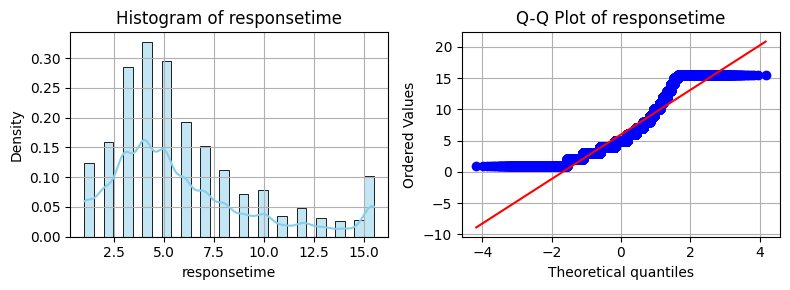

Sample size > 5000. Shapiro-Wilk may not be reliable; consider using other tests.
Shapiro-Wilk Test for responsetime: Statistic=0.8868007070368282, p-value=2.68536138506887e-98
The distribution of responsetime does not appear to be Gaussian (reject H0)


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 46187.
  res = hypotest_fun_out(*samples, **kwds)


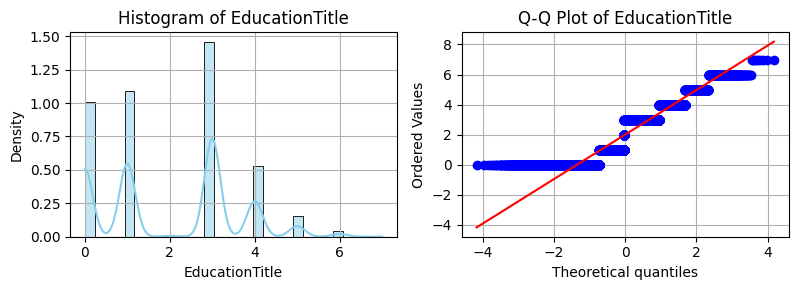

Sample size > 5000. Shapiro-Wilk may not be reliable; consider using other tests.
Shapiro-Wilk Test for EducationTitle: Statistic=0.8733446902808983, p-value=3.65756773530611e-101
The distribution of EducationTitle does not appear to be Gaussian (reject H0)


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 46187.
  res = hypotest_fun_out(*samples, **kwds)


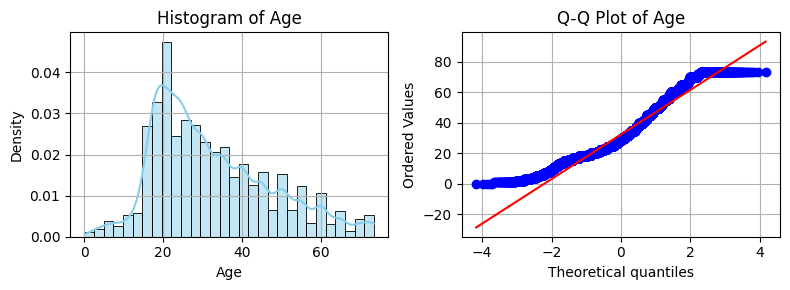

Sample size > 5000. Shapiro-Wilk may not be reliable; consider using other tests.
Shapiro-Wilk Test for Age: Statistic=0.9460900645707714, p-value=2.0129106321838857e-80
The distribution of Age does not appear to be Gaussian (reject H0)


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 46187.
  res = hypotest_fun_out(*samples, **kwds)


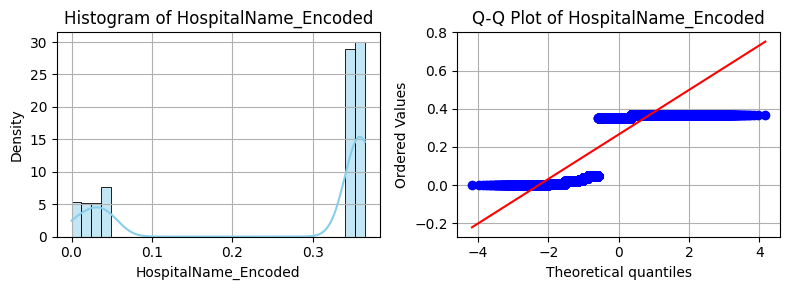

Sample size > 5000. Shapiro-Wilk may not be reliable; consider using other tests.
Shapiro-Wilk Test for HospitalName_Encoded: Statistic=0.6100688629808461, p-value=3.6280166626177216e-132
The distribution of HospitalName_Encoded does not appear to be Gaussian (reject H0)


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 46187.
  res = hypotest_fun_out(*samples, **kwds)


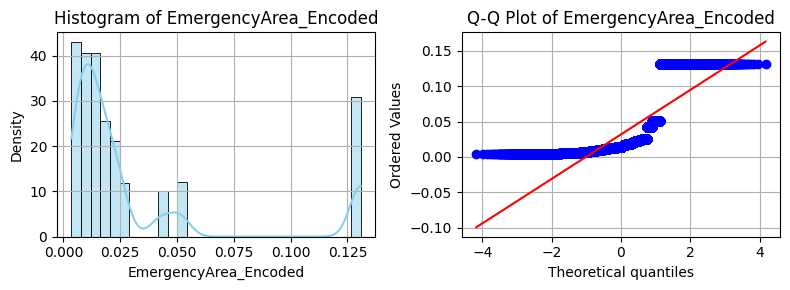

Sample size > 5000. Shapiro-Wilk may not be reliable; consider using other tests.
Shapiro-Wilk Test for EmergencyArea_Encoded: Statistic=0.6150096417472524, p-value=8.606406102976247e-132
The distribution of EmergencyArea_Encoded does not appear to be Gaussian (reject H0)


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 46187.
  res = hypotest_fun_out(*samples, **kwds)


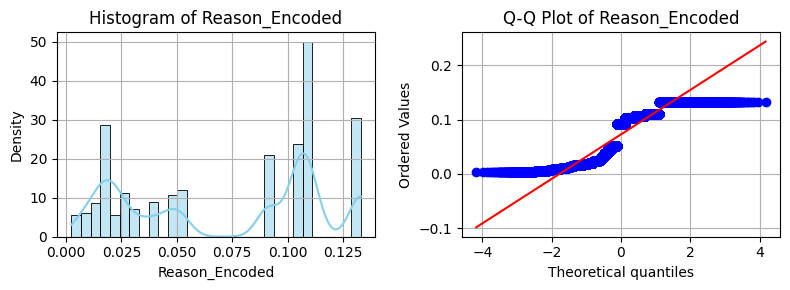

Sample size > 5000. Shapiro-Wilk may not be reliable; consider using other tests.
Shapiro-Wilk Test for Reason_Encoded: Statistic=0.8640637685548233, p-value=5.462061899795482e-103
The distribution of Reason_Encoded does not appear to be Gaussian (reject H0)


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 46187.
  res = hypotest_fun_out(*samples, **kwds)


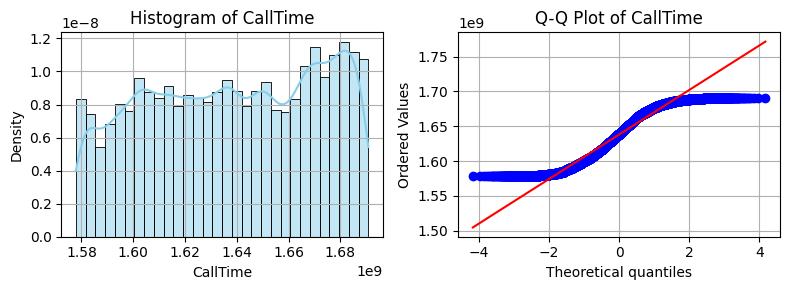

Sample size > 5000. Shapiro-Wilk may not be reliable; consider using other tests.
Shapiro-Wilk Test for CallTime: Statistic=0.9505795282867979, p-value=1.9019261363590347e-78
The distribution of CallTime does not appear to be Gaussian (reject H0)


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 46187.
  res = hypotest_fun_out(*samples, **kwds)


In [ ]:
# Check for Responsetime
check_gaussian_distribution('responsetime')

# Check for EducationTitle
check_gaussian_distribution('EducationTitle')

# Check for Age
check_gaussian_distribution('Age')

# Check for HospitalName_Encoded
check_gaussian_distribution('HospitalName_Encoded')

# Check for EmergencyArea_Encoded
check_gaussian_distribution('EmergencyArea_Encoded')

# Check for Reason_Encoded
check_gaussian_distribution('Reason_Encoded')

# Check for CallTime
check_gaussian_distribution('CallTime')

# Scaling

In [ ]:
# # Load encoded_df
# file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/new_encoded_df.csv'
# preprocessed_df = pd.read_csv(file_path)
# preprocessed_df.head()

,CallTime,TotalPatientsInEmergency,Age,responsetime,EducationTitle,InjuryType,PatientStatus,BicycleInvovled,BikesInvolved,BusesInvolved,...,EcYear_2021,EcYear_2022,EcYear_2023,EmergencyArea_Encoded,Reason_Encoded,HospitalName_Encoded,CallTime_Month,CallTime_Day,CallTime_Hour,IsWeekend
0,1609454507,1,27.0,10.0,4.0,0.0,1.0,0.0,1.0,0.0,...,0,0,0,0.162686,0.054214,0.353628,12,31,22,0
1,1609453500,1,20.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0.013597,0.073246,0.047546,12,31,22,0
2,1609451699,1,48.0,10.0,0.0,1.0,1.0,0.0,0.0,0.0,...,0,0,0,0.054951,0.037521,0.353628,12,31,21,0
3,1609449862,1,45.0,5.0,3.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0.011497,0.073246,0.353628,12,31,21,0
4,1609448629,1,22.0,5.0,3.0,1.0,0.0,0.0,2.0,0.0,...,0,0,0,0.054951,0.066685,0.353628,12,31,21,0


In [ ]:
print(preprocessed_df.columns)

Index(['CallTime', 'TotalPatientsInEmergency', 'Age', 'responsetime',
       'EducationTitle', 'InjuryType', 'PatientStatus', 'BicycleInvovled',
       'BikesInvolved', 'BusesInvolved', 'CarsInvolved', 'CartInvovled',
       'RickshawsInvolved', 'TractorInvovled', 'TrainsInvovled',
       'TrucksInvolved', 'VansInvolved', 'OthersInvolved', 'Gender_Female',
       'Gender_Male', 'Gender_Other', 'Cause_Carelessness',
       'Cause_One Wheeling', 'Cause_Others', 'Cause_Over Speed',
       'Cause_Tyre Burst', 'Cause_U Turn', 'Cause_Wrong Turn', 'EcYear_2020',
       'EcYear_2021', 'EcYear_2022', 'EcYear_2023', 'EmergencyArea_Encoded',
       'Reason_Encoded', 'HospitalName_Encoded', 'CallTime_Month',
       'CallTime_Day', 'CallTime_Hour', 'IsWeekend'],
      dtype='object')


In [ ]:
preprocessed_df.describe()

,CallTime,TotalPatientsInEmergency,Age,responsetime,EducationTitle,InjuryType,PatientStatus,BicycleInvovled,BikesInvolved,BusesInvolved,...,EcYear_2021,EcYear_2022,EcYear_2023,EmergencyArea_Encoded,Reason_Encoded,HospitalName_Encoded,CallTime_Month,CallTime_Day,CallTime_Hour,IsWeekend
count,4.618700e+04,46187.000000,46187.000000,46187.000000,46187.000000,46187.000000,46187.000000,46187.000000,46187.000000,46187.000000,...,46187.000000,46187.000000,46187.000000,46187.000000,46187.000000,46187.000000,46187.000000,46187.000000,46187.000000,46187.000000
mean,1.638084e+09,1.339619,32.394267,5.978587,2.010804,0.440081,0.540455,0.008725,0.967242,0.009202,...,0.274471,0.279321,0.199775,0.031763,0.072515,0.265093,6.231017,15.634659,13.615433,0.281984
std,3.283380e+07,0.896699,15.010219,3.782231,1.584194,0.913328,0.523247,0.093467,0.578776,0.100349,...,0.446252,0.448670,0.399835,0.040064,0.044129,0.149271,3.433947,8.750014,5.430422,0.449971
min,1.577841e+09,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.003486,0.002382,0.000022,1.000000,1.000000,0.000000,0.000000
25%,1.609946e+09,1.000000,21.000000,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.009115,0.024249,0.047503,3.000000,8.000000,10.000000,0.000000
50%,1.638824e+09,1.000000,29.000000,5.000000,3.000000,0.000000,1.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.014095,0.091173,0.352285,6.000000,16.000000,14.000000,0.000000
75%,1.668015e+09,1.000000,42.000000,8.000000,3.000000,0.000000,1.000000,0.000000,1.000000,0.000000,...,1.000000,1.000000,0.000000,0.025072,0.107216,0.364778,9.000000,23.000000,18.000000,1.000000
max,1.690823e+09,15.000000,73.500000,15.500000,7.000000,4.000000,2.000000,2.000000,10.000000,2.000000,...,1.000000,1.000000,1.000000,0.130794,0.132981,0.364778,12.000000,31.000000,23.000000,1.000000


### Method Selection


Categorical Columns
*   Gender_Female, Gender_Male, Gender_Other: These are already binary (0 or 1), so no scaling is needed.
*   Cause_Carelessness, Cause_One Wheeling, Cause_Others, Cause_Over Speed, Cause_Tyre Burst, Cause_U Turn, Cause_Wrong Turn: These are binary columns (0 or 1), so no scaling is needed.
*   InjuryType and PatientStatus: These are categorical target variables, and since they are encoded as numbers, no scaling is needed for them.
*   IsWeekend: A binary feature (0 or 1), so no scaling is needed.

Ordinal Columns
*   Age, responsetime, TotalPatientsInEmergency: Continuous variable, should be scaled.
*   EducationTitle: Ordinal variable (0 to 7), you can scale it or leave it as-is. but it would not be good to scale as the numbers are not treated as continuous, they are discrete
*   TotalPatientsInEmergency: Continuous variable, should be scaled.
*   BicycleInvovled, BikesInvolved, BusesInvolved, CarsInvolved, etc.: These are binary values. no scaling needed
*   EmergencyArea_Encoded, HospitalName_Encoded, Reason_Encoded: These are numerical features after encoding, but they might have a wide range of values, so it is better to scale them as well.

Time Based Features
*   CallTime_Hour: It's better to use a cyclical transformation (sin/cos) because the hours represent cyclic data (e.g., 23 is close to 0, not far).
*   CallTime_Year, CallTime_Month, CallTime_Day: Min-Max scaling works well for them.

In [ ]:
preprocessed_df.columns

Index(['CallTime', 'TotalPatientsInEmergency', 'Age', 'responsetime',
       'EducationTitle', 'InjuryType', 'PatientStatus', 'BicycleInvovled',
       'BikesInvolved', 'BusesInvolved', 'CarsInvolved', 'CartInvovled',
       'RickshawsInvolved', 'TractorInvovled', 'TrainsInvovled',
       'TrucksInvolved', 'VansInvolved', 'OthersInvolved', 'Gender_Female',
       'Gender_Male', 'Gender_Other', 'Cause_Carelessness',
       'Cause_One Wheeling', 'Cause_Others', 'Cause_Over Speed',
       'Cause_Tyre Burst', 'Cause_U Turn', 'Cause_Wrong Turn', 'EcYear_2020',
       'EcYear_2021', 'EcYear_2022', 'EcYear_2023', 'EmergencyArea_Encoded',
       'Reason_Encoded', 'HospitalName_Encoded', 'CallTime_Month',
       'CallTime_Day', 'CallTime_Hour', 'IsWeekend'],
      dtype='object')

In [ ]:
# Unique values in each column
for col in preprocessed_df:
  print(col,": ", preprocessed_df[col].unique(),"\n")

CallTime :  [1609454507 1609453500 1609451699 ... 1672539360 1672538520 1672534800] 

TotalPatientsInEmergency :  [ 1  2  3  4  8  6  5 10  7 11  9 15] 

Age :  [27.  20.  48.  45.  22.  50.  18.  25.  19.  36.  15.  51.  26.  16.
 62.  65.  42.  35.  73.5 24.  40.  56.  23.  52.  60.  53.  39.  31.
 38.  46.  33.  29.  28.  32.  17.  21.  10.  47.  55.   2.  30.  54.
 70.  37.  14.  34.   4.   9.  69.  43.  68.  63.  49.  41.  71.  12.
  5.  67.  61.  57.  59.  73.   6.   8.  11.  58.  44.   7.  64.  13.
  3.  66.  72.   1.   0. ] 

responsetime :  [10.   12.    5.    6.    4.    3.    1.    2.    7.    8.   14.    9.
 15.5  13.   15.   11.    6.1   3.92] 

EducationTitle :  [4. 0. 3. 1. 5. 6. 2. 7.] 

InjuryType :  [0. 1. 3. 2. 4.] 

PatientStatus :  [1. 0. 2.] 

BicycleInvovled :  [0. 1. 2.] 

BikesInvolved :  [ 1.  0.  2.  3. 10.] 

BusesInvolved :  [0. 1. 2.] 

CarsInvolved :  [0. 1. 2. 3. 4. 5.] 

CartInvovled :  [0. 1.] 

RickshawsInvolved :  [0. 1. 2.] 

TractorInvovled :  [0. 


```
standard_scaling = ['Age', 'responsetime', 'TotalPatientsInEmergency']

min_max_scaling = ['CallTime', 'EmergencyArea_Encoded', 'Reason_Encoded', 'HospitalName_Encoded', 'CallTime_Day']

sin_cos_transformation = ['CallTime_Hour', 'CallTime_Month']

no_scaling = ['EcYear', 'Gender_Female', 'Gender_Male', 'Gender_Other', 'Cause_Carelessness', 'Cause_One Wheeling', 'Cause_Others', 'Cause_Over Speed', 'Cause_Tyre Burst', 'Cause_U Turn', 'Cause_Wrong Turn', 'BicycleInvovled', 'BikesInvolved', 'BusesInvolved', 'CarsInvolved', 'CartInvovled', 'RickshawsInvolved', 'TractorInvovled', 'TrainsInvovled', 'TrucksInvolved', 'VansInvolved', 'OthersInvolved','EcYear_2020', 'EcYear_2021', 'EcYear_2022', 'EcYear_2023', 'IsWeekend', 'EducationTitle', 'InjuryType', 'PatientStatus']
```



In [ ]:
# standard_scaling = ['Age', 'responsetime', 'TotalPatientsInEmergency']

# min_max_scaling = ['CallTime', 'EmergencyArea_Encoded', 'Reason_Encoded', 'HospitalName_Encoded', 'CallTime_Day']

# sin_cos_transformation = ['CallTime_Hour', 'CallTime_Month']

# no_scaling = ['EcYear', 'Gender_Female', 'Gender_Male', 'Gender_Other', 'Cause_Carelessness', 'Cause_One Wheeling', 'Cause_Others', 'Cause_Over Speed', 'Cause_Tyre Burst', 'Cause_U Turn', 'Cause_Wrong Turn', 'BicycleInvovled', 'BikesInvolved', 'BusesInvolved', 'CarsInvolved', 'CartInvovled', 'RickshawsInvolved', 'TractorInvovled', 'TrainsInvovled', 'TrucksInvolved', 'VansInvolved', 'OthersInvolved','EcYear_2020', 'EcYear_2021', 'EcYear_2022', 'EcYear_2023', 'IsWeekend', 'EducationTitle', 'InjuryType', 'PatientStatus']

### Standard Scaling

In [ ]:
# Create a copy of the preprocessed DataFrame for scaling
scaled_df = preprocessed_df.copy()

In [ ]:
from sklearn.preprocessing import StandardScaler
standard_scaler = StandardScaler()

In [ ]:
standard_scaling = ['Age', 'responsetime', 'TotalPatientsInEmergency']

scaled_df[standard_scaling] = standard_scaler.fit_transform(scaled_df[standard_scaling])

### MinMax Scaling

In [ ]:
from sklearn.preprocessing import MinMaxScaler
min_max_scaler = MinMaxScaler()

In [ ]:
min_max_scaling = ['CallTime', 'EmergencyArea_Encoded', 'Reason_Encoded', 'HospitalName_Encoded', 'CallTime_Day']

scaled_df[min_max_scaling] = min_max_scaler.fit_transform(scaled_df[min_max_scaling])

### Sin-Cos Transformation

In [ ]:
# sin_cos_transformation = ['CallTime_Hour', 'CallTime_Month']
# Apply Sin-Cos Transformation for cyclic features (CallTime_Hour and CallTime_Month)

scaled_df['CallTime_Hour_sin'] = np.sin(scaled_df['CallTime_Hour'] * (2 * np.pi / 24))
scaled_df['CallTime_Hour_cos'] = np.cos(scaled_df['CallTime_Hour'] * (2 * np.pi / 24))

scaled_df['CallTime_Month_sin'] = np.sin(scaled_df['CallTime_Month'] * (2 * np.pi / 12))
scaled_df['CallTime_Month_cos'] = np.cos(scaled_df['CallTime_Month'] * (2 * np.pi / 12))

In [ ]:
# Remove original columns after transformation
scaled_df.drop(['CallTime_Hour', 'CallTime_Month'], axis=1, inplace=True)

### final overview

In [ ]:
# Display the scaled DataFrame
scaled_df.head()

,CallTime,TotalPatientsInEmergency,Age,responsetime,EducationTitle,InjuryType,PatientStatus,BicycleInvovled,BikesInvolved,BusesInvolved,...,EcYear_2023,EmergencyArea_Encoded,Reason_Encoded,HospitalName_Encoded,CallTime_Day,IsWeekend,CallTime_Hour_sin,CallTime_Hour_cos,CallTime_Month_sin,CallTime_Month_cos
0,0.279808,-0.378748,-0.359377,1.063250,4.0,0.0,1.0,0.0,1.0,0.0,...,0,1.000000,0.379145,1.000000,1.0,0,-0.500000,0.866025,-2.449294e-16,1.0
1,0.279799,-0.378748,-0.825731,1.592044,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.075340,0.679874,0.130172,1.0,0,-0.500000,0.866025,-2.449294e-16,1.0
2,0.279783,-0.378748,1.039685,1.063250,0.0,1.0,1.0,0.0,0.0,0.0,...,0,0.373980,0.278680,1.000000,1.0,0,-0.707107,0.707107,-2.449294e-16,1.0
3,0.279767,-0.378748,0.839819,-0.258736,3.0,0.0,0.0,0.0,0.0,0.0,...,0,0.020918,0.679874,1.000000,1.0,0,-0.707107,0.707107,-2.449294e-16,1.0
4,0.279756,-0.378748,-0.692487,-0.258736,3.0,1.0,0.0,0.0,2.0,0.0,...,0,0.373980,0.771883,1.000000,1.0,0,-0.707107,0.707107,-2.449294e-16,1.0


In [ ]:
# # store the scaled dataframe
# file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/new_scaled_df.csv'
# # Save the DataFrame to the file
# scaled_df.to_csv(file_path, index=False)

# Load scaled data

In [ ]:
# import pandas as pd

# scaled_df = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/new_scaled_df.csv')
# scaled_df_injurytype = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/scaled_df_injurytype.csv')
# scaled_df_patientstatus = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/scaled_df_patientstatus.csv')

In [ ]:
# as they are same now
scaled_df_injurytype = scaled_df.copy()
scaled_df_patientstatus = scaled_df.copy()

# EDA (Relations)

In [ ]:
scaled_df.shape

(46187, 41)

In [ ]:
print(scaled_df.columns)

Index(['CallTime', 'TotalPatientsInEmergency', 'Age', 'responsetime',
       'EducationTitle', 'InjuryType', 'PatientStatus', 'BicycleInvovled',
       'BikesInvolved', 'BusesInvolved', 'CarsInvolved', 'CartInvovled',
       'RickshawsInvolved', 'TractorInvovled', 'TrainsInvovled',
       'TrucksInvolved', 'VansInvolved', 'OthersInvolved', 'Gender_Female',
       'Gender_Male', 'Gender_Other', 'Cause_Carelessness',
       'Cause_One Wheeling', 'Cause_Others', 'Cause_Over Speed',
       'Cause_Tyre Burst', 'Cause_U Turn', 'Cause_Wrong Turn', 'EcYear_2020',
       'EcYear_2021', 'EcYear_2022', 'EcYear_2023', 'EmergencyArea_Encoded',
       'Reason_Encoded', 'HospitalName_Encoded', 'CallTime_Day', 'IsWeekend',
       'CallTime_Hour_sin', 'CallTime_Hour_cos', 'CallTime_Month_sin',
       'CallTime_Month_cos'],
      dtype='object')


In [ ]:
# List of columns to analyze
columns_to_analyze = [
    'Age', 'responsetime', 'CallTime',
    'EducationTitle', 'HospitalName_Encoded',
    'EmergencyArea_Encoded', 'Reason_Encoded'
]

## Pairplots

Pairplot to see relationships with both target variables


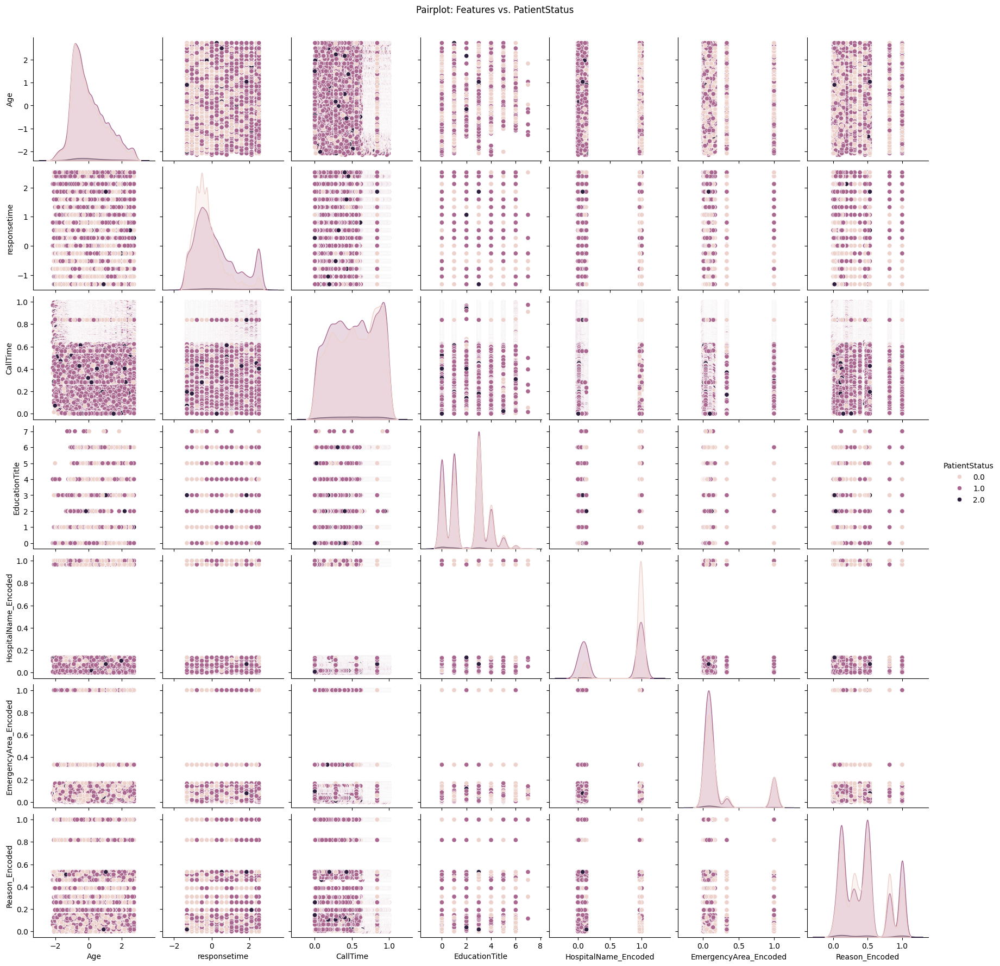

In [ ]:
# Pairplot to see relationships with PatientStatus
sns.pairplot(scaled_df_patientstatus, vars=columns_to_analyze, hue='PatientStatus')
plt.suptitle("Pairplot: Features vs. PatientStatus", y=1.02)
plt.show()

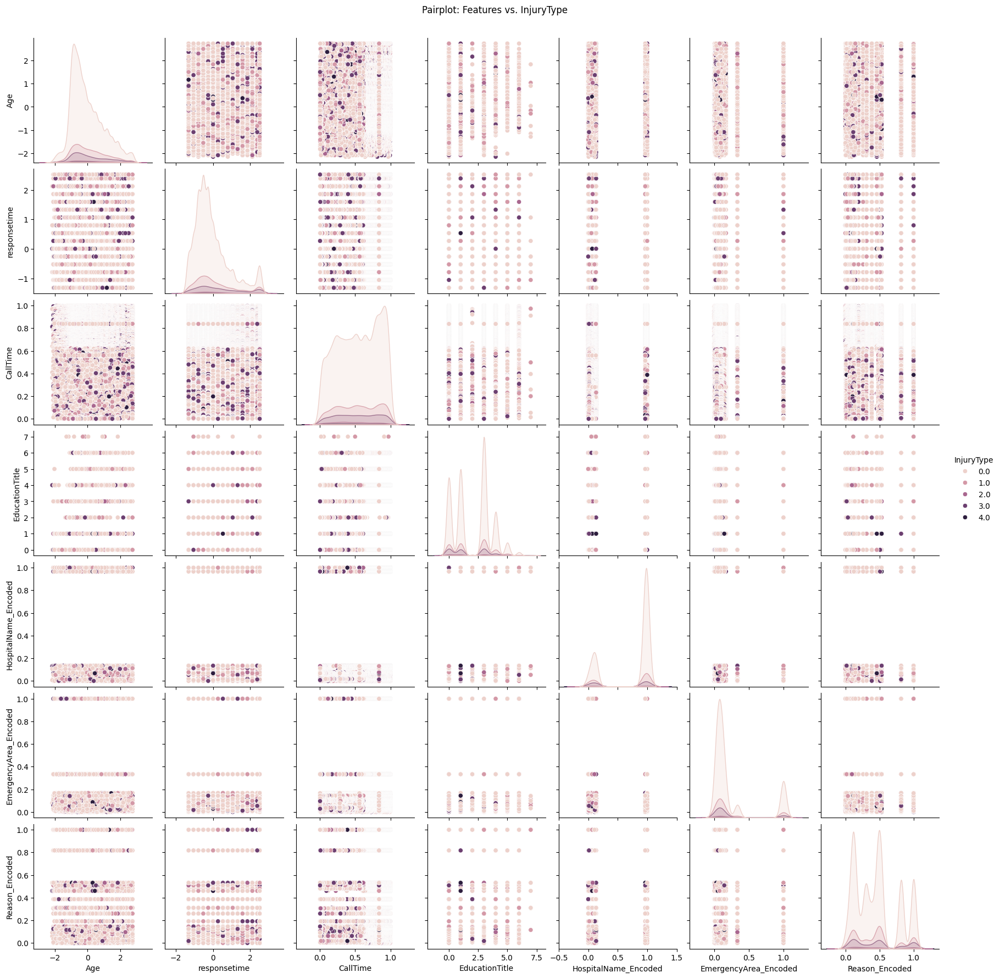

In [ ]:
# Pairplot to see relationships with InjuryType

sns.pairplot(scaled_df_injurytype, vars=columns_to_analyze, hue='InjuryType')
plt.suptitle("Pairplot: Features vs. InjuryType", y=1.02)
plt.show()

## Scatter plot

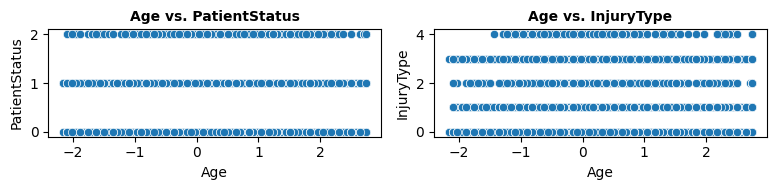

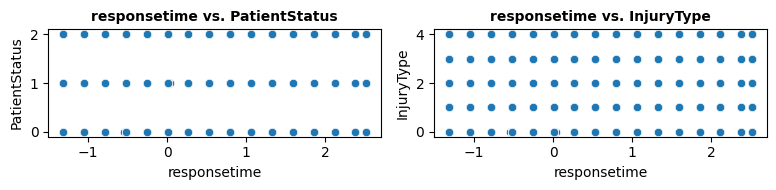

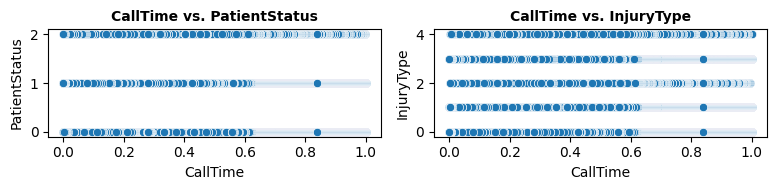

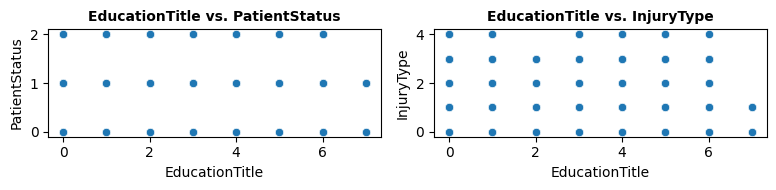

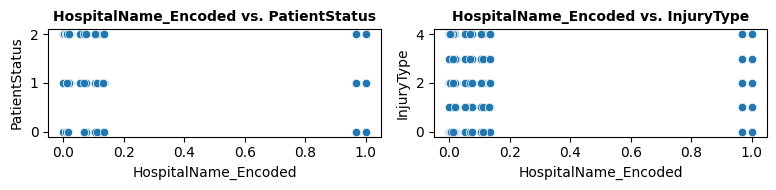

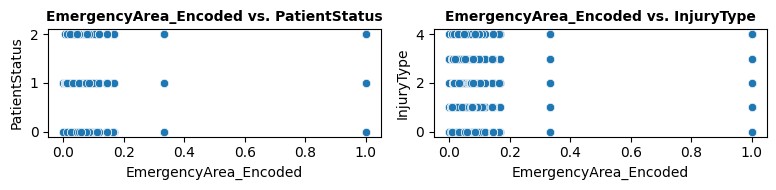

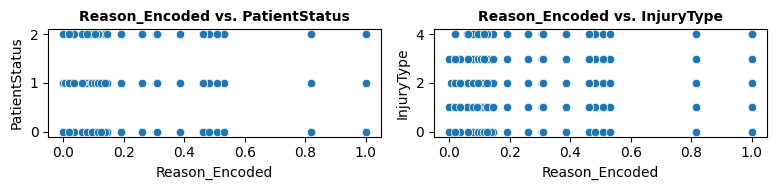

In [ ]:
# Scatter plots for numerical features against the target variables
for col in columns_to_analyze:
    plt.figure(figsize=(8, 2))

    # Scatter plot for PatientStatus
    plt.subplot(1, 2, 1)
    sns.scatterplot(x=scaled_df_patientstatus[col], y=scaled_df_patientstatus['PatientStatus'])
    plt.title(f'{col} vs. PatientStatus', fontsize=10, fontweight='bold')

    # Scatter plot for InjuryType
    plt.subplot(1, 2, 2)
    sns.scatterplot(x=scaled_df_injurytype[col], y=scaled_df_injurytype['InjuryType'])
    plt.title(f'{col} vs. InjuryType', fontsize=10, fontweight='bold')

    plt.tight_layout()
    plt.show()

## Box plot

In [ ]:
import matplotlib.ticker as ticker

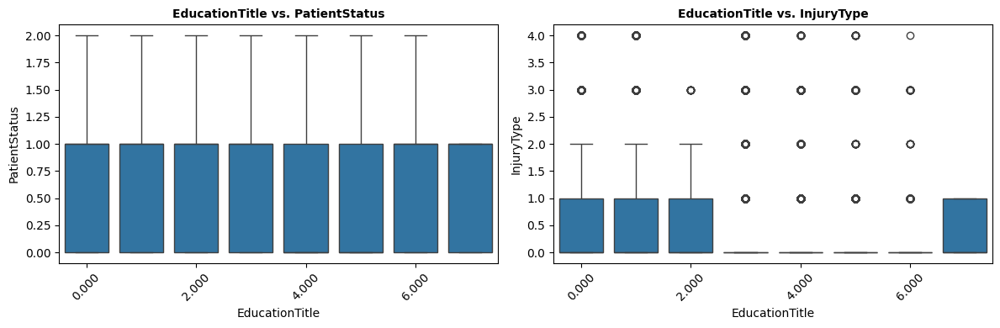

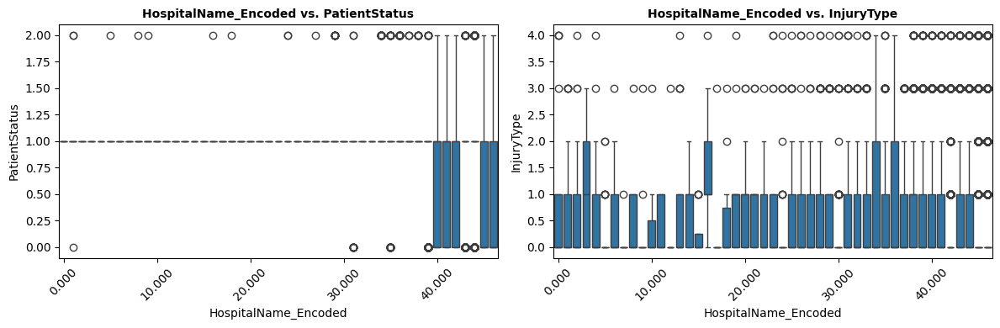

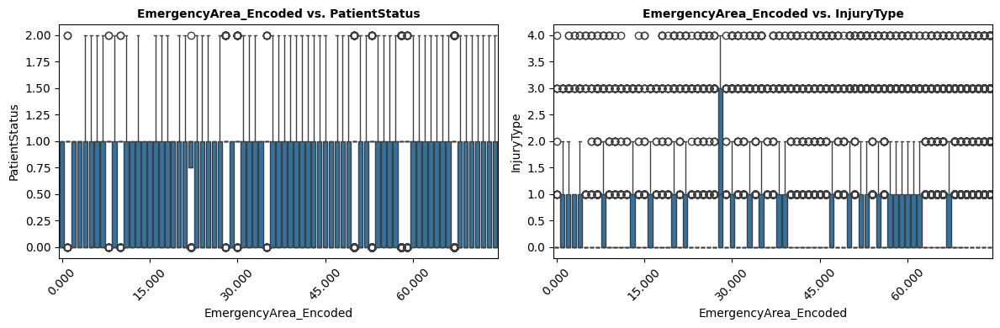

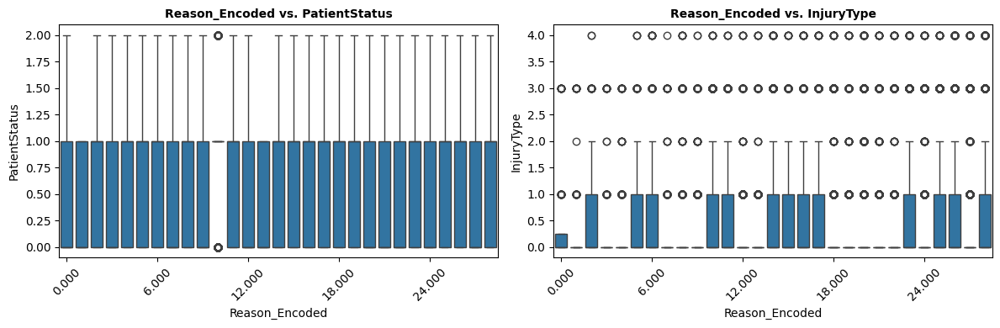

In [ ]:
# Boxplots for categorical features against the target variables (if any are categorical)
categorical_features = ['EducationTitle', 'HospitalName_Encoded', 'EmergencyArea_Encoded', 'Reason_Encoded']

for col in categorical_features:
    plt.figure(figsize=(12, 4))

    # Boxplot for PatientStatus
    plt.subplot(1, 2, 1)
    sns.boxplot(x=scaled_df_patientstatus[col], y=scaled_df_patientstatus['PatientStatus'])
    plt.title(f'{col} vs. PatientStatus', fontsize=10, fontweight='bold')
    plt.xticks(rotation=45)

    # Format x-axis labels to 3 decimals
    plt.gca().xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{x:.3f}'))
    # limit the number of ticks on the x-axis to 5
    plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(integer=True, prune='lower', nbins=5))


    # Boxplot for InjuryType
    plt.subplot(1, 2, 2)
    sns.boxplot(x=scaled_df_injurytype[col], y=scaled_df_injurytype['InjuryType'])
    plt.title(f'{col} vs. InjuryType', fontsize=10, fontweight='bold')
    plt.xticks(rotation=45)

    # Format x-axis labels to 3 decimals
    plt.gca().xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{x:.3f}'))
    # limit the number of ticks on the x-axis to 5
    plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(integer=True, prune='lower', nbins=5))

    plt.tight_layout()
    plt.show()

## Correlation

### Heatmap

The coolwarm color map shows negative correlations in blue and positive correlations in red, with white representing a neutral or no correlation.

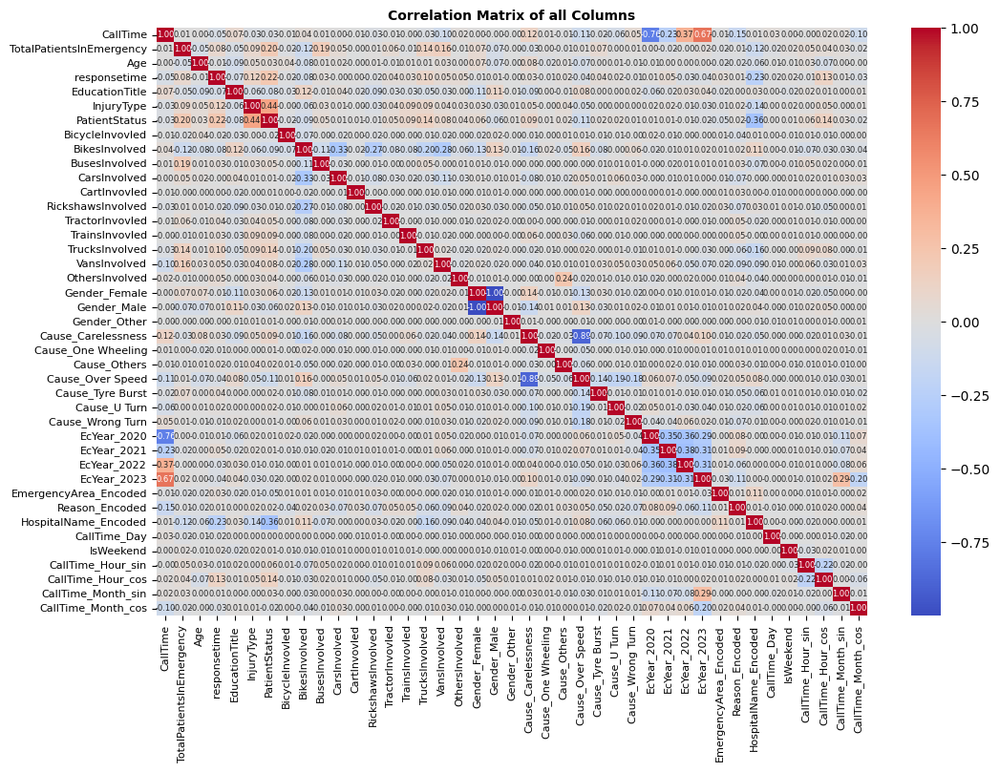

In [ ]:
# Calculate the correlation matrix
correlation_matrix = scaled_df.corr()

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={'size': 6})
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.title("Correlation Matrix of all Columns", fontsize=10, fontweight='bold')
# plt.tight_layout()
plt.show()

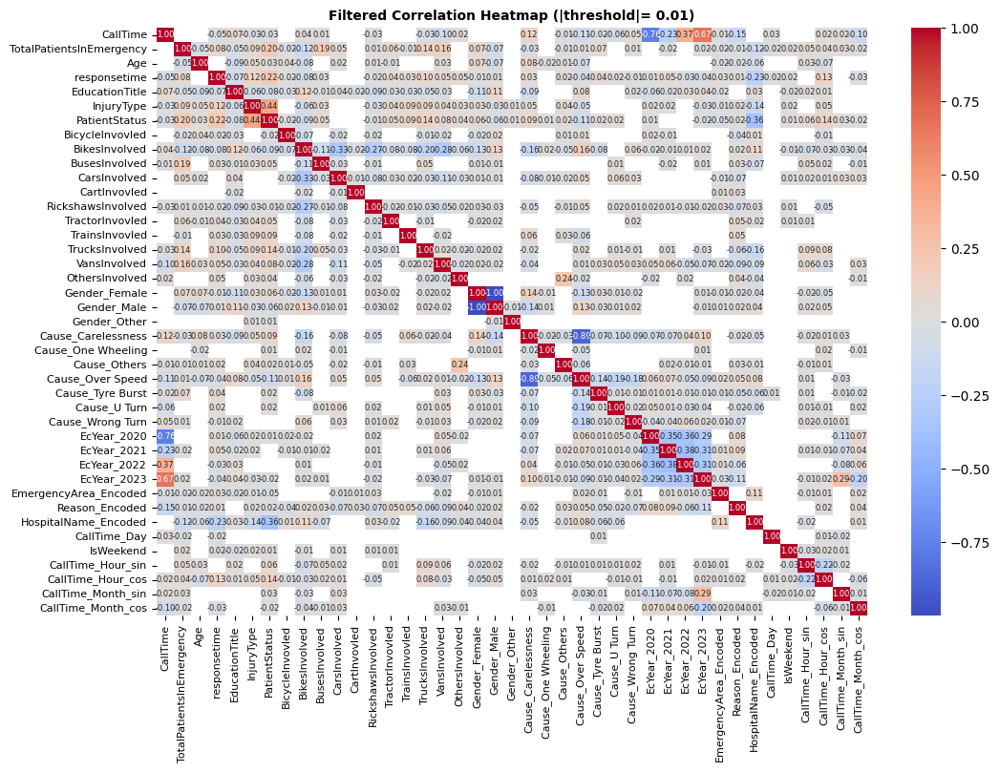

In [ ]:
# Define threshold for significant correlation
corr_threshold = 0.01
correlation_matrix = scaled_df.corr()
mask = np.abs(correlation_matrix) < corr_threshold
correlation_matrix_filtered = correlation_matrix.mask(mask)

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix_filtered, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={'size': 6})
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.title(f"Filtered Correlation Heatmap (|threshold|= {corr_threshold})", fontsize=10, fontweight='bold')
# plt.grid(True)
# plt.tight_layout()
plt.show()

### Correlation Matrix

Feature to Feature Correlation

In [ ]:
correlation_matrix = scaled_df.corr()

# Set correlation threshold for feature-to-feature correlation
correlation_threshold = 0.8

# Create a mask for features with high correlation
high_corr_features = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > correlation_threshold:
            colname = correlation_matrix.columns[i]
            print(f"Feature: {correlation_matrix.columns[i]} | Feature: {correlation_matrix.columns[j]} | Correlation: {correlation_matrix.iloc[i, j]:.4f}")
            high_corr_features.add(colname)

Feature: Gender_Male | Feature: Gender_Female | Correlation: -0.9999
Feature: Cause_Over Speed | Feature: Cause_Carelessness | Correlation: -0.8884


Having both Gender_Male and Gender_Female, they will always be opposites (if one is 1, the other mostly be 0, and vice versa), leading to a correlation of -1 (or near -1), which is extremely high. one will be redundant once the other is known. so, dropping one

In [ ]:
# drop gender_female
scaled_df.drop(['Gender_Female'], axis=1, inplace=True)

### Correlation with InjuryType

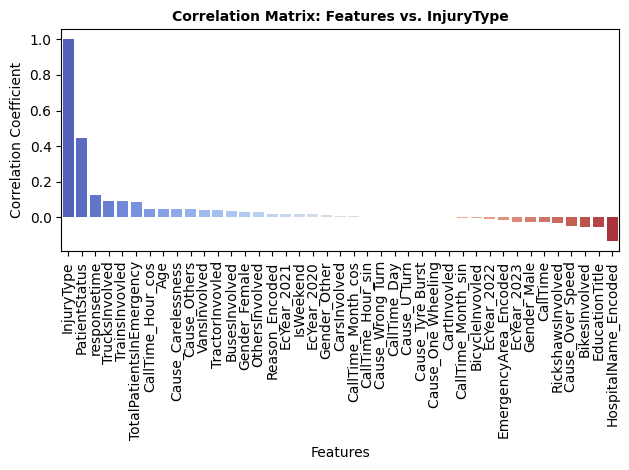

In [ ]:
# Compute correlation with InjuryType
correlation_with_injurytype = scaled_df_injurytype.corr()['InjuryType'].sort_values(ascending=False)

sns.barplot(x=correlation_with_injurytype.index, y=correlation_with_injurytype.values, palette='coolwarm', hue=correlation_with_injurytype.index)

plt.title("Correlation Matrix: Features vs. InjuryType", fontsize=10, fontweight='bold')
plt.xlabel('Features')
plt.ylabel('Correlation Coefficient')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [ ]:
# Compute correlation with InjuryType
correlation_with_injurytype = scaled_df_injurytype.corr()['InjuryType'].drop('InjuryType')

# Display correlation values in a readable format
correlation_with_injurytype_sorted = correlation_with_injurytype.sort_values(ascending=False)

# Print the correlation values
print("Correlation of Features with 'InjuryType':\n")
for feature, value in correlation_with_injurytype_sorted.items():
    print(f"{feature:<30}: {value:.4f}")


Correlation of Features with 'InjuryType':

PatientStatus                 : 0.4438
responsetime                  : 0.1244
TrucksInvolved                : 0.0910
TrainsInvovled                : 0.0884
TotalPatientsInEmergency      : 0.0851
CallTime_Hour_cos             : 0.0483
Age                           : 0.0460
Cause_Carelessness            : 0.0458
Cause_Others                  : 0.0446
VansInvolved                  : 0.0410
TractorInvovled               : 0.0395
BusesInvolved                 : 0.0324
Gender_Female                 : 0.0279
OthersInvolved                : 0.0265
Reason_Encoded                : 0.0188
EcYear_2021                   : 0.0165
IsWeekend                     : 0.0155
EcYear_2020                   : 0.0151
Gender_Other                  : 0.0130
CarsInvolved                  : 0.0086
CallTime_Month_cos            : 0.0085
CallTime_Hour_sin             : 0.0027
Cause_Wrong Turn              : 0.0026
CallTime_Day                  : 0.0024
Cause_U Turn        

In [ ]:
threshold = 0.01
correlation_with_injurytype_sorted = correlation_with_injurytype.sort_values(ascending=True)
weak_correlations = correlation_with_injurytype_sorted[correlation_with_injurytype_sorted.abs() < threshold]

for feature, value in weak_correlations.items():
    print(f"{feature:<30}: {value:.4f}")


EcYear_2022                   : -0.0082
BicycleInvovled               : -0.0049
CallTime_Month_sin            : -0.0025
CartInvovled                  : -0.0016
Cause_One Wheeling            : -0.0014
Cause_Tyre Burst              : -0.0006
Cause_U Turn                  : 0.0003
CallTime_Day                  : 0.0024
Cause_Wrong Turn              : 0.0026
CallTime_Hour_sin             : 0.0027
CallTime_Month_cos            : 0.0085
CarsInvolved                  : 0.0086


### Correlation with PatientStatus

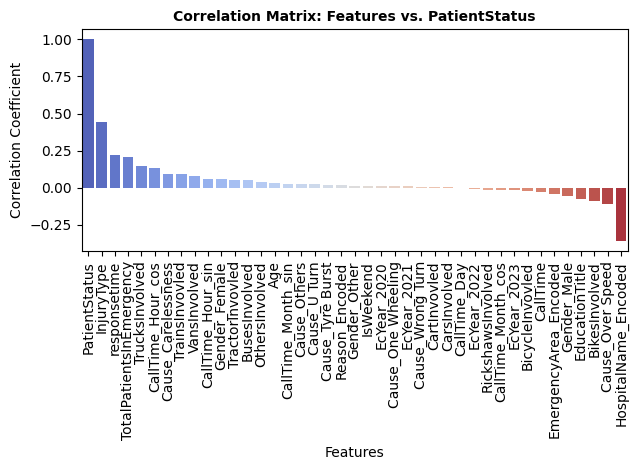

In [ ]:
# Compute correlation with PatientStatus
correlation_with_patientstatus = scaled_df_patientstatus.corr()['PatientStatus'].sort_values(ascending=False)

sns.barplot(x=correlation_with_patientstatus.index, y=correlation_with_patientstatus.values, palette='coolwarm', hue=correlation_with_patientstatus.index)

plt.title("Correlation Matrix: Features vs. PatientStatus", fontsize=10, fontweight='bold')
plt.xlabel('Features')
plt.ylabel('Correlation Coefficient')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [ ]:
# Compute correlation with PatientStatus
correlation_with_patientstatus = scaled_df_patientstatus.corr()['PatientStatus'].drop('PatientStatus')

# Display correlation values in a readable format
correlation_with_patientstatus_sorted = correlation_with_patientstatus.sort_values(ascending=False)

# Print the correlation values
print("Correlation of Features with 'PatientStatus':\n")
for feature, value in correlation_with_patientstatus_sorted.items():
    print(f"{feature:<30}: {value:.4f}")


Correlation of Features with 'PatientStatus':

InjuryType                    : 0.4438
responsetime                  : 0.2231
TotalPatientsInEmergency      : 0.2042
TrucksInvolved                : 0.1446
CallTime_Hour_cos             : 0.1358
Cause_Carelessness            : 0.0946
TrainsInvovled                : 0.0889
VansInvolved                  : 0.0783
CallTime_Hour_sin             : 0.0575
Gender_Female                 : 0.0564
TractorInvovled               : 0.0548
BusesInvolved                 : 0.0525
OthersInvolved                : 0.0360
Age                           : 0.0314
CallTime_Month_sin            : 0.0275
Cause_Others                  : 0.0243
Cause_U Turn                  : 0.0236
Cause_Tyre Burst              : 0.0208
Reason_Encoded                : 0.0156
Gender_Other                  : 0.0130
IsWeekend                     : 0.0130
EcYear_2020                   : 0.0128
Cause_One Wheeling            : 0.0105
EcYear_2021                   : 0.0098
Cause_Wrong Turn 

In [ ]:
threshold = 0.01
correlation_with_patientstatus_sorted = correlation_with_patientstatus.sort_values(ascending=True)
weak_correlations = correlation_with_patientstatus_sorted[correlation_with_patientstatus_sorted.abs() < threshold]

for feature, value in weak_correlations.items():
    print(f"{feature:<30}: {value:.4f}")


EcYear_2022                   : -0.0058
CallTime_Day                  : 0.0004
CarsInvolved                  : 0.0054
CartInvovled                  : 0.0064
Cause_Wrong Turn              : 0.0070
EcYear_2021                   : 0.0098


## ANOVA

 ANOVA is better suited for comparing means between discrete groups (e.g., distinct categories)<br>
 As I have already encoded all the columns, ANOVA might be less relevant here

<ipython-input-865-a527241b2a0c>:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return anova_table['PR(>F)'][0]
<ipython-input-865-a527241b2a0c>:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return anova_table['PR(>F)'][0]
<ipython-input-865-a527241b2a0c>:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return anova_table['PR(>F)'][0]
<ipython-input-865-a527241b2a0c>:9: FutureWarning: Series.__getitem__ treating keys as positio

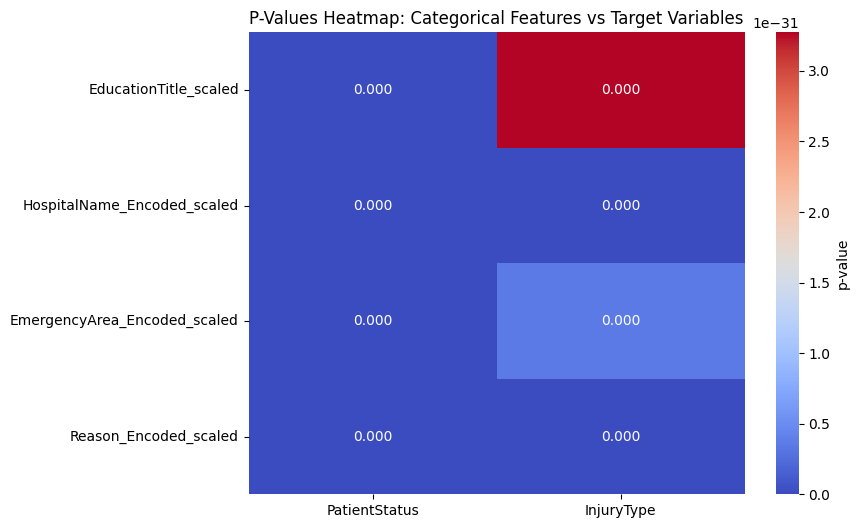

Significant categorical features with strong relationships to target variables:
                              PatientStatus InjuryType
EducationTitle_scaled                  0.0        0.0
HospitalName_Encoded_scaled            0.0        0.0
EmergencyArea_Encoded_scaled           0.0        0.0
Reason_Encoded_scaled                  0.0        0.0


In [ ]:
# import statsmodels.api as sm
# from statsmodels.formula.api import ols
# from scipy.stats import chi2_contingency

# # Function to run ANOVA and return p-values
# def run_anova(df, feature, target):
#     model = ols(f'{target} ~ C({feature})', data=df).fit()
#     anova_table = sm.stats.anova_lm(model, typ=2)
#     return anova_table['PR(>F)'][0]

# # Categorical columns to analyze
# categorical_features = ['EducationTitle_scaled', 'HospitalName_Encoded_scaled',
#                         'EmergencyArea_Encoded_scaled', 'Reason_Encoded_scaled']

# # DataFrame to store p-values
# p_values = pd.DataFrame(index=categorical_features, columns=['PatientStatus', 'InjuryType'])

# # Run ANOVA for categorical features
# for col in categorical_features:
#     p_values.loc[col, 'PatientStatus'] = run_anova(preprocessed_df, col, 'PatientStatus')
#     p_values.loc[col, 'InjuryType'] = run_anova(preprocessed_df, col, 'InjuryType')

# # Plot heatmap of ANOVA p-values
# plt.figure(figsize=(4, 4))
# sns.heatmap(p_values.astype(float), annot=True, cmap='coolwarm', fmt='.3f', cbar_kws={'label': 'p-value'})
# plt.title('P-Values Heatmap: Categorical Features vs Target Variables')
# plt.show()

# # Filter out weak relationships (p-value > 0.05)
# significant_categorical_features = p_values[(p_values['PatientStatus'] < 0.05) | (p_values['InjuryType'] < 0.05)]
# print("Significant categorical features with strong relationships to target variables:\n", significant_categorical_features)

# Analyze Class Distribution

## Proportions

In [ ]:
# For InjuryType
injury_type_counts = preprocessed_df['InjuryType'].value_counts(normalize=True)
print("InjuryType Class Distribution:")
print(injury_type_counts)

InjuryType Class Distribution:
InjuryType
0.0    0.753199
1.0    0.145864
3.0    0.075844
2.0    0.016845
4.0    0.008249
Name: proportion, dtype: float64


* Class 0 (majority class): ~75.32% of the data.
* Class 4 (minority class): Only ~0.82%.
* Significant imbalance exists, particularly with Classes 2 (~ 1.68%) and 4 (~ 0.82%).

In [ ]:
# For PatientStatus
patient_status_counts = preprocessed_df['PatientStatus'].value_counts(normalize=True)
print("\nPatientStatus Class Distribution:")
print(patient_status_counts)


PatientStatus Class Distribution:
PatientStatus
1.0    0.515037
0.0    0.472254
2.0    0.012709
Name: proportion, dtype: float64


* Class 1 (majority class): ~51.50%.
* Class 2 (minority class): Only ~1.27%.
* Slight imbalance exists, particularly with Class 2 (~ 1.27%).

## Visualization

<ipython-input-9-c8d9f01537fe>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=injury_type_counts.index, y=injury_type_counts.values, palette="viridis")


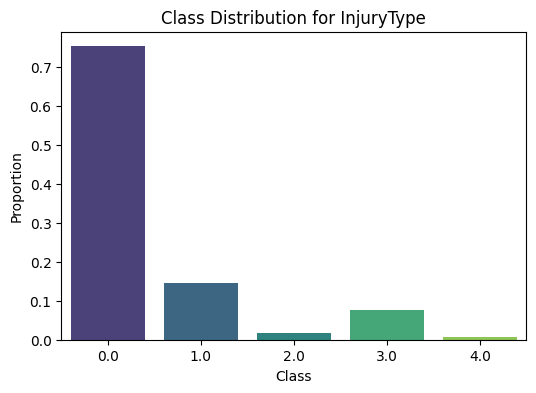

In [ ]:
# InjuryType
plt.figure(figsize=(6, 4))
sns.barplot(x=injury_type_counts.index, y=injury_type_counts.values, palette="viridis")
plt.title("Class Distribution for InjuryType")
plt.xlabel("Class")
plt.ylabel("Proportion")
plt.show()

<ipython-input-10-4c591ae74ef7>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=patient_status_counts.index, y=patient_status_counts.values, palette="viridis")


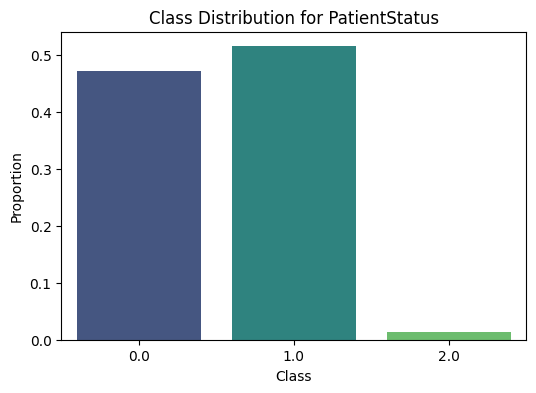

In [ ]:
# PatientStatus
plt.figure(figsize=(6, 4))
sns.barplot(x=patient_status_counts.index, y=patient_status_counts.values, palette="viridis")
plt.title("Class Distribution for PatientStatus")
plt.xlabel("Class")
plt.ylabel("Proportion")
plt.show()

# Model Training with LOGISTIC REGRESSION (Target: InjuryType) <font color='blue'> **[PHASE-2]**

## Split Dataset



```
EcYear_2022                   : -0.0082
BicycleInvovled               : -0.0049
CallTime_Month_sin            : -0.0025
CartInvovled                  : -0.0016
Cause_One Wheeling            : -0.0014
Cause_Tyre Burst              : -0.0006
Cause_U Turn                  : 0.0003
CallTime_Day                  : 0.0024
Cause_Wrong Turn              : 0.0026
CallTime_Hour_sin             : 0.0027
CallTime_Month_cos            : 0.0085
CarsInvolved                  : 0.0086
```



In [ ]:
# for target='InjuryType' these columns have correlation value of (<0.01)
columns_to_drop = [
    # 'BicycleInvovled',
    # 'EmergencyArea_Encoded',
    'CartInvovled',
    'Cause_One Wheeling',
    'Cause_Tyre Burst',
    'Cause_U Turn',
    # 'Cause_Wrong Turn',
    # 'CarsInvolved'
]

In [ ]:
print("Shape of preprocessed_df:")
print(scaled_df.shape)

Shape of preprocessed_df:
(46187, 40)


In [ ]:
from sklearn.model_selection import train_test_split
X_injury = scaled_df.drop(columns_to_drop + ['InjuryType'], axis=1)
y_injury = scaled_df['InjuryType']  # Target: 'InjuryType'

# Split into train (80%) and test (20%) sets
X_train_injury, X_test_injury, y_train_injury, y_test_injury = train_test_split(X_injury, y_injury, test_size=0.2, random_state=42)

In [ ]:
# Print the shapes of the resulting sets to verify
print("\nInjuryType Model Data Shapes:")
print("=" * 50)
print(f"{'Dataset':<15} {'Features (X)':<25} {'Labels (y)':<15}")
print("=" * 50)
print(f"{'Train set':<15} {str(X_train_injury.shape):<25} {str(y_train_injury.shape):<15}")
print(f"{'Test set':<15} {str(X_test_injury.shape):<25} {str(y_test_injury.shape):<15}")
print("=" * 50)


InjuryType Model Data Shapes:
Dataset         Features (X)              Labels (y)     
Train set       (36949, 35)               (36949,)       
Test set        (9238, 35)                (9238,)        


In [ ]:
# Print the size (number of rows) for each set
print("\nInjuryType Model Data Sizes:")
print("=" * 50)
print(f"{'Dataset':<15} {'Number of Rows':<20} {'Number of Features'}")
print("=" * 50)
print(f"{'Train set':<15} {X_train_injury.shape[0]:<20} {X_train_injury.shape[1]}")
print(f"{'Test set':<15} {X_test_injury.shape[0]:<20} {X_test_injury.shape[1]}")
print("=" * 50)


InjuryType Model Data Sizes:
Dataset         Number of Rows       Number of Features
Train set       36949                35
Test set        9238                 35


## Resample Train Data

In [ ]:
# # Initialize SMOTE
# from imblearn.over_sampling import SMOTE
# # smote = SMOTE(random_state=42)
# smote = SMOTE(sampling_strategy={1.0: 10000, 3.0: 8000, 2.0: 4000, 4.0: 3000}, random_state=42)

In [ ]:
# from collections import Counter
# print("Before Resampling (InjuryType):", Counter(y_train_injury))

Before Resampling (InjuryType): Counter({0.0: 27840, 1.0: 5365, 3.0: 2821, 2.0: 618, 4.0: 305})


In [ ]:
# X_train_injury, y_train_injury = smote.fit_resample(X_train_injury, y_train_injury)
# print("After Resampling (InjuryType):", Counter(y_train_injury))

After Resampling (InjuryType): Counter({0.0: 27840, 1.0: 10000, 3.0: 8000, 2.0: 4000, 4.0: 3000})


In [ ]:
# # Print the size (number of rows) for each set
# print("\nInjuryType Model Data Sizes:")
# print("=" * 50)
# print(f"{'Dataset':<15} {'Number of Rows':<20} {'Number of Features'}")
# print("=" * 50)
# print(f"{'Train set':<15} {X_train_injury.shape[0]:<20} {X_train_injury.shape[1]}")
# print(f"{'Test set':<15} {X_test_injury.shape[0]:<20} {X_test_injury.shape[1]}")
# print("=" * 50)


InjuryType Model Data Sizes:
Dataset         Number of Rows       Number of Features
Train set       52840                35
Test set        9238                 35


## Define Train and Test functions

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

In [ ]:
def train_and_evaluate_LR(X_train, y_train, X_test, y_test, solver, max_iter):
    model = LogisticRegression(solver=solver, max_iter=max_iter, random_state=42)
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)
    cm = confusion_matrix(y_test, y_pred)

    return accuracy, precision, recall, f1, cm

## Train and Evaluate models

In [ ]:
solvers = ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga']
max_iters = [50, 100, 150, 200, 250, 300]

In [ ]:
# Train model and store evaluation results

import warnings
warnings.filterwarnings("ignore") # suppress warnings

results_LR_InjuryType = []
for solver in solvers:
    for max_iter in max_iters:
        print(f'Training model... Solver: {solver:<16} Max_iter: {max_iter}')

        (accuracy, precision, recall, f1, cm) = train_and_evaluate_LR(X_train_injury, y_train_injury, X_test_injury, y_test_injury, solver, max_iter)

        results_LR_InjuryType.append([solver, max_iter, accuracy, precision, recall, f1, cm])

print("\nStored results for all solver-max_iter combinations")

Training model... Solver: lbfgs            Max_iter: 50
Training model... Solver: lbfgs            Max_iter: 100
Training model... Solver: lbfgs            Max_iter: 150
Training model... Solver: lbfgs            Max_iter: 200
Training model... Solver: lbfgs            Max_iter: 250
Training model... Solver: lbfgs            Max_iter: 300
Training model... Solver: liblinear        Max_iter: 50
Training model... Solver: liblinear        Max_iter: 100
Training model... Solver: liblinear        Max_iter: 150
Training model... Solver: liblinear        Max_iter: 200
Training model... Solver: liblinear        Max_iter: 250
Training model... Solver: liblinear        Max_iter: 300
Training model... Solver: newton-cg        Max_iter: 50
Training model... Solver: newton-cg        Max_iter: 100
Training model... Solver: newton-cg        Max_iter: 150
Training model... Solver: newton-cg        Max_iter: 200
Training model... Solver: newton-cg        Max_iter: 250
Training model... Solver: newton-c

## View Result

In [ ]:
# Convert results to a DataFrame for better display
results_df = pd.DataFrame(results_LR_InjuryType, columns=['Solver', 'Max_iter', 'Accuracy', 'Precision', 'Recall', 'F1', 'Confusion Matrix'])

In [ ]:
# Format floats to 4 decimal places
pd.set_option('display.float_format', '{:.4f}'.format)
results_df

,Solver,Max_iter,Accuracy,Precision,Recall,F1,Confusion Matrix
0,lbfgs,50,0.7601,0.6784,0.7601,0.6675,"[[6930, 16, 0, 2, 0], [1357, 13, 1, 1, 0], [12..."
1,lbfgs,100,0.7600,0.6755,0.7600,0.6673,"[[6928, 12, 0, 8, 0], [1358, 9, 1, 4, 0], [128..."
2,lbfgs,150,0.7606,0.6832,0.7606,0.6680,"[[6930, 9, 0, 9, 0], [1358, 9, 1, 4, 0], [128,..."
3,lbfgs,200,0.7606,0.6832,0.7606,0.6680,"[[6930, 9, 0, 9, 0], [1358, 9, 1, 4, 0], [128,..."
4,lbfgs,250,0.7606,0.6832,0.7606,0.6680,"[[6930, 9, 0, 9, 0], [1358, 9, 1, 4, 0], [128,..."
5,lbfgs,300,0.7606,0.6832,0.7606,0.6680,"[[6930, 9, 0, 9, 0], [1358, 9, 1, 4, 0], [128,..."
6,liblinear,50,0.7597,0.6558,0.7597,0.6649,"[[6938, 3, 0, 7, 0], [1368, 3, 0, 1, 0], [129,..."
7,liblinear,100,0.7597,0.6558,0.7597,0.6649,"[[6938, 3, 0, 7, 0], [1368, 3, 0, 1, 0], [129,..."
8,liblinear,150,0.7597,0.6558,0.7597,0.6649,"[[6938, 3, 0, 7, 0], [1368, 3, 0, 1, 0], [129,..."
9,liblinear,200,0.7597,0.6558,0.7597,0.6649,"[[6938, 3, 0, 7, 0], [1368, 3, 0, 1, 0], [129,..."


In [ ]:
# results(sorted by accuracy)
results_df_sorted = results_df.sort_values(by='Accuracy', ascending=False)
results_df_sorted = results_df_sorted.drop('Confusion Matrix', axis=1)

print("Logistic Regression Evaluation Results (target:InjuryType):\n")
print(results_df_sorted)

Logistic Regression Evaluation Results (target:InjuryType):

             Solver  Max_iter  Accuracy  Precision  Recall     F1
35             saga       300    0.7606     0.6869  0.7606 0.6680
24              sag        50    0.7606     0.6872  0.7606 0.6680
26              sag       150    0.7606     0.6869  0.7606 0.6680
27              sag       200    0.7606     0.6869  0.7606 0.6680
28              sag       250    0.7606     0.6869  0.7606 0.6680
17        newton-cg       300    0.7606     0.6872  0.7606 0.6680
16        newton-cg       250    0.7606     0.6872  0.7606 0.6680
15        newton-cg       200    0.7606     0.6872  0.7606 0.6680
14        newton-cg       150    0.7606     0.6872  0.7606 0.6680
13        newton-cg       100    0.7606     0.6872  0.7606 0.6680
12        newton-cg        50    0.7606     0.6872  0.7606 0.6680
29              sag       300    0.7606     0.6869  0.7606 0.6680
31             saga       100    0.7606     0.6872  0.7606 0.6680
32             

In [ ]:
# save result
result_df_LR_InjuryType = results_df.copy()

## Plot Confusion Matrices

In [ ]:
# Plot confusion matrix
def plot_confusion_matrix_LR(cm, solver, max_iter, ax):
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, ax=ax)
    ax.set_title(f'Solver: {solver}, Max_iter: {max_iter}', weight='bold', color='maroon')
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('Actual Label')

### For each solver

In [ ]:
# Plot confusion matrices for each solver with different max_iter values
def plot_solver_max_iter_comparison():
    for solver in solvers:
        fig, axes = plt.subplots(2, 3, figsize=(16, 10))
        fig.suptitle(f'\nConfusion Matrices for Solver: {solver}\n', fontsize=16, weight='bold', color='blue')

        for i, max_iter in enumerate(max_iters):
            cm = results_df[(results_df['Solver'] == solver) & (results_df['Max_iter'] == max_iter)]['Confusion Matrix'].values[0]
            ax = axes[i // 3, i % 3]
            plot_confusion_matrix_LR(cm, solver, max_iter, ax)

        plt.subplots_adjust(hspace=0.4, top=0.9)
        plt.show()

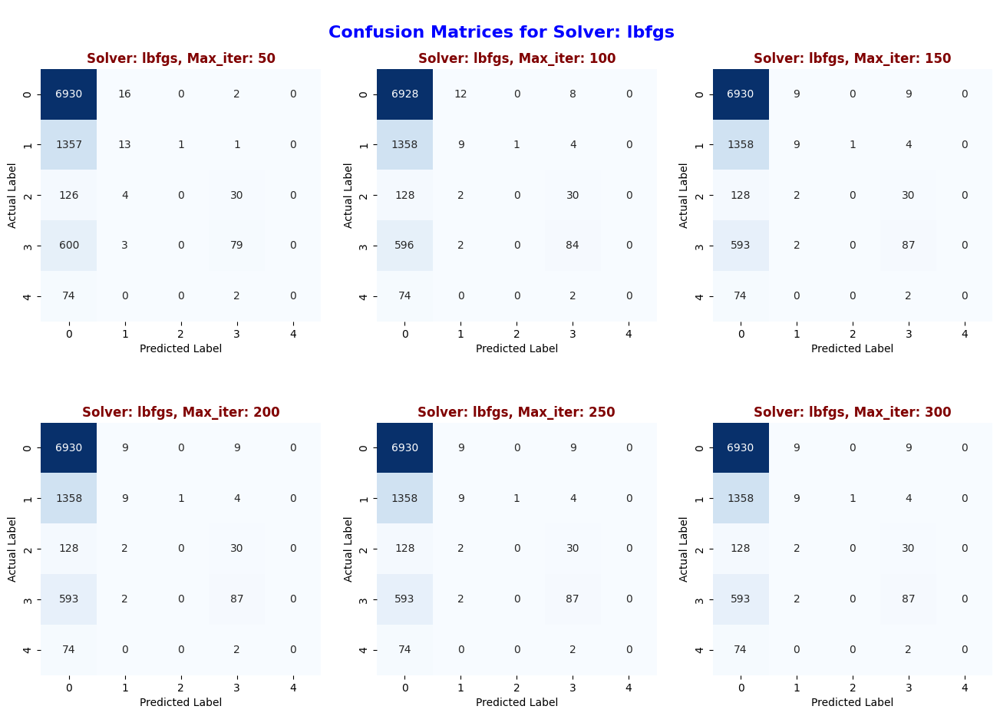

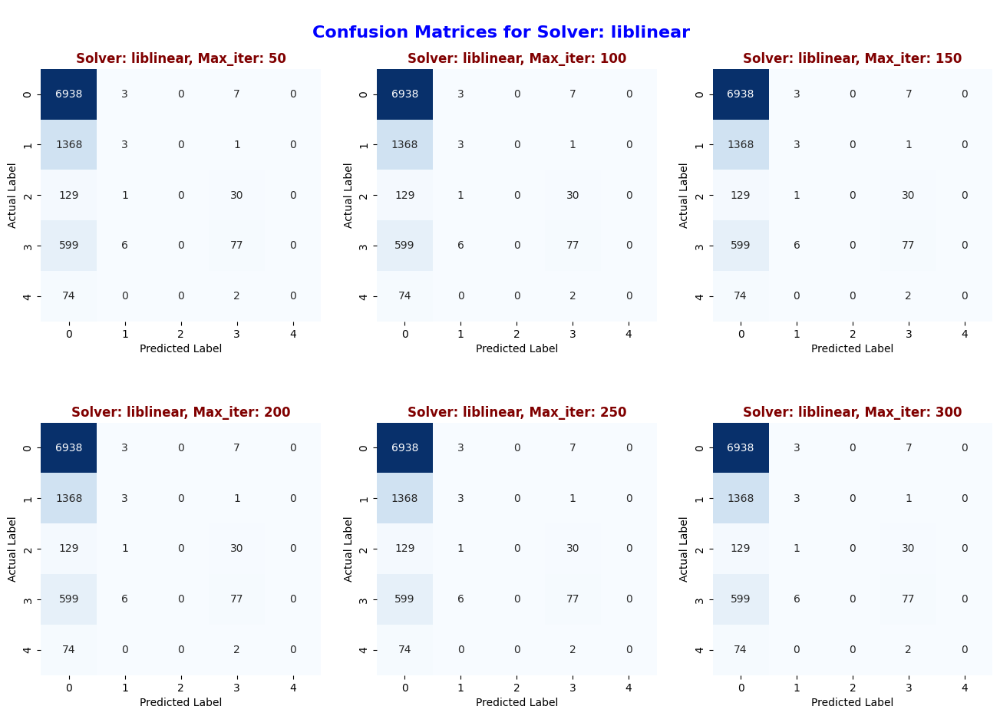

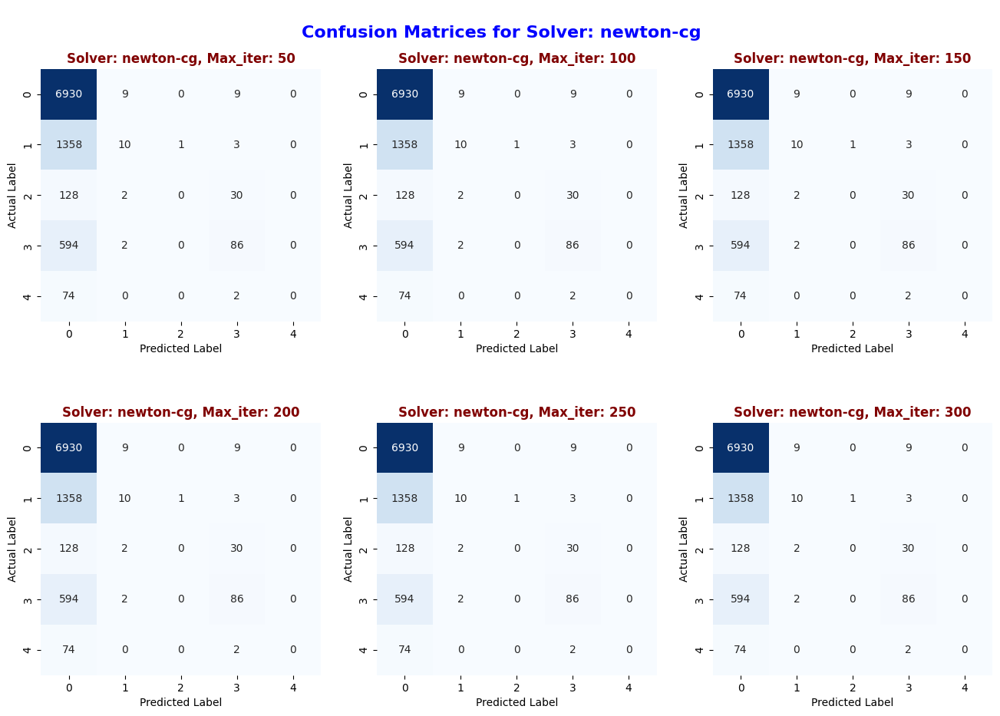

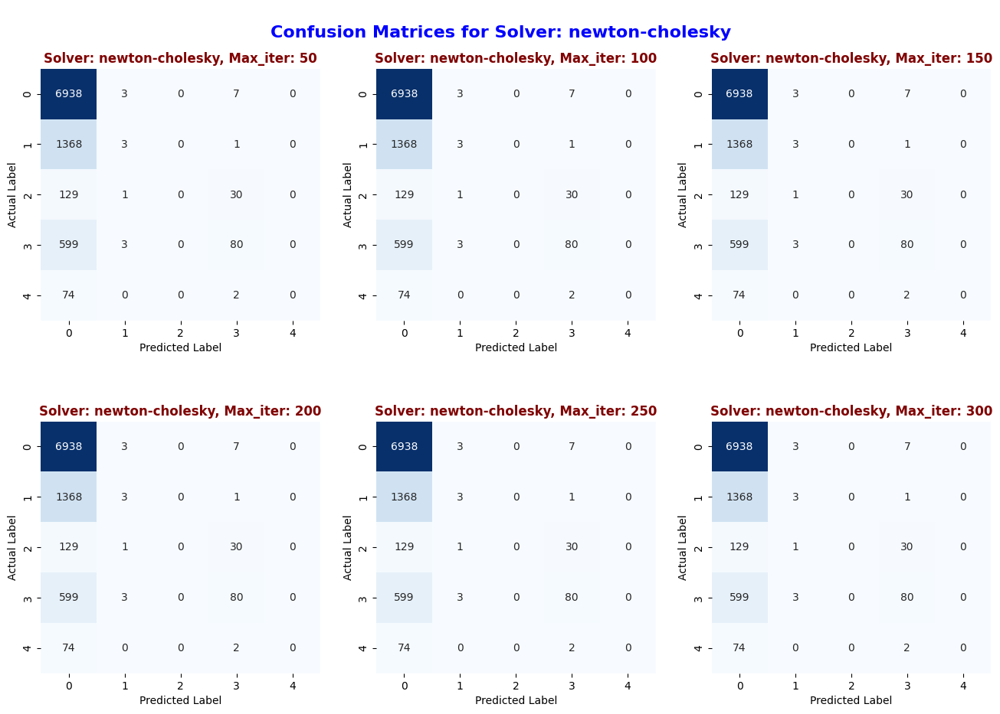

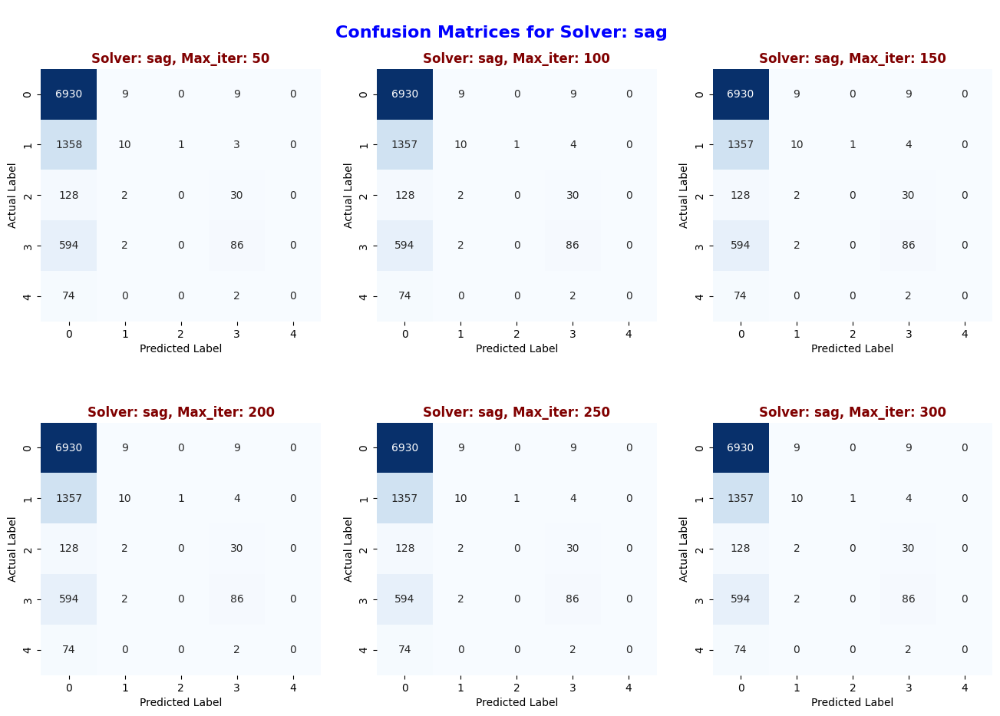

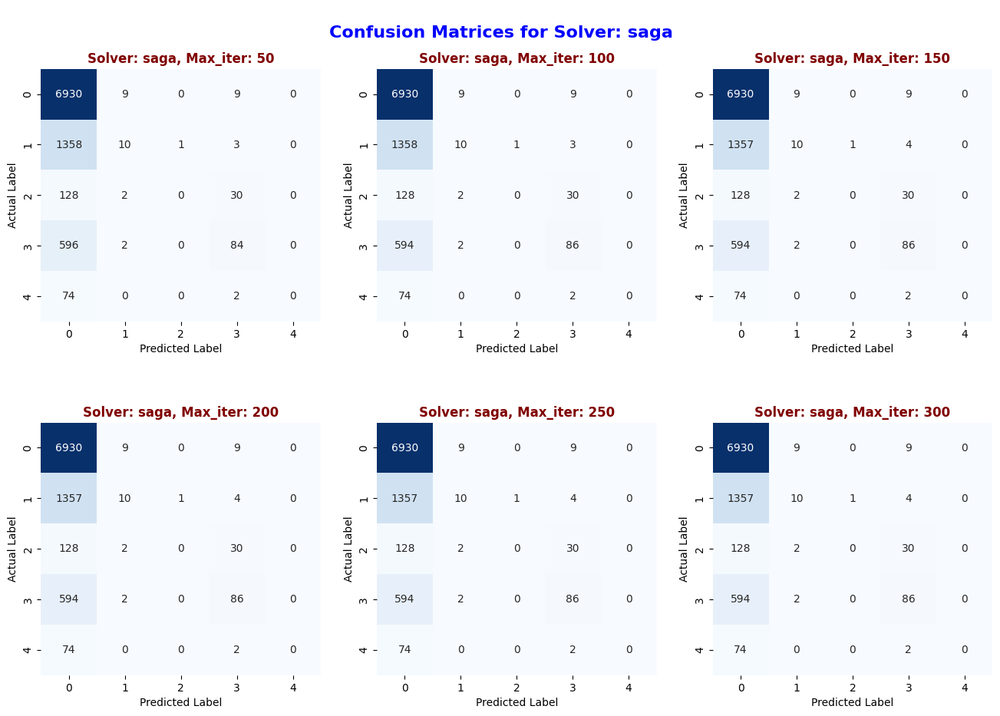

In [ ]:
plot_solver_max_iter_comparison()

### For each max_iter

In [ ]:
# Plot confusion matrices for each max_iter with different solvers
def plot_max_iter_solver_comparison():
    for max_iter in max_iters:
        fig, axes = plt.subplots(2, 3, figsize=(16, 10))
        fig.suptitle(f'\nConfusion Matrices for Max_iter: {max_iter}\n', fontsize=16, weight='bold', color='blue')

        for i, solver in enumerate(solvers):
            cm = results_df[(results_df['Max_iter'] == max_iter) & (results_df['Solver'] == solver)]['Confusion Matrix'].values[0]
            ax = axes[i // 3, i % 3]
            plot_confusion_matrix_LR(cm, solver, max_iter, ax)

        plt.subplots_adjust(hspace=0.4, top=0.9)
        plt.show()

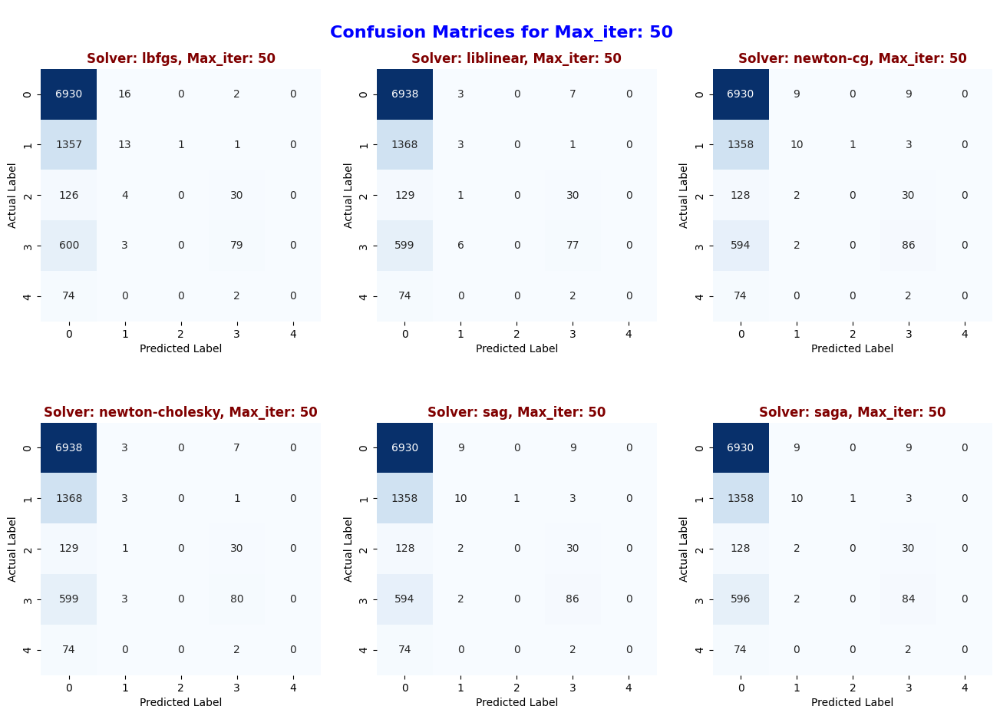

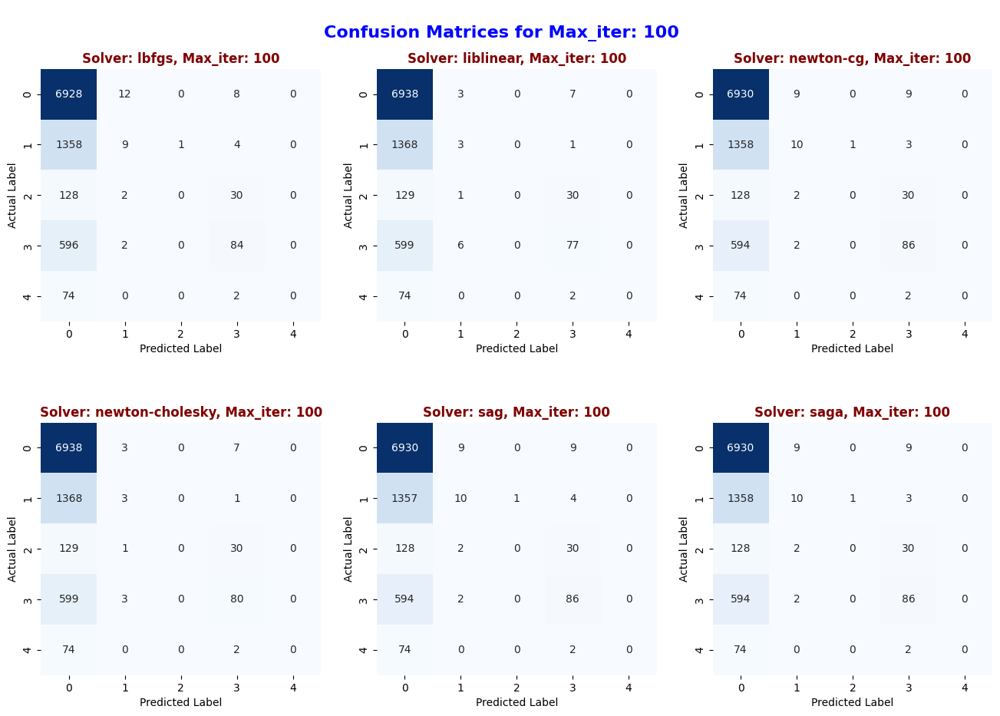

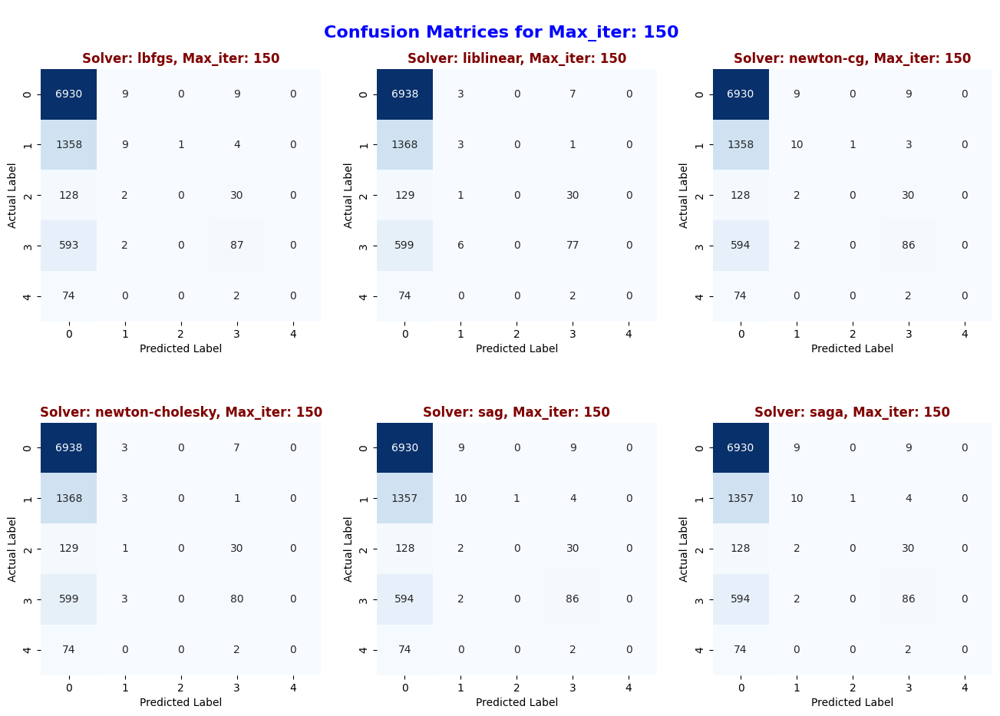

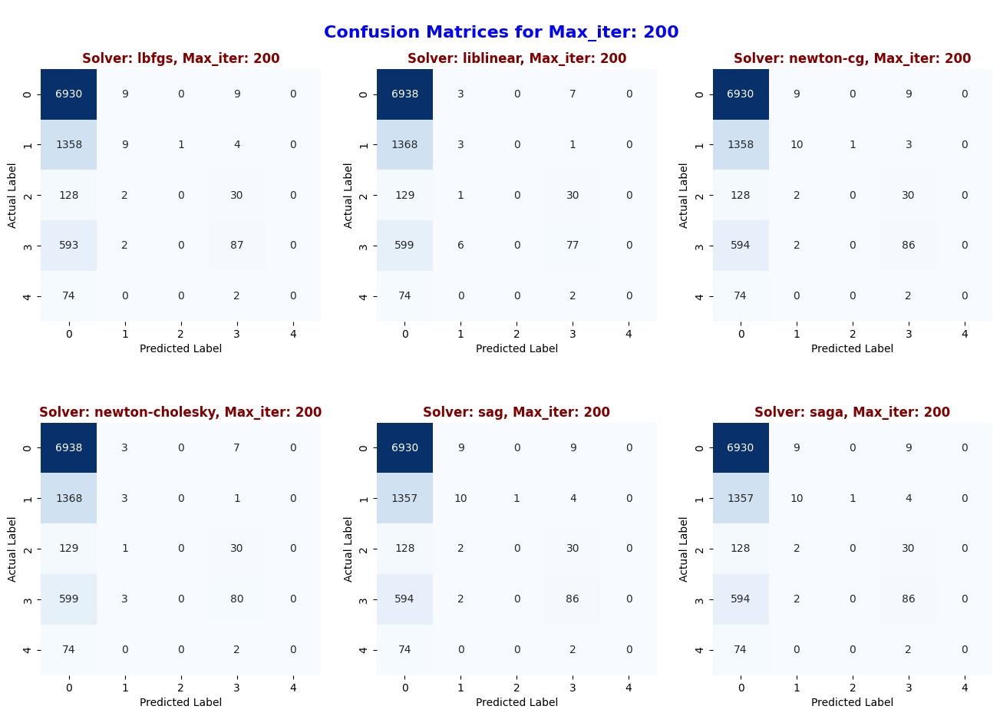

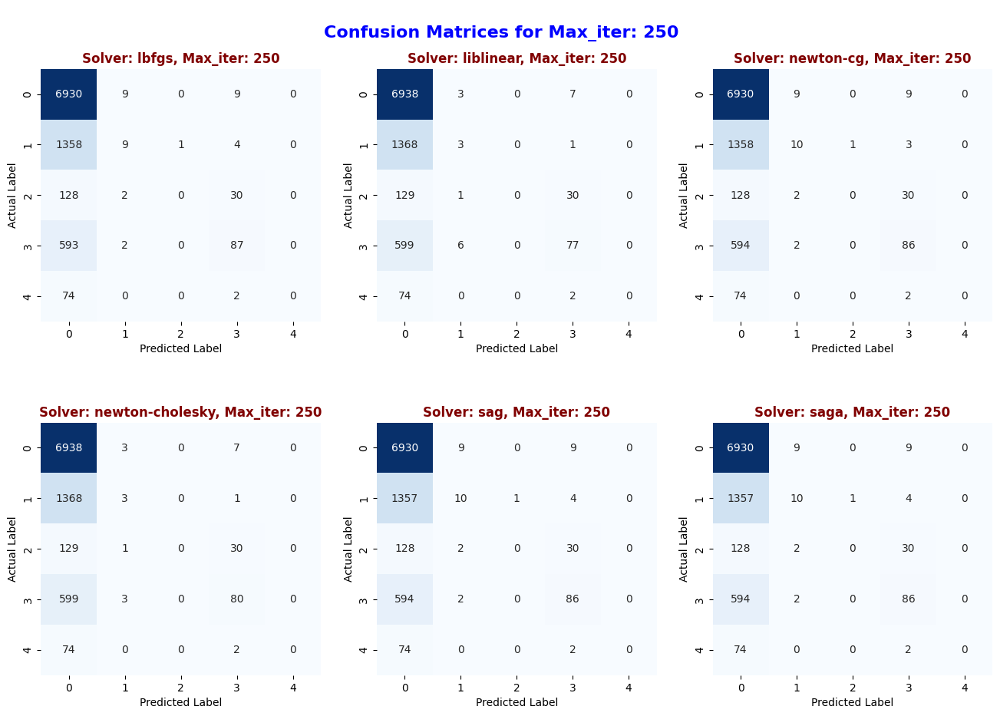

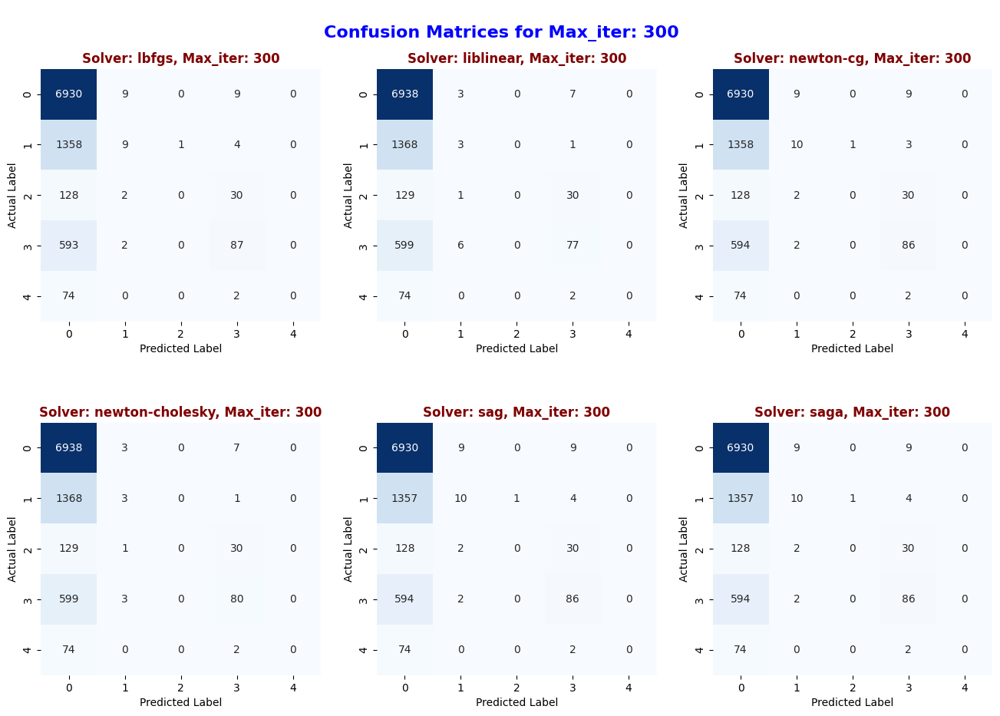

In [ ]:
plot_max_iter_solver_comparison()

## Learning Curves

### Accuracy vs Solver

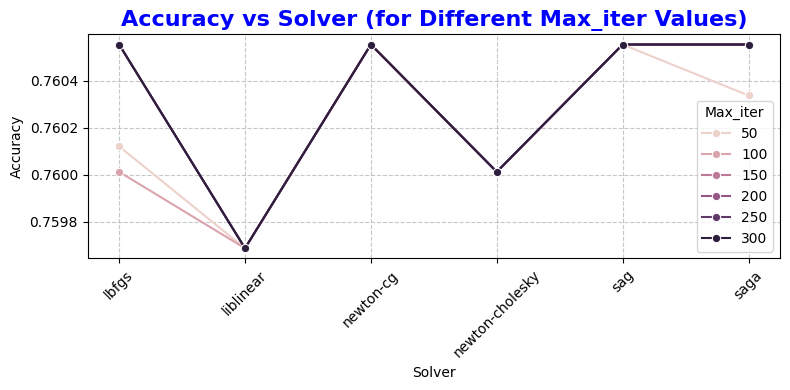

In [ ]:
# Accuracy vs Solver (single plot with different lines for each max_iter)
plt.figure(figsize=(8, 4))

sns.lineplot(x='Solver', y='Accuracy', hue='Max_iter', marker='o', data=results_df)

plt.title('Accuracy vs Solver (for Different Max_iter Values)', fontsize=16, weight='bold', color='blue')
plt.ylabel('Accuracy')
plt.xlabel('Solver')
plt.xticks(rotation=45)

plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Max_iter', loc='best')
plt.tight_layout()
plt.show()

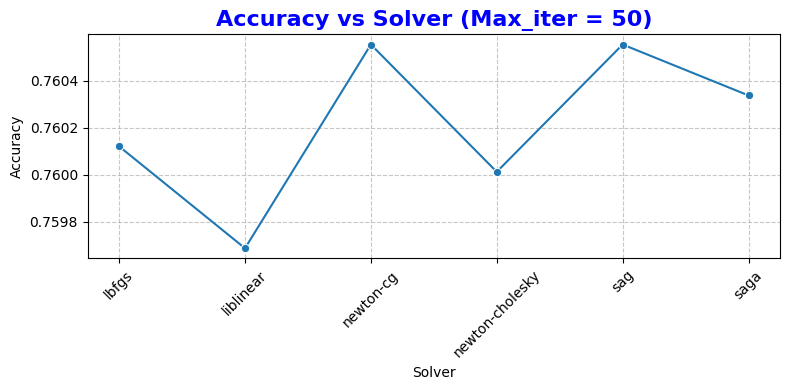

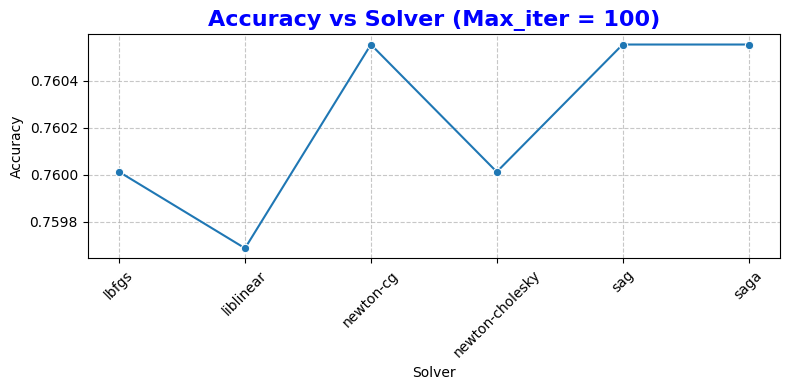

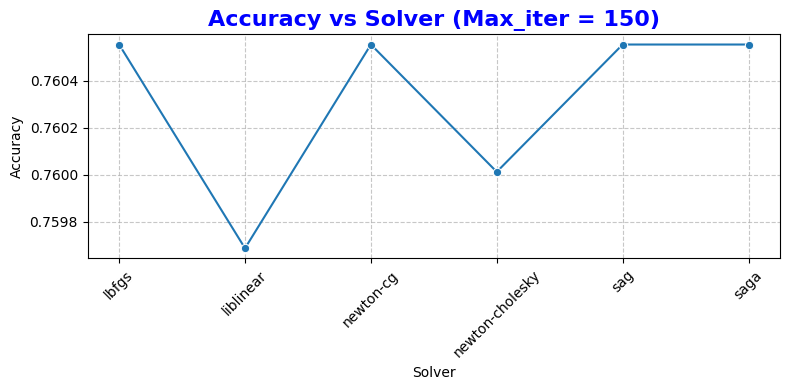

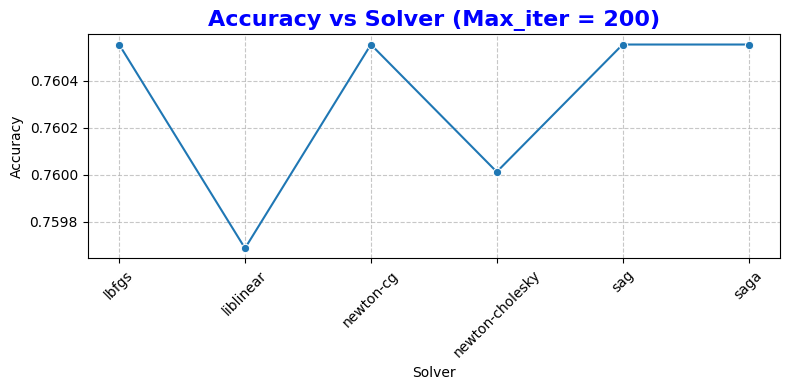

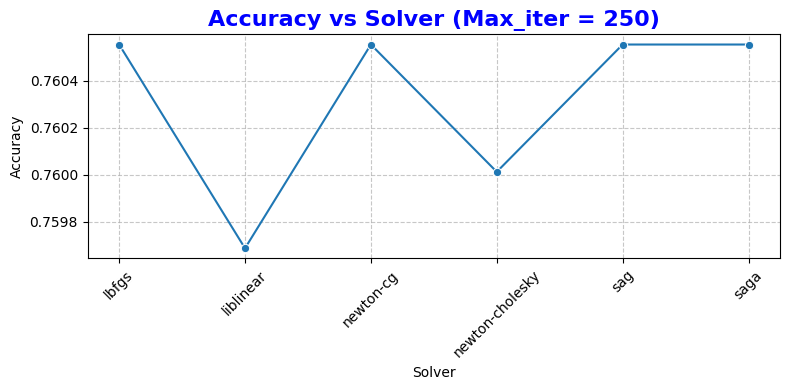

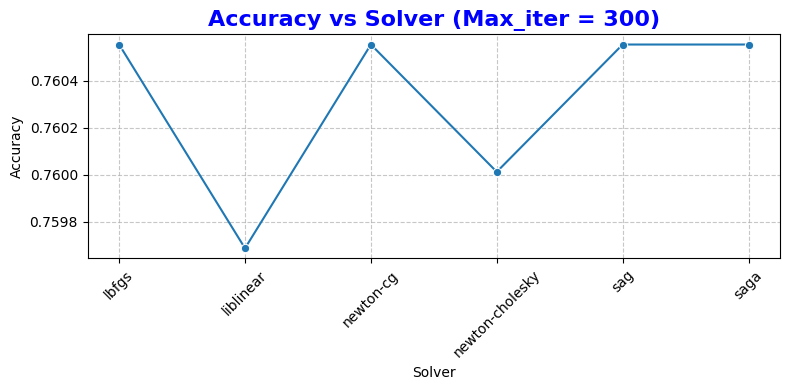

In [ ]:
# Accuracy vs Solver (with separate plots for each Max_iter)
for max_iter in max_iters:
    plt.figure(figsize=(8, 4))
    sns.lineplot(x='Solver', y='Accuracy', marker='o', data=results_df[results_df['Max_iter'] == max_iter])

    plt.title(f'Accuracy vs Solver (Max_iter = {max_iter})', fontsize=16, weight='bold', color='blue')
    plt.ylabel('Accuracy')
    plt.xlabel('Solver')
    plt.xticks(rotation=45)

    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

### Accuracy vs Max_iter

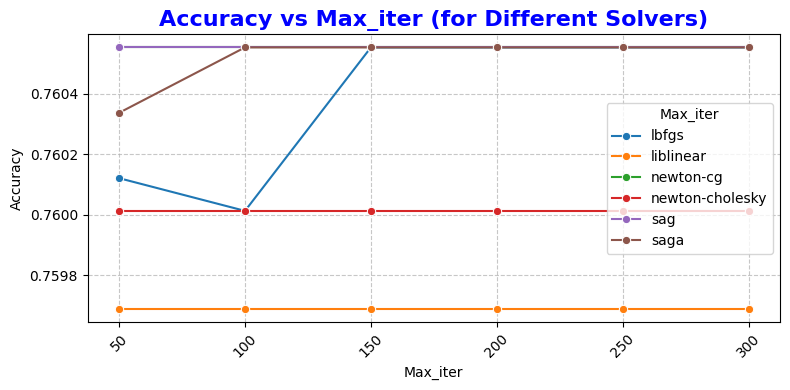

In [ ]:
# Accuracy vs Solver (single plot with different lines for each max_iter)
plt.figure(figsize=(8, 4))

sns.lineplot(x='Max_iter', y='Accuracy', hue='Solver', marker='o', data=results_df)

plt.title('Accuracy vs Max_iter (for Different Solvers)', fontsize=16, weight='bold', color='blue')
plt.ylabel('Accuracy')
plt.xlabel('Max_iter')
plt.xticks(rotation=45)

plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Max_iter', loc='best')
plt.tight_layout()
plt.show()

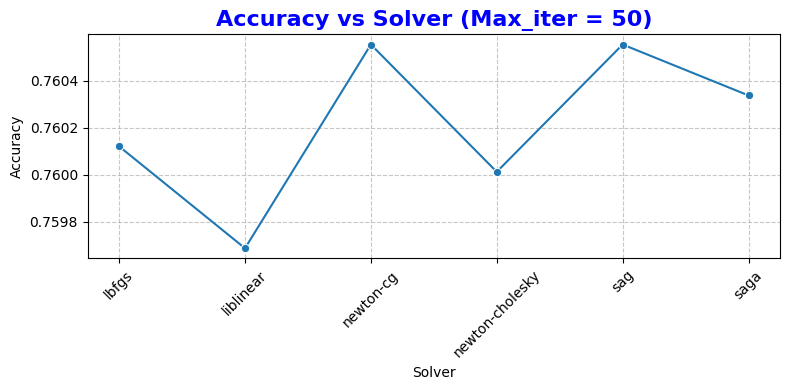

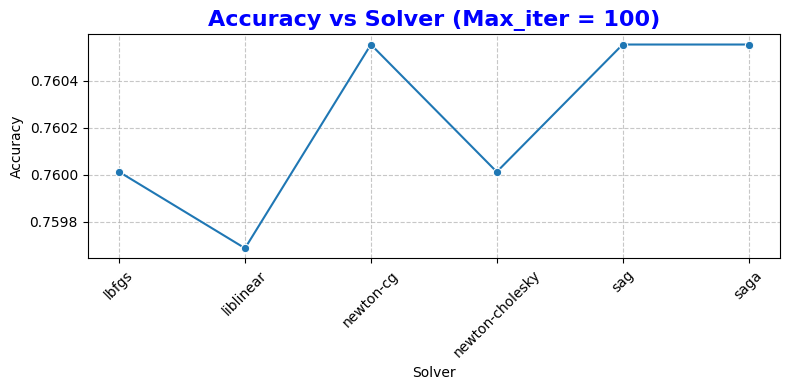

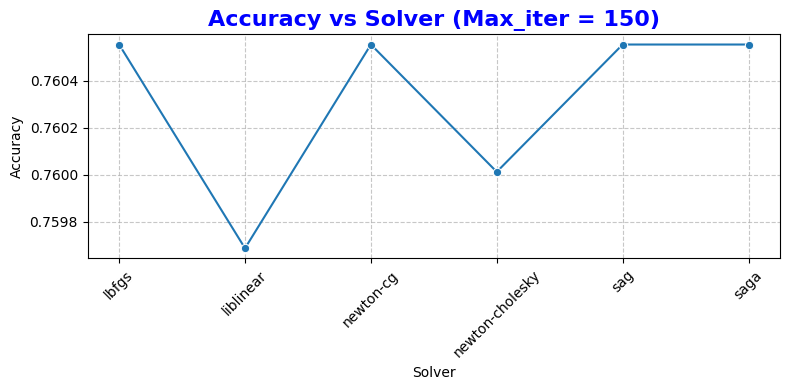

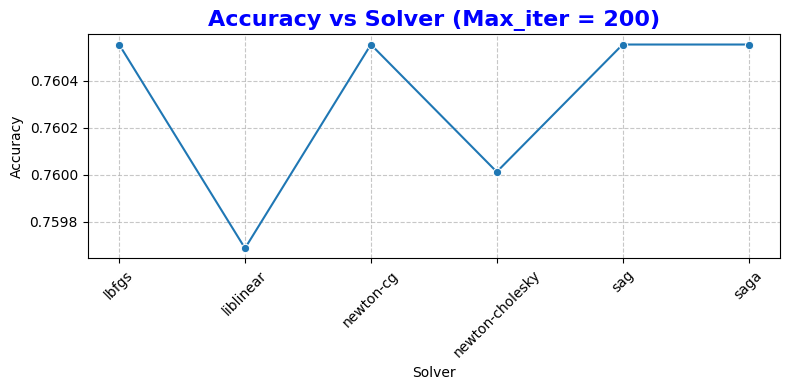

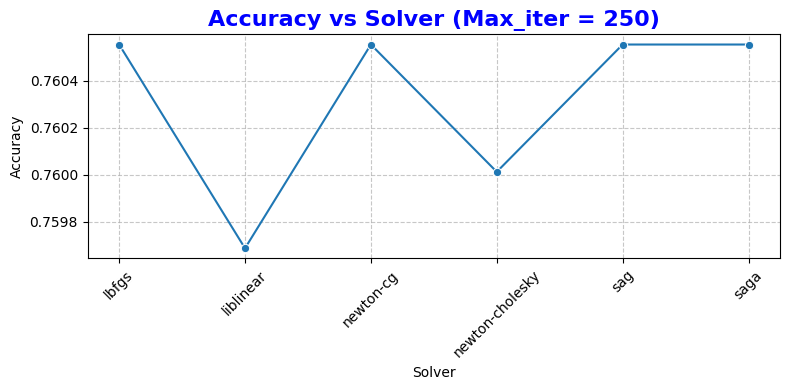

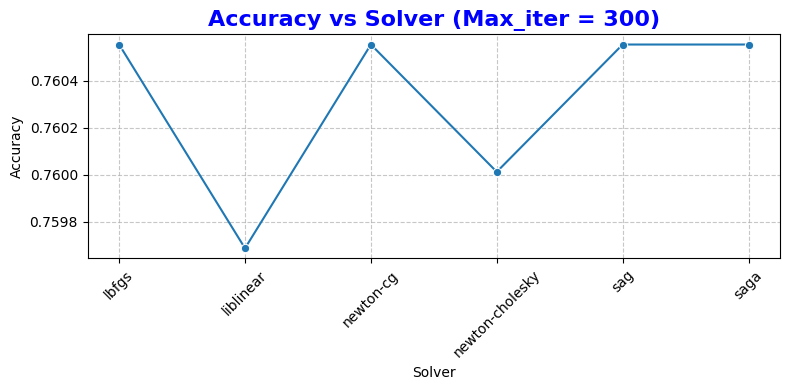

In [ ]:
# Accuracy vs Solver (with separate plots for each Max_iter)
for max_iter in max_iters:
    plt.figure(figsize=(8, 4))
    sns.lineplot(x='Solver', y='Accuracy', marker='o', data=results_df[results_df['Max_iter'] == max_iter])

    plt.title(f'Accuracy vs Solver (Max_iter = {max_iter})', fontsize=16, weight='bold', color='blue')
    plt.ylabel('Accuracy')
    plt.xlabel('Solver')
    plt.xticks(rotation=45)

    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

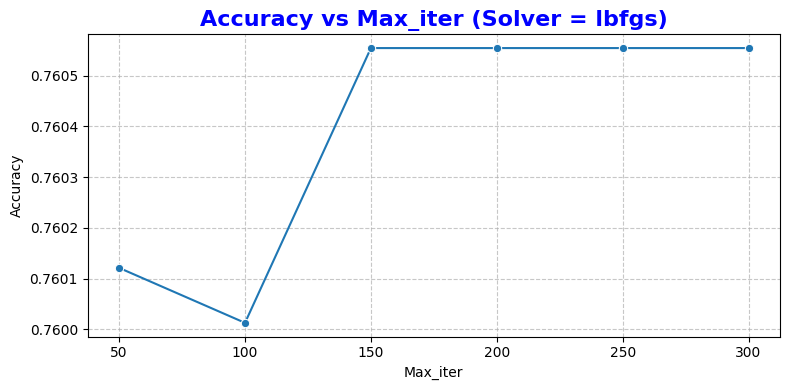

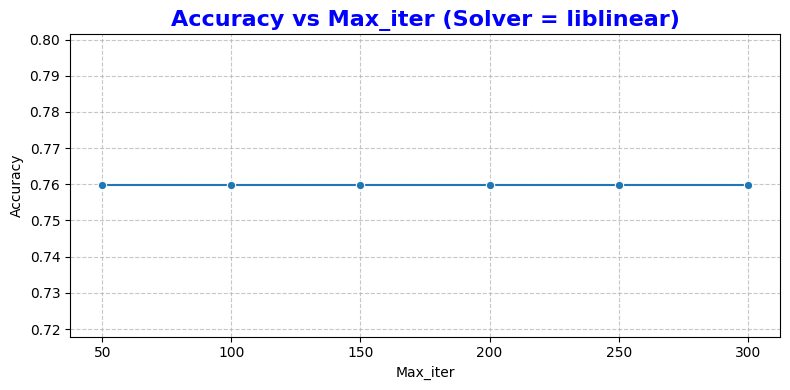

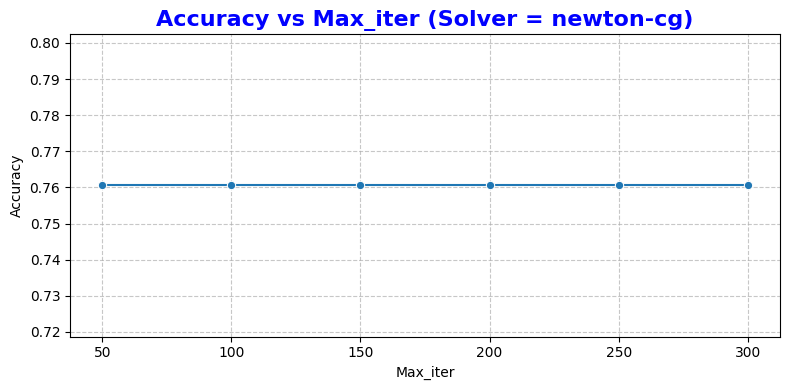

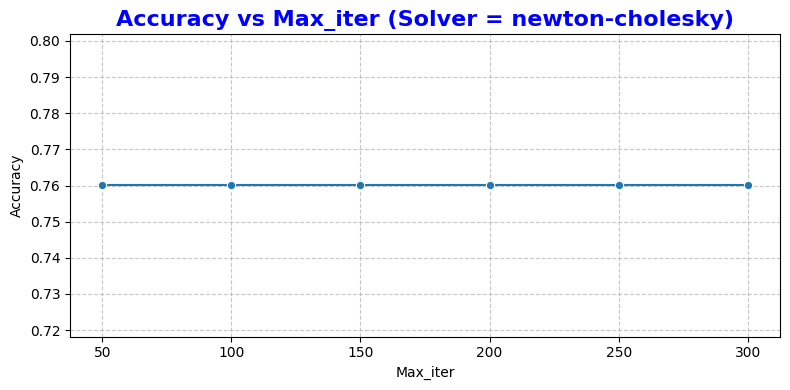

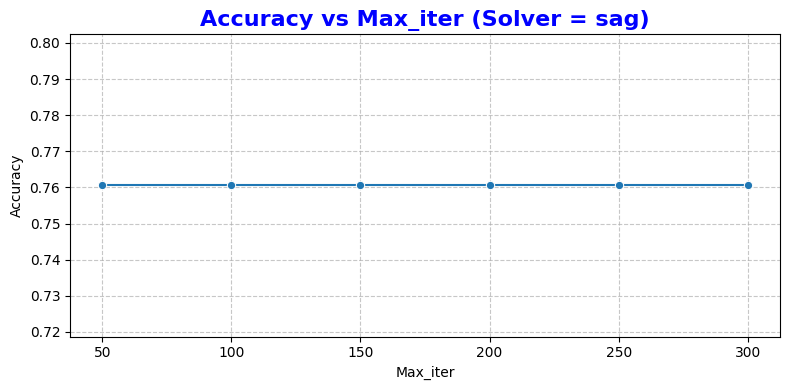

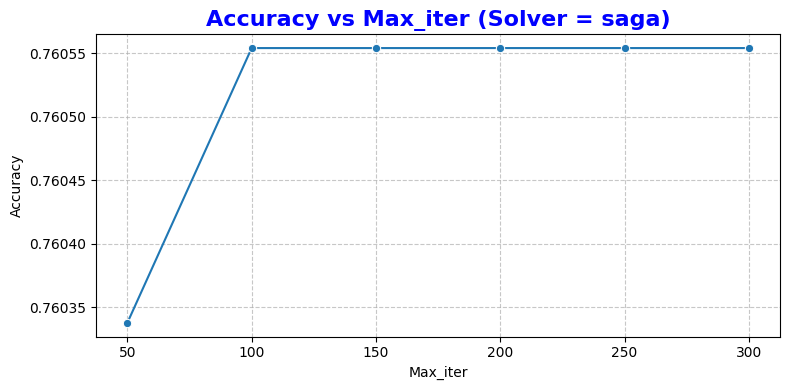

In [ ]:
# Accuracy vs Max_iter (with separate plots for each Solver)
for solver in solvers:
    plt.figure(figsize=(8, 4))
    sns.lineplot(x='Max_iter', y='Accuracy', marker='o', data=results_df[results_df['Solver'] == solver])

    plt.title(f'Accuracy vs Max_iter (Solver = {solver})', fontsize=16, weight='bold', color='blue')
    plt.ylabel('Accuracy')
    plt.xlabel('Max_iter')
    plt.xticks(max_iters)

    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Model Training with LOGISTIC REGRESSION (Target: PatientStatus) <font color='blue'>

## Split Dataset

In [ ]:
print("Shape of preprocessed_df:")
print(scaled_df.shape)

Shape of preprocessed_df:
(46187, 40)



```
EcYear_2022                   : -0.0058
CallTime_Day                  : 0.0004
CarsInvolved                  : 0.0054
CartInvovled                  : 0.0064
Cause_Wrong Turn              : 0.0070
EcYear_2021                   : 0.0098
```



In [ ]:
# for target='PatientStatus' these columns have correlation value of (<0.01)
columns_to_drop = [
    # 'EmergencyArea_Encoded',
    'CarsInvolved',
    'CartInvovled',
    'Cause_Wrong Turn',
]

In [ ]:
from sklearn.model_selection import train_test_split

X_patient_status = scaled_df.drop(columns_to_drop + ['PatientStatus'], axis=1)
y_patient_status = scaled_df['PatientStatus']  # Target: 'PatientStatus'

# Split into train (80%) and test (20%) sets
X_train_patient_status, X_test_patient_status, y_train_patient_status, y_test_patient_status = train_test_split(
    X_patient_status, y_patient_status, test_size=0.2, random_state=42
)

In [ ]:
# Print the shapes of the resulting sets to verify
print("\nPatient Status Model Data Shapes:")
print("=" * 50)
print(f"{'Dataset':<15} {'Features (X)':<25} {'Labels (y)':<15}")
print("=" * 50)
print(f"{'Train set':<15} {str(X_train_patient_status.shape):<25} {str(y_train_patient_status.shape):<15}")
print(f"{'Test set':<15} {str(X_test_patient_status.shape):<25} {str(y_test_patient_status.shape):<15}")
print("=" * 50)


Patient Status Model Data Shapes:
Dataset         Features (X)              Labels (y)     
Train set       (36949, 36)               (36949,)       
Test set        (9238, 36)                (9238,)        


In [ ]:
# Print the size (number of rows) for each set
print("\nPatient Status Model Data Sizes:")
print("=" * 50)
print(f"{'Dataset':<15} {'Number of Rows':<20} {'Number of Features'}")
print("=" * 50)
print(f"{'Train set':<15} {X_train_patient_status.shape[0]:<20} {X_train_patient_status.shape[1]}")
print(f"{'Test set':<15} {X_test_patient_status.shape[0]:<20} {X_test_patient_status.shape[1]}")
print("=" * 50)


Patient Status Model Data Sizes:
Dataset         Number of Rows       Number of Features
Train set       36949                36
Test set        9238                 36


## Resample Train Data

In [ ]:
# # Resample PatientStatus
# print("\nBefore Resampling (PatientStatus):", Counter(y_train_patient_status))


Before Resampling (PatientStatus): Counter({1.0: 19000, 0.0: 17476, 2.0: 473})


In [ ]:
# X_train_patient_status, y_train_patient_status = smote.fit_resample(X_train_patient_status, y_train_patient_status)
# print("After Resampling (PatientStatus):", Counter(y_train_patient_status))

After Resampling (PatientStatus): Counter({0.0: 19000, 1.0: 19000, 2.0: 19000})


## Define Train and Test functions

Already Defined in the previous section

## Train and Evaluate models

In [ ]:
# Train model and store evaluation results

import warnings
warnings.filterwarnings("ignore") # suppress warnings

results_LR_PatientStatus = []
for solver in solvers:
    for max_iter in max_iters:
        print(f'Training model... Solver: {solver:<16} Max_iter: {max_iter}')

        accuracy, precision, recall, f1, cm = train_and_evaluate_LR(
            X_train_patient_status, y_train_patient_status, X_test_patient_status, y_test_patient_status, solver, max_iter
        )

        results_LR_PatientStatus.append([solver, max_iter, accuracy, precision, recall, f1, cm])

print("\nStored results for all solver-max_iter combinations")

Training model... Solver: lbfgs            Max_iter: 50
Training model... Solver: lbfgs            Max_iter: 100
Training model... Solver: lbfgs            Max_iter: 150
Training model... Solver: lbfgs            Max_iter: 200
Training model... Solver: lbfgs            Max_iter: 250
Training model... Solver: lbfgs            Max_iter: 300
Training model... Solver: liblinear        Max_iter: 50
Training model... Solver: liblinear        Max_iter: 100
Training model... Solver: liblinear        Max_iter: 150
Training model... Solver: liblinear        Max_iter: 200
Training model... Solver: liblinear        Max_iter: 250
Training model... Solver: liblinear        Max_iter: 300
Training model... Solver: newton-cg        Max_iter: 50
Training model... Solver: newton-cg        Max_iter: 100
Training model... Solver: newton-cg        Max_iter: 150
Training model... Solver: newton-cg        Max_iter: 200
Training model... Solver: newton-cg        Max_iter: 250
Training model... Solver: newton-c

## View Result

In [ ]:
# Convert results to a DataFrame for better display
results_df = pd.DataFrame(results_LR_PatientStatus, columns=['Solver', 'Max_iter', 'Accuracy', 'Precision', 'Recall', 'F1', 'Confusion Matrix'])

In [ ]:
# Format floats to 4 decimal places
pd.set_option('display.float_format', '{:.4f}'.format)
results_df

,Solver,Max_iter,Accuracy,Precision,Recall,F1,Confusion Matrix
0,lbfgs,50,0.7686,0.7676,0.7686,0.7659,"[[3542, 794, 0], [1221, 3544, 23], [0, 100, 14]]"
1,lbfgs,100,0.7692,0.7687,0.7692,0.7666,"[[3546, 790, 0], [1223, 3545, 20], [0, 99, 15]]"
2,lbfgs,150,0.7687,0.7684,0.7687,0.7661,"[[3543, 793, 0], [1227, 3542, 19], [0, 98, 16]]"
3,lbfgs,200,0.7689,0.7685,0.7689,0.7663,"[[3543, 793, 0], [1224, 3544, 20], [0, 98, 16]]"
4,lbfgs,250,0.7689,0.7685,0.7689,0.7663,"[[3543, 793, 0], [1224, 3544, 20], [0, 98, 16]]"
5,lbfgs,300,0.7689,0.7685,0.7689,0.7663,"[[3543, 793, 0], [1224, 3544, 20], [0, 98, 16]]"
6,liblinear,50,0.7654,0.7680,0.7654,0.7623,"[[3545, 791, 0], [1271, 3512, 5], [0, 100, 14]]"
7,liblinear,100,0.7654,0.7680,0.7654,0.7623,"[[3545, 791, 0], [1271, 3512, 5], [0, 100, 14]]"
8,liblinear,150,0.7654,0.7680,0.7654,0.7623,"[[3545, 791, 0], [1271, 3512, 5], [0, 100, 14]]"
9,liblinear,200,0.7654,0.7680,0.7654,0.7623,"[[3545, 791, 0], [1271, 3512, 5], [0, 100, 14]]"


In [ ]:
# results(sorted by accuracy)
results_df_sorted = results_df.sort_values(by='Accuracy', ascending=False)
results_df_sorted = results_df_sorted.drop('Confusion Matrix', axis=1)

print(results_df_sorted)

             Solver  Max_iter  Accuracy  Precision  Recall     F1
1             lbfgs       100    0.7692     0.7687  0.7692 0.7666
3             lbfgs       200    0.7689     0.7685  0.7689 0.7663
4             lbfgs       250    0.7689     0.7685  0.7689 0.7663
5             lbfgs       300    0.7689     0.7685  0.7689 0.7663
30             saga        50    0.7689     0.7684  0.7689 0.7662
31             saga       100    0.7688     0.7682  0.7688 0.7661
24              sag        50    0.7688     0.7682  0.7688 0.7661
35             saga       300    0.7687     0.7681  0.7687 0.7660
15        newton-cg       200    0.7687     0.7681  0.7687 0.7660
26              sag       150    0.7687     0.7681  0.7687 0.7660
27              sag       200    0.7687     0.7681  0.7687 0.7660
28              sag       250    0.7687     0.7681  0.7687 0.7660
17        newton-cg       300    0.7687     0.7681  0.7687 0.7660
16        newton-cg       250    0.7687     0.7681  0.7687 0.7660
29        

In [ ]:
# save result
result_df_LR_PatientStatus = results_df.copy()

## Plot Confusion Matrices

### For each solver

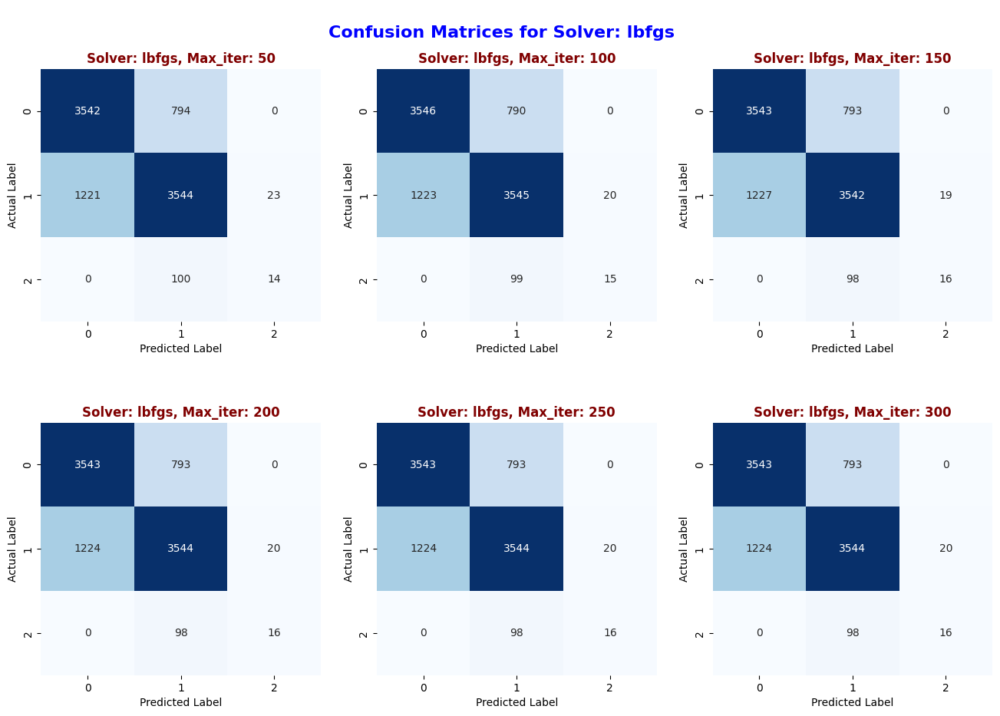

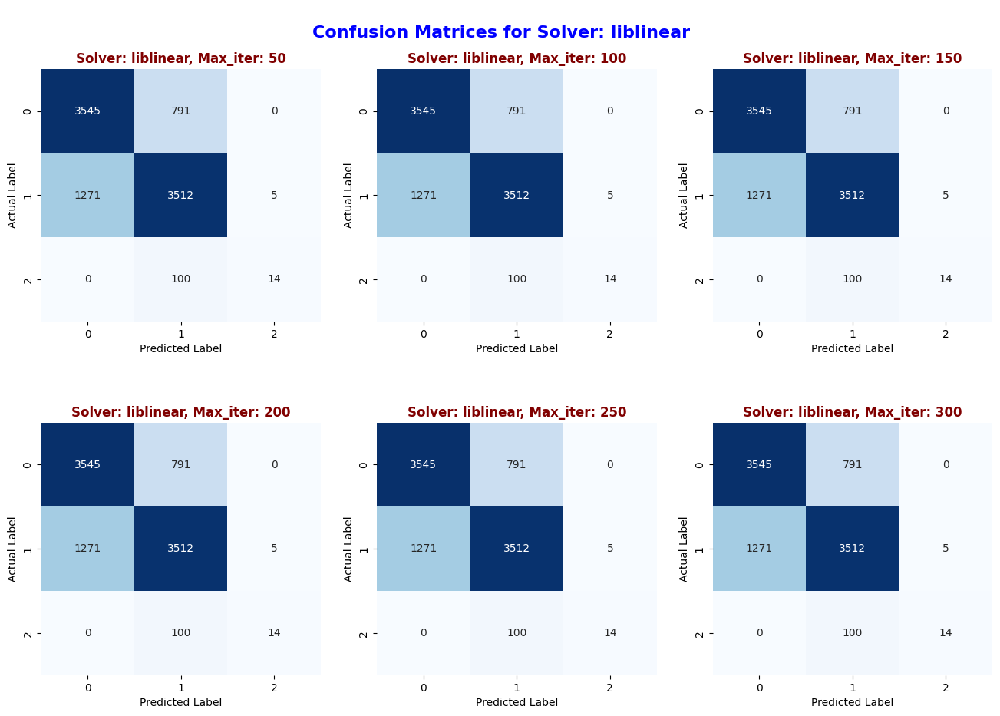

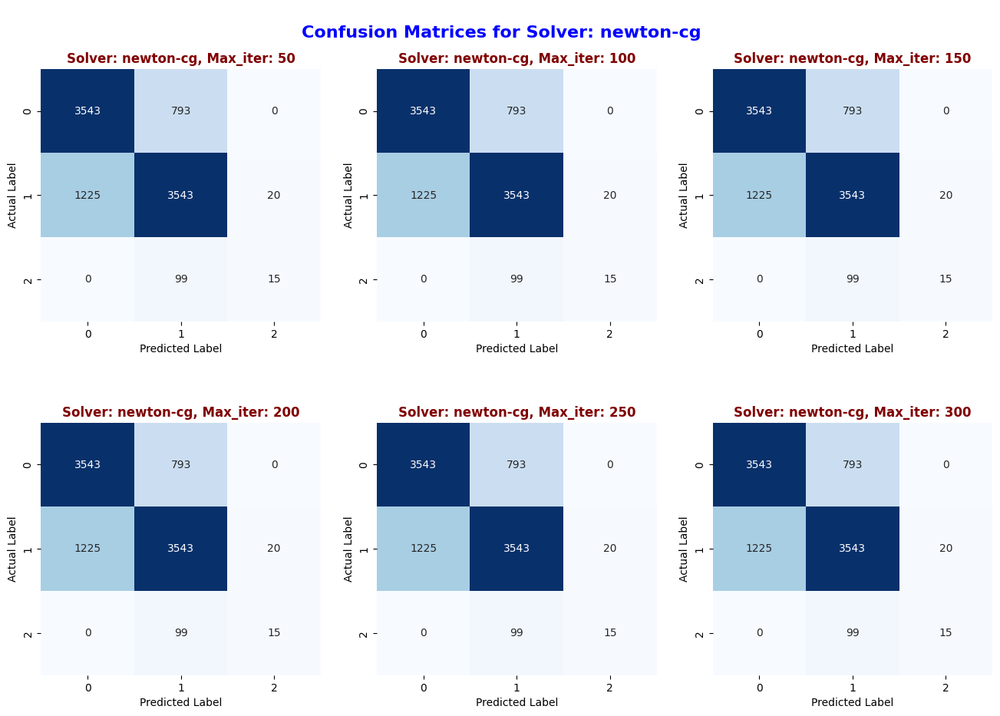

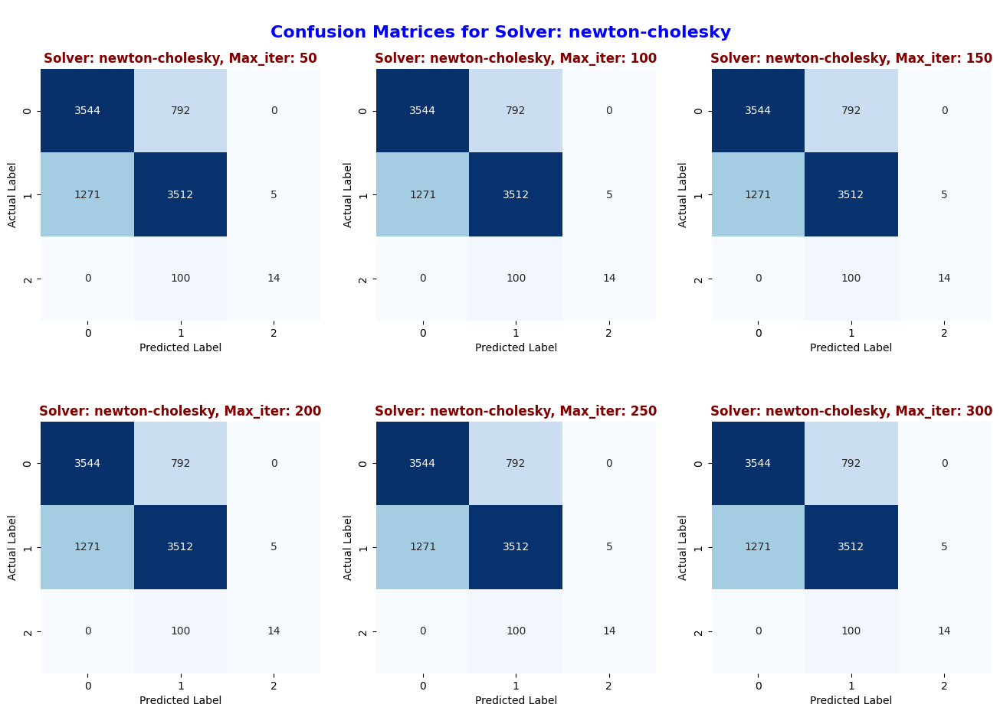

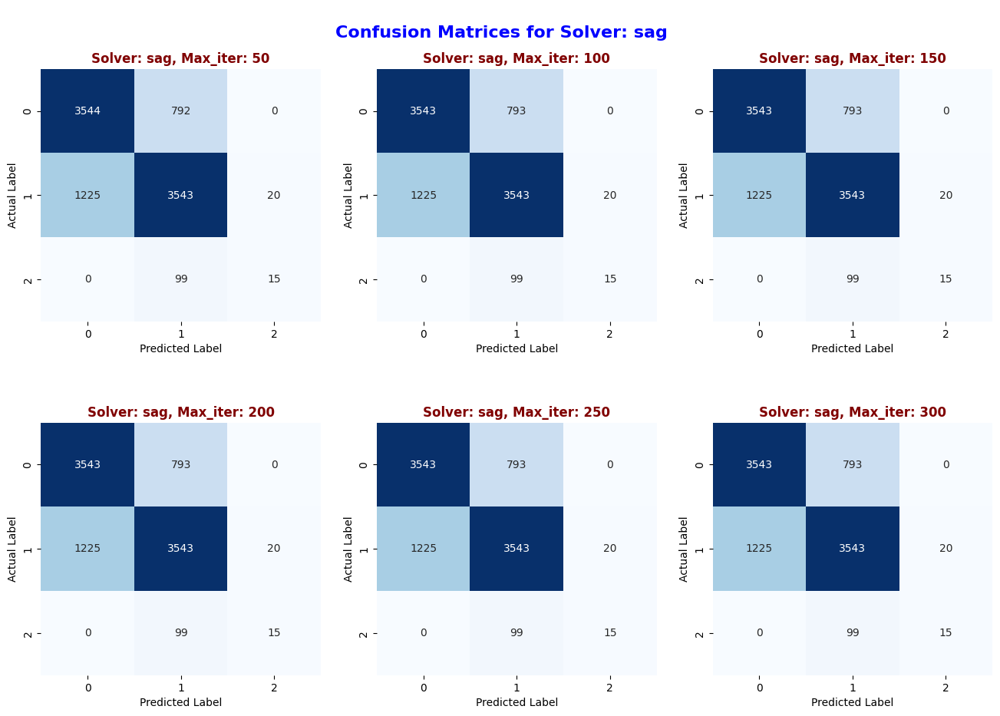

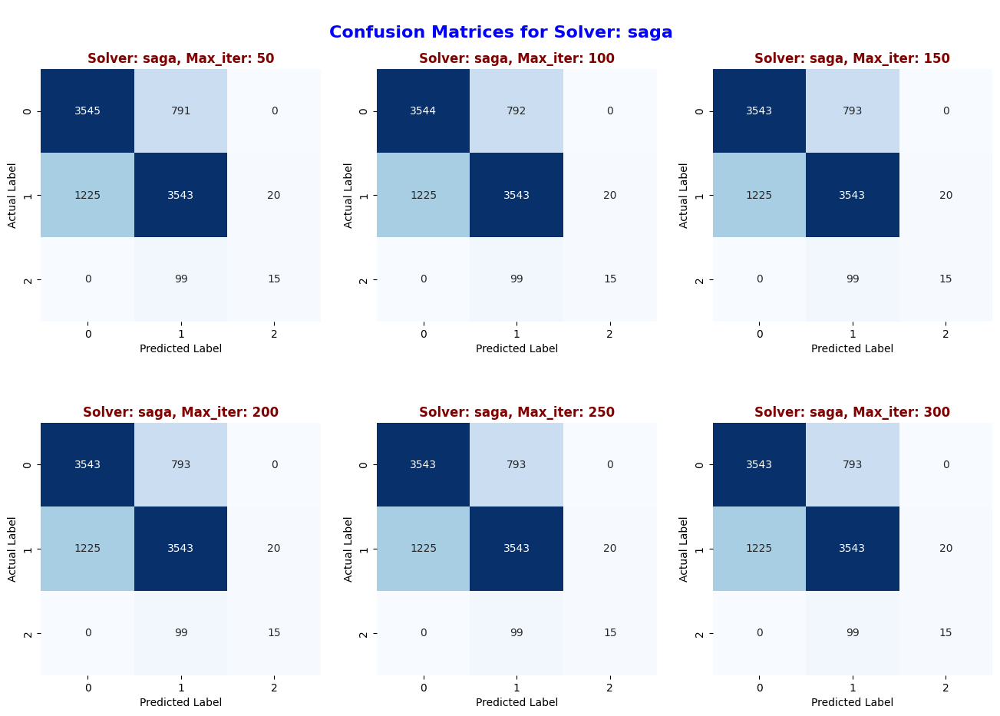

In [ ]:
plot_solver_max_iter_comparison()

### For each max_iter

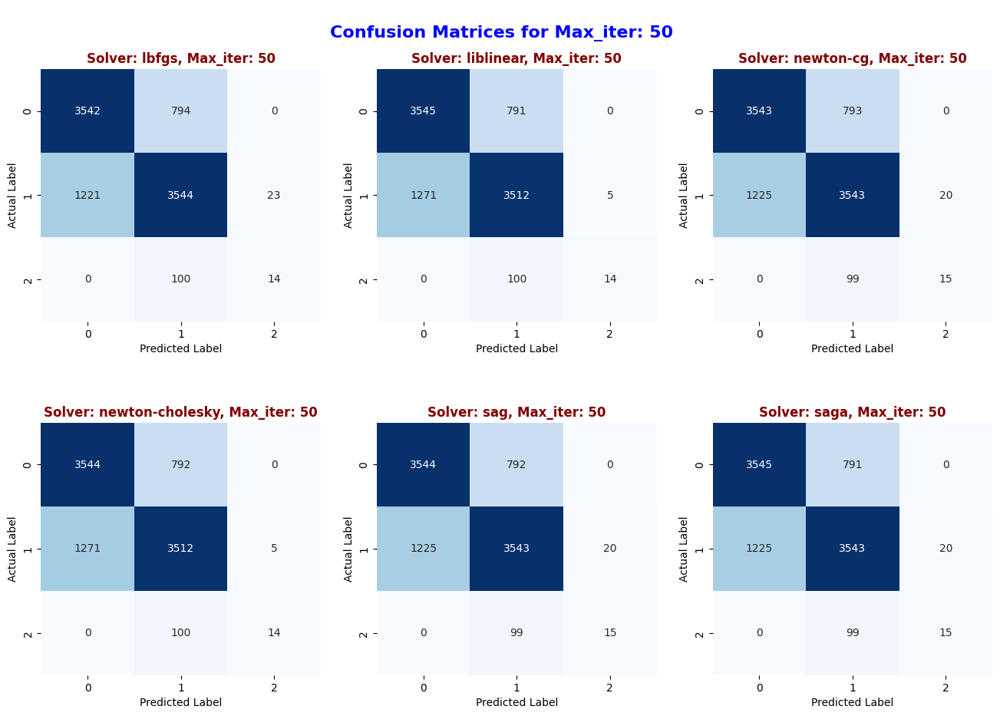

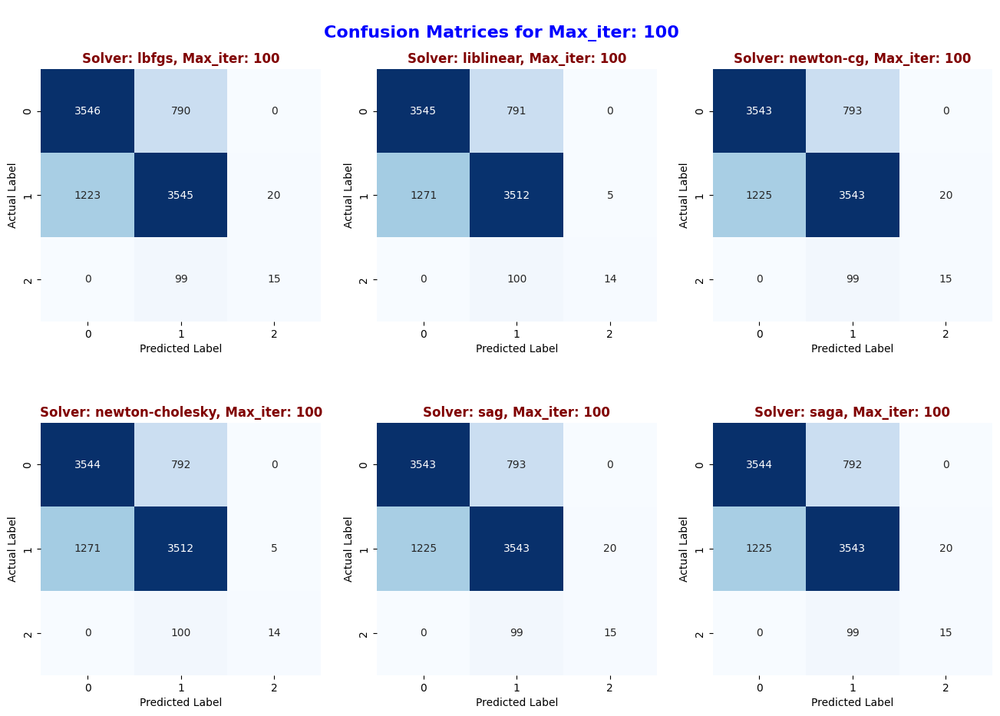

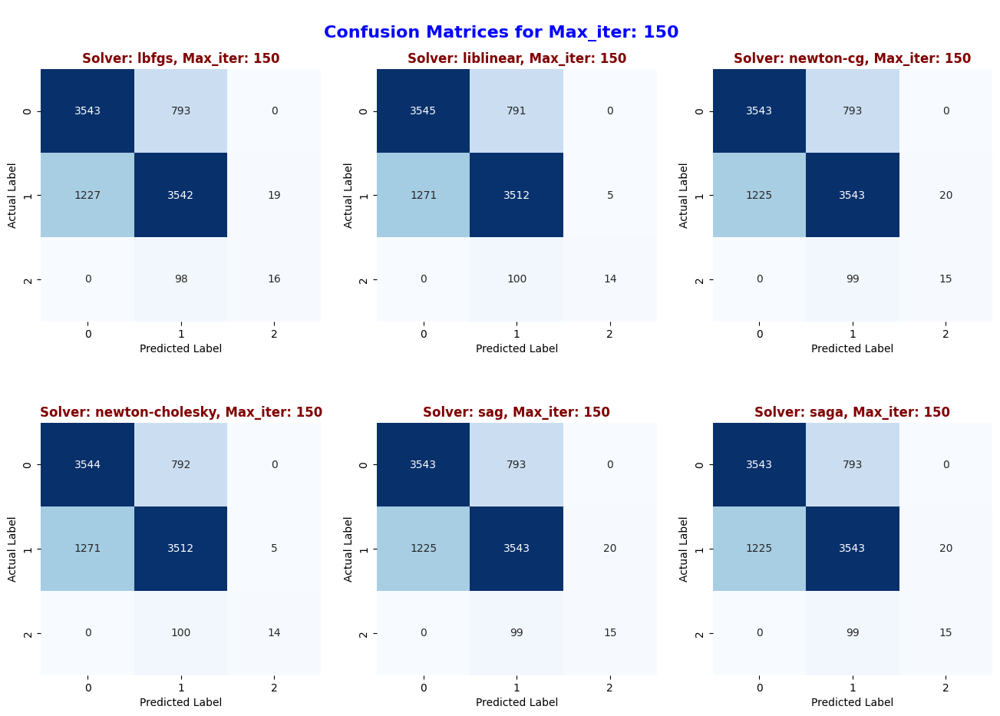

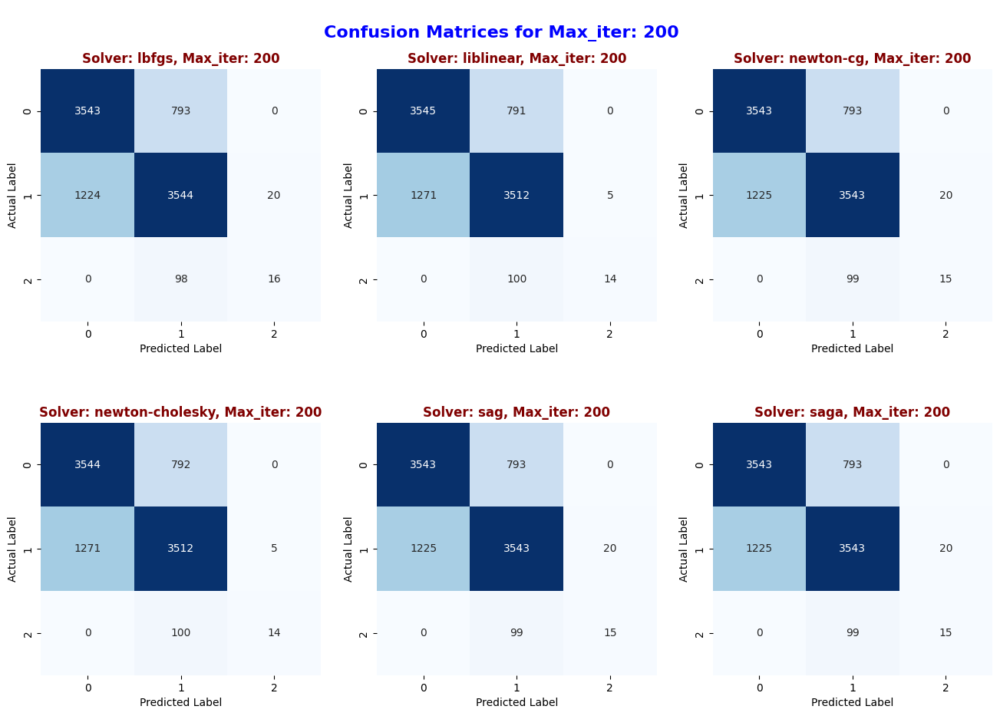

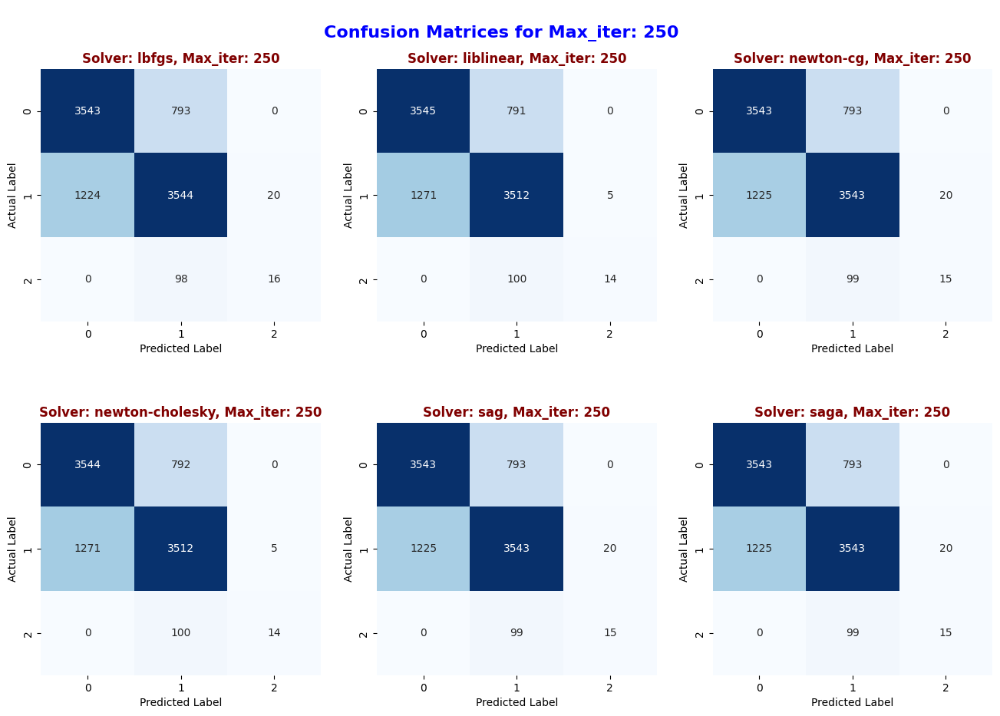

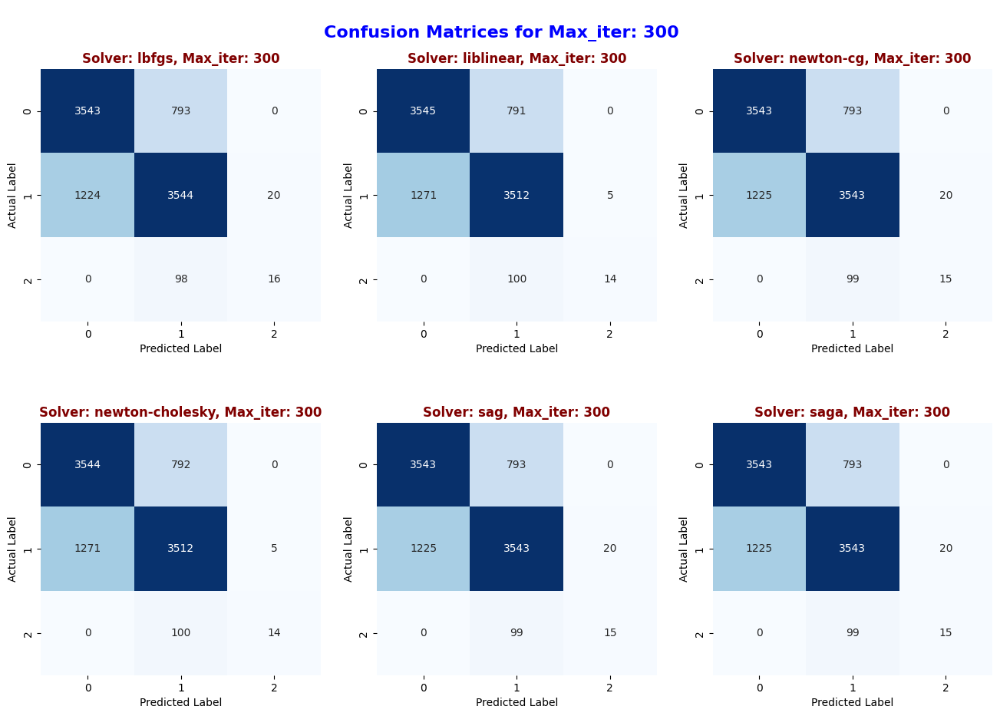

In [ ]:
plot_max_iter_solver_comparison()

## Learning Curves

### Accuracy vs Solver

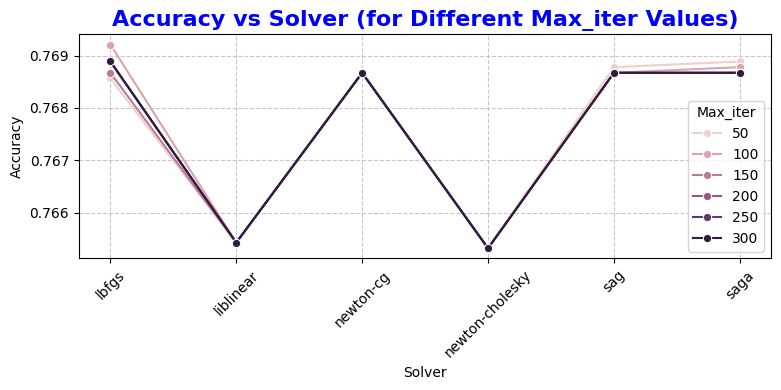

In [ ]:
# Accuracy vs Solver (single plot with different lines for each max_iter)
plt.figure(figsize=(8, 4))

sns.lineplot(x='Solver', y='Accuracy', hue='Max_iter', marker='o', data=results_df)

plt.title('Accuracy vs Solver (for Different Max_iter Values)', fontsize=16, weight='bold', color='blue')
plt.ylabel('Accuracy')
plt.xlabel('Solver')
plt.xticks(rotation=45)

plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Max_iter', loc='best')
plt.tight_layout()
plt.show()

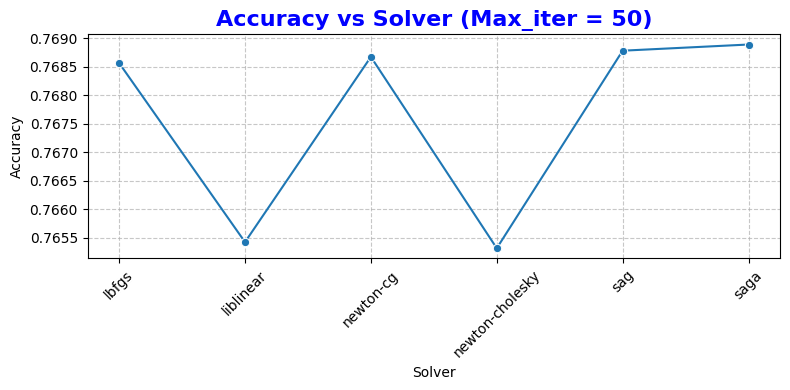

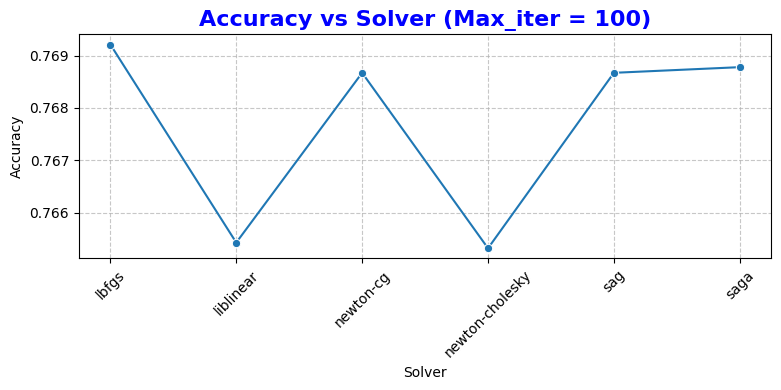

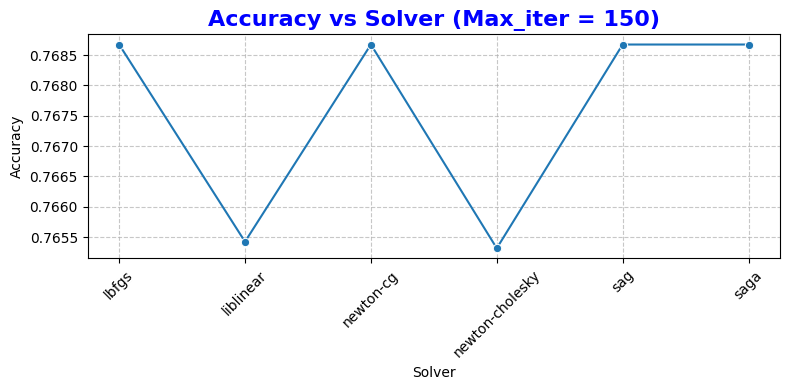

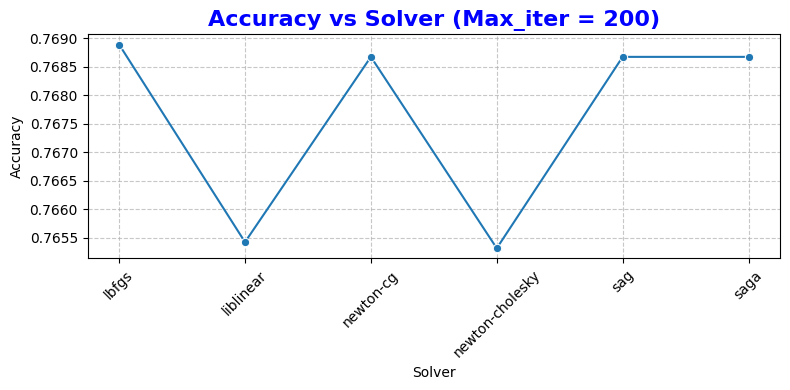

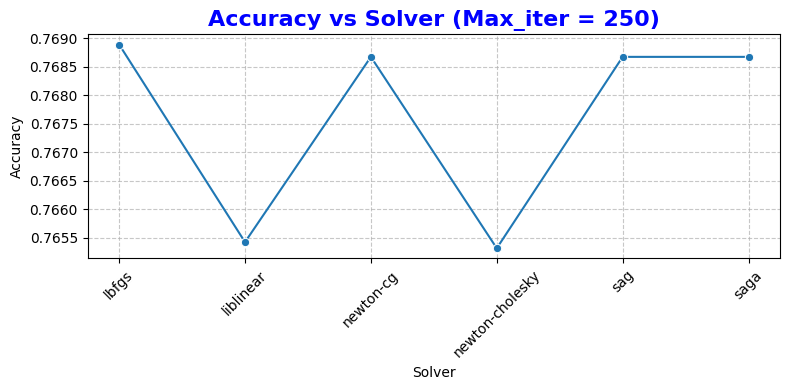

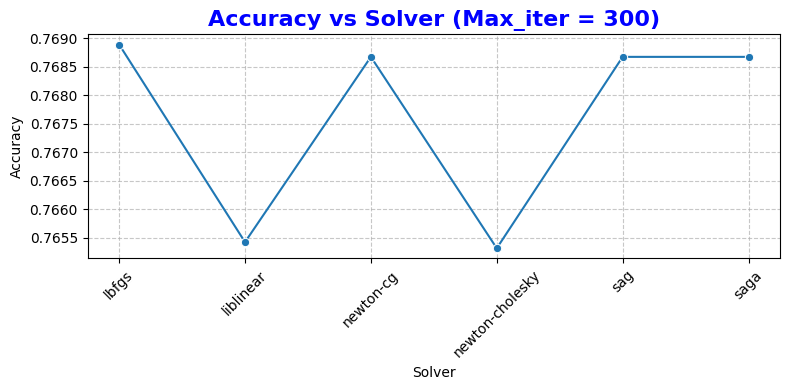

In [ ]:
# Accuracy vs Solver (with separate plots for each Max_iter)
for max_iter in max_iters:
    plt.figure(figsize=(8, 4))
    sns.lineplot(x='Solver', y='Accuracy', marker='o', data=results_df[results_df['Max_iter'] == max_iter])

    plt.title(f'Accuracy vs Solver (Max_iter = {max_iter})', fontsize=16, weight='bold', color='blue')
    plt.ylabel('Accuracy')
    plt.xlabel('Solver')
    plt.xticks(rotation=45)

    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

### Accuracy vs Max_iter

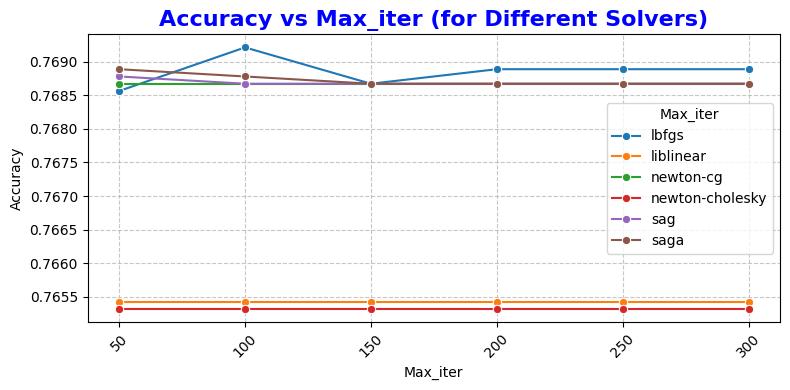

In [ ]:
# Accuracy vs Solver (single plot with different lines for each max_iter)
plt.figure(figsize=(8, 4))

sns.lineplot(x='Max_iter', y='Accuracy', hue='Solver', marker='o', data=results_df)

plt.title('Accuracy vs Max_iter (for Different Solvers)', fontsize=16, weight='bold', color='blue')
plt.ylabel('Accuracy')
plt.xlabel('Max_iter')
plt.xticks(rotation=45)

plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Max_iter', loc='best')
plt.tight_layout()
plt.show()

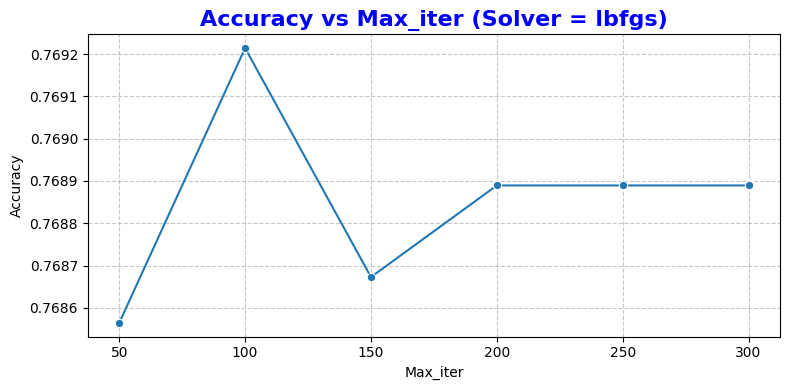

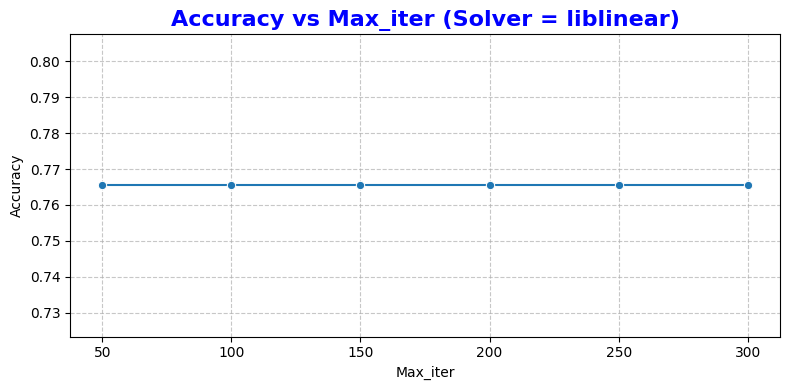

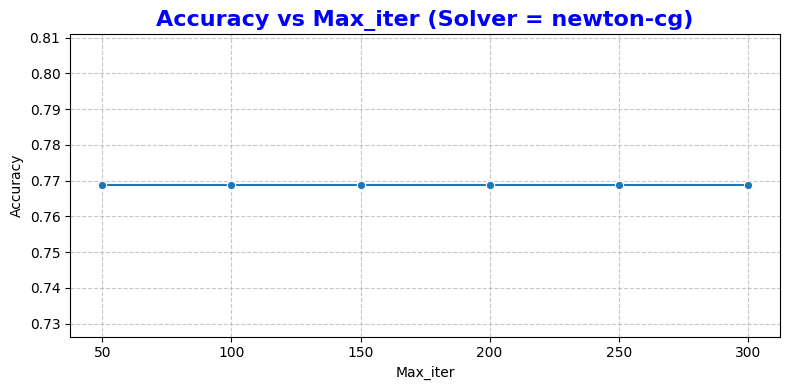

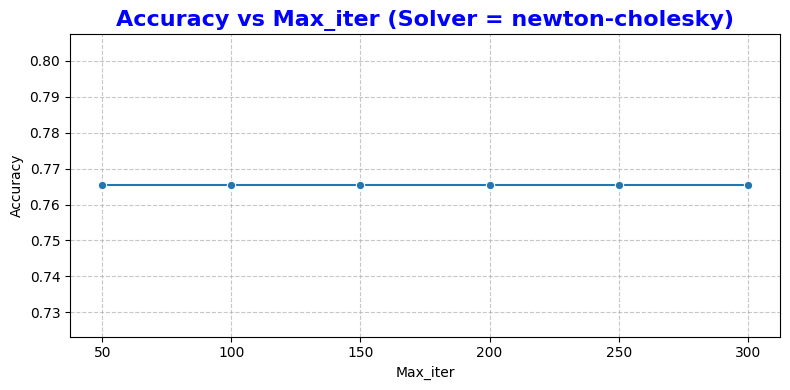

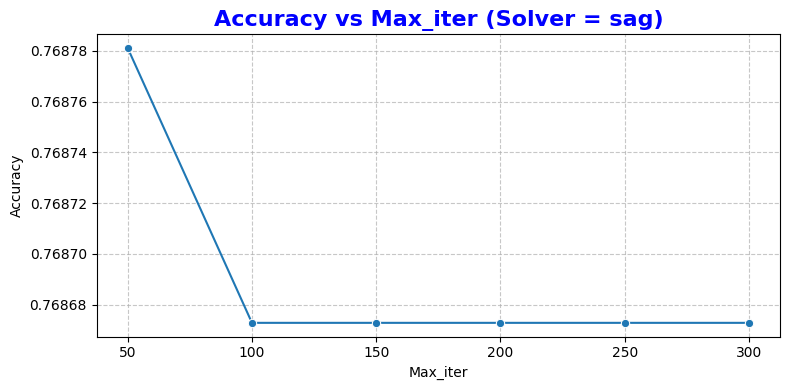

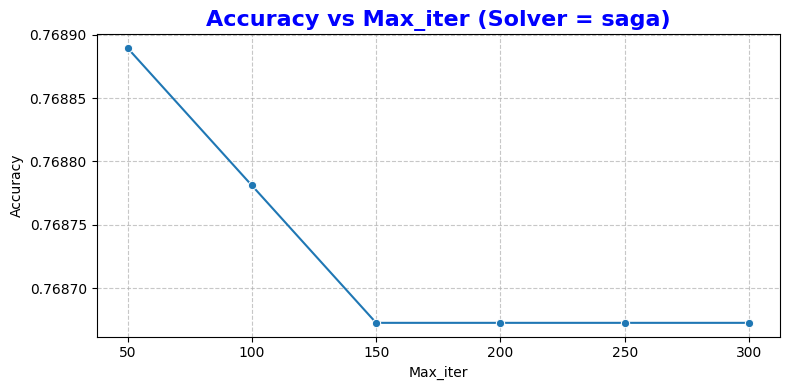

In [ ]:
# Accuracy vs Max_iter (with separate plots for each Solver)
for solver in solvers:
    plt.figure(figsize=(8, 4))
    sns.lineplot(x='Max_iter', y='Accuracy', marker='o', data=results_df[results_df['Solver'] == solver])

    plt.title(f'Accuracy vs Max_iter (Solver = {solver})', fontsize=16, weight='bold', color='blue')
    plt.ylabel('Accuracy')
    plt.xlabel('Max_iter')
    plt.xticks(max_iters)

    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Model Training with DECISION TREE (Target: InjuryType) <font color='blue'> **[PHASE-3]**

## Define Train and Test functions

In [ ]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
# Function to train, test, and evaluate a Decision Tree model
def train_and_evaluate_DT(X_train, y_train, X_test, y_test, max_depth):
    model = DecisionTreeClassifier(max_depth=max_depth, random_state=42)
    model.fit(X_train, y_train)

    # Predict on test set
    y_pred = model.predict(X_test)

    # Calculate performance metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted',zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted',zero_division=0)
    f1 = f1_score(y_test, y_pred, average='weighted',zero_division=0)
    cm = confusion_matrix(y_test, y_pred)

    return accuracy, precision, recall, f1, cm

## Train and Evaluate models

In [ ]:
# Define max_depth values to evaluate
max_depths = [4, 5, 6, 7, 8, 9]

In [ ]:
# Store results in a list for easy formatting later
results_DT_InjuryType = []

# Train and evaluate Decision Tree models for each max_depth
for max_depth in max_depths:
    print(f'Training Decision Tree model... Max_depth: {max_depth}')

    (accuracy, precision, recall, f1, cm) = train_and_evaluate_DT(X_train_injury, y_train_injury, X_test_injury, y_test_injury, max_depth)

    # Append results for each configuration
    results_DT_InjuryType.append([max_depth, accuracy, precision, recall, f1, cm])

print("\nStored results for all max_depth values")

Training Decision Tree model... Max_depth: 4
Training Decision Tree model... Max_depth: 5
Training Decision Tree model... Max_depth: 6
Training Decision Tree model... Max_depth: 7
Training Decision Tree model... Max_depth: 8
Training Decision Tree model... Max_depth: 9

Stored results for all max_depth values


## View Result

In [ ]:
# Convert results to a DataFrame for better display
results_df = pd.DataFrame(results_DT_InjuryType, columns=['Max_depth', 'Accuracy', 'Precision', 'Recall', 'F1', 'Confusion Matrix'])

In [ ]:
# Format floats to 4 decimal places
pd.set_option('display.float_format', '{:.4f}'.format)
results_df

,Max_depth,Accuracy,Precision,Recall,F1,Confusion Matrix
0,4,0.7604,0.6237,0.7604,0.6647,"[[6946, 0, 0, 2, 0], [1371, 0, 0, 1, 0], [130,..."
1,5,0.7603,0.6896,0.7603,0.6785,"[[6882, 64, 0, 2, 0], [1300, 71, 0, 1, 0], [12..."
2,6,0.7589,0.6814,0.7589,0.6715,"[[6900, 46, 0, 2, 0], [1334, 37, 0, 1, 0], [12..."
3,7,0.7568,0.6800,0.7568,0.6741,"[[6860, 83, 0, 5, 0], [1310, 60, 0, 2, 0], [12..."
4,8,0.7544,0.6836,0.7544,0.6811,"[[6787, 153, 0, 7, 1], [1256, 110, 2, 4, 0], [..."
5,9,0.7507,0.6699,0.7507,0.6764,"[[6772, 154, 5, 16, 1], [1268, 89, 4, 11, 0], ..."


In [ ]:
# results(sorted by accuracy)
results_df_sorted = results_df.sort_values(by='Accuracy', ascending=False)
results_df_sorted = results_df_sorted.drop('Confusion Matrix', axis=1)

print(results_df_sorted)

   Max_depth  Accuracy  Precision  Recall     F1
0          4    0.7604     0.6237  0.7604 0.6647
1          5    0.7603     0.6896  0.7603 0.6785
2          6    0.7589     0.6814  0.7589 0.6715
3          7    0.7568     0.6800  0.7568 0.6741
4          8    0.7544     0.6836  0.7544 0.6811
5          9    0.7507     0.6699  0.7507 0.6764


In [ ]:
# save result
result_df_DT_InjuryType = results_df.copy()

## Plot Confusion Matrices

In [ ]:
# Plot confusion matrices for each max_depth
def plot_confusion_matrices_DT():
    fig, axes = plt.subplots(2, 3, figsize=(16, 10))
    fig.suptitle('\nConfusion Matrices for Decision Tree Models with Different Max_depth\n', fontsize=16, weight='bold', color='blue')

    for i, max_depth in enumerate(max_depths):
        cm = results_df[results_df['Max_depth'] == max_depth]['Confusion Matrix'].values[0]
        ax = axes[i // 3, i % 3]

        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, ax=ax)
        ax.set_title(f'Max_depth: {max_depth}')
        ax.set_xlabel('Predicted Label')
        ax.set_ylabel('Actual Label')

    plt.subplots_adjust(hspace=0.4, top=0.9)
    plt.show()

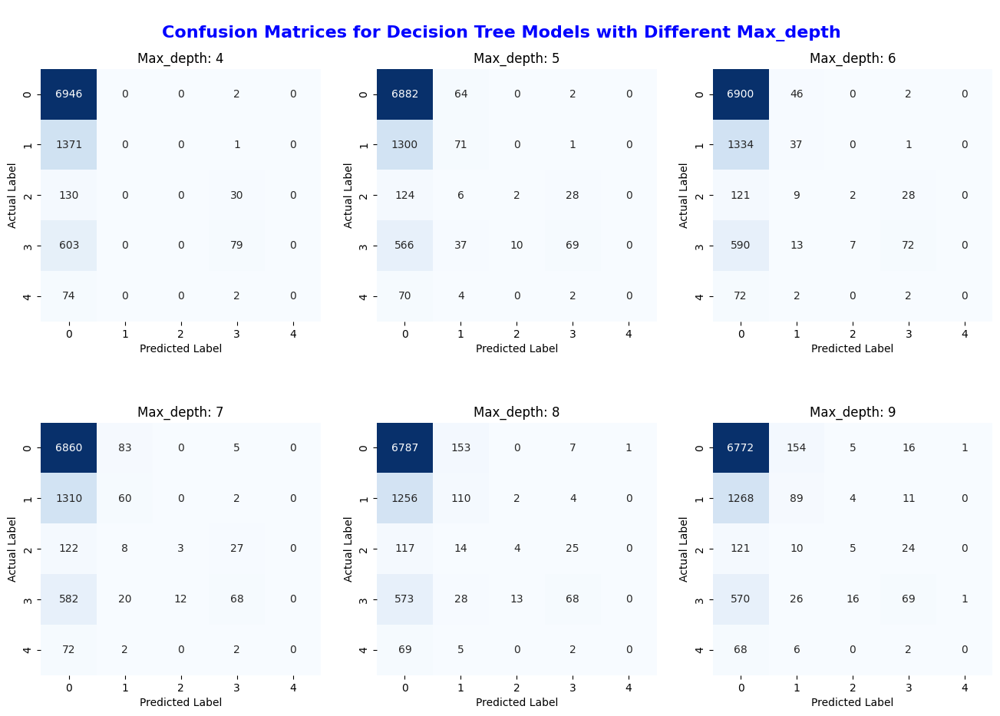

In [ ]:
plot_confusion_matrices_DT()

## Learning Curves

Accuracy (y-axis) VS Max_depth (x-axis)

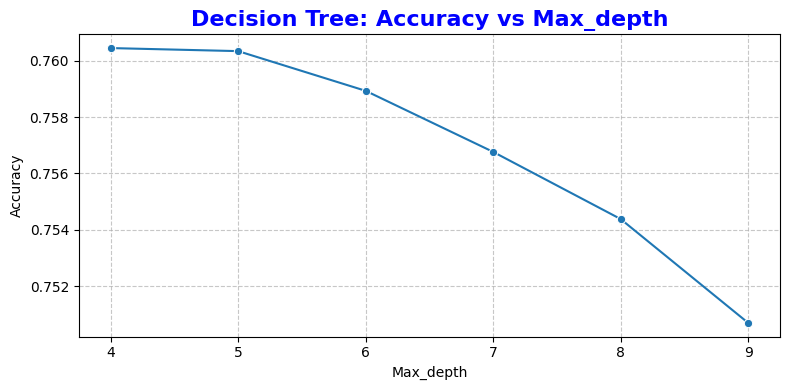

In [ ]:
# Plot Accuracy vs Max_depth
plt.figure(figsize=(8, 4))

sns.lineplot(x='Max_depth', y='Accuracy', marker='o', data=results_df)

plt.title('Decision Tree: Accuracy vs Max_depth', fontsize=16, weight='bold', color='blue')
plt.ylabel('Accuracy')
plt.xlabel('Max_depth')
plt.xticks(max_depths)

plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Model Training with DECISION TREE (Target: PatientStatus)

## Define Train and Test functions

Already defined earlier

## Train and Evaluate models

In [ ]:
# Define max_depth values to evaluate
max_depths = [4, 5, 6, 7, 8, 9]

In [ ]:
# Store results in a list for easy formatting later
results_DT_PatientStatus = []

# Train and evaluate Decision Tree models for each max_depth
for max_depth in max_depths:
    print(f'Training Decision Tree model... Max_depth: {max_depth}')

    (accuracy, precision, recall, f1, cm) = train_and_evaluate_DT(X_train_patient_status, y_train_patient_status, X_test_patient_status, y_test_patient_status, max_depth)

    # Append results for each configuration
    results_DT_PatientStatus.append([max_depth, accuracy, precision, recall, f1, cm])

print("\nStored results for all max_depth values")

Training Decision Tree model... Max_depth: 4
Training Decision Tree model... Max_depth: 5
Training Decision Tree model... Max_depth: 6
Training Decision Tree model... Max_depth: 7
Training Decision Tree model... Max_depth: 8
Training Decision Tree model... Max_depth: 9

Stored results for all max_depth values


## View Result

In [ ]:
# Convert results to a DataFrame for better display
results_df = pd.DataFrame(results_DT_PatientStatus, columns=['Max_depth', 'Accuracy', 'Precision', 'Recall', 'F1', 'Confusion Matrix'])

In [ ]:
# Format floats to 4 decimal places
pd.set_option('display.float_format', '{:.4f}'.format)
results_df

,Max_depth,Accuracy,Precision,Recall,F1,Confusion Matrix
0,4,0.7641,0.7644,0.7641,0.7630,"[[3384, 952, 0], [1136, 3639, 13], [1, 77, 36]]"
1,5,0.7760,0.7840,0.7760,0.7735,"[[3717, 619, 0], [1359, 3424, 5], [1, 85, 28]]"
2,6,0.7793,0.7790,0.7793,0.7784,"[[3419, 917, 0], [1032, 3738, 18], [1, 71, 42]]"
3,7,0.7891,0.7887,0.7891,0.7882,"[[3449, 887, 0], [971, 3800, 17], [1, 72, 41]]"
4,8,0.7942,0.7970,0.7942,0.7932,"[[3676, 660, 0], [1147, 3617, 24], [1, 69, 44]]"
5,9,0.7977,0.7987,0.7977,0.7967,"[[3617, 719, 0], [1058, 3711, 19], [1, 72, 41]]"


In [ ]:
# results(sorted by accuracy)
results_df_sorted = results_df.sort_values(by='Accuracy', ascending=False)
results_df_sorted = results_df_sorted.drop('Confusion Matrix', axis=1)

print(results_df_sorted)

   Max_depth  Accuracy  Precision  Recall     F1
5          9    0.7977     0.7987  0.7977 0.7967
4          8    0.7942     0.7970  0.7942 0.7932
3          7    0.7891     0.7887  0.7891 0.7882
2          6    0.7793     0.7790  0.7793 0.7784
1          5    0.7760     0.7840  0.7760 0.7735
0          4    0.7641     0.7644  0.7641 0.7630


In [ ]:
# save result
result_df_DT_PatientStatus = results_df.copy()

## Plot Confusion Matrices

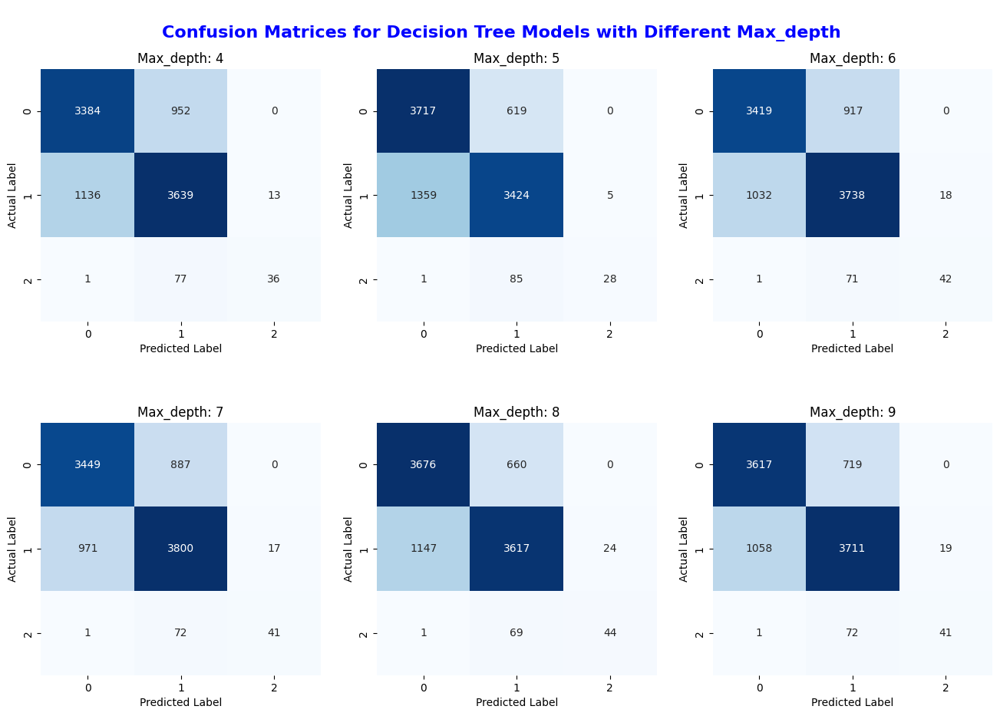

In [ ]:
# Call the function to plot confusion matrices
plot_confusion_matrices_DT()

## Learning Curves

Accuracy (y-axis) VS Max_depth (x-axis)

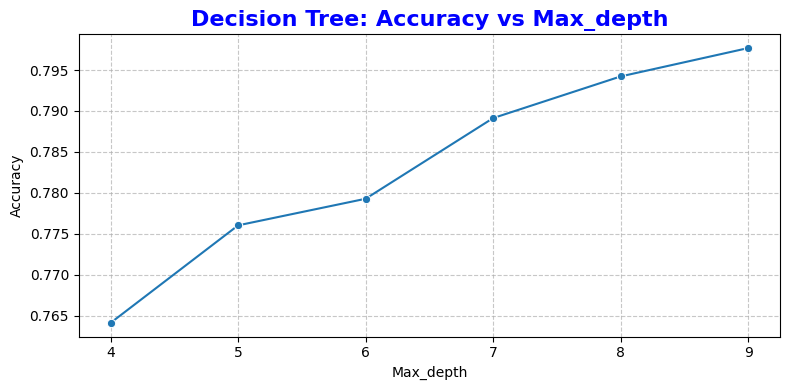

In [ ]:
# Plot Accuracy vs Max_depth
plt.figure(figsize=(8, 4))

sns.lineplot(x='Max_depth', y='Accuracy', marker='o', data=results_df)

plt.title('Decision Tree: Accuracy vs Max_depth', fontsize=16, weight='bold', color='blue')
plt.ylabel('Accuracy')
plt.xlabel('Max_depth')
plt.xticks(max_depths)

plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Model Training with SVM (Target: InjuryType)

## Define Train and Test functions

In [ ]:
from sklearn.svm import SVC

In [ ]:
# Function to train, test, and evaluate an SVM model
def train_and_evaluate_SVM(X_train, y_train, X_test, y_test, kernel):
    model = SVC(kernel=kernel, random_state=42)
    model.fit(X_train, y_train)

    # Predict on test set
    y_pred = model.predict(X_test)

    # Calculate performance metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)
    cm = confusion_matrix(y_test, y_pred)

    return accuracy, precision, recall, f1, cm

## Train and Evaluate models

In [ ]:
# Define kernel types to evaluate
kernels = ['linear', 'poly', 'rbf', 'sigmoid']

In [ ]:
# Store results in a list for easy formatting later
results_SVM_InjuryType = []

# Train and evaluate SVM models for each kernel
for kernel in kernels:
    print(f'Training SVM model... Kernel: {kernel}')

    (accuracy, precision, recall, f1, cm) = train_and_evaluate_SVM(X_train_injury, y_train_injury, X_test_injury, y_test_injury, kernel)

    # Append results for each configuration
    results_SVM_InjuryType.append([kernel, accuracy, precision, recall, f1, cm])

print("\nStored results for all kernels")

Training SVM model... Kernel: linear
Training SVM model... Kernel: poly
Training SVM model... Kernel: rbf
Training SVM model... Kernel: sigmoid

Stored results for all kernels


## View Result

In [ ]:
# Convert results to a DataFrame for better display
results_df = pd.DataFrame(results_SVM_InjuryType, columns=['Kernel', 'Accuracy', 'Precision', 'Recall', 'F1', 'Confusion Matrix'])

In [ ]:
# Format floats to 4 decimal places
pd.set_option('display.float_format', '{:.4f}'.format)
results_df

,Kernel,Accuracy,Precision,Recall,F1,Confusion Matrix
0,linear,0.7602,0.6218,0.7602,0.6652,"[[6940, 0, 0, 8, 0], [1370, 0, 0, 2, 0], [130,..."
1,poly,0.7607,0.6242,0.7607,0.6652,"[[6946, 0, 0, 2, 0], [1371, 0, 0, 1, 0], [130,..."
2,rbf,0.7606,0.6240,0.7606,0.6650,"[[6946, 0, 0, 2, 0], [1371, 0, 0, 1, 0], [130,..."
3,sigmoid,0.7043,0.6229,0.7043,0.6492,"[[6355, 163, 2, 383, 45], [1185, 53, 2, 126, 6..."


In [ ]:
# results(sorted by accuracy)
results_df_sorted = results_df.sort_values(by='Accuracy', ascending=False)
results_df_sorted = results_df_sorted.drop('Confusion Matrix', axis=1)

print("SVM Evaluation Results (target:InjuryType):\n")
print(results_df_sorted)

SVM Evaluation Results (target:InjuryType):

    Kernel  Accuracy  Precision  Recall     F1
1     poly    0.7607     0.6242  0.7607 0.6652
2      rbf    0.7606     0.6240  0.7606 0.6650
0   linear    0.7602     0.6218  0.7602 0.6652
3  sigmoid    0.7043     0.6229  0.7043 0.6492


In [ ]:
# save result
result_df_SVM_InjuryType = results_df.copy()

## Plot Confusion Matrices

In [ ]:
# Plot confusion matrices for each kernel
def plot_confusion_matrices_SVM():
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))  # 2 rows, 2 columns grid for 4 kernels
    fig.suptitle('\nConfusion Matrices for SVM Models with Different Kernels\n', fontsize=16, weight='bold', color='blue')

    for i, kernel in enumerate(kernels):
        cm = results_df[results_df['Kernel'] == kernel]['Confusion Matrix'].values[0]
        ax = axes[i // 2, i % 2]

        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, ax=ax)
        ax.set_title(f'Kernel: {kernel}')
        ax.set_xlabel('Predicted Label')
        ax.set_ylabel('Actual Label')

    plt.subplots_adjust(hspace=0.4, top=0.9)
    plt.show()

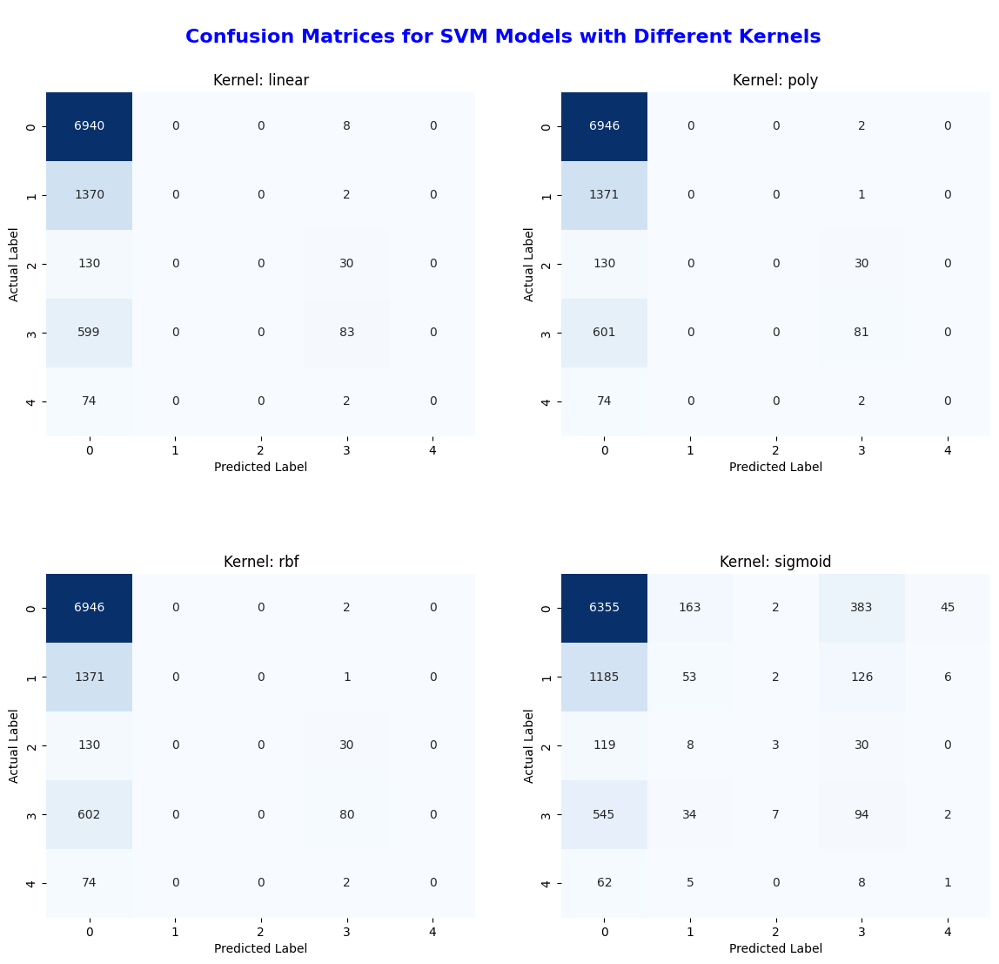

In [ ]:
plot_confusion_matrices_SVM()

## Learning Curves

Accuracy (y-axis) VS Kernel (x-axis)

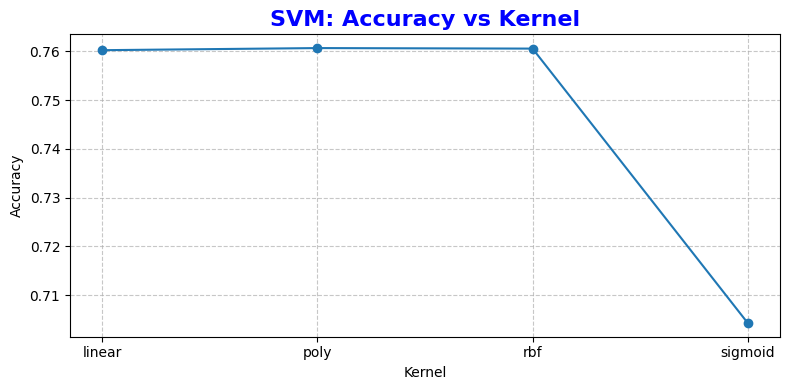

In [ ]:
# Plot Accuracy vs Kernel
plt.figure(figsize=(8, 4))

plt.plot(results_df['Kernel'], results_df['Accuracy'], marker='o', linestyle='-')

plt.title('SVM: Accuracy vs Kernel', fontsize=16, weight='bold', color='blue')
plt.xlabel('Kernel')
plt.ylabel('Accuracy')

plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Model Training with SVM (Target: PatientStatus)

## Define Train and Test functions

Already defined

## Train and Evaluate models

In [ ]:
# Define kernel types to evaluate
kernels = ['linear', 'poly', 'rbf', 'sigmoid']

In [ ]:
# Store results in a list for easy formatting later
results_SVM_PatientStatus = []

# Train and evaluate SVM models for each kernel
for kernel in kernels:
    print(f'Training SVM model... Kernel: {kernel}')

    (accuracy, precision, recall, f1, cm) = train_and_evaluate_SVM(X_train_patient_status, y_train_patient_status, X_test_patient_status, y_test_patient_status, kernel)

    # Append results for each configuration
    results_SVM_PatientStatus.append([kernel, accuracy, precision, recall, f1, cm])

Training SVM model... Kernel: linear
Training SVM model... Kernel: poly
Training SVM model... Kernel: rbf
Training SVM model... Kernel: sigmoid


## View Result

In [ ]:
# Convert results to a DataFrame for better display
results_df = pd.DataFrame(results_SVM_PatientStatus, columns=['Kernel', 'Accuracy', 'Precision', 'Recall', 'F1', 'Confusion Matrix'])

In [ ]:
# Format floats to 4 decimal places
pd.set_option('display.float_format', '{:.4f}'.format)
results_df

,Kernel,Accuracy,Precision,Recall,F1,Confusion Matrix
0,linear,0.7545,0.7605,0.7545,0.7514,"[[3598, 738, 0], [1429, 3353, 6], [1, 94, 19]]"
1,poly,0.7728,0.7730,0.7728,0.7708,"[[3475, 861, 0], [1136, 3641, 11], [1, 90, 23]]"
2,rbf,0.7705,0.7705,0.7705,0.7660,"[[3494, 842, 0], [1165, 3622, 1], [0, 112, 2]]"
3,sigmoid,0.6233,0.6233,0.6233,0.6232,"[[2740, 1589, 7], [1685, 3009, 94], [1, 104, 9]]"


In [ ]:
# results(sorted by accuracy)
results_df_sorted = results_df.sort_values(by='Accuracy', ascending=False)
results_df_sorted = results_df_sorted.drop('Confusion Matrix', axis=1)

print("SVM Evaluation Results (target:PatientStatus):")
print(results_df_sorted)

SVM Evaluation Results (target:PatientStatus):
    Kernel  Accuracy  Precision  Recall     F1
1     poly    0.7728     0.7730  0.7728 0.7708
2      rbf    0.7705     0.7705  0.7705 0.7660
0   linear    0.7545     0.7605  0.7545 0.7514
3  sigmoid    0.6233     0.6233  0.6233 0.6232


In [ ]:
# save result
result_df_SVM_PatientStatus = results_df.copy()

## Plot Confusion Matrices

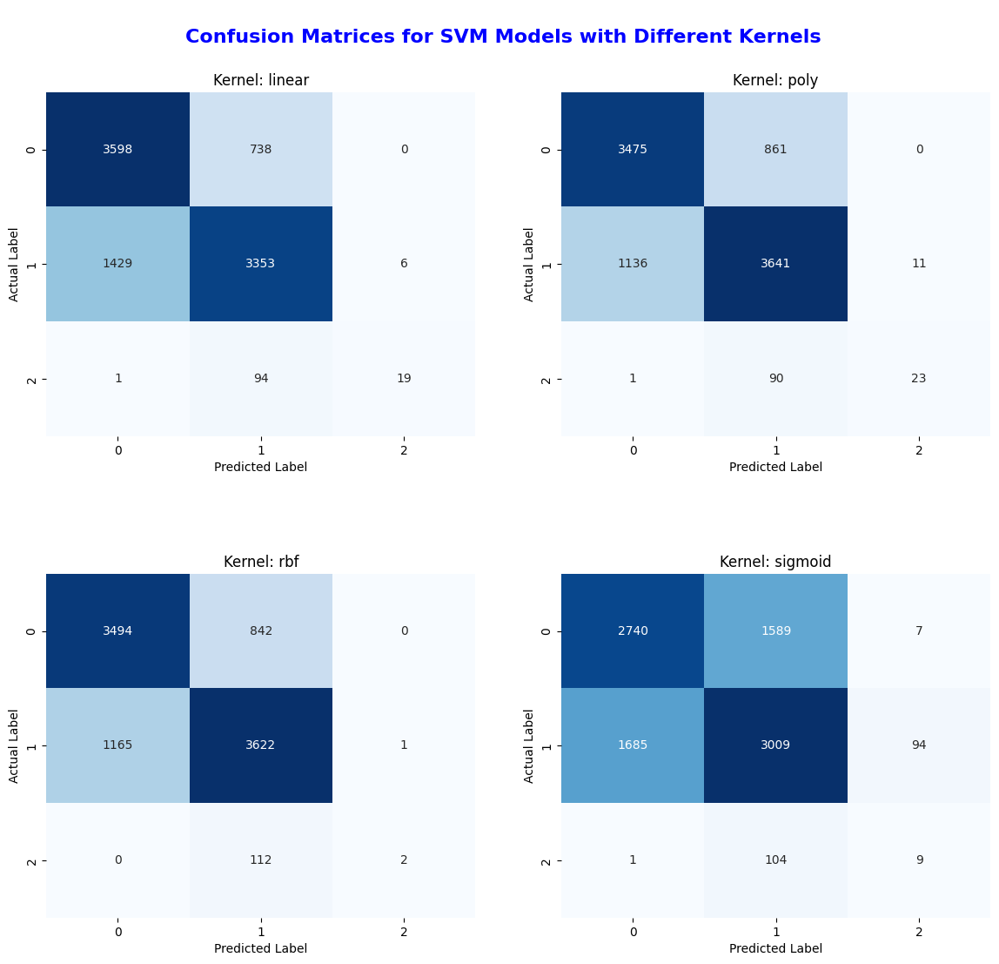

In [ ]:
# Call the function to plot confusion matrices
plot_confusion_matrices_SVM()

## Learning Curves

Accuracy (y-axis) VS Kernel (x-axis)

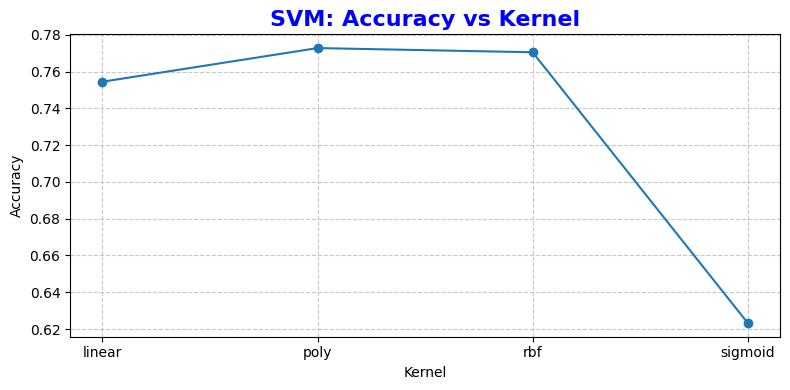

In [ ]:
# Plot Accuracy vs Kernel
plt.figure(figsize=(8, 4))

plt.plot(results_df['Kernel'], results_df['Accuracy'], marker='o', linestyle='-')

plt.title('SVM: Accuracy vs Kernel', fontsize=16, weight='bold', color='blue')
plt.xlabel('Kernel')
plt.ylabel('Accuracy')

plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# **COMPARISON BETWEEN LOGISTIC REGRESSION, DECISION TREE AND SVM**

## Overview

In [ ]:
res = [
    result_df_LR_InjuryType,
    result_df_LR_PatientStatus,
    result_df_DT_InjuryType,
    result_df_DT_PatientStatus,
    result_df_SVM_InjuryType,
    result_df_SVM_PatientStatus,
]

In [ ]:
# Columns for each result dataframes
for i, df in enumerate(res):
    print(f"Column names for DataFrame {i+1}:")
    print(df.columns)
    print("-" * 50)

Column names for DataFrame 1:
Index(['Solver', 'Max_iter', 'Accuracy', 'Precision', 'Recall', 'F1',
       'Confusion Matrix'],
      dtype='object')
--------------------------------------------------
Column names for DataFrame 2:
Index(['Solver', 'Max_iter', 'Accuracy', 'Precision', 'Recall', 'F1',
       'Confusion Matrix'],
      dtype='object')
--------------------------------------------------
Column names for DataFrame 3:
Index(['Max_depth', 'Accuracy', 'Precision', 'Recall', 'F1',
       'Confusion Matrix'],
      dtype='object')
--------------------------------------------------
Column names for DataFrame 4:
Index(['Max_depth', 'Accuracy', 'Precision', 'Recall', 'F1',
       'Confusion Matrix'],
      dtype='object')
--------------------------------------------------
Column names for DataFrame 5:
Index(['Kernel', 'Accuracy', 'Precision', 'Recall', 'F1', 'Confusion Matrix'], dtype='object')
--------------------------------------------------
Column names for DataFrame 6:
Index(['

## Combine Results

In [ ]:
combined_columns = ['Model', 'Target', 'Hyperparameter', 'Accuracy', 'Precision', 'Recall', 'F1', 'Confusion Matrix']

In [ ]:
# Combine results in single dataframes

combined_df_injurytype = pd.DataFrame(columns=combined_columns)
combined_df_patientstatus = pd.DataFrame(columns=combined_columns)

# Define mapping of data to models and targets
models_targets = [
    ('Logistic Regression', 'InjuryType', result_df_LR_InjuryType, ['Solver', 'Max_iter']),
    ('Logistic Regression', 'PatientStatus', result_df_LR_PatientStatus, ['Solver', 'Max_iter']),
    ('Decision Tree', 'InjuryType', result_df_DT_InjuryType, ['Max_depth']),
    ('Decision Tree', 'PatientStatus', result_df_DT_PatientStatus, ['Max_depth']),
    ('SVM', 'InjuryType', result_df_SVM_InjuryType, ['Kernel']),
    ('SVM', 'PatientStatus', result_df_SVM_PatientStatus, ['Kernel']),
]

for model, target, df, hyperparameters in models_targets:
    for _, row in df.iterrows():
        # Combine hyperparameters into a single string
        hyperparameter_value = ', '.join(f"{hp}={row[hp]}" for hp in hyperparameters)

        # Create a row to append
        row_data = {
            'Model': model,
            'Target': target,
            'Hyperparameter': hyperparameter_value,
            'Accuracy': row['Accuracy'],
            'Precision': row['Precision'],
            'Recall': row['Recall'],
            'F1': row['F1'],
            'Confusion Matrix': row['Confusion Matrix'],
        }

        # Append to the appropriate DataFrame
        if target == 'InjuryType':
            combined_df_injurytype = pd.concat([combined_df_injurytype, pd.DataFrame([row_data])], ignore_index=True)

        elif target == 'PatientStatus':
            combined_df_patientstatus = pd.concat([combined_df_patientstatus, pd.DataFrame([row_data])], ignore_index=True)

In [ ]:
combined_df_injurytype

,Model,Target,Hyperparameter,Accuracy,Precision,Recall,F1,Confusion Matrix
0,Logistic Regression,InjuryType,"Solver=lbfgs, Max_iter=50",0.7601,0.6784,0.7601,0.6675,"[[6930, 16, 0, 2, 0], [1357, 13, 1, 1, 0], [12..."
1,Logistic Regression,InjuryType,"Solver=lbfgs, Max_iter=100",0.7600,0.6755,0.7600,0.6673,"[[6928, 12, 0, 8, 0], [1358, 9, 1, 4, 0], [128..."
2,Logistic Regression,InjuryType,"Solver=lbfgs, Max_iter=150",0.7606,0.6832,0.7606,0.6680,"[[6930, 9, 0, 9, 0], [1358, 9, 1, 4, 0], [128,..."
3,Logistic Regression,InjuryType,"Solver=lbfgs, Max_iter=200",0.7606,0.6832,0.7606,0.6680,"[[6930, 9, 0, 9, 0], [1358, 9, 1, 4, 0], [128,..."
4,Logistic Regression,InjuryType,"Solver=lbfgs, Max_iter=250",0.7606,0.6832,0.7606,0.6680,"[[6930, 9, 0, 9, 0], [1358, 9, 1, 4, 0], [128,..."
5,Logistic Regression,InjuryType,"Solver=lbfgs, Max_iter=300",0.7606,0.6832,0.7606,0.6680,"[[6930, 9, 0, 9, 0], [1358, 9, 1, 4, 0], [128,..."
6,Logistic Regression,InjuryType,"Solver=liblinear, Max_iter=50",0.7597,0.6558,0.7597,0.6649,"[[6938, 3, 0, 7, 0], [1368, 3, 0, 1, 0], [129,..."
7,Logistic Regression,InjuryType,"Solver=liblinear, Max_iter=100",0.7597,0.6558,0.7597,0.6649,"[[6938, 3, 0, 7, 0], [1368, 3, 0, 1, 0], [129,..."
8,Logistic Regression,InjuryType,"Solver=liblinear, Max_iter=150",0.7597,0.6558,0.7597,0.6649,"[[6938, 3, 0, 7, 0], [1368, 3, 0, 1, 0], [129,..."
9,Logistic Regression,InjuryType,"Solver=liblinear, Max_iter=200",0.7597,0.6558,0.7597,0.6649,"[[6938, 3, 0, 7, 0], [1368, 3, 0, 1, 0], [129,..."


In [ ]:
combined_df_patientstatus

,Model,Target,Hyperparameter,Accuracy,Precision,Recall,F1,Confusion Matrix
0,Logistic Regression,PatientStatus,"Solver=lbfgs, Max_iter=50",0.7686,0.7676,0.7686,0.7659,"[[3542, 794, 0], [1221, 3544, 23], [0, 100, 14]]"
1,Logistic Regression,PatientStatus,"Solver=lbfgs, Max_iter=100",0.7692,0.7687,0.7692,0.7666,"[[3546, 790, 0], [1223, 3545, 20], [0, 99, 15]]"
2,Logistic Regression,PatientStatus,"Solver=lbfgs, Max_iter=150",0.7687,0.7684,0.7687,0.7661,"[[3543, 793, 0], [1227, 3542, 19], [0, 98, 16]]"
3,Logistic Regression,PatientStatus,"Solver=lbfgs, Max_iter=200",0.7689,0.7685,0.7689,0.7663,"[[3543, 793, 0], [1224, 3544, 20], [0, 98, 16]]"
4,Logistic Regression,PatientStatus,"Solver=lbfgs, Max_iter=250",0.7689,0.7685,0.7689,0.7663,"[[3543, 793, 0], [1224, 3544, 20], [0, 98, 16]]"
5,Logistic Regression,PatientStatus,"Solver=lbfgs, Max_iter=300",0.7689,0.7685,0.7689,0.7663,"[[3543, 793, 0], [1224, 3544, 20], [0, 98, 16]]"
6,Logistic Regression,PatientStatus,"Solver=liblinear, Max_iter=50",0.7654,0.7680,0.7654,0.7623,"[[3545, 791, 0], [1271, 3512, 5], [0, 100, 14]]"
7,Logistic Regression,PatientStatus,"Solver=liblinear, Max_iter=100",0.7654,0.7680,0.7654,0.7623,"[[3545, 791, 0], [1271, 3512, 5], [0, 100, 14]]"
8,Logistic Regression,PatientStatus,"Solver=liblinear, Max_iter=150",0.7654,0.7680,0.7654,0.7623,"[[3545, 791, 0], [1271, 3512, 5], [0, 100, 14]]"
9,Logistic Regression,PatientStatus,"Solver=liblinear, Max_iter=200",0.7654,0.7680,0.7654,0.7623,"[[3545, 791, 0], [1271, 3512, 5], [0, 100, 14]]"


In [ ]:
# # Save the dataframes locally as CSV files

# file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/combined_df_injurytype.csv'
# combined_df_injurytype.to_csv(file_path, index=False)

# file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/combined_df_patientstatus.csv'
# combined_df_patientstatus.to_csv(file_path, index=False)

## View Comparisons (InjuryType)

In [ ]:
# Sort by Accuracy
combined_df_injurytype_sorted = combined_df_injurytype.sort_values(by='Accuracy', ascending=False)
(combined_df_injurytype_sorted)

,Model,Target,Hyperparameter,Accuracy,Precision,Recall,F1,Confusion Matrix
43,SVM,InjuryType,Kernel=poly,0.7607,0.6242,0.7607,0.6652,"[[6946, 0, 0, 2, 0], [1371, 0, 0, 1, 0], [130,..."
14,Logistic Regression,InjuryType,"Solver=newton-cg, Max_iter=150",0.7606,0.6872,0.7606,0.6680,"[[6930, 9, 0, 9, 0], [1358, 10, 1, 3, 0], [128..."
28,Logistic Regression,InjuryType,"Solver=sag, Max_iter=250",0.7606,0.6869,0.7606,0.6680,"[[6930, 9, 0, 9, 0], [1357, 10, 1, 4, 0], [128..."
26,Logistic Regression,InjuryType,"Solver=sag, Max_iter=150",0.7606,0.6869,0.7606,0.6680,"[[6930, 9, 0, 9, 0], [1357, 10, 1, 4, 0], [128..."
25,Logistic Regression,InjuryType,"Solver=sag, Max_iter=100",0.7606,0.6869,0.7606,0.6680,"[[6930, 9, 0, 9, 0], [1357, 10, 1, 4, 0], [128..."
24,Logistic Regression,InjuryType,"Solver=sag, Max_iter=50",0.7606,0.6872,0.7606,0.6680,"[[6930, 9, 0, 9, 0], [1358, 10, 1, 3, 0], [128..."
29,Logistic Regression,InjuryType,"Solver=sag, Max_iter=300",0.7606,0.6869,0.7606,0.6680,"[[6930, 9, 0, 9, 0], [1357, 10, 1, 4, 0], [128..."
31,Logistic Regression,InjuryType,"Solver=saga, Max_iter=100",0.7606,0.6872,0.7606,0.6680,"[[6930, 9, 0, 9, 0], [1358, 10, 1, 3, 0], [128..."
32,Logistic Regression,InjuryType,"Solver=saga, Max_iter=150",0.7606,0.6869,0.7606,0.6680,"[[6930, 9, 0, 9, 0], [1357, 10, 1, 4, 0], [128..."
33,Logistic Regression,InjuryType,"Solver=saga, Max_iter=200",0.7606,0.6869,0.7606,0.6680,"[[6930, 9, 0, 9, 0], [1357, 10, 1, 4, 0], [128..."


### Plotting

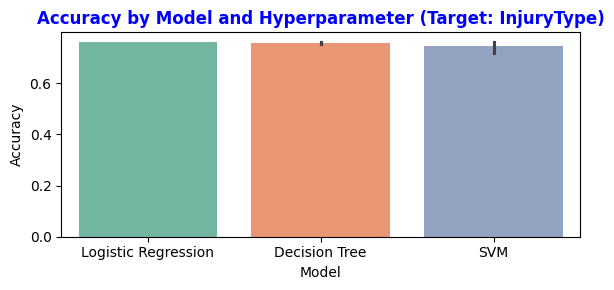

In [ ]:
# Bar Plot of Accuracy by Model

plt.figure(figsize=(6, 3))
sns.barplot(data=combined_df_injurytype, x='Model', y='Accuracy', palette='Set2')
# , hue='Hyperparameter'
plt.title('Accuracy by Model and Hyperparameter (Target: InjuryType)', weight='bold', color='blue')
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.tight_layout()
plt.show()

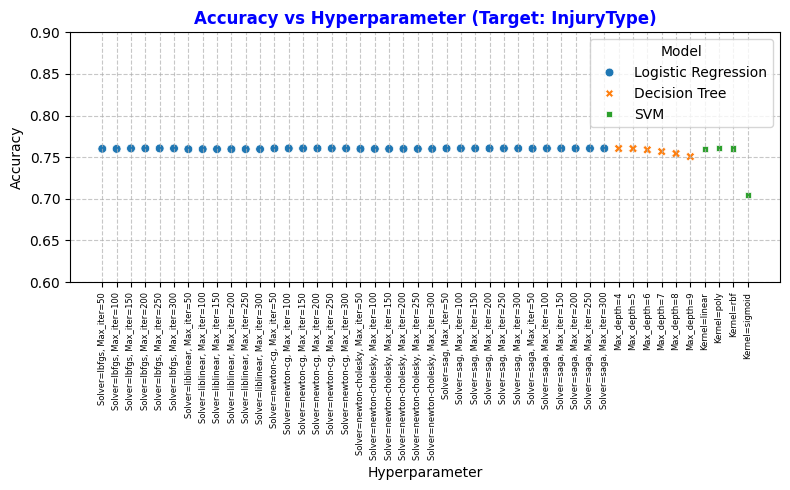

In [ ]:
# Scatter Plot of Accuracy vs Hyperparameter
plt.figure(figsize=(8, 5))
sns.scatterplot(data=combined_df_injurytype, x='Hyperparameter', y='Accuracy', hue='Model', style='Model', s=40)
plt.title('Accuracy vs Hyperparameter (Target: InjuryType)', weight='bold', color='blue')
plt.ylabel('Accuracy')
plt.xlabel('Hyperparameter')
plt.ylim(0.60, 0.90)
plt.xticks(rotation=90, fontsize=6)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Model', loc='best')
plt.tight_layout()
plt.show()

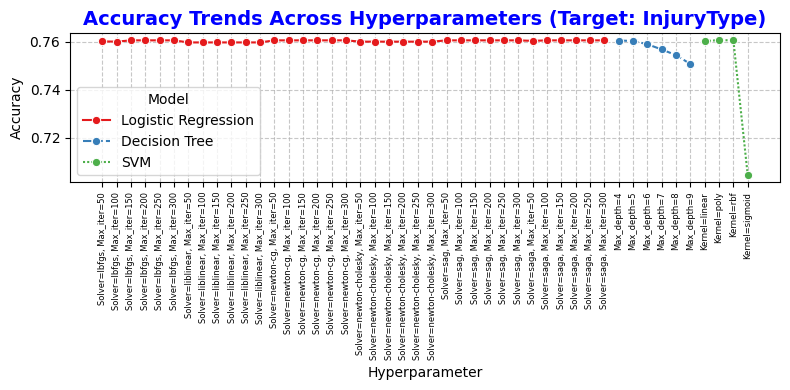

In [ ]:
# Line Plot for Performance Metrics over Hyperparameters
plt.figure(figsize=(8, 4))
sns.lineplot(data=combined_df_injurytype, x='Hyperparameter', y='Accuracy', hue='Model', marker='o', style='Model', palette='Set1')
plt.title('Accuracy Trends Across Hyperparameters (Target: InjuryType)', fontsize=14, weight='bold', color='blue')
plt.ylabel('Accuracy')
plt.xlabel('Hyperparameter')
plt.xticks(rotation=90, fontsize=6)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

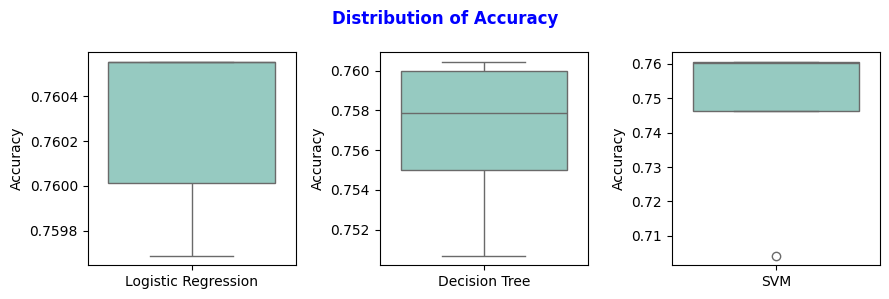

In [ ]:
# Box Plots of Accuracy by Model (Side-by-Side with Independent Y Axes)
models = combined_df_injurytype['Model'].unique()
num_models = len(models)

# Set up subplots
fig, axes = plt.subplots(1, num_models, figsize=(num_models * 3, 3), sharey=False)
fig.suptitle(f'Distribution of Accuracy', weight='bold', color='blue')

for i, model in enumerate(models):
    sns.boxplot(
        data=combined_df_injurytype[combined_df_injurytype['Model'] == model],
        x='Model', y='Accuracy', palette='Set3', ax=axes[i]
    )
    # axes[i].set_title(f'Distribution of Accuracy: {model}', weight='bold', color='blue')
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Accuracy')
    axes[i].tick_params(axis='x')

# Adjust layout
plt.tight_layout()
plt.show()

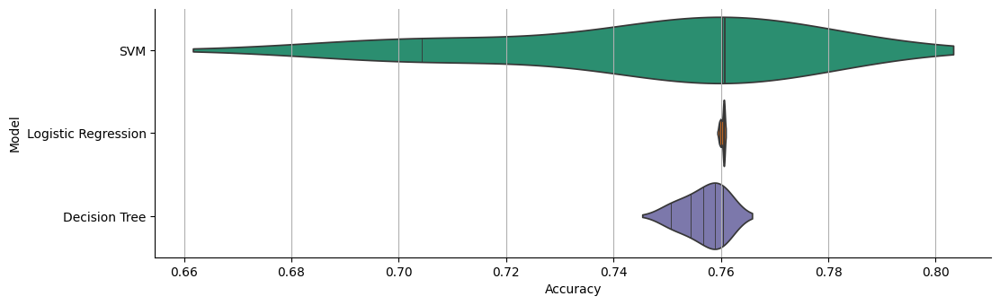

In [ ]:
# ViolinPlot (Model vs Accuracy)

from matplotlib import pyplot as plt
import seaborn as sns

figsize = (12, 1.2 * len(combined_df_injurytype_sorted['Model'].unique()))
plt.figure(figsize=figsize)
plt.grid(True)
sns.violinplot(combined_df_injurytype_sorted, x='Accuracy', y='Model', inner='stick', palette='Dark2')
sns.despine(top=True, right=True)

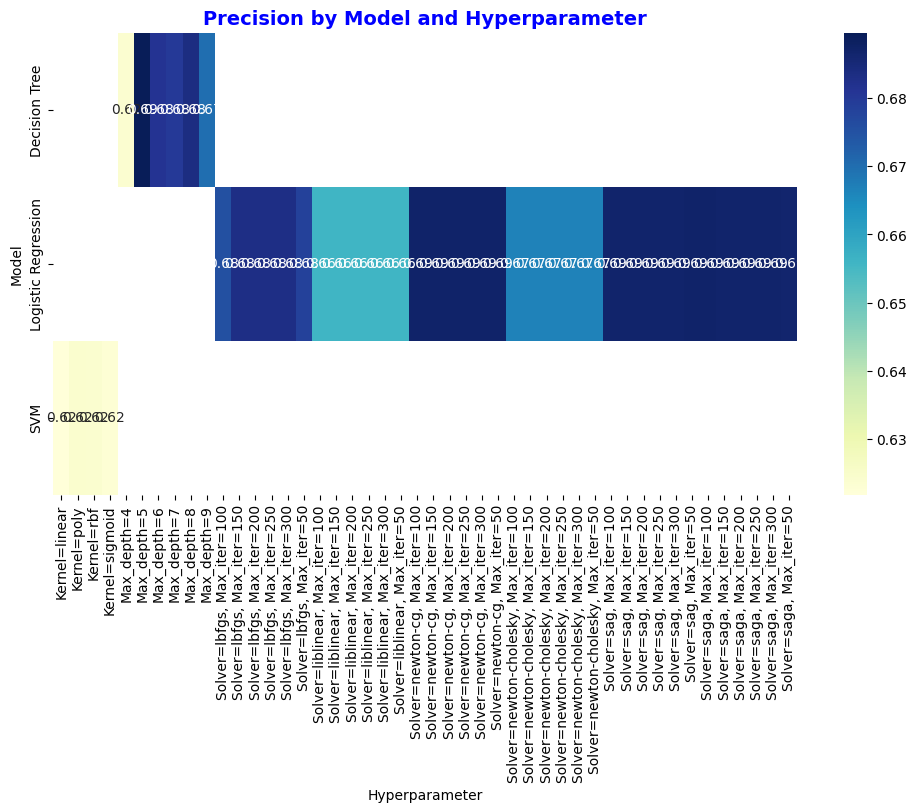

In [ ]:
# Heatmap for Precision, Recall, and F1

metrics = combined_df_injurytype.pivot_table(index='Model', columns='Hyperparameter', values=['Precision', 'Recall', 'F1'])

plt.figure(figsize=(12, 6))
sns.heatmap(metrics['Precision'], annot=True, cmap='YlGnBu', fmt='.2f', cbar=True)
plt.title('Precision by Model and Hyperparameter', fontsize=14, weight='bold', color='blue')
plt.ylabel('Model')
plt.xlabel('Hyperparameter')
plt.show()


## View Comparison (PatientStatus)

In [ ]:
# Sort by Accuracy
combined_df_patientstatus_sorted = combined_df_patientstatus.sort_values(by='Accuracy', ascending=False)
(combined_df_patientstatus_sorted)

,Model,Target,Hyperparameter,Accuracy,Precision,Recall,F1,Confusion Matrix
41,Decision Tree,PatientStatus,Max_depth=9,0.7977,0.7987,0.7977,0.7967,"[[3617, 719, 0], [1058, 3711, 19], [1, 72, 41]]"
40,Decision Tree,PatientStatus,Max_depth=8,0.7942,0.7970,0.7942,0.7932,"[[3676, 660, 0], [1147, 3617, 24], [1, 69, 44]]"
39,Decision Tree,PatientStatus,Max_depth=7,0.7891,0.7887,0.7891,0.7882,"[[3449, 887, 0], [971, 3800, 17], [1, 72, 41]]"
38,Decision Tree,PatientStatus,Max_depth=6,0.7793,0.7790,0.7793,0.7784,"[[3419, 917, 0], [1032, 3738, 18], [1, 71, 42]]"
37,Decision Tree,PatientStatus,Max_depth=5,0.7760,0.7840,0.7760,0.7735,"[[3717, 619, 0], [1359, 3424, 5], [1, 85, 28]]"
43,SVM,PatientStatus,Kernel=poly,0.7728,0.7730,0.7728,0.7708,"[[3475, 861, 0], [1136, 3641, 11], [1, 90, 23]]"
44,SVM,PatientStatus,Kernel=rbf,0.7705,0.7705,0.7705,0.7660,"[[3494, 842, 0], [1165, 3622, 1], [0, 112, 2]]"
1,Logistic Regression,PatientStatus,"Solver=lbfgs, Max_iter=100",0.7692,0.7687,0.7692,0.7666,"[[3546, 790, 0], [1223, 3545, 20], [0, 99, 15]]"
5,Logistic Regression,PatientStatus,"Solver=lbfgs, Max_iter=300",0.7689,0.7685,0.7689,0.7663,"[[3543, 793, 0], [1224, 3544, 20], [0, 98, 16]]"
3,Logistic Regression,PatientStatus,"Solver=lbfgs, Max_iter=200",0.7689,0.7685,0.7689,0.7663,"[[3543, 793, 0], [1224, 3544, 20], [0, 98, 16]]"


### Plotting

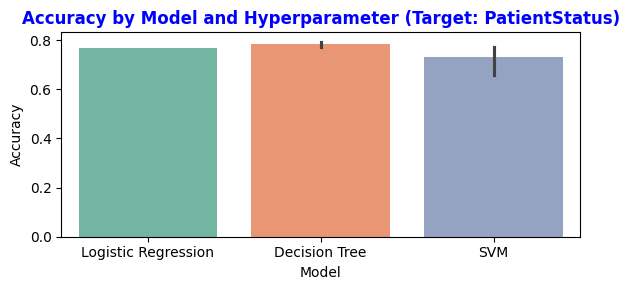

In [ ]:
# Bar Plot of Accuracy by Model

plt.figure(figsize=(6, 3))
sns.barplot(data=combined_df_patientstatus, x='Model', y='Accuracy', palette='Set2')
# , hue='Hyperparameter'
plt.title('Accuracy by Model and Hyperparameter (Target: PatientStatus)', weight='bold', color='blue')
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.tight_layout()
plt.show()

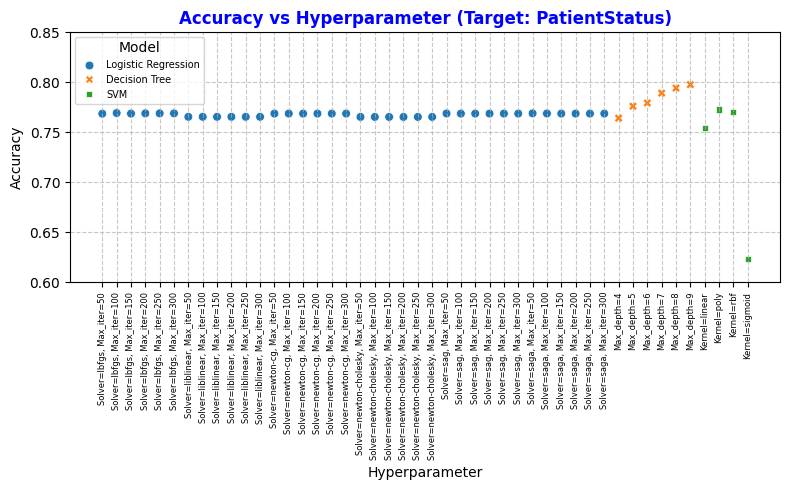

In [ ]:
# Scatter Plot of Accuracy vs Hyperparameter
plt.figure(figsize=(8, 5))
sns.scatterplot(data=combined_df_patientstatus, x='Hyperparameter', y='Accuracy', hue='Model', style='Model', s=40)
plt.title('Accuracy vs Hyperparameter (Target: PatientStatus)', weight='bold', color='blue')
plt.ylabel('Accuracy')
plt.xlabel('Hyperparameter')
plt.ylim(0.60, 0.85)
plt.xticks(rotation=90, fontsize=6)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Model', loc='best', fontsize=7)
plt.tight_layout()
plt.show()

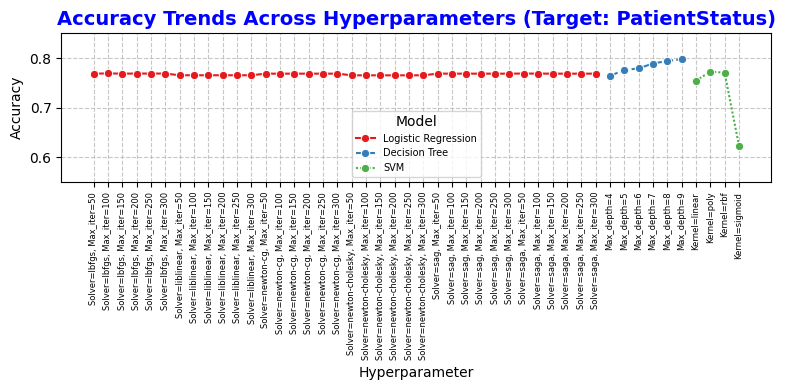

In [ ]:
# Line Plot for Performance Metrics over Hyperparameters
plt.figure(figsize=(8, 4))
sns.lineplot(data=combined_df_patientstatus, x='Hyperparameter', y='Accuracy', hue='Model', marker='o', style='Model', palette='Set1')
plt.title('Accuracy Trends Across Hyperparameters (Target: PatientStatus)', fontsize=14, weight='bold', color='blue')
plt.ylabel('Accuracy')
plt.xlabel('Hyperparameter')
plt.xticks(rotation=90, fontsize=6)
plt.ylim(0.55, 0.85)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Model', loc='lower center', fontsize=7)
plt.tight_layout()
plt.show()

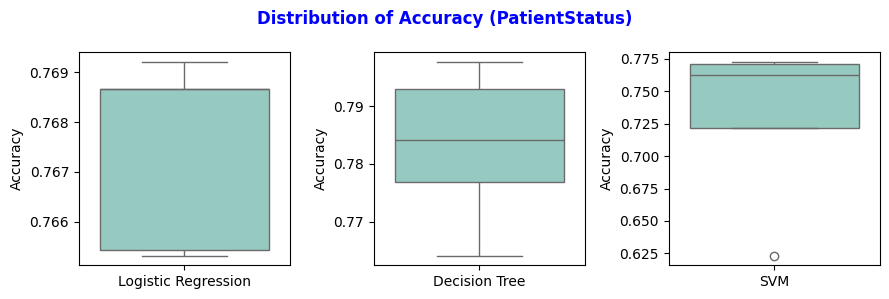

In [ ]:
# Box Plots of Accuracy by Model (Side-by-Side with Independent Y Axes)
models = combined_df_patientstatus['Model'].unique()
num_models = len(models)

# Set up subplots
fig, axes = plt.subplots(1, num_models, figsize=(num_models * 3, 3), sharey=False)
fig.suptitle(f'Distribution of Accuracy (PatientStatus)', weight='bold', color='blue')

for i, model in enumerate(models):
    sns.boxplot(
        data=combined_df_patientstatus[combined_df_patientstatus['Model'] == model],
        x='Model', y='Accuracy', palette='Set3', ax=axes[i]
    )
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Accuracy')
    axes[i].tick_params(axis='x')

# Adjust layout
plt.tight_layout()
plt.show()

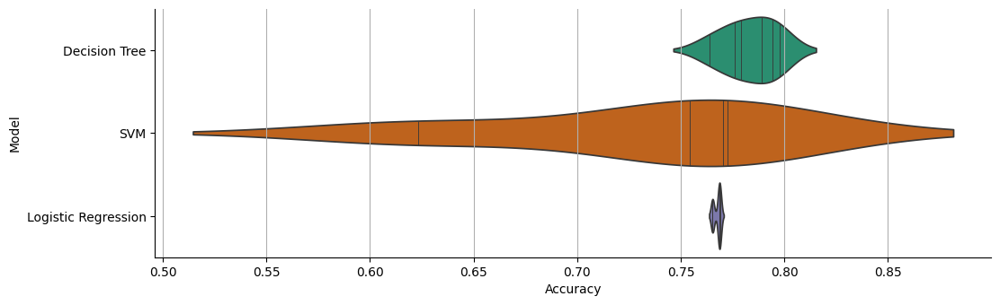

In [ ]:
# ViolinPlot (Model vs Accuracy)

from matplotlib import pyplot as plt
import seaborn as sns

figsize = (12, 1.2 * len(combined_df_patientstatus_sorted['Model'].unique()))
plt.figure(figsize=figsize)
plt.grid(True)
sns.violinplot(combined_df_patientstatus_sorted, x='Accuracy', y='Model', inner='stick', palette='Dark2')
sns.despine(top=True, right=True)

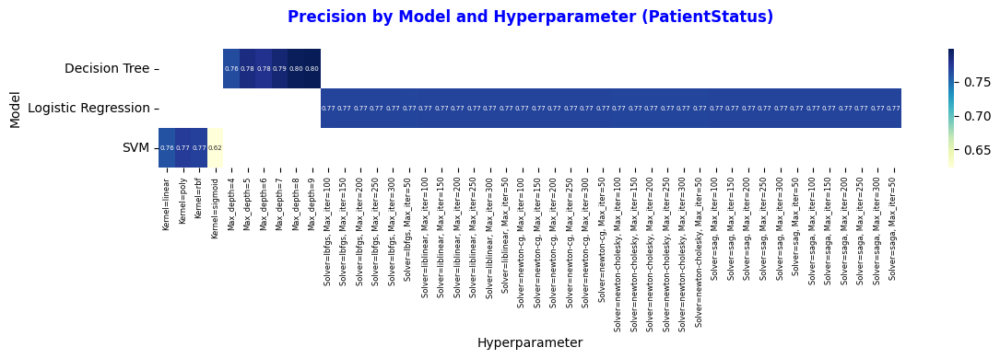

In [ ]:
# Heatmap for Precision, Recall, and F1

metrics = combined_df_patientstatus.pivot_table(index='Model', columns='Hyperparameter', values=['Precision', 'Recall', 'F1'])

plt.figure(figsize=(12, 4))
sns.heatmap(metrics['Precision'], annot=True, cmap='YlGnBu', fmt='.2f', cbar=True, annot_kws={'size': 5})
plt.title('Precision by Model and Hyperparameter (PatientStatus)\n', weight='bold', color='blue')
plt.ylabel('Model')
plt.xlabel('Hyperparameter')
plt.xticks(fontsize=6)
plt.tight_layout()
plt.show()

# <font color="blue">**PHASE 4**

## Load scaled Dataframe

In [ ]:
import pandas as pd

scaled_df = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/new_scaled_df.csv')

print("dataframe loaded")

dataframe loaded


In [ ]:
# preprocess
scaled_df.drop(['Gender_Female'], axis=1, inplace=True)

# Ensure feature names have no whitespace
scaled_df.columns = scaled_df.columns.str.replace(' ', '_')

# Copy df
scaled_df_injurytype = scaled_df.copy()
scaled_df_patientstatus = scaled_df.copy()

### DF Overview

In [ ]:
print(scaled_df.shape)
print(scaled_df_injurytype.shape)
print(scaled_df_patientstatus.shape)

(46187, 40)
(46187, 40)
(46187, 40)


In [ ]:
scaled_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46187 entries, 0 to 46186
Data columns (total 40 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CallTime                  46187 non-null  float64
 1   TotalPatientsInEmergency  46187 non-null  float64
 2   Age                       46187 non-null  float64
 3   responsetime              46187 non-null  float64
 4   EducationTitle            46187 non-null  float64
 5   InjuryType                46187 non-null  float64
 6   PatientStatus             46187 non-null  float64
 7   BicycleInvovled           46187 non-null  float64
 8   BikesInvolved             46187 non-null  float64
 9   BusesInvolved             46187 non-null  float64
 10  CarsInvolved              46187 non-null  float64
 11  CartInvovled              46187 non-null  float64
 12  RickshawsInvolved         46187 non-null  float64
 13  TractorInvovled           46187 non-null  float64
 14  Trains

## Split Dataset

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
# Split dataset for InjuryType

# for target='InjuryType' these columns have correlation value of (<0.01)
columns_to_drop = [
    # 'BicycleInvovled',
    # 'EmergencyArea_Encoded',
    'CartInvovled',
    'Cause_One_Wheeling',
    'Cause_Tyre_Burst',
    'Cause_U_Turn',
    # 'Cause_Wrong_Turn',
    # 'CarsInvolved'
]
X_injury = scaled_df.drop(columns_to_drop + ['InjuryType'], axis=1)
y_injury = scaled_df['InjuryType']  # Target: 'InjuryType'

# Split into train (80%) and test (20%) sets
X_train_injury, X_test_injury, y_train_injury, y_test_injury = train_test_split(X_injury, y_injury, test_size=0.2, random_state=42)

In [ ]:
# Split dataset for PatientStatus

# for target='PatientStatus' these columns have correlation value of (<0.01)
columns_to_drop = [
    # 'EmergencyArea_Encoded',
    'CarsInvolved',
    'CartInvovled',
    'Cause_Wrong_Turn',
]

X_patient_status = scaled_df.drop(columns_to_drop + ['PatientStatus'], axis=1)
y_patient_status = scaled_df['PatientStatus']  # Target: 'PatientStatus'

# Split into train (80%) and test (20%) sets
X_train_patient_status, X_test_patient_status, y_train_patient_status, y_test_patient_status = train_test_split(
    X_patient_status, y_patient_status, test_size=0.2, random_state=42
)

### Split Overview

In [ ]:
# Print the shapes of the resulting sets to verify
print("\nInjuryType Model Data Shapes:")
print("=" * 50)
print(f"{'Dataset':<15} {'Features (X)':<25} {'Labels (y)':<15}")
print("=" * 50)
print(f"{'Train set':<15} {str(X_train_injury.shape):<25} {str(y_train_injury.shape):<15}")
print(f"{'Test set':<15} {str(X_test_injury.shape):<25} {str(y_test_injury.shape):<15}")
print("=" * 50)


InjuryType Model Data Shapes:
Dataset         Features (X)              Labels (y)     
Train set       (36949, 35)               (36949,)       
Test set        (9238, 35)                (9238,)        


In [ ]:
# Print the shapes of the resulting sets to verify
print("\nPatientStatus Model Data Shapes:")
print("=" * 50)
print(f"{'Dataset':<15} {'Features (X)':<25} {'Labels (y)':<15}")
print("=" * 50)
print(f"{'Train set':<15} {str(X_train_patient_status.shape):<25} {str(y_train_patient_status.shape):<15}")
print(f"{'Test set':<15} {str(X_test_patient_status.shape):<25} {str(y_test_patient_status.shape):<15}")
print("=" * 50)


PatientStatus Model Data Shapes:
Dataset         Features (X)              Labels (y)     
Train set       (36949, 36)               (36949,)       
Test set        (9238, 36)                (9238,)        


## Generalized Function for Model Training

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

In [ ]:
# Initialize the results lists
results_injurytype = []
results_patientstatus = []

# Function to evaluate a model with additional metrics and store confusion matrix
def evaluate_model_with_metrics(model, model_name, target):
    # Dynamically assign train and test sets based on the target
    if target == "PatientStatus":
        X_train, y_train = X_train_patient_status, y_train_patient_status
        X_test, y_test = X_test_patient_status, y_test_patient_status
        results_list = results_patientstatus
    elif target == "InjuryType":
        X_train, y_train = X_train_injury, y_train_injury
        X_test, y_test = X_test_injury, y_test_injury
        results_list = results_injurytype
    else:
        raise ValueError("Invalid target name")

    print(f"Training  model: {model_name} for target: {target}...")

    # Train the model
    model.fit(X_train, y_train)
    # Predict on the test set
    y_pred = model.predict(X_test)

    # Compute evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Append results to the appropriate list
    results_list.append({
        'Model': model_name,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'Confusion Matrix': conf_matrix
    })

    # Print summary of results
    print(f"Model: {model_name}\n"
          f"Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, "
          f"Recall: {recall:.4f}, F1 Score: {f1:.4f}\n")

# Ensemble Learning

## Imports

In [ ]:
!pip install catboost

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split, KFold
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

## Bagging

In [ ]:
# 1. Bagging
bagging = BaggingClassifier(random_state=42, n_estimators=50)
evaluate_model_with_metrics(bagging, "bagging", "InjuryType")
evaluate_model_with_metrics(bagging, "bagging", "PatientStatus")

Training  model: bagging for target: InjuryType...
Model: bagging
Accuracy: 0.7519, Precision: 0.6921, Recall: 0.7519, F1 Score: 0.7022

Training  model: bagging for target: PatientStatus...
Model: bagging
Accuracy: 0.8309, Precision: 0.8336, Recall: 0.8309, F1 Score: 0.8300



In [ ]:
# 2. Random Forest
random_forest = RandomForestClassifier(random_state=42)
evaluate_model_with_metrics(random_forest, "random_forest", "InjuryType")
evaluate_model_with_metrics(random_forest, "random_forest", "PatientStatus")

Training  model: random_forest for target: InjuryType...
Model: random_forest
Accuracy: 0.7548, Precision: 0.6780, Recall: 0.7548, F1 Score: 0.6831

Training  model: random_forest for target: PatientStatus...
Model: random_forest
Accuracy: 0.8125, Precision: 0.8150, Recall: 0.8125, F1 Score: 0.8098



## Boosting

In [ ]:
# 3. Boosting Methods

# AdaBoost
adaboost = AdaBoostClassifier(algorithm='SAMME', random_state=42)
evaluate_model_with_metrics(adaboost, "adaboost", "InjuryType")
evaluate_model_with_metrics(adaboost, "adaboost", "PatientStatus")

# Gradient Boosting
gradient_boosting = GradientBoostingClassifier(random_state=42)
evaluate_model_with_metrics(gradient_boosting, "gradient_boosting", "InjuryType")
evaluate_model_with_metrics(gradient_boosting, "gradient_boosting", "PatientStatus")

# XGBoost
xgboost = XGBClassifier(random_state=42, eval_metric='mlogloss')
evaluate_model_with_metrics(xgboost, "xgboost", "InjuryType")
evaluate_model_with_metrics(xgboost, "xgboost", "PatientStatus")

# LightGBM
lightgbm = LGBMClassifier(random_state=42, force_col_wise=True)
evaluate_model_with_metrics(lightgbm, "lightgbm", "InjuryType")
evaluate_model_with_metrics(lightgbm, "lightgbm", "PatientStatus")

# CatBoost
catboost = CatBoostClassifier(verbose=0, random_state=42)
evaluate_model_with_metrics(catboost, "catboost", "InjuryType")
evaluate_model_with_metrics(catboost, "catboost", "PatientStatus")

Training  model: adaboost for target: InjuryType...
Model: adaboost
Accuracy: 0.7604, Precision: 0.6237, Recall: 0.7604, F1 Score: 0.6647

Training  model: adaboost for target: PatientStatus...
Model: adaboost
Accuracy: 0.7627, Precision: 0.7627, Recall: 0.7627, F1 Score: 0.7603

Training  model: gradient_boosting for target: InjuryType...
Model: gradient_boosting
Accuracy: 0.7601, Precision: 0.6949, Recall: 0.7601, F1 Score: 0.6736

Training  model: gradient_boosting for target: PatientStatus...
Model: gradient_boosting
Accuracy: 0.7994, Precision: 0.8027, Recall: 0.7994, F1 Score: 0.7983

Training  model: xgboost for target: InjuryType...
Model: xgboost
Accuracy: 0.7572, Precision: 0.6911, Recall: 0.7572, F1 Score: 0.7001

Training  model: xgboost for target: PatientStatus...
Model: xgboost
Accuracy: 0.8415, Precision: 0.8429, Recall: 0.8415, F1 Score: 0.8407

Training  model: lightgbm for target: InjuryType...
[LightGBM] [Info] Total Bins 679
[LightGBM] [Info] Number of data points 

## Voting Classifier

In [ ]:
# 4. Voting (Hard)
voting_hard = VotingClassifier(
    estimators=[
        ('Random Forest', random_forest),
        ('XGBoost', xgboost),
        ('AdaBoost', adaboost)
    ],
    voting='hard'
)
evaluate_model_with_metrics(voting_hard, "voting_hard", "InjuryType")
evaluate_model_with_metrics(voting_hard, "voting_hard", "PatientStatus")

Training  model: voting_hard for target: InjuryType...
Model: voting_hard
Accuracy: 0.7606, Precision: 0.6970, Recall: 0.7606, F1 Score: 0.6760

Training  model: voting_hard for target: PatientStatus...
Model: voting_hard
Accuracy: 0.8168, Precision: 0.8204, Recall: 0.8168, F1 Score: 0.8147



In [ ]:
# Voting (Soft)
voting_soft = VotingClassifier(
    estimators=[
        ('Random Forest', random_forest),
        ('XGBoost', xgboost),
        ('AdaBoost', adaboost)
    ],
    voting='soft'
)
evaluate_model_with_metrics(voting_soft, "voting_soft", "InjuryType")
evaluate_model_with_metrics(voting_soft, "voting_soft", "PatientStatus")

Training  model: voting_soft for target: InjuryType...
Model: voting_soft
Accuracy: 0.7576, Precision: 0.6890, Recall: 0.7576, F1 Score: 0.6895

Training  model: voting_soft for target: PatientStatus...
Model: voting_soft
Accuracy: 0.8394, Precision: 0.8408, Recall: 0.8394, F1 Score: 0.8381



## Stacking

### Hold Out Stacking

Split dataset for base and meta model



In [ ]:
# Split training data for Hold-Out Stacking for InjuryType
X_train_base_injury, X_valid_meta_injury, y_train_base_injury, y_valid_meta_injury = train_test_split(
    X_train_injury, y_train_injury, test_size=0.2, random_state=42
)

# Split training data for Hold-Out Stacking for PatientStatus
X_train_base_patient, X_valid_meta_patient, y_train_base_patient, y_valid_meta_patient = train_test_split(
    X_train_patient_status, y_train_patient_status, test_size=0.2, random_state=42
)

Function

In [ ]:
#  Hold-Out Stacking Function

def hold_out_stacking(target):
    # Dynamically assign splits based on the target
    if target == "InjuryType":
        X_train_base, X_valid_meta = X_train_base_injury, X_valid_meta_injury
        y_train_base, y_valid_meta = y_train_base_injury, y_valid_meta_injury
        X_test = X_test_injury
    elif target == "PatientStatus":
        X_train_base, X_valid_meta = X_train_base_patient, X_valid_meta_patient
        y_train_base, y_valid_meta = y_train_base_patient, y_valid_meta_patient
        X_test = X_test_patient_status
    else:
        raise ValueError("Invalid target name")

    # Create meta features
    meta_features = []
    for name, model in [('Random Forest', random_forest), ('XGBoost', xgboost), ('AdaBoost', adaboost)]:
        model.fit(X_train_base, y_train_base)
        meta_features.append(model.predict(X_valid_meta))

    meta_features = np.array(meta_features).T

    # Train meta-model
    meta_model = LogisticRegression(random_state=42, max_iter=500)
    meta_model.fit(meta_features, y_valid_meta)

    # Create test meta features
    test_meta_features = []
    for model in [random_forest, xgboost, adaboost]:
        test_meta_features.append(model.predict(X_test))
    test_meta_features = np.array(test_meta_features).T

    # Predict using meta-model and evaluate
    y_pred_meta = meta_model.predict(test_meta_features)
    evaluate_model_with_metrics(meta_model, "Hold-Out Stacking", target)

In [ ]:
# Hold-Out Stacking for InjuryType
hold_out_stacking("InjuryType")

# Hold-Out Stacking for PatientStatus
hold_out_stacking("PatientStatus")

Training  model: Hold-Out Stacking for target: InjuryType...
Model: Hold-Out Stacking
Accuracy: 0.7604, Precision: 0.6797, Recall: 0.7604, F1 Score: 0.6681

Training  model: Hold-Out Stacking for target: PatientStatus...
Model: Hold-Out Stacking
Accuracy: 0.7688, Precision: 0.7682, Recall: 0.7688, F1 Score: 0.7661



### K-Fold Stacking

In [ ]:
# Function for K-Fold Stacking for both targets

def k_fold_stacking(target):
    # Dynamically assign train and test sets based on the target
    if target == "InjuryType":
        X_train, y_train = X_train_injury, y_train_injury
        X_test = X_test_injury
    elif target == "PatientStatus":
        X_train, y_train = X_train_patient_status, y_train_patient_status
        X_test = X_test_patient_status
    else:
        raise ValueError("Invalid target name")

    # KFold Cross Validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    oof_predictions = np.zeros((X_train.shape[0], 3))  # Out of Fold predictions
    test_predictions = np.zeros((X_test.shape[0], 3))  # Test set predictions

    # Train each base model and generate predictions for each fold
    for i, model in enumerate([random_forest, xgboost, adaboost]):
        for train_idx, valid_idx in kf.split(X_train):
            X_train_fold, X_valid_fold = X_train.iloc[train_idx], X_train.iloc[valid_idx]
            y_train_fold, y_valid_fold = y_train.iloc[train_idx], y_train.iloc[valid_idx]
            model.fit(X_train_fold, y_train_fold)
            oof_predictions[valid_idx, i] = model.predict(X_valid_fold)
            test_predictions[:, i] += model.predict(X_test) / kf.n_splits  # Average test predictions

    # Train the meta-model using out-of-fold predictions
    meta_model = LogisticRegression(random_state=42)  # Define meta_model inside the function
    meta_model.fit(oof_predictions, y_train)

    # Make predictions using the test set features
    y_pred_kfold = meta_model.predict(test_predictions)

    # Evaluate the model
    evaluate_model_with_metrics(meta_model, "K-Fold Stacking", target)

In [ ]:
# Run K-Fold Stacking for InjuryType
k_fold_stacking("InjuryType")

# Run K-Fold Stacking for PatientStatus
k_fold_stacking("PatientStatus")

Training  model: K-Fold Stacking for target: InjuryType...


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Model: K-Fold Stacking
Accuracy: 0.7601, Precision: 0.6776, Recall: 0.7601, F1 Score: 0.6674

Training  model: K-Fold Stacking for target: PatientStatus...
Model: K-Fold Stacking
Accuracy: 0.7688, Precision: 0.7683, Recall: 0.7688, F1 Score: 0.7662



/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


## Results

### DF

In [ ]:
# Create df from set
results_df_ensemble_injurytype = pd.DataFrame(results_injurytype)
results_df_ensemble_patientstatus = pd.DataFrame(results_patientstatus)

In [ ]:
results_df_ensemble_injurytype

,Model,Accuracy,Precision,Recall,F1 Score,Confusion Matrix
0,bagging,0.751894,0.692142,0.751894,0.702200,"[[6591, 301, 5, 47, 4], [1097, 245, 3, 27, 0],..."
1,random_forest,0.754817,0.677973,0.754817,0.683065,"[[6775, 135, 2, 33, 3], [1260, 92, 3, 17, 0], ..."
2,adaboost,0.760446,0.623733,0.760446,0.664749,"[[6946, 0, 0, 2, 0], [1371, 0, 0, 1, 0], [130,..."
3,gradient_boosting,0.760121,0.694850,0.760121,0.673620,"[[6901, 40, 0, 4, 3], [1328, 41, 0, 3, 0], [12..."
4,xgboost,0.757199,0.691065,0.757199,0.700149,"[[6689, 219, 4, 34, 2], [1128, 213, 2, 29, 0],..."
5,lightgbm,0.759255,0.692520,0.759255,0.689792,"[[6792, 137, 2, 14, 3], [1234, 129, 1, 7, 1], ..."
6,catboost,0.758498,0.689801,0.758498,0.695572,"[[6736, 184, 1, 26, 1], [1177, 178, 2, 15, 0],..."
7,voting_hard,0.760554,0.697009,0.760554,0.676029,"[[6888, 48, 0, 10, 2], [1316, 49, 0, 7, 0], [1..."
8,voting_soft,0.757632,0.688980,0.757632,0.689468,"[[6773, 146, 1, 25, 3], [1229, 128, 0, 15, 0],..."
9,Hold-Out Stacking,0.760446,0.679700,0.760446,0.668136,"[[6928, 11, 0, 9, 0], [1357, 10, 1, 4, 0], [12..."


In [ ]:
results_df_ensemble_patientstatus

,Model,Accuracy,Precision,Recall,F1 Score,Confusion Matrix
0,bagging,0.830916,0.833581,0.830916,0.830033,"[[3824, 512, 0], [965, 3802, 21], [0, 64, 50]]"
1,random_forest,0.812514,0.815023,0.812514,0.809782,"[[3740, 596, 0], [1037, 3746, 5], [0, 94, 20]]"
2,adaboost,0.762719,0.762708,0.762719,0.760310,"[[3488, 848, 0], [1233, 3540, 15], [1, 95, 18]]"
3,gradient_boosting,0.799415,0.802733,0.799415,0.798278,"[[3710, 626, 0], [1138, 3631, 19], [0, 70, 44]]"
4,xgboost,0.841524,0.842948,0.841524,0.840701,"[[3812, 524, 0], [861, 3912, 15], [0, 64, 50]]"
5,lightgbm,0.829184,0.831130,0.829184,0.828190,"[[3790, 546, 0], [947, 3824, 17], [0, 68, 46]]"
6,catboost,0.837735,0.838791,0.837735,0.836486,"[[3809, 527, 0], [881, 3890, 17], [0, 74, 40]]"
7,voting_hard,0.816843,0.820398,0.816843,0.814744,"[[3789, 547, 0], [1053, 3728, 7], [0, 85, 29]]"
8,voting_soft,0.839359,0.840822,0.839359,0.838059,"[[3816, 520, 0], [878, 3898, 12], [0, 74, 40]]"
9,Hold-Out Stacking,0.768781,0.768160,0.768781,0.766144,"[[3544, 792, 0], [1224, 3543, 21], [0, 99, 15]]"


### View Results (sorted by accuracy)

In [ ]:
# Sort the results_df_ensemble_injurytype DataFrame by Accuracy column in descending order
results_df_ensemble_injurytype_sorted = results_df_ensemble_injurytype.sort_values(by='Accuracy', ascending=False)
# Drop the 'Confusion Matrix' column
results_df_ensemble_injurytype_sorted = results_df_ensemble_injurytype_sorted.drop(columns=['Confusion Matrix'])

# Display the sorted DataFrame without the Confusion Matrix column
print("Result for InjuryType(sorted by accuracy)\n\n", results_df_ensemble_injurytype_sorted)

Result for InjuryType(sorted by accuracy)

                 Model  Accuracy  Precision    Recall  F1 Score
7         voting_hard  0.760554   0.697009  0.760554  0.676029
2            adaboost  0.760446   0.623733  0.760446  0.664749
9   Hold-Out Stacking  0.760446   0.679700  0.760446  0.668136
3   gradient_boosting  0.760121   0.694850  0.760121  0.673620
10    K-Fold Stacking  0.760121   0.677632  0.760121  0.667440
5            lightgbm  0.759255   0.692520  0.759255  0.689792
6            catboost  0.758498   0.689801  0.758498  0.695572
8         voting_soft  0.757632   0.688980  0.757632  0.689468
4             xgboost  0.757199   0.691065  0.757199  0.700149
1       random_forest  0.754817   0.677973  0.754817  0.683065
0             bagging  0.751894   0.692142  0.751894  0.702200


In [ ]:
# Sort the results_df_ensemble_patientstatus DataFrame by Accuracy column in descending order
results_df_ensemble_patientstatus_sorted = results_df_ensemble_patientstatus.sort_values(by='Accuracy', ascending=False)

# Drop the 'Confusion Matrix' and 'Target' columns
results_df_ensemble_patientstatus_sorted = results_df_ensemble_patientstatus_sorted.drop(columns=['Confusion Matrix'])

# Display the sorted DataFrame without the Confusion Matrix and Target columns
print("Result for PatientStatus (sorted by accuracy)\n\n", results_df_ensemble_patientstatus_sorted)

Result for PatientStatus (sorted by accuracy)

                 Model  Accuracy  Precision    Recall  F1 Score
4             xgboost  0.841524   0.842948  0.841524  0.840701
8         voting_soft  0.839359   0.840822  0.839359  0.838059
6            catboost  0.837735   0.838791  0.837735  0.836486
0             bagging  0.830916   0.833581  0.830916  0.830033
5            lightgbm  0.829184   0.831130  0.829184  0.828190
7         voting_hard  0.816843   0.820398  0.816843  0.814744
1       random_forest  0.812514   0.815023  0.812514  0.809782
3   gradient_boosting  0.799415   0.802733  0.799415  0.798278
9   Hold-Out Stacking  0.768781   0.768160  0.768781  0.766144
10    K-Fold Stacking  0.768781   0.768308  0.768781  0.766231
2            adaboost  0.762719   0.762708  0.762719  0.760310


### Save Results locally

In [ ]:
# # Save the dataframes locally as CSV files

# file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/results_df_ensemble_injurytype.csv'
# results_df_ensemble_injurytype.to_csv(file_path, index=False)

# file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/results_df_ensemble_patientstatus.csv'
# results_df_ensemble_patientstatus.to_csv(file_path, index=False)

## Confusion Matrix

### Matrix generation function

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
def plot_confusion_matrices(results):
    num_models = len(results)
    rows = (num_models // 3) + (1 if num_models % 3 != 0 else 0)
    cols = min(num_models, 3)  # Limit to 3 columns per row

    fig, axes = plt.subplots(rows, cols, figsize=(14, rows * 5))  # Adjust height dynamically based on the number of models
    fig.suptitle('Confusion Matrices for All Models', fontsize=16)

    for i, result in enumerate(results):
        cm = result['Confusion Matrix']
        ax = axes[i // cols, i % cols] if rows > 1 else axes[i % cols]
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, ax=ax)
        ax.set_title(f'{result["Model"]}')
        ax.set_xlabel('Predicted Label')
        ax.set_ylabel('Actual Label')

        # Rotate x-axis labels to prevent overlap
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
        ax.set_yticklabels(ax.get_yticklabels(), rotation=45)

    # Hide any unused axes (if there are fewer models than grid spaces)
    for i in range(num_models, rows * cols):
        fig.delaxes(axes[i // cols, i % cols])

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust to make space for the title
    plt.show()

### InjuryType

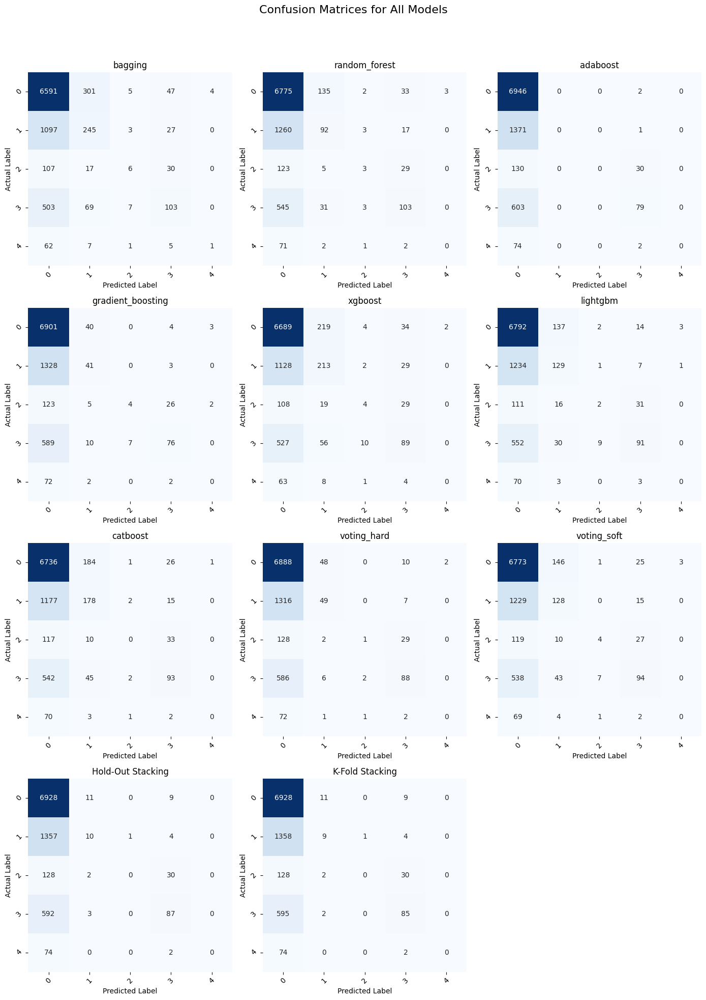

In [ ]:
plot_confusion_matrices(results_injurytype)

### Patientstatus

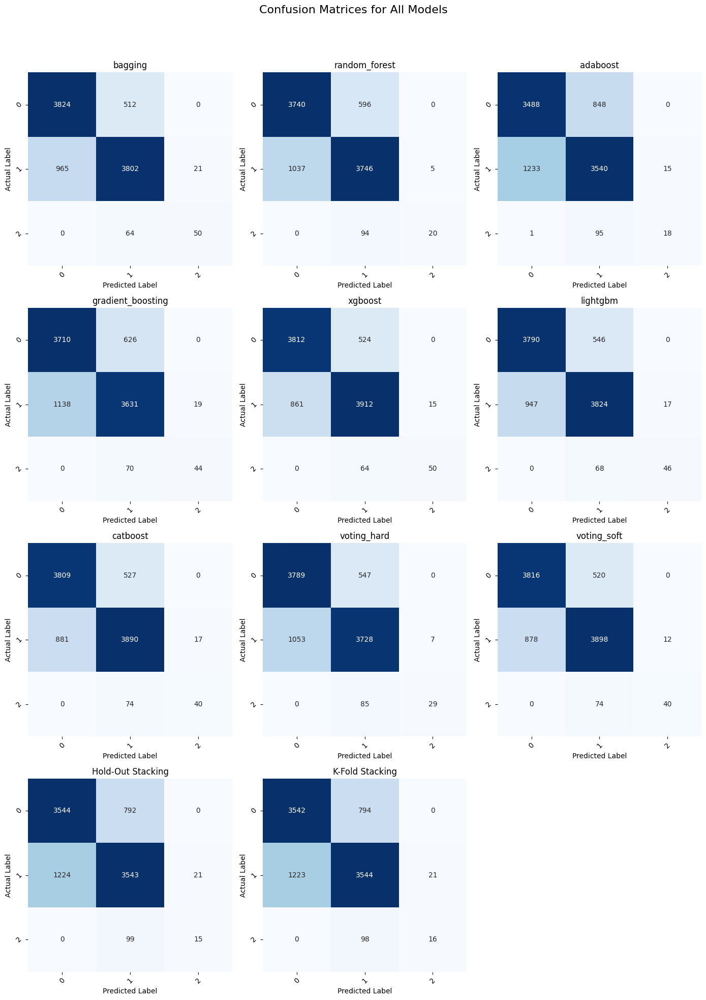

In [ ]:
plot_confusion_matrices(results_patientstatus)

## Visualization

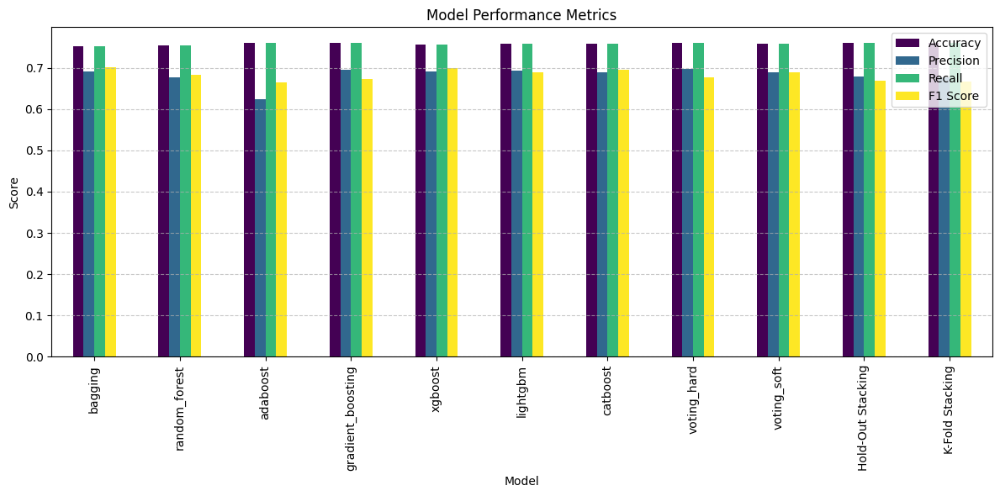

In [ ]:
# Plot bar charts for performance metrics
ax = results_df_ensemble_injurytype[['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score']].set_index('Model').plot(
    kind='bar', figsize=(12, 6), rot=90, colormap='viridis')
plt.title('Model Performance Metrics')
plt.ylabel('Score')
plt.xlabel('Model')
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid lines for y-axis
plt.tight_layout()
plt.show()

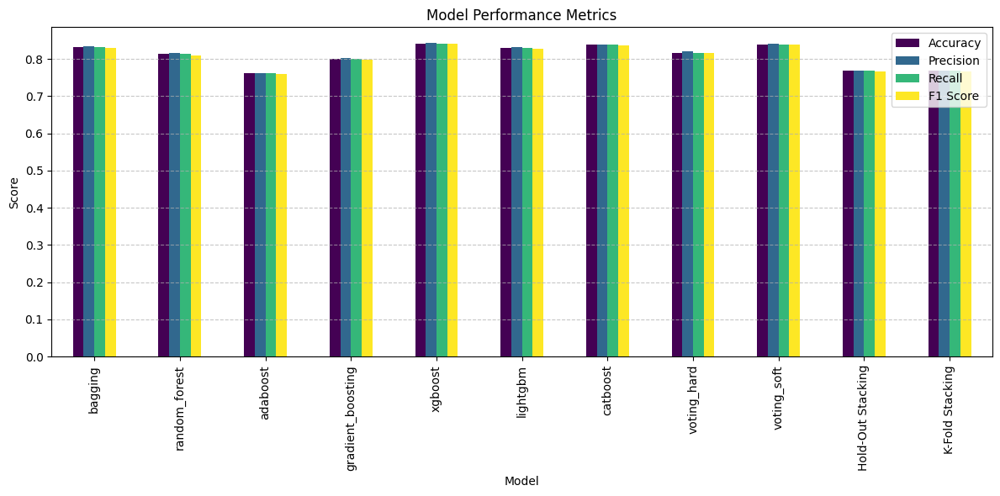

In [ ]:
# Plot bar charts for performance metrics
ax = results_df_ensemble_patientstatus[['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score']].set_index('Model').plot(
    kind='bar', figsize=(12, 6), rot=90, colormap='viridis')
plt.title('Model Performance Metrics')
plt.ylabel('Score')
plt.xlabel('Model')
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid lines for y-axis
plt.tight_layout()
plt.show()

# Advanced Ensemble Learning with Grid Search for hyperparameter tuning

## Grid Search Function

In [ ]:
# Define a function for grid search and evaluation
def grid_search_and_evaluate(model, model_name, param_grid, target):
    print(f"Tuning hyperparameters for: {model_name} for target: {target}")

    # Dynamically assign train and test datasets based on the target
    if target == "InjuryType":
        X_train, y_train = X_train_injury, y_train_injury
        X_test, y_test = X_test_injury, y_test_injury
    elif target == "PatientStatus":
        X_train, y_train = X_train_patient_status, y_train_patient_status
        X_test, y_test = X_test_patient_status, y_test_patient_status
    else:
        raise ValueError("Invalid target name")

    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring='accuracy', cv=3, verbose=1, n_jobs=-1)
    grid_search.fit(X_train, y_train)

    # Get the best model from grid search
    best_model = grid_search.best_estimator_
    print(f"Best parameters for {model_name} ({target}): {grid_search.best_params_}")

    # Evaluate the best model
    evaluate_model_with_metrics(best_model, model_name, target)

    return best_model

In [ ]:
# Define hyperparameter grids for each model
param_grids = {
    'Random Forest': {'n_estimators': [50, 100, 150], 'max_depth': [None, 10, 20], 'min_samples_split': [2, 5]},
    'AdaBoost': {'n_estimators': [50, 100], 'learning_rate': [0.1, 0.5, 1.0]},
    'Gradient Boosting': {'n_estimators': [50, 100], 'learning_rate': [0.05, 0.1], 'max_depth': [3, 5]},
    'XGBoost': {'n_estimators': [50, 100], 'max_depth': [3, 5], 'learning_rate': [0.1, 0.2]},
    'LightGBM': {'n_estimators': [50, 100], 'learning_rate': [0.05, 0.1], 'num_leaves': [31, 50]},
    'CatBoost': {'iterations': [50, 100], 'depth': [3, 5], 'learning_rate': [0.05, 0.1]},
}

## Train and Evaluate Individual Models (InjuryType)


### Train Models

In [ ]:
results_injurytype = []
best_models = {}

In [ ]:
# Random Forest
random_forest = RandomForestClassifier(random_state=42)
best_models['Random Forest'] = grid_search_and_evaluate(
    random_forest, "Random Forest",
    param_grids['Random Forest'],
    "InjuryType"
)

Tuning hyperparameters for: Random Forest for target: InjuryType
Fitting 3 folds for each of 18 candidates, totalling 54 fits
Best parameters for Random Forest (InjuryType): {'max_depth': 20, 'min_samples_split': 5, 'n_estimators': 150}
Training  model: Random Forest for target: InjuryType...
Model: Random Forest
Accuracy: 0.7591, Precision: 0.6778, Recall: 0.7591, F1 Score: 0.6742



In [ ]:
# AdaBoost
adaboost = AdaBoostClassifier(random_state=42)
best_models['AdaBoost'] = grid_search_and_evaluate(
    adaboost, "AdaBoost",
    param_grids['AdaBoost'],
    "InjuryType"
)

Tuning hyperparameters for: AdaBoost for target: InjuryType
Fitting 3 folds for each of 6 candidates, totalling 18 fits


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Best parameters for AdaBoost (InjuryType): {'learning_rate': 0.5, 'n_estimators': 50}
Training  model: AdaBoost for target: InjuryType...


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Model: AdaBoost
Accuracy: 0.7604, Precision: 0.6237, Recall: 0.7604, F1 Score: 0.6647



In [ ]:
# Gradient Boosting
gradient_boosting = GradientBoostingClassifier(random_state=42)
best_models['Gradient Boosting'] = grid_search_and_evaluate(
    gradient_boosting, "Gradient Boosting",
    param_grids['Gradient Boosting'],
    "InjuryType"
)

Tuning hyperparameters for: Gradient Boosting for target: InjuryType
Fitting 3 folds for each of 8 candidates, totalling 24 fits
Best parameters for Gradient Boosting (InjuryType): {'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 100}
Training  model: Gradient Boosting for target: InjuryType...
Model: Gradient Boosting
Accuracy: 0.7593, Precision: 0.6905, Recall: 0.7593, F1 Score: 0.6764



In [ ]:
# XGBoost
xgb_classifier = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='mlogloss')
best_models['XGBoost'] = grid_search_and_evaluate(
    xgb_classifier, "XGBoost",
    param_grids['XGBoost'],
    "InjuryType"
)

Tuning hyperparameters for: XGBoost for target: InjuryType
Fitting 3 folds for each of 8 candidates, totalling 24 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [20:30:44] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best parameters for XGBoost (InjuryType): {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100}
Training  model: XGBoost for target: InjuryType...


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [20:30:48] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Model: XGBoost
Accuracy: 0.7609, Precision: 0.6984, Recall: 0.7609, F1 Score: 0.6752



In [ ]:
# LightGBM
lightgbm = LGBMClassifier(random_state=42, force_col_wise=True)
best_models['LightGBM'] = grid_search_and_evaluate(
    lightgbm, "LightGBM",
    param_grids['LightGBM'],
    "InjuryType"
)

Tuning hyperparameters for: LightGBM for target: InjuryType
Fitting 3 folds for each of 8 candidates, totalling 24 fits
[LightGBM] [Info] Total Bins 679
[LightGBM] [Info] Number of data points in the train set: 36949, number of used features: 34
[LightGBM] [Info] Start training from score -0.283065
[LightGBM] [Info] Start training from score -1.929642
[LightGBM] [Info] Start training from score -4.090805
[LightGBM] [Info] Start training from score -2.572447
[LightGBM] [Info] Start training from score -4.796982
Best parameters for LightGBM (InjuryType): {'learning_rate': 0.05, 'n_estimators': 50, 'num_leaves': 31}
Training  model: LightGBM for target: InjuryType...
[LightGBM] [Info] Total Bins 679
[LightGBM] [Info] Number of data points in the train set: 36949, number of used features: 34
[LightGBM] [Info] Start training from score -0.283065
[LightGBM] [Info] Start training from score -1.929642
[LightGBM] [Info] Start training from score -4.090805
[LightGBM] [Info] Start training from s

In [ ]:
# CatBoost
catboost = CatBoostClassifier(verbose=0, random_state=42)
best_models['CatBoost'] = grid_search_and_evaluate(
    catboost, "CatBoost",
    param_grids['CatBoost'],
    "InjuryType"
)

Tuning hyperparameters for: CatBoost for target: InjuryType
Fitting 3 folds for each of 8 candidates, totalling 24 fits
Best parameters for CatBoost (InjuryType): {'depth': 5, 'iterations': 100, 'learning_rate': 0.1}
Training  model: CatBoost for target: InjuryType...
Model: CatBoost
Accuracy: 0.7606, Precision: 0.6828, Recall: 0.7606, F1 Score: 0.6660



In [ ]:
# Ensemble with tuned models (Hard Voting)
voting_hard = VotingClassifier(
    estimators=[
        ('Random Forest', best_models['Random Forest']),
        ('XGBoost', best_models['XGBoost']),
        ('AdaBoost', best_models['AdaBoost'])
    ],
    voting='hard'
)
evaluate_model_with_metrics(voting_hard, "Voting (Hard, Tuned)", "InjuryType")

Training  model: Voting (Hard, Tuned) for target: InjuryType...


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [20:34:54] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Model: Voting (Hard, Tuned)
Accuracy: 0.7612, Precision: 0.7088, Recall: 0.7612, F1 Score: 0.6680



In [ ]:
# Ensemble with tuned models (Soft Voting)
voting_soft = VotingClassifier(
    estimators=[
        ('Random Forest', best_models['Random Forest']),
        ('XGBoost', best_models['XGBoost']),
        ('AdaBoost', best_models['AdaBoost'])
    ],
    voting='soft'
)
evaluate_model_with_metrics(voting_soft, "Voting (Soft, Tuned)", "InjuryType")

Training  model: Voting (Soft, Tuned) for target: InjuryType...


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [20:35:12] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Model: Voting (Soft, Tuned)
Accuracy: 0.7620, Precision: 0.6992, Recall: 0.7620, F1 Score: 0.6729



### Results

In [ ]:
# Convert the results list to a DataFrame for display
results_df_advanced_ensemble_injurytype = pd.DataFrame(results_injurytype)

In [ ]:
results_df_advanced_ensemble_injurytype

,Model,Accuracy,Precision,Recall,F1 Score,Confusion Matrix
0,Random Forest,0.759147,0.677780,0.759147,0.674193,"[[6881, 48, 0, 19, 0], [1325, 39, 0, 8, 0], [1..."
1,AdaBoost,0.760446,0.623733,0.760446,0.664749,"[[6946, 0, 0, 2, 0], [1371, 0, 0, 1, 0], [130,..."
2,Gradient Boosting,0.759255,0.690455,0.759255,0.676427,"[[6877, 63, 1, 4, 3], [1306, 60, 1, 4, 1], [12..."
3,XGBoost,0.760879,0.698433,0.760879,0.675207,"[[6899, 45, 0, 4, 0], [1321, 49, 0, 2, 0], [12..."
4,LightGBM,0.760879,0.691283,0.760879,0.673121,"[[6910, 33, 0, 5, 0], [1333, 38, 0, 1, 0], [12..."
5,CatBoost,0.760554,0.682761,0.760554,0.666024,"[[6941, 3, 0, 4, 0], [1366, 4, 0, 2, 0], [128,..."
6,"Voting (Hard, Tuned)",0.761204,0.708806,0.761204,0.668000,"[[6939, 7, 0, 2, 0], [1358, 13, 0, 1, 0], [130..."
7,"Voting (Soft, Tuned)",0.761961,0.699213,0.761961,0.672921,"[[6922, 22, 0, 4, 0], [1339, 30, 0, 3, 0], [12..."


In [ ]:
# Sort the results_df_advanced_ensemble_injurytype DataFrame by Accuracy column in descending order
results_df_advanced_ensemble_injurytype_sorted = results_df_advanced_ensemble_injurytype.sort_values(by='Accuracy', ascending=False)
# Drop the 'Confusion Matrix' column
results_df_advanced_ensemble_injurytype_sorted = results_df_advanced_ensemble_injurytype_sorted.drop(columns=['Confusion Matrix'])

# Display the sorted DataFrame without the Confusion Matrix column
print("Result for InjuryType(sorted by accuracy)\n\n", results_df_advanced_ensemble_injurytype_sorted)

Result for InjuryType(sorted by accuracy)

                   Model  Accuracy  Precision    Recall  F1 Score
7  Voting (Soft, Tuned)  0.761961   0.699213  0.761961  0.672921
6  Voting (Hard, Tuned)  0.761204   0.708806  0.761204  0.668000
3               XGBoost  0.760879   0.698433  0.760879  0.675207
4              LightGBM  0.760879   0.691283  0.760879  0.673121
5              CatBoost  0.760554   0.682761  0.760554  0.666024
1              AdaBoost  0.760446   0.623733  0.760446  0.664749
2     Gradient Boosting  0.759255   0.690455  0.759255  0.676427
0         Random Forest  0.759147   0.677780  0.759147  0.674193


In [ ]:
# # Save the dataframes locally as CSV files
# file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/results_df_advanced_ensemble_injurytype.csv'

# results_df_advanced_ensemble_injurytype.to_csv(file_path, index=False)

### Confusion Matrix

In [ ]:
def plot_confusion_matrices(results):
    num_models = len(results)
    rows = (num_models // 3) + (1 if num_models % 3 != 0 else 0)
    cols = min(num_models, 3)  # Limit to 3 columns per row

    fig, axes = plt.subplots(rows, cols, figsize=(14, rows * 5))  # Adjust height dynamically based on the number of models
    fig.suptitle('Confusion Matrices for All Models', fontsize=16)

    for i, result in enumerate(results):
        cm = result['Confusion Matrix']
        ax = axes[i // cols, i % cols] if rows > 1 else axes[i % cols]
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, ax=ax)
        ax.set_title(f'{result["Model"]}')
        ax.set_xlabel('Predicted Label')
        ax.set_ylabel('Actual Label')

    # Hide unused subplots
    for i in range(len(results), rows * cols):
        fig.delaxes(axes[i // cols, i % cols])

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

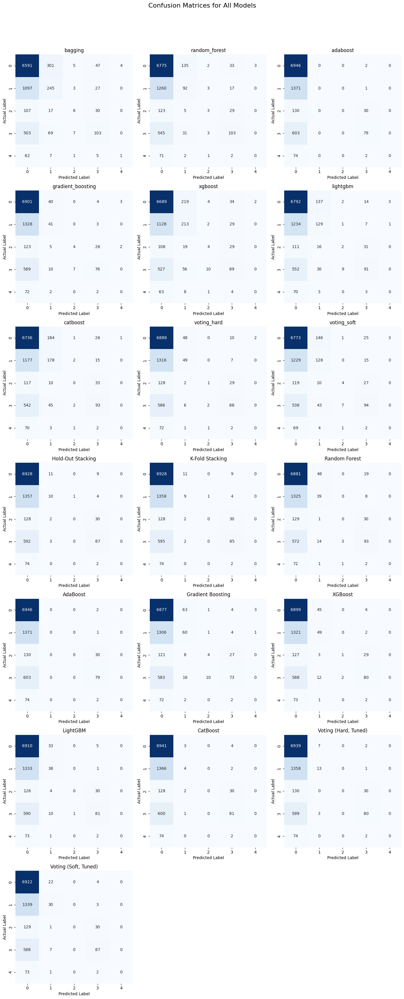

In [ ]:
# Plot confusion matrices for all models
plot_confusion_matrices(results_injurytype)

### Visualization

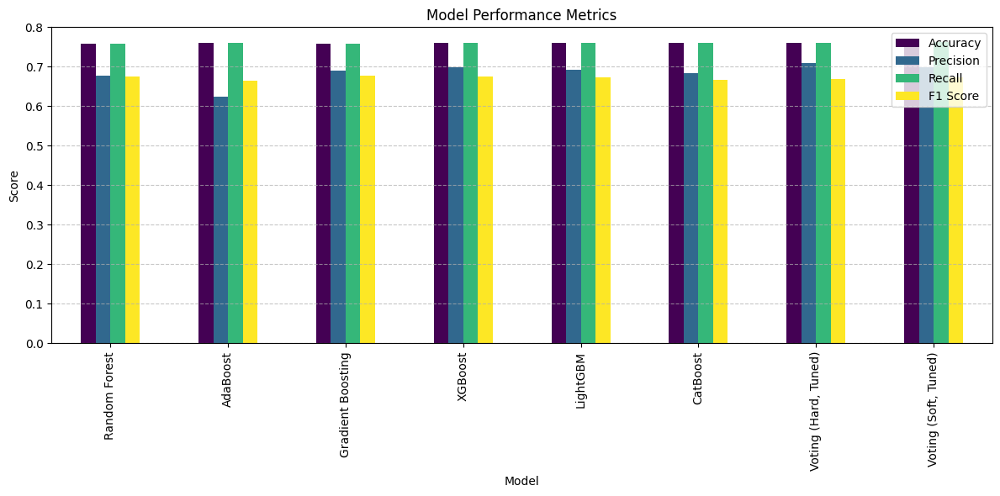

In [ ]:
# Plot bar charts for performance metrics
ax = results_df_advanced_ensemble_injurytype[['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score']].set_index('Model').plot(
    kind='bar', figsize=(12, 6), rot=90, colormap='viridis')
plt.title('Model Performance Metrics')
plt.ylabel('Score')
plt.xlabel('Model')
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid lines for y-axis
plt.tight_layout()
plt.show()

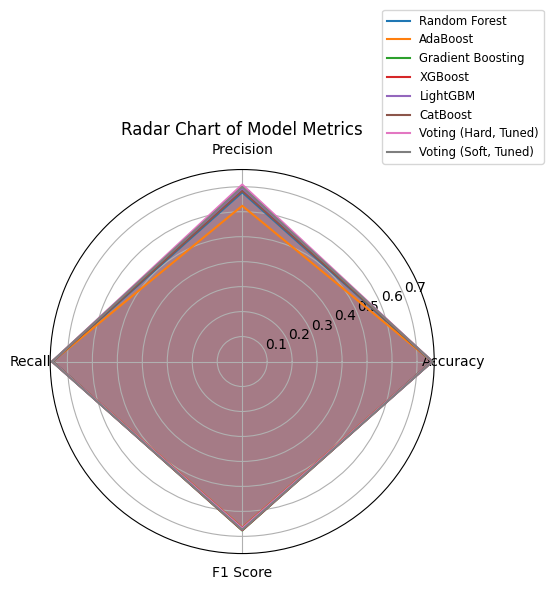

In [ ]:
from math import pi

# Prepare data for radar chart
df_radar = results_df_advanced_ensemble_injurytype[['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score']].set_index('Model')
categories = list(df_radar.columns)
N = len(categories)

angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

# Plot each model
fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
for index, row in df_radar.iterrows():
    values = row.tolist()
    values += values[:1]  # Repeat the first value to close the circle
    ax.plot(angles, values, label=index)
    ax.fill(angles, values, alpha=0.25)

ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories)
plt.title("Radar Chart of Model Metrics")
plt.legend(loc='lower right', bbox_to_anchor=(1.3, 1), fontsize='small')
plt.tight_layout()
plt.show()

## Train and Evaluate Individual Models (PatientStatus)


### Train Models

In [ ]:
results_patientstatus = []
best_models = {}

In [ ]:
# Random Forest
random_forest = RandomForestClassifier(random_state=42)
best_models['Random Forest'] = grid_search_and_evaluate(
    random_forest, "Random Forest",
    param_grids['Random Forest'],
    "PatientStatus"
)

Tuning hyperparameters for: Random Forest for target: PatientStatus
Fitting 3 folds for each of 18 candidates, totalling 54 fits
Best parameters for Random Forest (PatientStatus): {'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 150}
Training  model: Random Forest for target: PatientStatus...
Model: Random Forest
Accuracy: 0.8145, Precision: 0.8170, Recall: 0.8145, F1 Score: 0.8117



In [ ]:
# AdaBoost
adaboost = AdaBoostClassifier(random_state=42)
best_models['AdaBoost'] = grid_search_and_evaluate(
    adaboost, "AdaBoost",
    param_grids['AdaBoost'],
    "PatientStatus"
)

Tuning hyperparameters for: AdaBoost for target: PatientStatus
Fitting 3 folds for each of 6 candidates, totalling 18 fits


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Best parameters for AdaBoost (PatientStatus): {'learning_rate': 0.5, 'n_estimators': 50}
Training  model: AdaBoost for target: PatientStatus...


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Model: AdaBoost
Accuracy: 0.7652, Precision: 0.7664, Recall: 0.7652, F1 Score: 0.7630



In [ ]:
# Gradient Boosting
gradient_boosting = GradientBoostingClassifier(random_state=42)
best_models['Gradient Boosting'] = grid_search_and_evaluate(
    gradient_boosting, "Gradient Boosting",
    param_grids['Gradient Boosting'],
    "PatientStatus"
)

Tuning hyperparameters for: Gradient Boosting for target: PatientStatus
Fitting 3 folds for each of 8 candidates, totalling 24 fits
Best parameters for Gradient Boosting (PatientStatus): {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
Training  model: Gradient Boosting for target: PatientStatus...
Model: Gradient Boosting
Accuracy: 0.8221, Precision: 0.8240, Recall: 0.8221, F1 Score: 0.8211



In [ ]:
# XGBoost
xgb_classifier = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='mlogloss')
best_models['XGBoost'] = grid_search_and_evaluate(
    xgb_classifier, "XGBoost",
    param_grids['XGBoost'],
    "PatientStatus"
)

Tuning hyperparameters for: XGBoost for target: PatientStatus
Fitting 3 folds for each of 8 candidates, totalling 24 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [21:17:27] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best parameters for XGBoost (PatientStatus): {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 100}
Training  model: XGBoost for target: PatientStatus...


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [21:17:29] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Model: XGBoost
Accuracy: 0.8239, Precision: 0.8254, Recall: 0.8239, F1 Score: 0.8228



In [ ]:
# LightGBM
lightgbm = LGBMClassifier(random_state=42, force_col_wise=True)
best_models['LightGBM'] = grid_search_and_evaluate(
    lightgbm, "LightGBM",
    param_grids['LightGBM'],
    "PatientStatus"
)

Tuning hyperparameters for: LightGBM for target: PatientStatus
Fitting 3 folds for each of 8 candidates, totalling 24 fits
[LightGBM] [Info] Total Bins 680
[LightGBM] [Info] Number of data points in the train set: 36949, number of used features: 35
[LightGBM] [Info] Start training from score -0.748710
[LightGBM] [Info] Start training from score -0.665100
[LightGBM] [Info] Start training from score -4.358198
Best parameters for LightGBM (PatientStatus): {'learning_rate': 0.1, 'n_estimators': 100, 'num_leaves': 50}
Training  model: LightGBM for target: PatientStatus...
[LightGBM] [Info] Total Bins 680
[LightGBM] [Info] Number of data points in the train set: 36949, number of used features: 35
[LightGBM] [Info] Start training from score -0.748710
[LightGBM] [Info] Start training from score -0.665100
[LightGBM] [Info] Start training from score -4.358198
Model: LightGBM
Accuracy: 0.8329, Precision: 0.8344, Recall: 0.8329, F1 Score: 0.8318



In [ ]:
# CatBoost
catboost = CatBoostClassifier(verbose=0, random_state=42)
best_models['CatBoost'] = grid_search_and_evaluate(
    catboost, "CatBoost",
    param_grids['CatBoost'],
    "PatientStatus"
)

Tuning hyperparameters for: CatBoost for target: PatientStatus
Fitting 3 folds for each of 8 candidates, totalling 24 fits
Best parameters for CatBoost (PatientStatus): {'depth': 5, 'iterations': 100, 'learning_rate': 0.1}
Training  model: CatBoost for target: PatientStatus...
Model: CatBoost
Accuracy: 0.8080, Precision: 0.8119, Recall: 0.8080, F1 Score: 0.8050



In [ ]:
# Ensemble with tuned models (Hard Voting)
voting_hard = VotingClassifier(
    estimators=[
        ('Random Forest', best_models['Random Forest']),
        ('XGBoost', best_models['XGBoost']),
        ('AdaBoost', best_models['AdaBoost'])
    ],
    voting='hard'
)
evaluate_model_with_metrics(voting_hard, "Voting (Hard, Tuned)", "PatientStatus")

Training  model: Voting (Hard, Tuned) for target: PatientStatus...


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [21:19:02] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Model: Voting (Hard, Tuned)
Accuracy: 0.8126, Precision: 0.8162, Recall: 0.8126, F1 Score: 0.8104



In [ ]:
# Ensemble with tuned models (Soft Voting)
voting_soft = VotingClassifier(
    estimators=[
        ('Random Forest', best_models['Random Forest']),
        ('XGBoost', best_models['XGBoost']),
        ('AdaBoost', best_models['AdaBoost'])
    ],
    voting='soft'
)
evaluate_model_with_metrics(voting_soft, "Voting (Soft, Tuned)", "PatientStatus")

Training  model: Voting (Soft, Tuned) for target: PatientStatus...


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [21:19:19] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Model: Voting (Soft, Tuned)
Accuracy: 0.8245, Precision: 0.8272, Recall: 0.8245, F1 Score: 0.8230



### Results

In [ ]:
# Convert the results list to a DataFrame for display
results_df_advanced_ensemble_patientstatus = pd.DataFrame(results_patientstatus)
results_df_advanced_ensemble_patientstatus

,Model,Accuracy,Precision,Recall,F1 Score,Confusion Matrix
0,Random Forest,0.814462,0.817034,0.814462,0.811713,"[[3752, 584, 0], [1031, 3752, 5], [0, 94, 20]]"
1,AdaBoost,0.765209,0.766444,0.765209,0.763017,"[[3559, 777, 0], [1278, 3488, 22], [0, 92, 22]]"
2,Gradient Boosting,0.822148,0.823976,0.822148,0.821101,"[[3764, 572, 0], [981, 3787, 20], [0, 70, 44]]"
3,XGBoost,0.823880,0.825409,0.823880,0.822754,"[[3763, 573, 0], [963, 3806, 19], [0, 72, 42]]"
4,LightGBM,0.832864,0.834362,0.832864,0.831808,"[[3799, 537, 0], [918, 3851, 19], [0, 70, 44]]"
5,CatBoost,0.807967,0.811869,0.807967,0.804951,"[[3750, 586, 0], [1089, 3696, 3], [0, 96, 18]]"
6,"Voting (Hard, Tuned)",0.812622,0.816165,0.812622,0.810383,"[[3774, 562, 0], [1075, 3706, 7], [0, 87, 27]]"
7,"Voting (Soft, Tuned)",0.824529,0.827240,0.824529,0.822968,"[[3779, 557, 0], [979, 3802, 7], [0, 78, 36]]"


In [ ]:
# Sort the results_df_advanced_ensemble_patientstatus DataFrame by Accuracy column in descending order
results_df_advanced_ensemble_patientstatus_sorted = results_df_advanced_ensemble_patientstatus.sort_values(by='Accuracy', ascending=False)
# Drop the 'Confusion Matrix' column
results_df_advanced_ensemble_patientstatus_sorted = results_df_advanced_ensemble_patientstatus_sorted.drop(columns=['Confusion Matrix'])

# Display the sorted DataFrame without the Confusion Matrix column
print("Result for PatientStatus(sorted by accuracy)\n\n", results_df_advanced_ensemble_patientstatus_sorted)

Result for PatientStatus(sorted by accuracy)

                   Model  Accuracy  Precision    Recall  F1 Score
4              LightGBM  0.832864   0.834362  0.832864  0.831808
7  Voting (Soft, Tuned)  0.824529   0.827240  0.824529  0.822968
3               XGBoost  0.823880   0.825409  0.823880  0.822754
2     Gradient Boosting  0.822148   0.823976  0.822148  0.821101
0         Random Forest  0.814462   0.817034  0.814462  0.811713
6  Voting (Hard, Tuned)  0.812622   0.816165  0.812622  0.810383
5              CatBoost  0.807967   0.811869  0.807967  0.804951
1              AdaBoost  0.765209   0.766444  0.765209  0.763017


In [ ]:
# # Save the dataframes locally as CSV files
# file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/results_df_advanced_ensemble_patientstatus.csv'

# results_df_advanced_ensemble_patientstatus.to_csv(file_path, index=False)

### Confusion Matrix

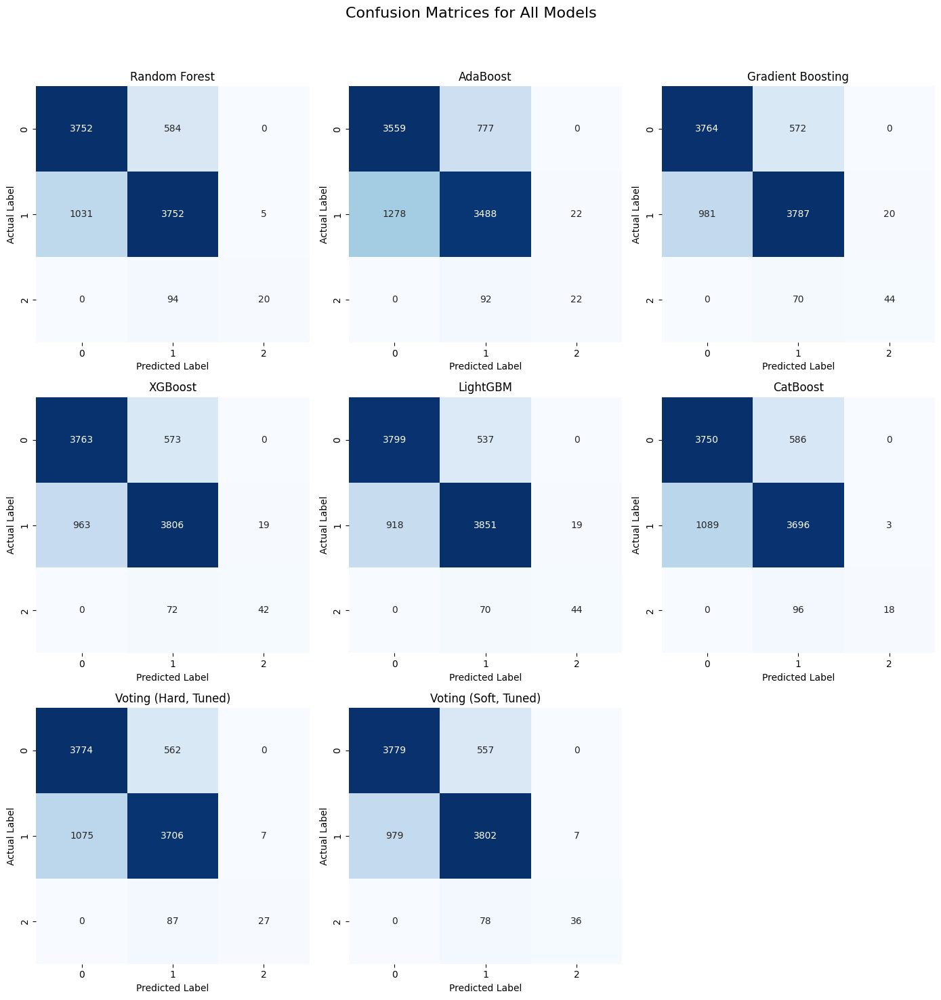

In [ ]:
# Plot confusion matrices for all models
plot_confusion_matrices(results_patientstatus)

### Visualization

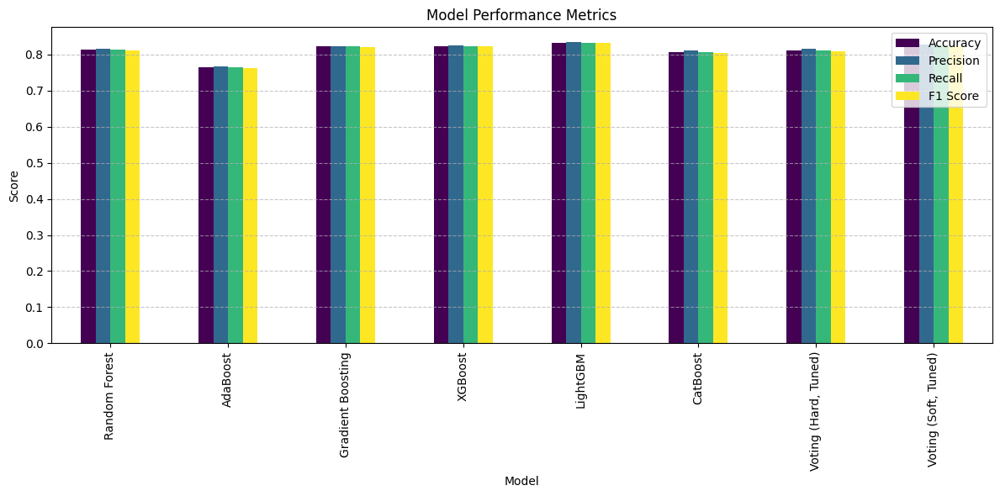

In [ ]:
# Plot bar charts for performance metrics
ax = results_df_advanced_ensemble_patientstatus[['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score']].set_index('Model').plot(
    kind='bar', figsize=(12, 6), rot=90, colormap='viridis')
plt.title('Model Performance Metrics')
plt.ylabel('Score')
plt.xlabel('Model')
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid lines for y-axis
plt.tight_layout()
plt.show()

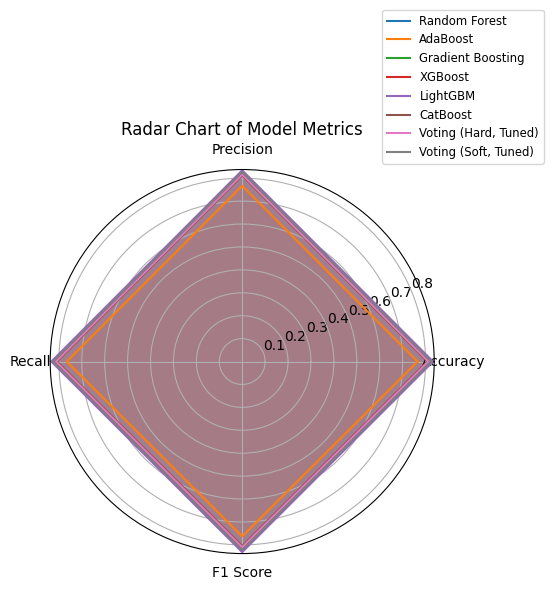

In [ ]:
from math import pi

# Prepare data for radar chart
df_radar = results_df_advanced_ensemble_patientstatus[['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score']].set_index('Model')
categories = list(df_radar.columns)
N = len(categories)

angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

# Plot each model
fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
for index, row in df_radar.iterrows():
    values = row.tolist()
    values += values[:1]  # Repeat the first value to close the circle
    ax.plot(angles, values, label=index)
    ax.fill(angles, values, alpha=0.25)

ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories)
plt.title("Radar Chart of Model Metrics")
plt.legend(loc='lower right', bbox_to_anchor=(1.3, 1), fontsize='small')
plt.tight_layout()
plt.show()

# Hyperparameter Tuning, Model Evaluation, and Stacking with Blending

## Define Grid Search Function

In [ ]:
# Function to perform Grid Search for hyperparameter tuning
def grid_search_tuning(model, param_grid, X_train, y_train):
    grid_search = GridSearchCV(model, param_grid, cv=3, scoring='accuracy', n_jobs=-1)
    grid_search.fit(X_train, y_train)
    return grid_search.best_estimator_, grid_search.best_params_

## Define Base and Meta Models with hyperparameters

In [ ]:
# Base models with hyperparameter tuning
base_models = {
    'Random Forest': (RandomForestClassifier(random_state=42), {
        'n_estimators': [50, 100],
        'max_depth': [10, 20],
        'min_samples_split': [2, 5]
    }),
    'AdaBoost': (AdaBoostClassifier(random_state=42), {
        'n_estimators': [50, 100],
        'learning_rate': [0.05, 0.1]
    }),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42), {
        'n_estimators': [50, 100],
        'learning_rate': [0.05, 0.1],
        'max_depth': [3, 5]
    }),
    'XGBoost': (XGBClassifier(random_state=42, eval_metric='mlogloss'), {
        'n_estimators': [50, 100],
        'learning_rate': [0.05, 0.1],
        'max_depth': [3, 5]
    }),
    'LightGBM': (LGBMClassifier(random_state=42, force_col_wise=True), {
        'n_estimators': [50, 100],
        'learning_rate': [0.05, 0.1],
        'num_leaves': [31, 50]
    }),
    'CatBoost': (CatBoostClassifier(verbose=0, random_state=42), {
        'iterations': [50, 100],
        'learning_rate': [0.05, 0.1],
        'depth': [3, 5]
    })
}

In [ ]:
# Meta-Model with Grid Search Tuning
meta_model_grid = {
    'Logistic Regression': (LogisticRegression(random_state=42), {
        'C': [0.01, 0.1, 1, 10],
        'penalty': ['l2']
    }),
    'XGBoost': (XGBClassifier(random_state=42, eval_metric='mlogloss'), {
        'n_estimators': [50, 100],
        'learning_rate': [0.05, 0.1],
        'max_depth': [3, 5]
    }),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42), {
        'n_estimators': [50, 100],
        'learning_rate': [0.05, 0.1],
        'max_depth': [3, 5]
    })
}

## Tuning Models

### Funtions

Tuning Models for a Given Target: runs GridSearchCV for each base model and stores the best models in the dictionary. This dictionary contains the optimal models for the target based on hyperparameter tuning.

In [ ]:
# Function to perform grid search and tune models for a given target
def tune_models_for_target(target):
    # Assign the appropriate train dataset based on the target
    if target == 'PatientStatus':
        X_train = X_train_patient_status
        y_train = y_train_patient_status
    elif target == 'InjuryType':
        X_train = X_train_injury
        y_train = y_train_injury
    else:
        raise ValueError("Invalid target name")

    tuned_models = {}
    for name, (model, param_grid) in base_models.items():
        print(f"Tuning hyperparameters for: {name} for target: {target}")
        best_model, best_params = grid_search_tuning(model, param_grid, X_train, y_train)
        print(f"Best parameters for {name} ({target}): {best_params}")
        tuned_models[name] = best_model
    return tuned_models

Tuning Meta-Models for a Given Target

In [ ]:
# Function to tune meta-models for a given target
def tune_meta_models_for_target(target):
    # Assign the appropriate train dataset based on the target
    if target == 'PatientStatus':
        X_train = X_train_patient_status
        y_train = y_train_patient_status
    elif target == 'InjuryType':
        X_train = X_train_injury
        y_train = y_train_injury
    else:
        raise ValueError("Invalid target name")

    meta_models = {}
    for name, (model, param_grid) in meta_model_grid.items():
        print(f"Tuning meta-model: {name} for target: {target}")
        best_model, best_params = grid_search_tuning(model, param_grid, X_train, y_train)
        print(f"Best parameters for meta-model {name} ({target}): {best_params}")
        meta_models[name] = best_model
    return meta_models

### Tune Models for InjuryType

In [ ]:
# Tuning models for InjuryType
tuned_models_injurytype = tune_models_for_target('InjuryType')

Tuning hyperparameters for: Random Forest for target: InjuryType
Best parameters for Random Forest (InjuryType): {'max_depth': 20, 'min_samples_split': 5, 'n_estimators': 50}
Tuning hyperparameters for: AdaBoost for target: InjuryType


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Best parameters for AdaBoost (InjuryType): {'learning_rate': 0.05, 'n_estimators': 50}
Tuning hyperparameters for: Gradient Boosting for target: InjuryType
Best parameters for Gradient Boosting (InjuryType): {'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 100}
Tuning hyperparameters for: XGBoost for target: InjuryType
Best parameters for XGBoost (InjuryType): {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
Tuning hyperparameters for: LightGBM for target: InjuryType
[LightGBM] [Info] Total Bins 679
[LightGBM] [Info] Number of data points in the train set: 36949, number of used features: 34
[LightGBM] [Info] Start training from score -0.283065
[LightGBM] [Info] Start training from score -1.929642
[LightGBM] [Info] Start training from score -4.090805
[LightGBM] [Info] Start training from score -2.572447
[LightGBM] [Info] Start training from score -4.796982
Best parameters for LightGBM (InjuryType): {'learning_rate': 0.05, 'n_estimators': 50, 'num_leaves': 31}
Tuning hy

In [ ]:
# Tuning meta-models for InjuryType
meta_models_injurytype = tune_meta_models_for_target('InjuryType')

Tuning meta-model: Logistic Regression for target: InjuryType


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Best parameters for meta-model Logistic Regression (InjuryType): {'C': 1, 'penalty': 'l2'}
Tuning meta-model: XGBoost for target: InjuryType
Best parameters for meta-model XGBoost (InjuryType): {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
Tuning meta-model: Gradient Boosting for target: InjuryType
Best parameters for meta-model Gradient Boosting (InjuryType): {'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 100}


In [ ]:
tuned_models_injurytype

{'Random Forest': RandomForestClassifier(max_depth=20, min_samples_split=5, n_estimators=50,
                        random_state=42),
 'AdaBoost': AdaBoostClassifier(learning_rate=0.05, random_state=42),
 'Gradient Boosting': GradientBoostingClassifier(learning_rate=0.05, max_depth=5, random_state=42),
 'XGBoost': XGBClassifier(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=None, device=None, early_stopping_rounds=None,
               enable_categorical=False, eval_metric='mlogloss',
               feature_types=None, gamma=None, grow_policy=None,
               importance_type=None, interaction_constraints=None,
               learning_rate=0.1, max_bin=None, max_cat_threshold=None,
               max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
               max_leaves=None, min_child_weight=None, missing=nan,
               monotone_constraints=None, multi_strategy=None, n_estima

In [ ]:
meta_models_injurytype

{'Logistic Regression': LogisticRegression(C=1, random_state=42),
 'XGBoost': XGBClassifier(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=None, device=None, early_stopping_rounds=None,
               enable_categorical=False, eval_metric='mlogloss',
               feature_types=None, gamma=None, grow_policy=None,
               importance_type=None, interaction_constraints=None,
               learning_rate=0.1, max_bin=None, max_cat_threshold=None,
               max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
               max_leaves=None, min_child_weight=None, missing=nan,
               monotone_constraints=None, multi_strategy=None, n_estimators=100,
               n_jobs=None, num_parallel_tree=None, objective='multi:softprob', ...),
 'Gradient Boosting': GradientBoostingClassifier(learning_rate=0.05, max_depth=5, random_state=42)}

In [ ]:
# Save models
import pickle

# Define the path in Google Drive where you want to save the models
file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/model_saves/'

# Save the tuned models dictionary
with open(f'{file_path}tuned_models_injurytype.pkl', 'wb') as f:
    pickle.dump(tuned_models_injurytype, f)

# Save the meta models dictionary
with open(f'{file_path}meta_models_injurytype.pkl', 'wb') as f:
    pickle.dump(meta_models_injurytype, f)

### Tune Models for PatientStatus

In [ ]:
# Tuning models for PatientStatus
tuned_models_patientstatus = tune_models_for_target('PatientStatus')

Tuning hyperparameters for: Random Forest for target: PatientStatus
Best parameters for Random Forest (PatientStatus): {'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 100}
Tuning hyperparameters for: AdaBoost for target: PatientStatus


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Best parameters for AdaBoost (PatientStatus): {'learning_rate': 0.1, 'n_estimators': 100}
Tuning hyperparameters for: Gradient Boosting for target: PatientStatus
Best parameters for Gradient Boosting (PatientStatus): {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
Tuning hyperparameters for: XGBoost for target: PatientStatus
Best parameters for XGBoost (PatientStatus): {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
Tuning hyperparameters for: LightGBM for target: PatientStatus
[LightGBM] [Info] Total Bins 680
[LightGBM] [Info] Number of data points in the train set: 36949, number of used features: 35
[LightGBM] [Info] Start training from score -0.748710
[LightGBM] [Info] Start training from score -0.665100
[LightGBM] [Info] Start training from score -4.358198
Best parameters for LightGBM (PatientStatus): {'learning_rate': 0.1, 'n_estimators': 100, 'num_leaves': 50}
Tuning hyperparameters for: CatBoost for target: PatientStatus
Best parameters for CatBoost (Pati

In [ ]:
# Tuning meta-models for InjuryType
meta_models_patientstatus = tune_meta_models_for_target('PatientStatus')

Tuning meta-model: Logistic Regression for target: PatientStatus


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Best parameters for meta-model Logistic Regression (PatientStatus): {'C': 10, 'penalty': 'l2'}
Tuning meta-model: XGBoost for target: PatientStatus
Best parameters for meta-model XGBoost (PatientStatus): {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
Tuning meta-model: Gradient Boosting for target: PatientStatus
Best parameters for meta-model Gradient Boosting (PatientStatus): {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}


In [ ]:
tuned_models_patientstatus

{'Random Forest': RandomForestClassifier(max_depth=20, random_state=42),
 'AdaBoost': AdaBoostClassifier(learning_rate=0.1, n_estimators=100, random_state=42),
 'Gradient Boosting': GradientBoostingClassifier(max_depth=5, random_state=42),
 'XGBoost': XGBClassifier(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=None, device=None, early_stopping_rounds=None,
               enable_categorical=False, eval_metric='mlogloss',
               feature_types=None, gamma=None, grow_policy=None,
               importance_type=None, interaction_constraints=None,
               learning_rate=0.1, max_bin=None, max_cat_threshold=None,
               max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
               max_leaves=None, min_child_weight=None, missing=nan,
               monotone_constraints=None, multi_strategy=None, n_estimators=100,
               n_jobs=None, num_parallel_tree=None, obj

In [ ]:
meta_models_patientstatus

{'Logistic Regression': LogisticRegression(C=10, random_state=42),
 'XGBoost': XGBClassifier(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=None, device=None, early_stopping_rounds=None,
               enable_categorical=False, eval_metric='mlogloss',
               feature_types=None, gamma=None, grow_policy=None,
               importance_type=None, interaction_constraints=None,
               learning_rate=0.1, max_bin=None, max_cat_threshold=None,
               max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
               max_leaves=None, min_child_weight=None, missing=nan,
               monotone_constraints=None, multi_strategy=None, n_estimators=100,
               n_jobs=None, num_parallel_tree=None, objective='multi:softprob', ...),
 'Gradient Boosting': GradientBoostingClassifier(max_depth=5, random_state=42)}

In [ ]:
# Save models

# Define the path in Google Drive where you want to save the models
file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/model_saves/'

# Save the tuned models dictionary
with open(f'{file_path}tuned_models_patientstatus.pkl', 'wb') as f:
    pickle.dump(tuned_models_patientstatus, f)

# Save the meta models dictionary
with open(f'{file_path}meta_models_patientstatus.pkl', 'wb') as f:
    pickle.dump(meta_models_patientstatus, f)

## Stacking / Blending with Base Models and Meta-Models

### Stacking Function

In [ ]:
# K-Fold Stacking
def kfold_stacking(models, meta_model, target, n_splits=5):
    # Dynamically select train and test sets based on the target
    if target == 'PatientStatus':
        X_train, y_train = X_train_patient_status, y_train_patient_status
        X_test = X_test_patient_status
    elif target == 'InjuryType':
        X_train, y_train = X_train_injury, y_train_injury
        X_test = X_test_injury
    else:
        raise ValueError("Invalid target name")

    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
    oof_predictions = np.zeros((X_train.shape[0], len(models)))
    test_predictions = np.zeros((X_test.shape[0], len(models)))

    for i, (name, model) in enumerate(models.items()):
        for train_idx, valid_idx in kf.split(X_train):
            X_train_fold, X_valid_fold = X_train.iloc[train_idx], X_train.iloc[valid_idx]
            y_train_fold, y_valid_fold = y_train.iloc[train_idx], y_train.iloc[valid_idx]
            model.fit(X_train_fold, y_train_fold)

            if hasattr(model, "predict_proba"):
                probabilities = model.predict_proba(X_valid_fold)
                oof_predictions[valid_idx, i] = probabilities[:, 1]
                test_predictions[:, i] += model.predict_proba(X_test)[:, 1] / n_splits
            else:
                oof_predictions[valid_idx, i] = model.predict(X_valid_fold).flatten()
                test_predictions[:, i] += model.predict(X_test).flatten() / n_splits

    # Feature scaling for meta-features
    scaler = StandardScaler()
    oof_predictions = scaler.fit_transform(oof_predictions)
    test_predictions = scaler.transform(test_predictions)

    # Fit meta-model
    meta_model.fit(oof_predictions, y_train)

    return meta_model.predict(test_predictions)

In [ ]:
# Hold-Out Stacking
def holdout_stacking(models, meta_model, target):
    # Dynamically select train and test sets based on the target
    if target == 'PatientStatus':
        X_train_base, y_train_base = X_train_patient_status, y_train_patient_status
        X_valid_meta, y_valid_meta = X_valid_patient_status, y_valid_patient_status
        X_test = X_test_patient_status
    elif target == 'InjuryType':
        X_train_base, y_train_base = X_train_injury, y_train_injury
        X_valid_meta, y_valid_meta = X_valid_injury, y_valid_injury
        X_test = X_test_injury
    else:
        raise ValueError("Invalid target name")

    meta_features_train = []
    meta_features_test = []

    for name, model in models.items():
        model.fit(X_train_base, y_train_base)
        meta_features_train.append(model.predict(X_valid_meta).ravel())
        meta_features_test.append(model.predict(X_test).ravel())

    meta_features_train = np.array(meta_features_train).T
    meta_features_test = np.array(meta_features_test).T
    meta_model.fit(meta_features_train, y_valid_meta)

    return meta_model.predict(meta_features_test)

### Blending Function

In [ ]:
# Blending Function
def blending(models, meta_model, target, verbose=True):
    # Dynamically select train and test sets based on the target
    if target == 'PatientStatus':
        X_train, y_train = X_train_patient_status, y_train_patient_status
        X_test = X_test_patient_status
    elif target == 'InjuryType':
        X_train, y_train = X_train_injury, y_train_injury
        X_test = X_test_injury
    else:
        raise ValueError("Invalid target name")

    if verbose:
        print("\nPerforming Blending...")

    # Initialize meta-feature matrices
    meta_features_train = np.zeros((X_train.shape[0], len(models)))
    meta_features_test = np.zeros((X_test.shape[0], len(models)))

    # Generate meta-features
    for i, (name, model) in enumerate(models.items()):
        if verbose:
            print(f"Fitting and predicting with {name}...")
        try:
            model.fit(X_train, y_train)
            if hasattr(model, 'predict_proba'):
                # Use probabilities for class 1 if available
                meta_features_train[:, i] = model.predict_proba(X_train)[:, 1]
                meta_features_test[:, i] = model.predict_proba(X_test)[:, 1]
            else:
                # Use predictions and binarize if necessary
                lb = LabelBinarizer()
                meta_features_train[:, i] = lb.fit_transform(model.predict(X_train)).flatten()
                meta_features_test[:, i] = lb.transform(model.predict(X_test)).flatten()
        except Exception as e:
            if verbose:
                print(f"Error with model {name}: {e}")
            # Assign default values (e.g., zeros) in case of failure
            meta_features_train[:, i] = 0
            meta_features_test[:, i] = 0

    if verbose:
        print(f"Meta-features train shape: {meta_features_train.shape}")
        print(f"Meta-features test shape: {meta_features_test.shape}")

    # Scale meta-features
    scaler = StandardScaler()
    meta_features_train = scaler.fit_transform(meta_features_train)
    meta_features_test = scaler.transform(meta_features_test)

    # Train meta-model on meta-features
    meta_model.fit(meta_features_train, y_train)
    blended_predictions = meta_model.predict(meta_features_test)

    if verbose:
        print("Blending completed.")

    return blended_predictions, meta_features_train, meta_features_test

### Evaluate Meta Models (InjuryType)

In [ ]:
results_injurytype=[]

In [ ]:
# Evaluate Meta-Models
for meta_name, meta_model in meta_models_injurytype.items():
    print(f"\nEvaluating stacking and blending with meta-model: {meta_name}")
    y_pred_blend = blending(tuned_models_injurytype, meta_model, target="InjuryType")
    evaluate_model_with_metrics(meta_model, f"Blending with {meta_name}", "InjuryType")


Evaluating stacking and blending with meta-model: Logistic Regression

Performing Blending...
Fitting and predicting with Random Forest...
Fitting and predicting with AdaBoost...


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Fitting and predicting with Gradient Boosting...
Fitting and predicting with XGBoost...
Fitting and predicting with LightGBM...
[LightGBM] [Info] Total Bins 679
[LightGBM] [Info] Number of data points in the train set: 36949, number of used features: 34
[LightGBM] [Info] Start training from score -0.283065
[LightGBM] [Info] Start training from score -1.929642
[LightGBM] [Info] Start training from score -4.090805
[LightGBM] [Info] Start training from score -2.572447
[LightGBM] [Info] Start training from score -4.796982
Fitting and predicting with CatBoost...
Meta-features train shape: (36949, 6)
Meta-features test shape: (9238, 6)
Blending completed.
Training  model: Blending with Logistic Regression for target: InjuryType...


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Model: Blending with Logistic Regression
Accuracy: 0.7601, Precision: 0.6776, Recall: 0.7601, F1 Score: 0.6674


Evaluating stacking and blending with meta-model: XGBoost

Performing Blending...
Fitting and predicting with Random Forest...
Fitting and predicting with AdaBoost...


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Fitting and predicting with Gradient Boosting...
Fitting and predicting with XGBoost...
Fitting and predicting with LightGBM...
[LightGBM] [Info] Total Bins 679
[LightGBM] [Info] Number of data points in the train set: 36949, number of used features: 34
[LightGBM] [Info] Start training from score -0.283065
[LightGBM] [Info] Start training from score -1.929642
[LightGBM] [Info] Start training from score -4.090805
[LightGBM] [Info] Start training from score -2.572447
[LightGBM] [Info] Start training from score -4.796982
Fitting and predicting with CatBoost...
Meta-features train shape: (36949, 6)
Meta-features test shape: (9238, 6)
Blending completed.
Training  model: Blending with XGBoost for target: InjuryType...
Model: Blending with XGBoost
Accuracy: 0.7602, Precision: 0.6937, Recall: 0.7602, F1 Score: 0.6793


Evaluating stacking and blending with meta-model: Gradient Boosting

Performing Blending...
Fitting and predicting with Random Forest...
Fitting and predicting with AdaBoost...

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Fitting and predicting with Gradient Boosting...
Fitting and predicting with XGBoost...
Fitting and predicting with LightGBM...
[LightGBM] [Info] Total Bins 679
[LightGBM] [Info] Number of data points in the train set: 36949, number of used features: 34
[LightGBM] [Info] Start training from score -0.283065
[LightGBM] [Info] Start training from score -1.929642
[LightGBM] [Info] Start training from score -4.090805
[LightGBM] [Info] Start training from score -2.572447
[LightGBM] [Info] Start training from score -4.796982
Fitting and predicting with CatBoost...
Meta-features train shape: (36949, 6)
Meta-features test shape: (9238, 6)
Blending completed.
Training  model: Blending with Gradient Boosting for target: InjuryType...
Model: Blending with Gradient Boosting
Accuracy: 0.7593, Precision: 0.6905, Recall: 0.7593, F1 Score: 0.6764



### Results

In [ ]:
results_injurytype

In [ ]:
results_df_tuned_injurytype = pd.DataFrame(results_injurytype)
results_df_tuned_injurytype

,Model,Accuracy,Precision,Recall,F1 Score,Confusion Matrix
0,Blending with Logistic Regression,0.760121,0.677632,0.760121,0.667440,"[[6928, 11, 0, 9, 0], [1358, 9, 1, 4, 0], [128..."
1,Blending with XGBoost,0.760229,0.693741,0.760229,0.679289,"[[6871, 73, 0, 4, 0], [1294, 74, 0, 4, 0], [12..."
2,Blending with Gradient Boosting,0.759255,0.690455,0.759255,0.676427,"[[6877, 63, 1, 4, 3], [1306, 60, 1, 4, 1], [12..."


In [ ]:
# Sort the results_df_tuned_injurytype DataFrame by Accuracy column in descending order
results_df_tuned_injurytype_sorted = results_df_tuned_injurytype.sort_values(by='Accuracy', ascending=False)
# Drop the 'Confusion Matrix' column
results_df_tuned_injurytype_sorted = results_df_tuned_injurytype_sorted.drop(columns=['Confusion Matrix'])

# Display the sorted DataFrame without the Confusion Matrix column
print("Result for InjuryType(sorted by accuracy)\n\n", results_df_tuned_injurytype_sorted)

Result for InjuryType(sorted by accuracy)

                                Model  Accuracy  Precision    Recall  F1 Score
1              Blending with XGBoost  0.760229   0.693741  0.760229  0.679289
0  Blending with Logistic Regression  0.760121   0.677632  0.760121  0.667440
2    Blending with Gradient Boosting  0.759255   0.690455  0.759255  0.676427


In [ ]:
# # Save the dataframes locally as CSV files
# file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/results_df_tuned_injurytype.csv'

# results_df_tuned_injurytype.to_csv(file_path, index=False)

### Evaluate Meta Models (PatientStatus)

In [ ]:
results_patientstatus=[]

In [ ]:
# Evaluate Meta-Models
for meta_name, meta_model in meta_models_patientstatus.items():
    print(f"\nEvaluating stacking and blending with meta-model: {meta_name}")
    y_pred_blend = blending(tuned_models_patientstatus, meta_model, target="PatientStatus")
    evaluate_model_with_metrics(meta_model, f"Blending with {meta_name}", "PatientStatus")


Evaluating stacking and blending with meta-model: Logistic Regression

Performing Blending...
Fitting and predicting with Random Forest...
Fitting and predicting with AdaBoost...


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Fitting and predicting with Gradient Boosting...
Fitting and predicting with XGBoost...
Fitting and predicting with LightGBM...
[LightGBM] [Info] Total Bins 680
[LightGBM] [Info] Number of data points in the train set: 36949, number of used features: 35
[LightGBM] [Info] Start training from score -0.748710
[LightGBM] [Info] Start training from score -0.665100
[LightGBM] [Info] Start training from score -4.358198
Fitting and predicting with CatBoost...
Meta-features train shape: (36949, 6)
Meta-features test shape: (9238, 6)
Blending completed.
Training  model: Blending with Logistic Regression for target: PatientStatus...


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Model: Blending with Logistic Regression
Accuracy: 0.7687, Precision: 0.7685, Recall: 0.7687, F1 Score: 0.7663


Evaluating stacking and blending with meta-model: XGBoost

Performing Blending...
Fitting and predicting with Random Forest...
Fitting and predicting with AdaBoost...


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Fitting and predicting with Gradient Boosting...
Fitting and predicting with XGBoost...
Fitting and predicting with LightGBM...
[LightGBM] [Info] Total Bins 680
[LightGBM] [Info] Number of data points in the train set: 36949, number of used features: 35
[LightGBM] [Info] Start training from score -0.748710
[LightGBM] [Info] Start training from score -0.665100
[LightGBM] [Info] Start training from score -4.358198
Fitting and predicting with CatBoost...
Meta-features train shape: (36949, 6)
Meta-features test shape: (9238, 6)
Blending completed.
Training  model: Blending with XGBoost for target: PatientStatus...
Model: Blending with XGBoost
Accuracy: 0.8149, Precision: 0.8178, Recall: 0.8149, F1 Score: 0.8137


Evaluating stacking and blending with meta-model: Gradient Boosting

Performing Blending...
Fitting and predicting with Random Forest...
Fitting and predicting with AdaBoost...


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Fitting and predicting with Gradient Boosting...
Fitting and predicting with XGBoost...
Fitting and predicting with LightGBM...
[LightGBM] [Info] Total Bins 680
[LightGBM] [Info] Number of data points in the train set: 36949, number of used features: 35
[LightGBM] [Info] Start training from score -0.748710
[LightGBM] [Info] Start training from score -0.665100
[LightGBM] [Info] Start training from score -4.358198
Fitting and predicting with CatBoost...
Meta-features train shape: (36949, 6)
Meta-features test shape: (9238, 6)
Blending completed.
Training  model: Blending with Gradient Boosting for target: PatientStatus...
Model: Blending with Gradient Boosting
Accuracy: 0.8221, Precision: 0.8240, Recall: 0.8221, F1 Score: 0.8211



### Results

In [ ]:
results_patientstatus

[{'Model': 'Blending with Logistic Regression',
  'Accuracy': 0.7686728729162157,
  'Precision': 0.7684539817898002,
  'Recall': 0.7686728729162157,
  'F1 Score': 0.7662932884039674,
  'Confusion Matrix': array([[3537,  799,    0],
         [1221, 3546,   21],
         [   0,   96,   18]])},
 {'Model': 'Blending with XGBoost',
  'Accuracy': 0.8148949989175146,
  'Precision': 0.8177777333949051,
  'Recall': 0.8148949989175146,
  'F1 Score': 0.8137213269351201,
  'Confusion Matrix': array([[3753,  583,    0],
         [1043, 3732,   13],
         [   0,   71,   43]])},
 {'Model': 'Blending with Gradient Boosting',
  'Accuracy': 0.8221476510067114,
  'Precision': 0.8239764979955475,
  'Recall': 0.8221476510067114,
  'F1 Score': 0.8211014475645251,
  'Confusion Matrix': array([[3764,  572,    0],
         [ 981, 3787,   20],
         [   0,   70,   44]])}]

In [ ]:
results_df_tuned_patientstatus = pd.DataFrame(results_patientstatus)
results_df_tuned_patientstatus

,Model,Accuracy,Precision,Recall,F1 Score,Confusion Matrix
0,Blending with Logistic Regression,0.768673,0.768454,0.768673,0.766293,"[[3537, 799, 0], [1221, 3546, 21], [0, 96, 18]]"
1,Blending with XGBoost,0.814895,0.817778,0.814895,0.813721,"[[3753, 583, 0], [1043, 3732, 13], [0, 71, 43]]"
2,Blending with Gradient Boosting,0.822148,0.823976,0.822148,0.821101,"[[3764, 572, 0], [981, 3787, 20], [0, 70, 44]]"


In [ ]:
# Sort the results_df_tuned_patientstatus DataFrame by Accuracy column in descending order
results_df_tuned_patientstatus_sorted = results_df_tuned_patientstatus.sort_values(by='Accuracy', ascending=False)
# Drop the 'Confusion Matrix' column
results_df_tuned_patientstatus_sorted = results_df_tuned_patientstatus_sorted.drop(columns=['Confusion Matrix'])

# Display the sorted DataFrame without the Confusion Matrix column
print("Result for PatientStatus (sorted by accuracy)\n\n", results_df_tuned_patientstatus_sorted)

Result for PatientStatus (sorted by accuracy)

                                Model  Accuracy  Precision    Recall  F1 Score
2    Blending with Gradient Boosting  0.822148   0.823976  0.822148  0.821101
1              Blending with XGBoost  0.814895   0.817778  0.814895  0.813721
0  Blending with Logistic Regression  0.768673   0.768454  0.768673  0.766293


In [ ]:
# # Save the dataframes locally as CSV files
# file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/results_df_tuned_patientstatus.csv'

# results_df_tuned_patientstatus.to_csv(file_path, index=False)

# Results Comparison

## Load Results Dataframes

In [ ]:
# LR, DT, SVM [PHASE 1-3]
combined_df_injurytype = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/combined_df_injurytype.csv')
combined_df_patientstatus = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/combined_df_patientstatus.csv')

# Ensemble [PHASE 4]
results_df_ensemble_injurytype = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/results_df_ensemble_injurytype.csv')
results_df_ensemble_patientstatus = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/results_df_ensemble_patientstatus.csv')

# Advanced Ensemble with Grid Search
results_df_advanced_ensemble_injurytype = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/results_df_advanced_ensemble_injurytype.csv')
results_df_advanced_ensemble_patientstatus = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/results_df_advanced_ensemble_patientstatus.csv')

# Blending with Hyperparameter Tuning
results_df_tuned_injurytype = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/results_df_tuned_injurytype.csv')
results_df_tuned_patientstatus = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/results_df_tuned_patientstatus.csv')

## Combine results df

### Target: InjuryType

In [ ]:
all_results_injurytype = pd.concat([
    combined_df_injurytype.assign(Phase='Phase 1-3'),
    results_df_ensemble_injurytype.assign(Phase='Ensemble'),
    results_df_advanced_ensemble_injurytype.assign(Phase='Advanced Ensemble'),
    results_df_tuned_injurytype.assign(Phase='Tuned Ensemble')
])

all_results_injurytype = all_results_injurytype.drop(columns=['Target', 'Confusion Matrix'], errors='ignore')
all_results_injurytype['Hyperparameter'] = all_results_injurytype['Hyperparameter'].fillna('def')

# Combine the 'F1' and 'F1 Score' columns into a single 'F1' column
if 'F1' in all_results_injurytype.columns and 'F1 Score' in all_results_injurytype.columns:
    all_results_injurytype['F1'] = all_results_injurytype['F1'].fillna(all_results_injurytype['F1 Score'])
    all_results_injurytype = all_results_injurytype.drop(columns=['F1 Score'])

In [ ]:
all_results_injurytype_sorted = all_results_injurytype.sort_values(by='Accuracy', ascending=False)
all_results_injurytype_sorted

,Model,Hyperparameter,Accuracy,Precision,Recall,F1,Phase
7,"Voting (Soft, Tuned)",def,0.761961,0.699213,0.761961,0.672921,Advanced Ensemble
6,"Voting (Hard, Tuned)",def,0.761204,0.708806,0.761204,0.668000,Advanced Ensemble
3,XGBoost,def,0.760879,0.698433,0.760879,0.675207,Advanced Ensemble
4,LightGBM,def,0.760879,0.691283,0.760879,0.673121,Advanced Ensemble
43,SVM,Kernel=poly,0.760662,0.624250,0.760662,0.665163,Phase 1-3
...,...,...,...,...,...,...,...
1,random_forest,def,0.754817,0.677973,0.754817,0.683065,Ensemble
40,Decision Tree,Max_depth=8,0.754384,0.683639,0.754384,0.681141,Phase 1-3
0,bagging,def,0.751894,0.692142,0.751894,0.702200,Ensemble
41,Decision Tree,Max_depth=9,0.750704,0.669869,0.750704,0.676428,Phase 1-3


### Target: PatientStatus

In [ ]:
all_results_patientstatus = pd.concat([
    combined_df_patientstatus.assign(Phase='Phase 1-3'),
    results_df_ensemble_patientstatus.assign(Phase='Ensemble'),
    results_df_advanced_ensemble_patientstatus.assign(Phase='Advanced Ensemble'),
    results_df_tuned_patientstatus.assign(Phase='Tuned Ensemble')
])

all_results_patientstatus = all_results_patientstatus.drop(columns=['Target', 'Confusion Matrix'], errors='ignore')
all_results_patientstatus['Hyperparameter'] = all_results_patientstatus['Hyperparameter'].fillna('def')

# Combine the 'F1' and 'F1 Score' columns into a single 'F1' column
if 'F1' in all_results_patientstatus.columns and 'F1 Score' in all_results_patientstatus.columns:
    all_results_patientstatus['F1'] = all_results_patientstatus['F1'].fillna(all_results_patientstatus['F1 Score'])
    all_results_patientstatus = all_results_patientstatus.drop(columns=['F1 Score'])

In [ ]:
all_results_patientstatus_sorted = all_results_patientstatus.sort_values(by='Accuracy', ascending=False)
all_results_patientstatus_sorted

,Model,Hyperparameter,Accuracy,Precision,Recall,F1,Phase
4,xgboost,def,0.841524,0.842948,0.841524,0.840701,Ensemble
8,voting_soft,def,0.839359,0.840822,0.839359,0.838059,Ensemble
6,catboost,def,0.837735,0.838791,0.837735,0.836486,Ensemble
4,LightGBM,def,0.832864,0.834362,0.832864,0.831808,Advanced Ensemble
0,bagging,def,0.830916,0.833581,0.830916,0.830033,Ensemble
...,...,...,...,...,...,...,...
1,AdaBoost,def,0.765209,0.766444,0.765209,0.763017,Advanced Ensemble
36,Decision Tree,Max_depth=4,0.764126,0.764433,0.764126,0.763028,Phase 1-3
2,adaboost,def,0.762719,0.762708,0.762719,0.760310,Ensemble
42,SVM,Kernel=linear,0.754492,0.760508,0.754492,0.751418,Phase 1-3


## Results Visualization

### InjuryType

Model vs Accuracy by Phase (InjuryType)

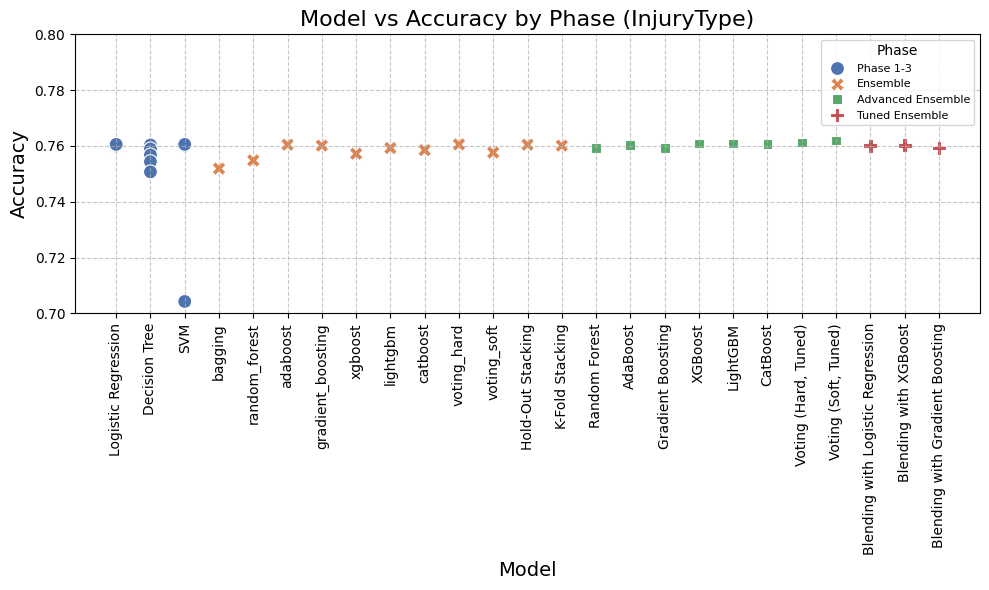

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=all_results_injurytype,
    x='Model',
    y='Accuracy',
    hue='Phase',
    style='Phase',
    s=100,
    palette='deep'
)

plt.title('Model vs Accuracy by Phase (InjuryType)', fontsize=16)
plt.xlabel('Model', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.legend(title='Phase', fontsize=8)
plt.xticks(rotation=90)
plt.ylim(0.7, 0.8)  # Set y-axis range
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

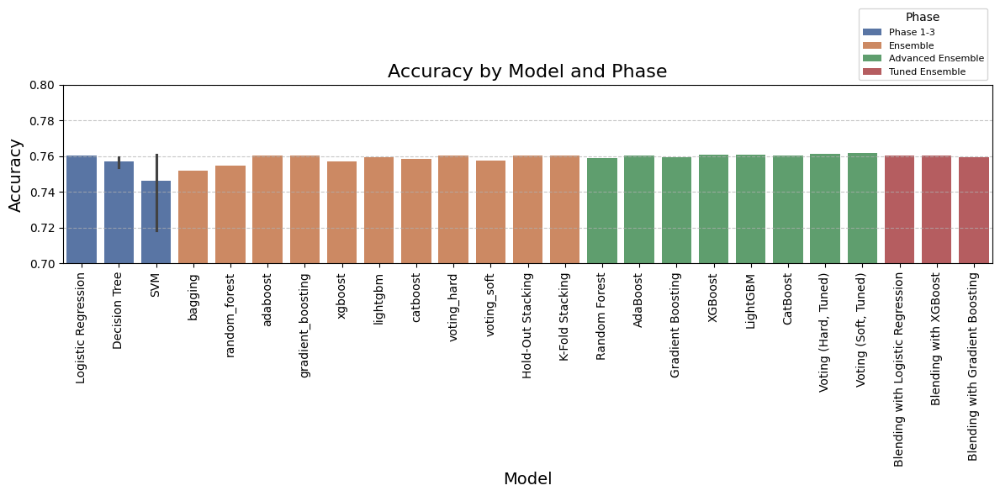

In [ ]:
plt.figure(figsize=(12, 6))
sns.barplot(
    data=all_results_injurytype,
    x='Model',
    y='Accuracy',
    hue='Phase',
    palette='deep'
)

plt.title('Accuracy by Model and Phase', fontsize=16)
plt.xlabel('Model', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.xticks(rotation=90)
plt.ylim(0.7, 0.8)  # Set y-axis range
plt.legend(title='Phase', fontsize=8, loc='lower right', bbox_to_anchor=(1, 1))
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

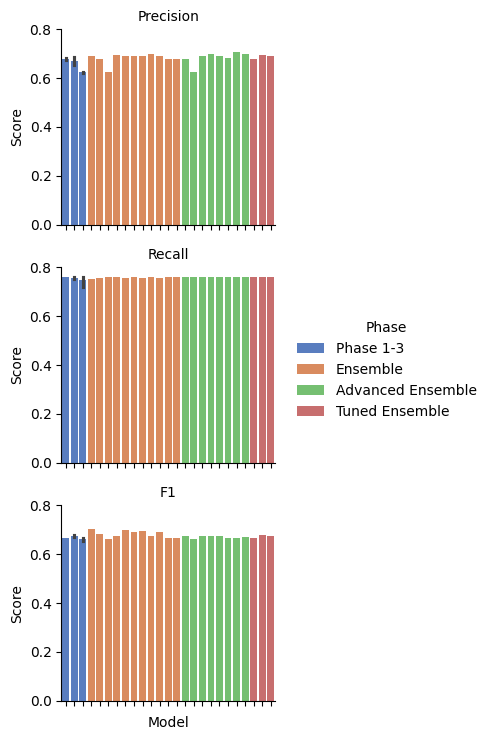

In [ ]:
melted_results = all_results_injurytype.melt(
    id_vars=['Model', 'Phase'],
    value_vars=['Precision', 'Recall', 'F1'],
    var_name='Metric',
    value_name='Score'
)

g = sns.catplot(
    data=melted_results,
    x='Model',
    y='Score',
    hue='Phase',
    col='Metric',
    kind='bar',
    col_wrap=1,
    height=2.5,
    aspect=1.2,
    palette='muted',

)

g.set_titles("{col_name}")
g.set_xticklabels(rotation=90)
g.set_axis_labels('Model', 'Score')
g.tight_layout()
plt.show()

### PatientStatus

Model vs Accuracy by Phase (PatientStatus)

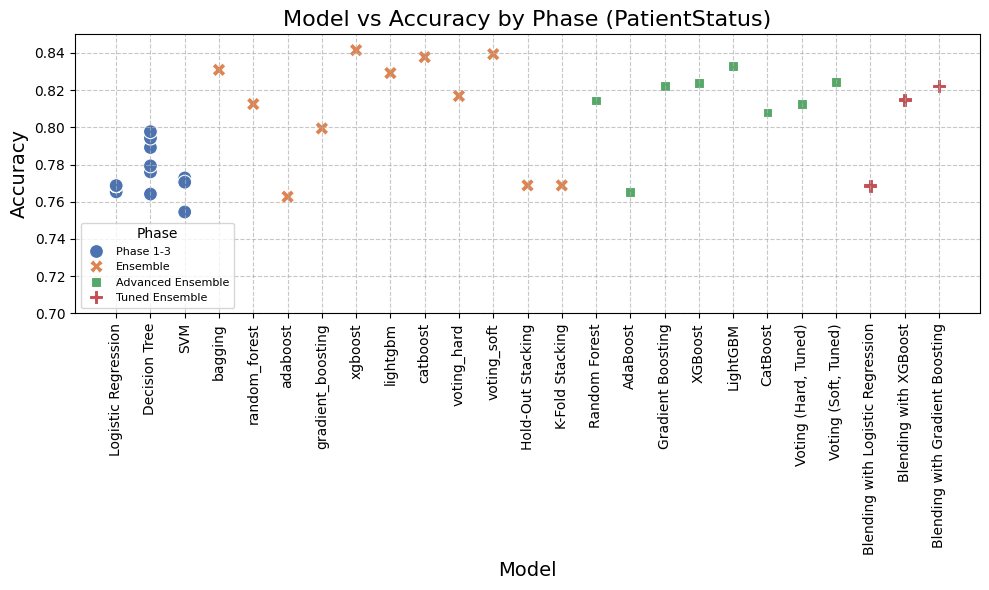

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=all_results_patientstatus,
    x='Model',
    y='Accuracy',
    hue='Phase',
    style='Phase',
    s=100,
    palette='deep'
)

plt.title('Model vs Accuracy by Phase (PatientStatus)', fontsize=16)
plt.xlabel('Model', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.legend(title='Phase', fontsize=8)
plt.xticks(rotation=90)
plt.ylim(0.7, 0.85)  # Set y-axis range
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

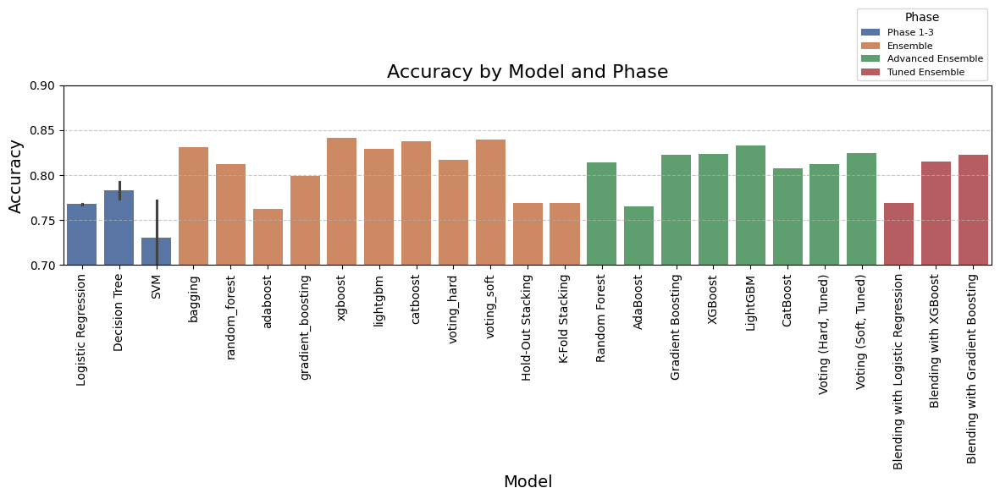

In [ ]:
plt.figure(figsize=(12, 6))
sns.barplot(
    data=all_results_patientstatus,
    x='Model',
    y='Accuracy',
    hue='Phase',
    palette='deep'
)

plt.title('Accuracy by Model and Phase', fontsize=16)
plt.xlabel('Model', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.xticks(rotation=90)
plt.ylim(0.7, 0.9)  # Set y-axis range
plt.legend(title='Phase', fontsize=8, loc='lower right', bbox_to_anchor=(1, 1))
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

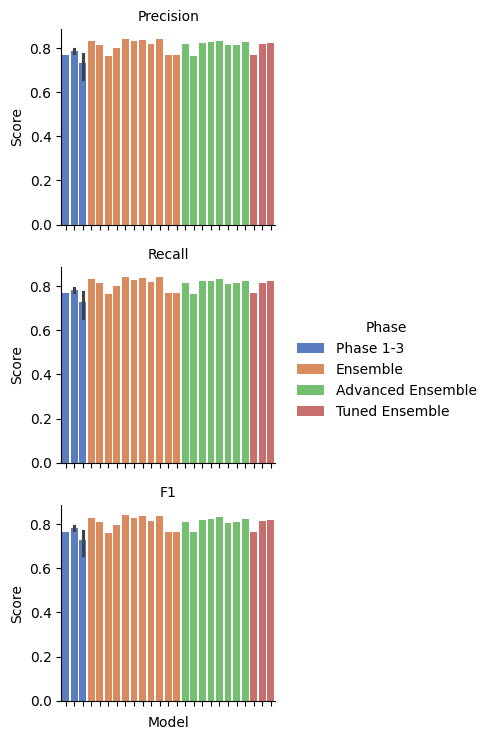

In [ ]:
melted_results = all_results_patientstatus.melt(
    id_vars=['Model', 'Phase'],
    value_vars=['Precision', 'Recall', 'F1'],
    var_name='Metric',
    value_name='Score'
)

g = sns.catplot(
    data=melted_results,
    x='Model',
    y='Score',
    hue='Phase',
    col='Metric',
    kind='bar',
    col_wrap=1,
    height=2.5,
    aspect=1.2,
    palette='muted',

)

g.set_titles("{col_name}")
g.set_xticklabels(rotation=90)
g.set_axis_labels('Model', 'Score')
g.tight_layout()
plt.show()

# Feature Engineering

## Load DF

In [ ]:
import pandas as pd

scaled_df = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/new_scaled_df.csv')

print("dataframe loaded")
# preprocess
scaled_df.drop(['Gender_Female'], axis=1, inplace=True)

# Ensure feature names have no whitespace
scaled_df.columns = scaled_df.columns.str.replace(' ', '_')

dataframe loaded


In [ ]:
scaled_df

,CallTime,TotalPatientsInEmergency,Age,responsetime,EducationTitle,InjuryType,PatientStatus,BicycleInvovled,BikesInvolved,BusesInvolved,...,EcYear_2023,EmergencyArea_Encoded,Reason_Encoded,HospitalName_Encoded,CallTime_Day,IsWeekend,CallTime_Hour_sin,CallTime_Hour_cos,CallTime_Month_sin,CallTime_Month_cos
0,0.279808,-0.378748,-0.359377,1.063250,4.0,0.0,1.0,0.0,1.0,0.0,...,0,1.000000,0.386820,1.000000,1.0,0,-0.500000,8.660254e-01,-2.449294e-16,1.000000
1,0.279799,-0.378748,-0.825731,1.592044,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.077438,0.531631,0.134399,1.0,0,-0.500000,8.660254e-01,-2.449294e-16,1.000000
2,0.279783,-0.378748,1.039685,1.063250,0.0,1.0,1.0,0.0,0.0,0.0,...,0,0.333333,0.259802,1.000000,1.0,0,-0.707107,7.071068e-01,-2.449294e-16,1.000000
3,0.279767,-0.378748,0.839819,-0.258736,3.0,0.0,0.0,0.0,0.0,0.0,...,0,0.064443,0.531631,1.000000,1.0,0,-0.707107,7.071068e-01,-2.449294e-16,1.000000
4,0.279756,-0.378748,-0.692487,-0.258736,3.0,1.0,0.0,0.0,2.0,0.0,...,0,0.333333,0.481713,1.000000,1.0,0,-0.707107,7.071068e-01,-2.449294e-16,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46182,0.838316,0.736465,-0.825731,-0.787530,0.0,1.0,1.0,0.0,0.0,0.0,...,1,0.074893,0.460461,0.130602,0.0,1,1.000000,6.123234e-17,5.000000e-01,0.866025
46183,0.838236,-0.378748,-1.092219,1.327647,0.0,0.0,1.0,0.0,1.0,0.0,...,1,0.086549,0.817298,0.966324,0.0,1,0.866025,5.000000e-01,5.000000e-01,0.866025
46184,0.838168,-0.378748,-1.491951,-1.316324,1.0,0.0,0.0,0.0,0.0,0.0,...,1,0.333333,1.000000,1.000000,0.0,1,0.500000,8.660254e-01,5.000000e-01,0.866025
46185,0.838161,-0.378748,-0.892353,1.592044,1.0,0.0,0.0,0.0,1.0,0.0,...,1,0.052385,0.124382,0.966324,0.0,1,0.500000,8.660254e-01,5.000000e-01,0.866025


In [ ]:
print(scaled_df.isnull().sum())

CallTime                    0
TotalPatientsInEmergency    0
Age                         0
responsetime                0
EducationTitle              0
InjuryType                  0
PatientStatus               0
BicycleInvovled             0
BikesInvolved               0
BusesInvolved               0
CarsInvolved                0
CartInvovled                0
RickshawsInvolved           0
TractorInvovled             0
TrainsInvovled              0
TrucksInvolved              0
VansInvolved                0
OthersInvolved              0
Gender_Male                 0
Gender_Other                0
Cause_Carelessness          0
Cause_One_Wheeling          0
Cause_Others                0
Cause_Over_Speed            0
Cause_Tyre_Burst            0
Cause_U_Turn                0
Cause_Wrong_Turn            0
EcYear_2020                 0
EcYear_2021                 0
EcYear_2022                 0
EcYear_2023                 0
EmergencyArea_Encoded       0
Reason_Encoded              0
HospitalNa

## Classification Goal


**Classification Goal** <br>
The target variable is `InjuryType`, and the goal is to classify it based on the features in the dataset. The final model (a Decision Tree Classifier) is used to predict `InjuryType`.

**Key Elements in the Code** <br>
1. **Feature Engineering and Preprocessing**:
   - **Polynomial Features**: Additional interaction terms are created, which can help capture non-linear relationships.
   - **Statistical Features**: Features such as mean, standard deviation, min, and max are computed for each row.
   - **Clustering Features**: Clustering labels are added as features (not standard in classification workflows, but it could help if clusters have meaningful relations to the target variable).
   - **Outlier Detection**: Isolation Forest is used to identify and flag outliers.
   - **Scaling**: StandardScaler is applied for normalization, essential for most machine learning algorithms.

2. **Feature Selection and Dimensionality Reduction**:
   - **Variance Thresholding**: Removes features with very low variance.
   - **Correlation-Based Feature Removal**: Removes highly correlated features.
   - **PCA**: Further reduces dimensions based on explained variance.

3. **Classification**:
   - A **Decision Tree Classifier** is trained on the processed dataset.
   - **Hyperparameter Tuning**: Models are evaluated for different `max_depth` values.
   - **Evaluation Metrics**: Accuracy, precision, recall, F1-score, and confusion matrix are calculated.

4. **Imbalanced Data Handling**:
   - The use of `class_weight='balanced'` in the Decision Tree suggests the code considers potential class imbalance.

5. **Visualization**:
   - Confusion matrices and accuracy trends are plotted to understand model performance.


- The `stratify` parameter for `train_test_split` is used, ensuring class distribution remains consistent in train and test splits.
- The dataset undergoes significant dimensionality expansion with polynomial features, which might introduce noise. This is mitigated by PCA and variance thresholding.


## Feature Engineering

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.cluster import KMeans
from sklearn.ensemble import IsolationForest

In [ ]:
df = scaled_df.copy()

In [ ]:
# Function to handle duplicate columns
def remove_duplicate_columns(df):
    if df.columns.duplicated().any():
        print("Duplicate columns detected. Removing duplicates.")
        df = df.loc[:, ~df.columns.duplicated()]
    return df

In [ ]:
# ==================================
# 1. Polynomial and Interaction Features
# ==================================
def add_polynomial_features(X, degree=2):
    poly = PolynomialFeatures(degree=degree, interaction_only=True, include_bias=False)
    poly_features = poly.fit_transform(X)
    feature_names = poly.get_feature_names_out(X.columns)
    poly_df = pd.DataFrame(poly_features, columns=feature_names)

    # Handle any NaN or infinite values
    poly_df.replace([np.inf, -np.inf], np.nan, inplace=True)
    poly_df.fillna(0, inplace=True)

    return poly_df

numerical_features = df.select_dtypes(include=[np.number])  # Select numerical columns
df_poly = add_polynomial_features(numerical_features, degree=2)

# Merge polynomial features back into the dataset
df = pd.concat([df, df_poly], axis=1)

# Handle duplicates after polynomial features
df = remove_duplicate_columns(df)

Duplicate columns detected. Removing duplicates.


In [ ]:
# ==================================
# 2. Statistical Aggregates
# ==================================
def add_statistical_features(X):
    X['feature_mean'] = X.mean(axis=1)
    X['feature_std'] = X.std(axis=1)
    X['feature_min'] = X.min(axis=1)
    X['feature_max'] = X.max(axis=1)

    # Handle NaN values introduced during calculations
    X.fillna(0, inplace=True)
    return X

df = add_statistical_features(df)

# Handle duplicates after statistical features
df = remove_duplicate_columns(df)

In [ ]:
# ==================================
# 3. Clustering Features
# ==================================
def add_clustering_features(X, n_clusters=5):
    # Handle any potential issues with NaNs
    X.replace([np.inf, -np.inf], np.nan, inplace=True)
    X.fillna(0, inplace=True)

    # Perform clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    clusters = kmeans.fit_predict(X)
    X['cluster'] = clusters
    return X

# Ensure only numerical columns are passed to clustering
numerical_features = df.select_dtypes(include=[np.number])
df = add_clustering_features(numerical_features)

# Handle duplicates after clustering features
df = remove_duplicate_columns(df)

In [ ]:
# ==================================
# 4. Outlier Handling with Isolation Forest
# ==================================
def handle_outliers(X):
    iso = IsolationForest(contamination=0.05, random_state=42)
    outliers = iso.fit_predict(X)
    X['is_outlier'] = (outliers == -1).astype(int)  # Mark outliers as 1
    return X

df = handle_outliers(df)

# Handle duplicates after outlier handling
df = remove_duplicate_columns(df)

In [ ]:
# ==================================
# 5. Scaling (Final Step for ML Compatibility)
# ==================================
scaler = StandardScaler()

# Select numerical columns for scaling
numerical_columns = df.select_dtypes(include=[np.number])

# Scale the data
scaled_features = scaler.fit_transform(numerical_columns)

# Create a DataFrame for scaled features
df_scaled = pd.DataFrame(scaled_features, columns=numerical_columns.columns)

# Combine scaled numerical data with original non-numerical features
df_final = pd.concat([df_scaled, df.select_dtypes(exclude=[np.number])], axis=1)

# Handle duplicates after final scaling
df_final = remove_duplicate_columns(df_final)

## Featured DF Summary

In [ ]:
# ==================================
# Summary of Transformed Data
# ==================================
print("Transformed DataFrame:")
df_final.head()

Transformed DataFrame:


,CallTime,TotalPatientsInEmergency,Age,responsetime,EducationTitle,InjuryType,PatientStatus,BicycleInvovled,BikesInvolved,BusesInvolved,...,CallTime_Hour_sin CallTime_Month_cos,CallTime_Hour_cos CallTime_Month_sin,CallTime_Hour_cos CallTime_Month_cos,CallTime_Month_sin CallTime_Month_cos,feature_mean,feature_std,feature_min,feature_max,cluster,is_outlier
0,-0.871975,-0.378748,-0.359377,1.063250,1.255666,-0.481848,0.878265,-0.093354,0.056600,-0.091698,...,-0.986229,0.03332,1.771112,0.020139,1.602585,0.718341,0.358727,0.153403,1.126486,-0.22945
1,-0.872006,-0.378748,-0.825731,1.592044,-1.269305,-0.481848,-1.032898,-0.093354,-1.671205,-0.091698,...,-0.986229,0.03332,1.771112,0.020139,-0.550349,-1.038590,0.888297,-0.701298,-0.788845,-0.22945
2,-0.872061,-0.378748,1.039685,1.063250,-1.269305,0.613060,0.878265,-0.093354,-1.671205,-0.091698,...,-1.392547,0.03332,1.453518,0.020139,1.041974,-0.671061,1.323117,-0.857594,-0.788845,-0.22945
3,-0.872117,-0.378748,0.839819,-0.258736,0.624423,-0.481848,-1.032898,-0.093354,-1.671205,-0.091698,...,-1.392547,0.03332,1.453518,0.020139,0.715693,0.205060,0.264989,0.714541,0.168821,-0.22945
4,-0.872154,-0.378748,-0.692487,-0.258736,0.624423,0.613060,-1.032898,-0.093354,1.784404,-0.091698,...,-1.392547,0.03332,1.453518,0.020139,0.580270,0.347471,0.264989,0.714541,0.168821,-0.22945


In [ ]:
print(df_final.columns)

Index(['CallTime', 'TotalPatientsInEmergency', 'Age', 'responsetime',
       'EducationTitle', 'InjuryType', 'PatientStatus', 'BicycleInvovled',
       'BikesInvolved', 'BusesInvolved',
       ...
       'CallTime_Hour_sin CallTime_Month_cos',
       'CallTime_Hour_cos CallTime_Month_sin',
       'CallTime_Hour_cos CallTime_Month_cos',
       'CallTime_Month_sin CallTime_Month_cos', 'feature_mean', 'feature_std',
       'feature_min', 'feature_max', 'cluster', 'is_outlier'],
      dtype='object', length=826)


# Train and Test Models for InjuryType

## Imports

In [ ]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 9.9 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold, cross_val_predict, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder, PolynomialFeatures
from sklearn.feature_selection import VarianceThreshold, RFE
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, GradientBoostingClassifier, AdaBoostClassifier, StackingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
import catboost as cb
import lightgbm as lgb
from sklearn.calibration import CalibratedClassifierCV
import warnings
from sklearn.exceptions import ConvergenceWarning

## Split

In [ ]:
# ==================================
# Step 1: Load Dataset
# ==================================
target_column = 'InjuryType'

X = df_final.drop(columns=[target_column])

# Ensure y is a Series by selecting the first column if multiple columns are returned***
y = df_final[[target_column]]

# Correctly check the number of unique values in y (access target column as Series)
stratify = y[target_column] if len(y[target_column].unique()) > 2 else None

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=stratify
)

# ==================================
# Step 2: Variance Thresholding
# ==================================
def variance_thresholding(df, threshold=0.01):
    selector = VarianceThreshold(threshold=threshold)
    reduced_data = selector.fit_transform(df)
    selected_columns = df.columns[selector.get_support()]
    return pd.DataFrame(reduced_data, columns=selected_columns), selector

# Apply Variance Thresholding to training data
X_train_reduced, var_thresh_selector = variance_thresholding(X_train)

# Apply the same transformation to test data
X_test_reduced = var_thresh_selector.transform(X_test)
X_test_reduced = pd.DataFrame(X_test_reduced, columns=X_train_reduced.columns)

# ==================================
# Step 3: Correlation-Based Removal
# ==================================
def remove_high_correlation(df, threshold=0.95):
    correlation_matrix = df.corr().abs()
    upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper_triangle.columns if any(upper_triangle[column] > threshold)]
    return df.drop(columns=to_drop)

# Remove highly correlated features in training data
X_train_reduced = remove_high_correlation(X_train_reduced)

# Align test data by selecting only the remaining columns
X_test_reduced = X_test_reduced[X_train_reduced.columns]

# ==================================
# Step 4: PCA for Dimensionality Reduction
# ==================================
def apply_pca(df, variance_threshold=0.95):
    pca = PCA(n_components=variance_threshold, random_state=42)
    pca_features = pca.fit_transform(df)
    columns = [f'PC{i+1}' for i in range(pca.n_components_)]
    return pd.DataFrame(pca_features, columns=columns), pca

# Apply PCA to training data
X_train_pca, pca_model = apply_pca(X_train_reduced)

# Apply the same PCA transformation to test data
X_test_pca = pca_model.transform(X_test_reduced)
X_test_pca = pd.DataFrame(X_test_pca, columns=[f'PC{i+1}' for i in range(X_test_pca.shape[1])])

# ==================================
# Assign PCA-Transformed Data Back to X_train and X_test
# ==================================
#X_train = X_train_pca  # Use PCA-transformed training data
#X_test = X_test_pca    # Use PCA-transformed test data

# ==================================
# Step 5: Summary and Diagnostics
# ==================================
print("Initial Columns:", X.shape[1])
print("After Variance Thresholding:", X_train_reduced.shape[1])
print("After Correlation Removal:", X_train_reduced.shape[1])  # Same as above since correlation doesn't add columns
print("After PCA Reduction:", X_train_pca.shape[1])

# ==================================
# Combine processed features and target variable
# ==================================
X_train['InjuryType'] = y_train
X_test['InjuryType'] = y_test

# Convert to categorical classes
y_train = pd.cut(y_train[target_column], bins=5, labels=False)
y_test = pd.cut(y_test[target_column], bins=5, labels=False)

# Print the unique categorical values after conversion
print(f"Categorical target values in y_train: {y_train.unique()}")
print(f"Categorical target values in y_test: {y_test.unique()}")

## Train with DT

In [ ]:
from sklearn.tree import DecisionTreeClassifier
# Function to train, test, and evaluate a Decision Tree model
def train_evaluate_decision_tree(X_train, y_train, X_test, y_test, max_depth):
    # Initialize the model with class_weight='balanced' to handle class imbalance
    model = DecisionTreeClassifier(max_depth=max_depth, random_state=42)
    model.fit(X_train, y_train)

    # Predict on test set
    y_pred = model.predict(X_test)

    # Calculate performance metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)

    # Include all labels in the confusion matrix
    cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_train))

    return accuracy, precision, recall, f1, cm

In [ ]:
# Define max_depth values to evaluate
max_depths = [4, 5, 6, 7, 8, 9,]

# Store results in a list for easy formatting later
results = []

# Train and evaluate Decision Tree models for each max_depth
for max_depth in max_depths:
    print(f'Training Decision Tree model with max_depth={max_depth}...')
    accuracy, precision, recall, f1, cm = train_evaluate_decision_tree(X_train_pca, y_train, X_test_pca, y_test, max_depth)

    # Append results for each configuration
    results.append([max_depth, accuracy, precision, recall, f1, cm])

# Convert results to a DataFrame for better display
results_df = pd.DataFrame(results, columns=['Max_depth', 'Accuracy', 'Precision', 'Recall', 'F1', 'Confusion Matrix'])

# Display the results
print("Decision Tree Evaluation Results:")
print(results_df[['Max_depth', 'Accuracy', 'Precision', 'Recall', 'F1']])

Training Decision Tree model with max_depth=4...
Training Decision Tree model with max_depth=5...
Training Decision Tree model with max_depth=6...
Training Decision Tree model with max_depth=7...
Training Decision Tree model with max_depth=8...
Training Decision Tree model with max_depth=9...
Decision Tree Evaluation Results:
   Max_depth  Accuracy  Precision    Recall        F1
0          4  0.789781   0.730511  0.789781  0.742520
1          5  0.798874   0.749147  0.798874  0.759278
2          6  0.809158   0.777650  0.809158  0.791808
3          7  0.819333   0.798727  0.819333  0.806932
4          8  0.825503   0.805340  0.825503  0.813589
5          9  0.828210   0.813134  0.828210  0.819663


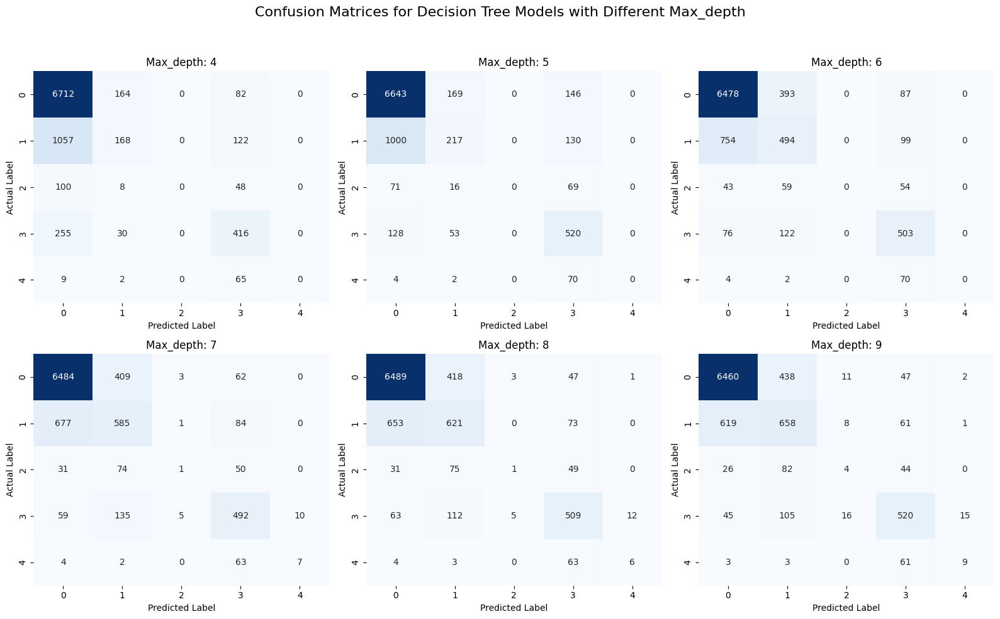

In [ ]:
# Plot confusion matrices for each max_depth
def plot_confusion_matrices():
    fig, axes = plt.subplots(2, 3, figsize=(16, 10))  # 2 rows, 3 columns grid
    fig.suptitle('Confusion Matrices for Decision Tree Models with Different Max_depth', fontsize=16)

    for i, max_depth in enumerate(max_depths):
        cm = results_df[results_df['Max_depth'] == max_depth]['Confusion Matrix'].values[0]
        ax = axes[i // 3, i % 3]
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, ax=ax)
        ax.set_title(f'Max_depth: {max_depth}')
        ax.set_xlabel('Predicted Label')
        ax.set_ylabel('Actual Label')

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust to make space for the title
    plt.show()

# Call the function to plot confusion matrices
plot_confusion_matrices()

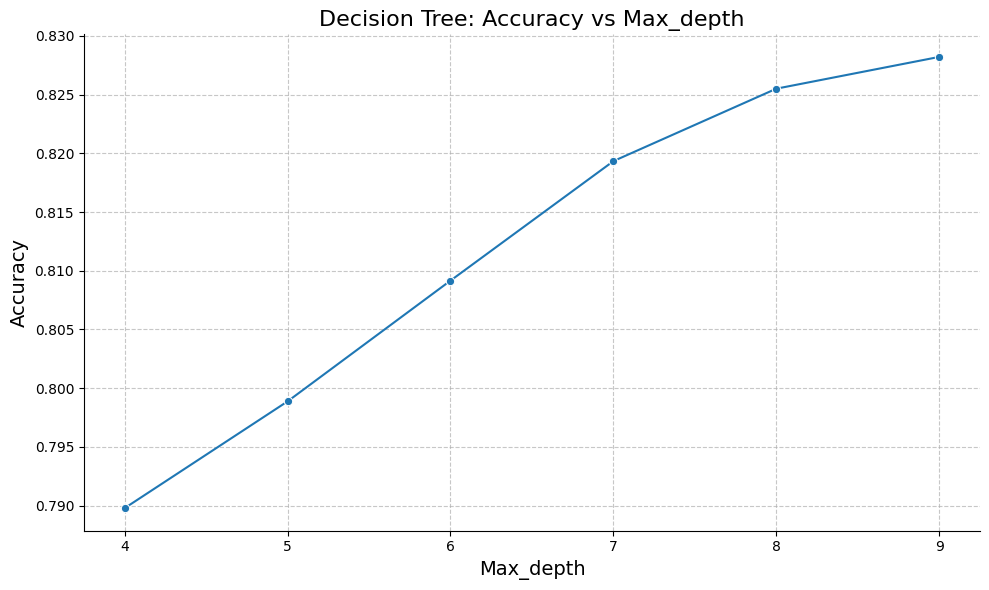

In [ ]:
# Plot Accuracy vs Max_depth
plt.figure(figsize=(10, 6))
sns.lineplot(x='Max_depth', y='Accuracy', marker='o', data=results_df)
plt.title('Decision Tree: Accuracy vs Max_depth', fontsize=16)
plt.ylabel('Accuracy', fontsize=14)
plt.xlabel('Max_depth', fontsize=14)
plt.xticks(max_depths)
sns.despine()  # Remove top and right borders for cleaner visuals
plt.grid(True, linestyle='--', alpha=0.7)  # Light grid lines for clarity
plt.tight_layout()
plt.show()

In [ ]:
# # Save the dataframes locally as CSV files
# file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_injury/results_df_dt.csv'

# results_df.to_csv(file_path, index=False)

## Cross Validation on Decision Trees

In [ ]:
# Function to train, test, and evaluate a Decision Tree model with cross-validation
def train_evaluate_decision_tree_cv(X, y, max_depth, n_splits=5):
    # Stratified K-Fold for robust evaluation
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    # Initialize the Decision Tree model
    base_model = DecisionTreeClassifier(max_depth=max_depth, random_state=42)
    calibrated_model = CalibratedClassifierCV(base_model, method='sigmoid', cv=3)  # Calibration

    # Cross-validation predictions
    y_pred = cross_val_predict(calibrated_model, X, y, cv=skf, method='predict')
    y_proba = cross_val_predict(calibrated_model, X, y, cv=skf, method='predict_proba')

    # Performance metrics
    accuracy = accuracy_score(y, y_pred)
    precision = precision_score(y, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y, y_pred, average='weighted', zero_division=0)
    auc = roc_auc_score(y, y_proba, multi_class='ovr') if len(np.unique(y)) > 2 else np.nan

    return accuracy, precision, recall, f1, auc

In [ ]:
# Define max_depth values to evaluate
max_depths = [4, 5, 6, 7, 8, 9]

# Store results for cross-validation
cv_results = []

print("Performing cross-validation...")
for max_depth in max_depths:
    print(f"Evaluating Decision Tree model with max_depth={max_depth}...")
    accuracy, precision, recall, f1, auc = train_evaluate_decision_tree_cv(X_train_pca, y_train, max_depth)
    cv_results.append([max_depth, accuracy, precision, recall, f1, auc])

# Convert results to a DataFrame for better display
cv_results_df = pd.DataFrame(cv_results, columns=['Max_depth', 'Accuracy', 'Precision', 'Recall', 'F1', 'AUC'])

# Display the cross-validation results
print("Cross-Validation Results:")
print(cv_results_df)

Performing cross-validation...
Evaluating Decision Tree model with max_depth=4...
Evaluating Decision Tree model with max_depth=5...
Evaluating Decision Tree model with max_depth=6...
Evaluating Decision Tree model with max_depth=7...
Evaluating Decision Tree model with max_depth=8...
Evaluating Decision Tree model with max_depth=9...
Cross-Validation Results:
   Max_depth  Accuracy  Precision    Recall        F1       AUC
0          4  0.797802   0.735995  0.797802  0.749882  0.883253
1          5  0.810468   0.756811  0.810468  0.767350  0.898874
2          6  0.820130   0.774470  0.820130  0.782988  0.911400
3          7  0.828358   0.795162  0.828358  0.793503  0.917217
4          8  0.832959   0.796847  0.832959  0.798725  0.919888
5          9  0.834447   0.798838  0.834447  0.801088  0.914512


In [ ]:
# # Save the dataframes locally as CSV files
# file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_injury/results_df_dt_cv.csv'

# cv_results_df.to_csv(file_path, index=False)

## Out-of-Sample Testing (Holdout Set)


In [ ]:
# Out-of-Sample Testing (Holdout Set)
max_depths = [4, 5, 6, 7, 8, 9]
print("\nTesting on the holdout set (out-of-sample)...")
holdout_results = []

for max_depth in max_depths:
    print(f"Evaluating Decision Tree model with max_depth={max_depth} on the holdout set...")
    model = DecisionTreeClassifier(max_depth=max_depth, random_state=42)
    calibrated_model = CalibratedClassifierCV(model, method='sigmoid', cv=3)
    calibrated_model.fit(X_train_pca, y_train)

    # Predictions and probabilities for the holdout set
    y_pred = calibrated_model.predict(X_test_pca)
    y_proba = calibrated_model.predict_proba(X_test_pca)

    # Holdout set metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)
    auc = roc_auc_score(y_test, y_proba, multi_class='ovr') if len(np.unique(y_test)) > 2 else np.nan

    holdout_results.append([max_depth, accuracy, precision, recall, f1, auc])


Testing on the holdout set (out-of-sample)...
Evaluating Decision Tree model with max_depth=4 on the holdout set...
Evaluating Decision Tree model with max_depth=5 on the holdout set...
Evaluating Decision Tree model with max_depth=6 on the holdout set...
Evaluating Decision Tree model with max_depth=7 on the holdout set...
Evaluating Decision Tree model with max_depth=8 on the holdout set...
Evaluating Decision Tree model with max_depth=9 on the holdout set...


In [ ]:
# Convert holdout results to DataFrame
holdout_results_df = pd.DataFrame(holdout_results, columns=['Max_depth', 'Accuracy', 'Precision', 'Recall', 'F1', 'AUC'])

# Display the holdout set results
print("\nOut-of-Sample Testing Results (Holdout Set):")
print(holdout_results_df)


Out-of-Sample Testing Results (Holdout Set):
   Max_depth  Accuracy  Precision    Recall        F1       AUC
0          4  0.794544   0.740539  0.794544  0.759373  0.882179
1          5  0.809158   0.754557  0.809158  0.766349  0.898863
2          6  0.822905   0.777130  0.822905  0.789830  0.912848
3          7  0.831241   0.792226  0.831241  0.800583  0.920660
4          8  0.835354   0.799145  0.835354  0.806422  0.922608
5          9  0.836761   0.799937  0.836761  0.807137  0.922152


In [ ]:
# Save the dataframes locally as CSV files
file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_injury/results_df_holdout.csv'

holdout_results_df.to_csv(file_path, index=False)

In [ ]:
# cv_results_df = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_injury/results_df_dt.csv')

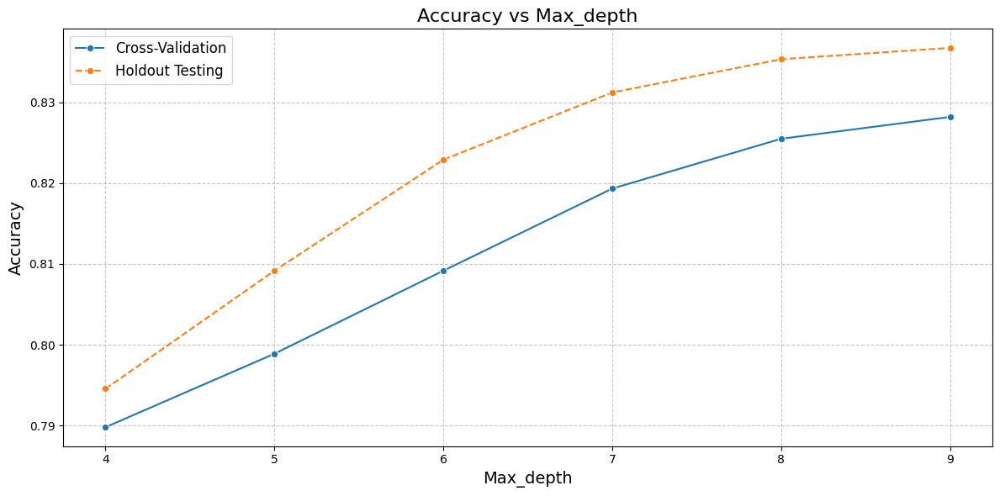

In [ ]:
# Visualization: Accuracy vs Max_depth
plt.figure(figsize=(12, 6))
sns.lineplot(x='Max_depth', y='Accuracy', data=cv_results_df, label='Cross-Validation', marker='o')
sns.lineplot(x='Max_depth', y='Accuracy', data=holdout_results_df, label='Holdout Testing', marker='o', linestyle='--')
plt.title('Accuracy vs Max_depth', fontsize=16)
plt.ylabel('Accuracy', fontsize=14)
plt.xlabel('Max_depth', fontsize=14)
plt.xticks(max_depths)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

## Logistic Regression and KNN

In [ ]:
# List of models to evaluate
models = {
    'Logistic Regression': LogisticRegression(class_weight='balanced', random_state=42),
    'KNN': KNeighborsClassifier(),
}

# Function to evaluate models without cross-validation
def evaluate_models_no_cv(models, X_train, y_train, X_test, y_test):
    results = []
    for name, model in models.items():
        print(f"Training {name}...")
        model.fit(X_train, y_train)  # Train the model
        y_pred = model.predict(X_test)  # Predict on test data

        # Calculate metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        # Collect results
        results.append([name, accuracy, precision, recall, f1])

    # Convert to DataFrame for better visualization
    results_df = pd.DataFrame(results, columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1'])
    return results_df

In [ ]:
# Evaluate the models
results_df = evaluate_models_no_cv(models, X_train_pca, y_train, X_test_pca, y_test)

# Display the results
print("Test Set Evaluation Results:")
print(results_df)

Training Logistic Regression...


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training KNN...
Test Set Evaluation Results:
                 Model  Accuracy  Precision    Recall        F1
0  Logistic Regression  0.993072   0.993169  0.993072  0.993105
1                  KNN  0.830483   0.793076  0.830483  0.800666


In [ ]:
results_df

,Model,Accuracy,Precision,Recall,F1
0,Logistic Regression,0.993072,0.993169,0.993072,0.993105
1,KNN,0.830483,0.793076,0.830483,0.800666


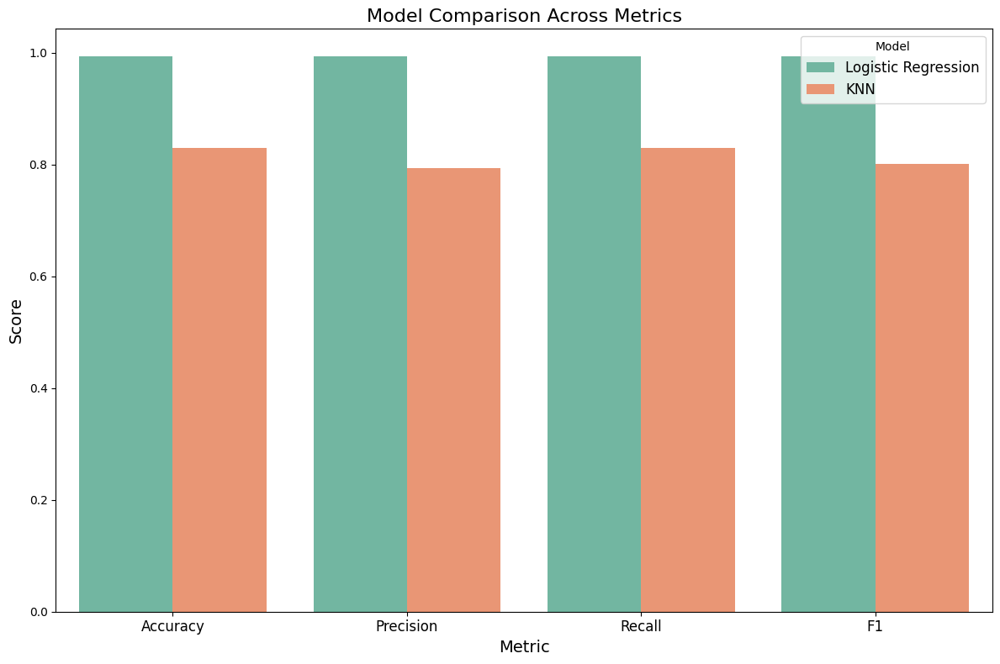

In [ ]:
# Plot the results
plt.figure(figsize=(12, 8))
sns.barplot(data=results_df.melt(id_vars='Model', var_name='Metric', value_name='Score'),
            x='Metric', y='Score', hue='Model', palette='Set2')
plt.title("Model Comparison Across Metrics", fontsize=16)
plt.ylabel("Score", fontsize=14)
plt.xlabel("Metric", fontsize=14)
plt.xticks(fontsize=12)
plt.legend(title='Model', fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
# Save the dataframes locally as CSV files
file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_injury/results_df_lr_knn_noCV.csv'

results_df.to_csv(file_path, index=False)

## Logistic Regression and KNN with Cross Validation

In [ ]:
from sklearn.model_selection import cross_val_score

In [ ]:
# List of models to evaluate
models = {
    'Logistic Regression': LogisticRegression(class_weight='balanced', random_state=42),
    'KNN': KNeighborsClassifier(),
}

# Function to evaluate models with cross-validation
def evaluate_models(models, X, y):
    results = []
    for name, model in models.items():
        print(f"Evaluating {name}...")
        # Cross-validation scores
        accuracy = cross_val_score(model, X, y, scoring='accuracy', cv=5).mean()
        precision = cross_val_score(model, X, y, scoring='precision_weighted', cv=5).mean()
        recall = cross_val_score(model, X, y, scoring='recall_weighted', cv=5).mean()
        f1 = cross_val_score(model, X, y, scoring='f1_weighted', cv=5).mean()

        # Collect results
        results.append([name, accuracy, precision, recall, f1])

    # Convert to DataFrame for better visualization
    results_df = pd.DataFrame(results, columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1'])
    return results_df

In [ ]:
# Evaluate the models
results_df = evaluate_models(models, X_train_pca, y_train)

# Display the results
print("Cross-Validation Results for Alternative Models:")
print(results_df)

Evaluating Logistic Regression...


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

Evaluating KNN...
Cross-Validation Results for Alternative Models:
                 Model  Accuracy  Precision    Recall        F1
0  Logistic Regression  0.990500   0.991204  0.990500  0.990741
1                  KNN  0.825219   0.784983  0.825219  0.792952


In [ ]:
results_df

,Model,Accuracy,Precision,Recall,F1
0,Logistic Regression,0.990500,0.991204,0.990500,0.990741
1,KNN,0.825219,0.784983,0.825219,0.792952


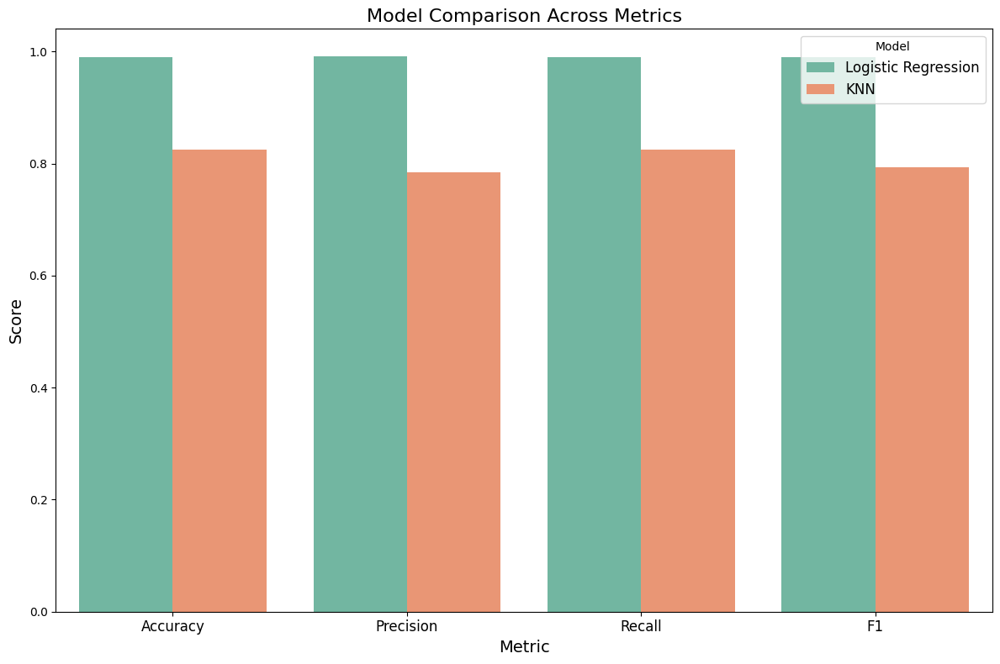

In [ ]:
# Plot the results
plt.figure(figsize=(12, 8))
sns.barplot(data=results_df.melt(id_vars='Model', var_name='Metric', value_name='Score'),
            x='Metric', y='Score', hue='Model', palette='Set2')
plt.title("Model Comparison Across Metrics", fontsize=16)
plt.ylabel("Score", fontsize=14)
plt.xlabel("Metric", fontsize=14)
plt.xticks(fontsize=12)
plt.legend(title='Model', fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
# Save the dataframes locally as CSV files
file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_injury/results_df_lr_knn_CV.csv'

results_df.to_csv(file_path, index=False)

## XGBoost and Random Forest Classifier

In [ ]:
# Define models to evaluate
models = {
    'Random Forest': RandomForestClassifier(class_weight='balanced', random_state=42),
    'XGBoost': xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
}

# Function to evaluate models
def evaluate_models_no_cv(models, X_train, y_train, X_test, y_test):
    results = []
    for name, model in models.items():
        print(f"Training and Evaluating {name}...")
        # Train the model
        model.fit(X_train, y_train)

        # Predict on test data
        y_pred = model.predict(X_test)

        # Compute metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        # Collect results
        results.append([name, accuracy, precision, recall, f1])

    # Convert to DataFrame for better visualization
    results_df = pd.DataFrame(results, columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1'])
    return results_df

In [ ]:
# Evaluate the models
results_df = evaluate_models_no_cv(models, X_train_pca, y_train, X_test_pca, y_test)

# Display the results
print("Evaluation Results on Test Data:")
print(results_df)

Training and Evaluating Random Forest...
Training and Evaluating XGBoost...


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [00:58:38] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Evaluation Results on Test Data:
           Model  Accuracy  Precision    Recall        F1
0  Random Forest  0.836978   0.824254  0.836978  0.789718
1        XGBoost  0.962546   0.957562  0.962546  0.954454


In [ ]:
results_df

,Model,Accuracy,Precision,Recall,F1
0,Random Forest,0.836978,0.824254,0.836978,0.789718
1,XGBoost,0.962546,0.957562,0.962546,0.954454


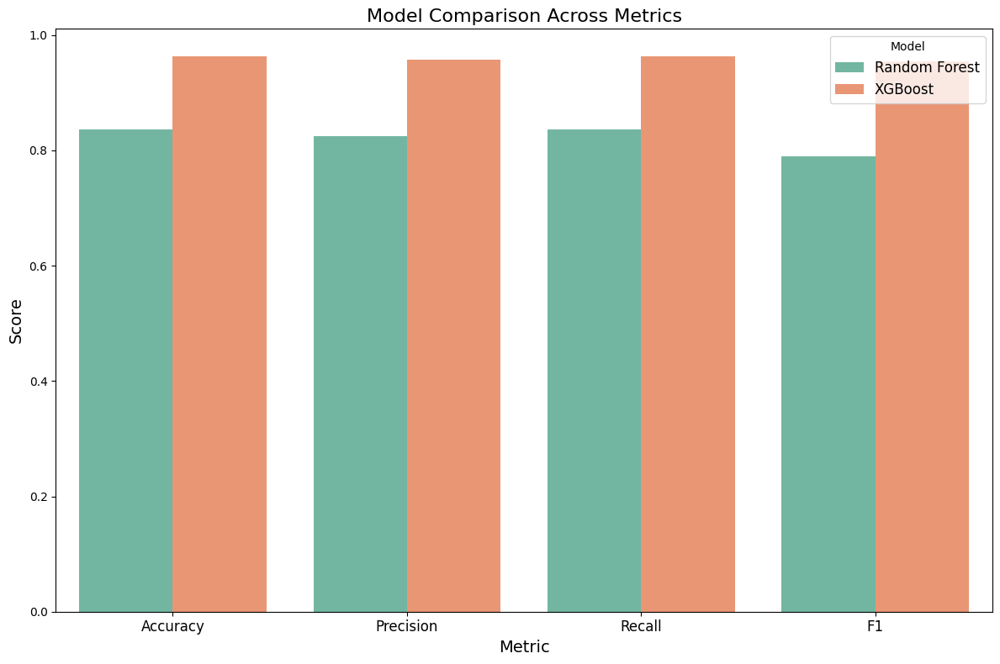

In [ ]:
# Plot the results
plt.figure(figsize=(12, 8))
sns.barplot(data=results_df.melt(id_vars='Model', var_name='Metric', value_name='Score'),
            x='Metric', y='Score', hue='Model', palette='Set2')
plt.title("Model Comparison Across Metrics", fontsize=16)
plt.ylabel("Score", fontsize=14)
plt.xlabel("Metric", fontsize=14)
plt.xticks(fontsize=12)
plt.legend(title='Model', fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
# Save the dataframes locally as CSV files
file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_injury/results_df_xgb_rf_noCV.csv'

results_df.to_csv(file_path, index=False)

## USING XGBOOST AND RANDOM FOREST CLASSIFIER WITH CROSS VALIDATION

In [ ]:
# List of models to evaluate
models = {
    'Random Forest': RandomForestClassifier(class_weight='balanced', random_state=42),
    'XGBoost': xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
}

# Function to evaluate models with cross-validation
def evaluate_models(models, X, y):
    results = []
    for name, model in models.items():
        print(f"Evaluating {name}...")
        # Cross-validation scores
        accuracy = cross_val_score(model, X, y, scoring='accuracy', cv=5).mean()
        precision = cross_val_score(model, X, y, scoring='precision_weighted', cv=5).mean()
        recall = cross_val_score(model, X, y, scoring='recall_weighted', cv=5).mean()
        f1 = cross_val_score(model, X, y, scoring='f1_weighted', cv=5).mean()

        # Collect results
        results.append([name, accuracy, precision, recall, f1])

    # Convert to DataFrame for better visualization
    results_df = pd.DataFrame(results, columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1'])
    return results_df

In [ ]:
# Evaluate the models
results_df = evaluate_models(models, X_train_pca, y_train)

# Display the results
print("Cross-Validation Results for Alternative Models:")
print(results_df)

Evaluating Random Forest...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/m

Evaluating XGBoost...


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [01:46:12] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [01:48:29] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [01:50:47] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [01:53:06] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [01:55:24] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_e

Cross-Validation Results for Alternative Models:
           Model  Accuracy  Precision    Recall        F1
0  Random Forest  0.828981   0.824391  0.828981  0.778497
1        XGBoost  0.954965   0.948873  0.954965  0.946076


In [ ]:
results_df

,Model,Accuracy,Precision,Recall,F1
0,Random Forest,0.828981,0.824391,0.828981,0.778497
1,XGBoost,0.954965,0.948873,0.954965,0.946076


In [ ]:
# Save the dataframes locally as CSV files
file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_injury/results_df_xgb_rf_CV.csv'

results_df.to_csv(file_path, index=False)

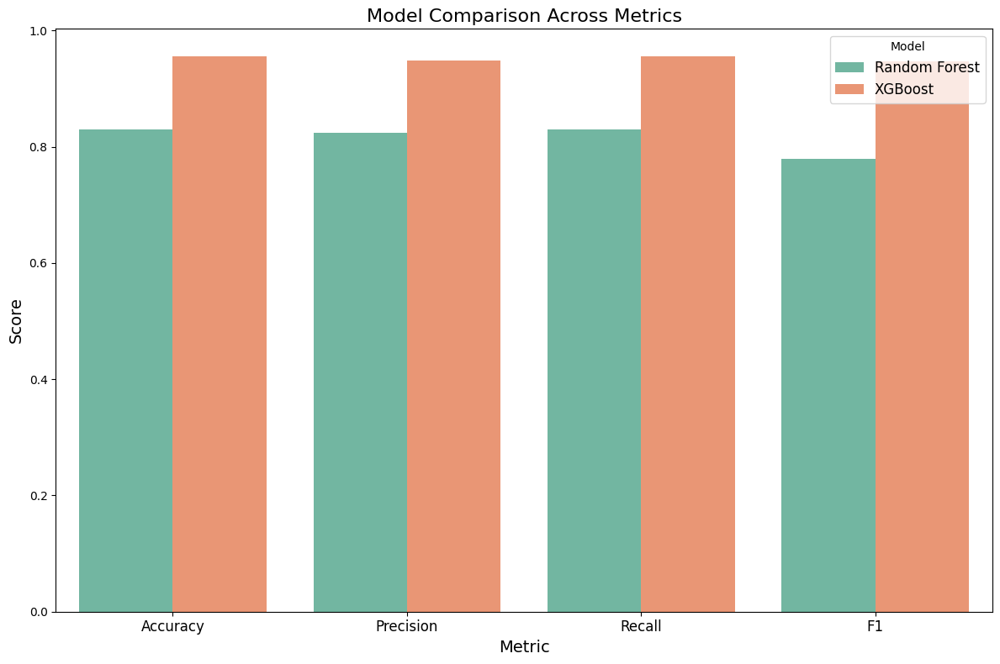

In [ ]:
# Plot the results
plt.figure(figsize=(12, 8))
sns.barplot(data=results_df.melt(id_vars='Model', var_name='Metric', value_name='Score'),
            x='Metric', y='Score', hue='Model', palette='Set2')
plt.title("Model Comparison Across Metrics", fontsize=16)
plt.ylabel("Score", fontsize=14)
plt.xlabel("Metric", fontsize=14)
plt.xticks(fontsize=12)
plt.legend(title='Model', fontsize=12)
plt.tight_layout()
plt.show()

## CatBoost and LightGBM

In [ ]:
# Define models to evaluate
models = {
    'CatBoost': cb.CatBoostClassifier(silent=True, random_state=42),
    'LightGBM': lgb.LGBMClassifier(random_state=42)
}

In [ ]:
# Function to evaluate models
def evaluate_models_no_cv(models, X_train, y_train, X_test, y_test):
    results = []
    for name, model in models.items():
        print(f"Training and Evaluating {name}...")
        # Train the model
        model.fit(X_train, y_train)

        # Predict on test data
        y_pred = model.predict(X_test)

        # Compute metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        # Collect results
        results.append([name, accuracy, precision, recall, f1])

    # Convert to DataFrame for better visualization
    results_df = pd.DataFrame(results, columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1'])
    return results_df

In [ ]:
# Evaluate the models
results_df = evaluate_models_no_cv(models, X_train_pca, y_train, X_test_pca, y_test)

# Display the results
print("Evaluation Results on Test Data:")
print(results_df)

Training and Evaluating CatBoost...
Training and Evaluating LightGBM...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.243245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 105825
[LightGBM] [Info] Number of data points in the train set: 36949, number of used features: 415
[LightGBM] [Info] Start training from score -0.283424
[LightGBM] [Info] Start training from score -1.924993
[LightGBM] [Info] Start training from score -4.084354
[LightGBM] [Info] Start training from score -2.579205
[LightGBM] [Info] Start training from score -4.796982
Evaluation Results on Test Data:
      Model  Accuracy  Precision    Recall        F1
0  CatBoost  0.979974   0.980415  0.979974  0.977152
1  LightGBM  0.955077   0.947245  0.955077  0.946438


In [ ]:
results_df

,Model,Accuracy,Precision,Recall,F1
0,CatBoost,0.979974,0.980415,0.979974,0.977152
1,LightGBM,0.955077,0.947245,0.955077,0.946438


In [ ]:
# Save the dataframes locally as CSV files
file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_injury/results_df_catboost_lightgbm.csv'

results_df.to_csv(file_path, index=False)

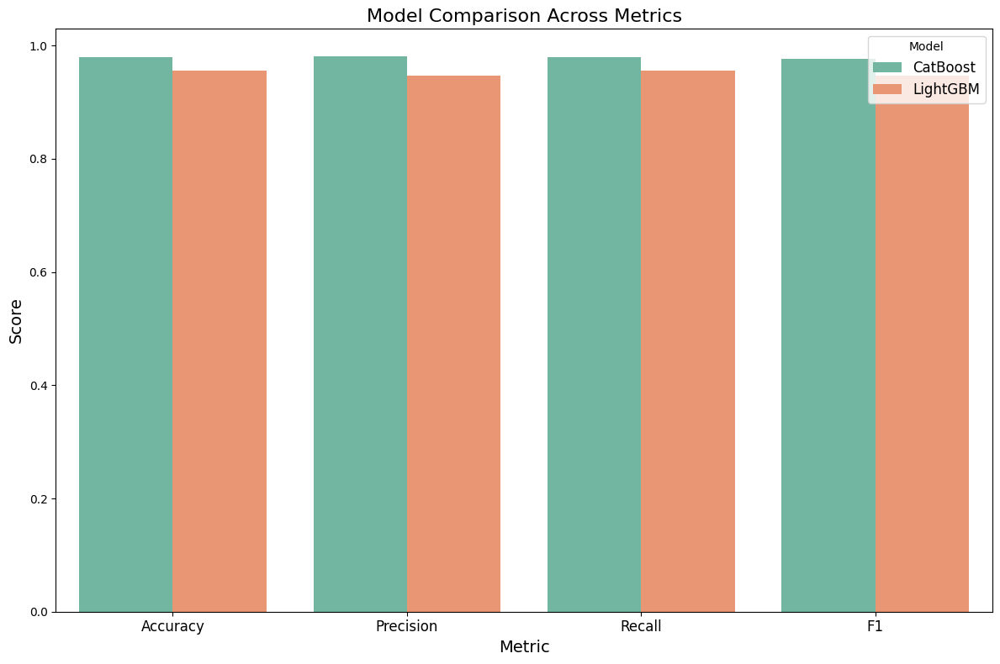

In [ ]:
# Plot the results
plt.figure(figsize=(12, 8))
sns.barplot(data=results_df.melt(id_vars='Model', var_name='Metric', value_name='Score'),
            x='Metric', y='Score', hue='Model', palette='Set2')
plt.title("Model Comparison Across Metrics", fontsize=16)
plt.ylabel("Score", fontsize=14)
plt.xlabel("Metric", fontsize=14)
plt.xticks(fontsize=12)
plt.legend(title='Model', fontsize=12)
plt.tight_layout()
plt.show()

## Adaboost and Gradient Boosting


In [ ]:
# Define models to evaluate
models = {
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'AdaBoost': AdaBoostClassifier(random_state=42)
}

# Function to evaluate models
def evaluate_models_no_cv(models, X_train, y_train, X_test, y_test):
    results = []
    for name, model in models.items():
        print(f"Training and Evaluating {name}...")
        # Train the model
        model.fit(X_train, y_train)

        # Predict on test data
        y_pred = model.predict(X_test)

        # Compute metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        # Collect results
        results.append([name, accuracy, precision, recall, f1])

    # Convert to DataFrame for better visualization
    results_df = pd.DataFrame(results, columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1'])
    return results_df

In [ ]:
# Evaluate the models
results_df = evaluate_models_no_cv(models, X_train_pca, y_train, X_test_pca, y_test)

# Display the results
print("Evaluation Results on Test Data:")
print(results_df)

Training and Evaluating Gradient Boosting...
Training and Evaluating AdaBoost...


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Evaluation Results on Test Data:
               Model  Accuracy  Precision    Recall        F1
0  Gradient Boosting  0.913509   0.897294  0.913509  0.900454
1           AdaBoost  0.804070   0.851988  0.804070  0.814219


In [ ]:
results_df

,Model,Accuracy,Precision,Recall,F1
0,Gradient Boosting,0.913509,0.897294,0.913509,0.900454
1,AdaBoost,0.804070,0.851988,0.804070,0.814219


In [ ]:
# Save the dataframes locally as CSV files
file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_injury/results_df_adaboost_gradientboost.csv'

results_df.to_csv(file_path, index=False)

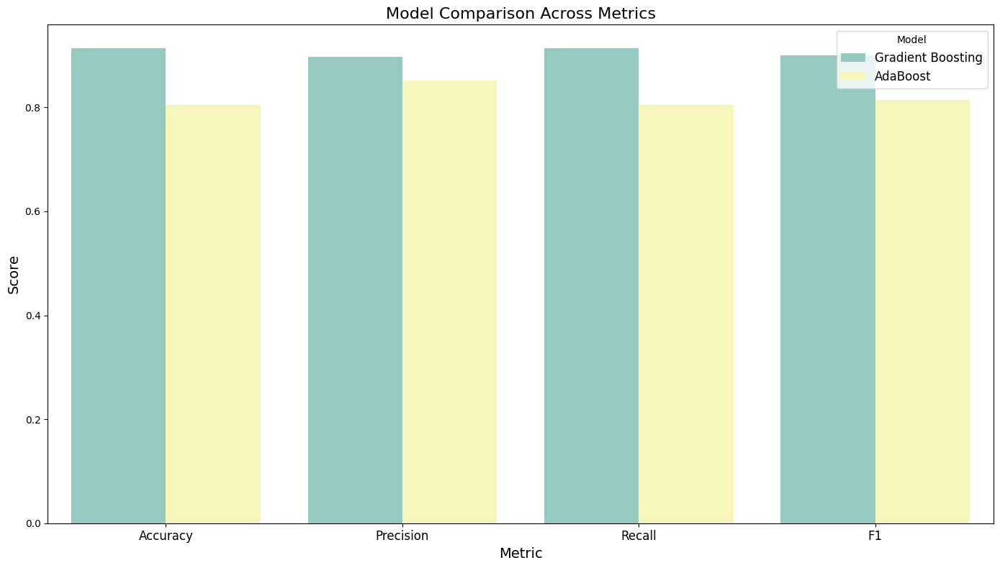

In [ ]:
# Plot the results
plt.figure(figsize=(14, 8))
sns.barplot(data=results_df.melt(id_vars='Model', var_name='Metric', value_name='Score'),
            x='Metric', y='Score', hue='Model', palette='Set3')
plt.title("Model Comparison Across Metrics", fontsize=16)
plt.ylabel("Score", fontsize=14)
plt.xlabel("Metric", fontsize=14)
plt.xticks(fontsize=12)
plt.legend(title='Model', fontsize=12)
plt.tight_layout()
plt.show()

## HoldOut And K-Fold Stacking

In [ ]:
# Models for stacking
base_models = [
    ('Gradient Boosting', GradientBoostingClassifier(random_state=42)),
    ('AdaBoost', AdaBoostClassifier(random_state=42))
]

meta_model = LogisticRegression(random_state=42)

In [ ]:
# Function for metrics
def evaluate_model(name, y_true, y_pred, results):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    conf_matrix = confusion_matrix(y_true, y_pred)
    results.append({
        'Model': name,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'Confusion Matrix': conf_matrix
    })

In [ ]:
X_train_pca = X_train_pca.iloc[:len(y_train)]  # Trim X_train_pca to match y_train length

# Splitting data for Holdout stacking
X_train_base, X_valid_meta, y_train_base, y_valid_meta = train_test_split(X_train_pca, y_train, test_size=0.2, random_state=42)


In [ ]:
# Results list
results = []

# Holdout stacking
print("Performing Holdout Stacking...")
holdout_stack_clf = StackingClassifier(estimators=base_models, final_estimator=meta_model, cv=None)
holdout_stack_clf.fit(X_train_base, y_train_base)

# Evaluate Holdout Stacking
y_pred_holdout = holdout_stack_clf.predict(X_test_pca)
evaluate_model("Holdout Stacking", y_test, y_pred_holdout, results)

# K-Fold stacking
print("Performing K-Fold Stacking...")
kf = KFold(n_splits=5, shuffle=True, random_state=42)
meta_features = np.zeros((len(X_train_pca), len(base_models)))

# Generate meta-features for training
for i, (_, model) in enumerate(base_models):
    meta_features[:, i] = cross_val_predict(model, X_train_pca, y_train, cv=kf, method='predict')

# Train meta-model on meta-features
meta_model.fit(meta_features, y_train)

# Generate meta-features for testing
test_meta_features = np.column_stack([model.fit(X_train_pca, y_train).predict(X_test_pca) for _, model in base_models])

# Predict with K-Fold Stacking
y_pred_kfold = meta_model.predict(test_meta_features)
evaluate_model("K-Fold Stacking", y_test, y_pred_kfold, results)

In [ ]:
# Convert results to DataFrame for better visualization
results_df = pd.DataFrame(results)

# Display results
print("Evaluation Results:")
print(results_df)

In [ ]:
# Plot the results
plt.figure(figsize=(14, 8))
sns.barplot(data=results_df.melt(id_vars='Model', var_name='Metric', value_name='Score'),
            x='Metric', y='Score', hue='Model', palette='Set2')
plt.title("Model Comparison Across Metrics", fontsize=16)
plt.ylabel("Score", fontsize=14)
plt.xlabel("Metric", fontsize=14)
plt.xticks(fontsize=12)
plt.legend(title='Model', fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
# Confusion matrices
def plot_confusion_matrices(results):
    num_models = len(results)
    fig, axes = plt.subplots(1, num_models, figsize=(5 * num_models, 5))
    fig.suptitle("Confusion Matrices", fontsize=16)

    for i, result in enumerate(results):
        cm = result['Confusion Matrix']
        ax = axes[i] if num_models > 1 else axes
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax, cbar=False)
        ax.set_title(result['Model'])
        ax.set_xlabel('Predicted Label')
        ax.set_ylabel('True Label')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

plot_confusion_matrices(results)

## Holdout and K-Fold Stacking with Hyperparameter Tuning for the Meta Model

In [ ]:
# Models for stacking
base_models = [
    ('RandomForest', RandomForestClassifier(random_state=42)),
    ('GradientBoosting', GradientBoostingClassifier(random_state=42)),
    ('AdaBoost', AdaBoostClassifier(random_state=42)),
    ('XGBoost', XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss')),
    ('LightGBM', LGBMClassifier(random_state=42)),
    ('CatBoost', CatBoostClassifier(random_state=42, verbose=0))
]
# Meta-model
meta_model = LogisticRegression(random_state=42)


In [ ]:
# Ensure consistent lengths for inputs
print("Checking input lengths...")
if len(X_train_pca) != len(y_train):
    min_length = min(len(X_train_pca), len(y_train))
    X_train_pca = X_train_pca[:min_length]
    y_train = y_train[:min_length]

# Split data for Holdout Stacking
X_train_base, X_valid_meta, y_train_base, y_valid_meta = train_test_split(
    X_train_pca, y_train, test_size=0.2, random_state=42
)


In [ ]:
# Results storage
results = []

# Function to evaluate a model
def evaluate_model(name, model, X_test, y_test):
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    conf_matrix = confusion_matrix(y_test, y_pred)
    results.append({
        'Model': name,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'Confusion Matrix': conf_matrix
    })

In [ ]:
# Holdout Stacking
print("\nHoldout Stacking...")
stacking_holdout = StackingClassifier(estimators=base_models, final_estimator=meta_model, cv='prefit')
for _, model in base_models:
    model.fit(X_train_base, y_train_base)

# Meta-model training on validation data
meta_features = np.column_stack([model.predict_proba(X_valid_meta)[:, 1] for _, model in base_models])
meta_model.fit(meta_features, y_valid_meta)

# Evaluation on test data
stacking_holdout_meta_features = np.column_stack([model.predict_proba(X_test_pca)[:, 1] for _, model in base_models])
evaluate_model('Holdout Stacking', stacking_holdout, stacking_holdout_meta_features, y_test)

# K-Fold Stacking
print("\nK-Fold Stacking...")
kf = KFold(n_splits=5, shuffle=True, random_state=42)
meta_features_kf = np.zeros((len(X_train_pca), len(base_models)))

for i, (_, model) in enumerate(base_models):
    meta_col = np.zeros(len(X_train_pca))
    for train_idx, valid_idx in kf.split(X_train_pca):
        model.fit(X_train_pca[train_idx], y_train.iloc[train_idx])
        meta_col[valid_idx] = model.predict_proba(X_train_pca[valid_idx])[:, 1]
    meta_features_kf[:, i] = meta_col

meta_model.fit(meta_features_kf, y_train)
meta_features_test_kf = np.column_stack([model.predict_proba(X_test_pca)[:, 1] for _, model in base_models])
evaluate_model('K-Fold Stacking', stacking_holdout, meta_features_test_kf, y_test)

# Hyperparameter Tuning for Meta-Model
print("\nTuning Meta-Model...")
param_grid_meta = {'C': [0.1, 1, 10], 'penalty': ['l2']}
grid_meta = GridSearchCV(LogisticRegression(random_state=42), param_grid_meta, cv=3, scoring='f1_weighted')
grid_meta.fit(meta_features_kf, y_train)

best_meta_model = grid_meta.best_estimator_
print("Best Meta-Model Parameters:", grid_meta.best_params_)

# Evaluation with tuned meta-model
best_meta_model.fit(meta_features_kf, y_train)
evaluate_model('Tuned K-Fold Stacking', best_meta_model, meta_features_test_kf, y_test)

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Display summary
print("\nSummary of Results:")
print(results_df)

# Plot Confusion Matrices
def plot_confusion_matrices(results):
    num_models = len(results)
    rows = (num_models // 3) + (1 if num_models % 3 != 0 else 0)
    cols = min(num_models, 3)
    fig, axes = plt.subplots(rows, cols, figsize=(16, rows * 5))
    fig.suptitle('Confusion Matrices for All Models', fontsize=16)

    for i, result in enumerate(results):
        cm = result['Confusion Matrix']
        ax = axes[i // cols, i % cols] if rows > 1 else axes[i % cols]
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, ax=ax)
        ax.set_title(result['Model'])
        ax.set_xlabel('Predicted')
        ax.set_ylabel('Actual')

    for i in range(len(results), rows * cols):
        fig.delaxes(axes[i // cols, i % cols])

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

plot_confusion_matrices(results)

# Train and Test Models for PatientStatus


## Split

In [ ]:
# ==================================
# Step 1: Load Dataset
# ==================================
target_column = 'PatientStatus'

X = df_final.drop(columns=[target_column])

# Ensure y is a Series by selecting the first column if multiple columns are returned***
y = df_final[[target_column]]

# Correctly check the number of unique values in y (access target column as Series)
stratify = y[target_column] if len(y[target_column].unique()) > 2 else None

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=stratify
)

# ==================================
# Step 2: Variance Thresholding
# ==================================
def variance_thresholding(df, threshold=0.01):
    selector = VarianceThreshold(threshold=threshold)
    reduced_data = selector.fit_transform(df)
    selected_columns = df.columns[selector.get_support()]
    return pd.DataFrame(reduced_data, columns=selected_columns), selector

# Apply Variance Thresholding to training data
X_train_reduced, var_thresh_selector = variance_thresholding(X_train)

# Apply the same transformation to test data
X_test_reduced = var_thresh_selector.transform(X_test)
X_test_reduced = pd.DataFrame(X_test_reduced, columns=X_train_reduced.columns)

# ==================================
# Step 3: Correlation-Based Removal
# ==================================
def remove_high_correlation(df, threshold=0.95):
    correlation_matrix = df.corr().abs()
    upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper_triangle.columns if any(upper_triangle[column] > threshold)]
    return df.drop(columns=to_drop)

# Remove highly correlated features in training data
X_train_reduced = remove_high_correlation(X_train_reduced)

# Align test data by selecting only the remaining columns
X_test_reduced = X_test_reduced[X_train_reduced.columns]

# ==================================
# Step 4: PCA for Dimensionality Reduction
# ==================================
def apply_pca(df, variance_threshold=0.95):
    pca = PCA(n_components=variance_threshold, random_state=42)
    pca_features = pca.fit_transform(df)
    columns = [f'PC{i+1}' for i in range(pca.n_components_)]
    return pd.DataFrame(pca_features, columns=columns), pca

# Apply PCA to training data
X_train_pca, pca_model = apply_pca(X_train_reduced)

# Apply the same PCA transformation to test data
X_test_pca = pca_model.transform(X_test_reduced)
X_test_pca = pd.DataFrame(X_test_pca, columns=[f'PC{i+1}' for i in range(X_test_pca.shape[1])])

# ==================================
# Assign PCA-Transformed Data Back to X_train and X_test
# ==================================
#X_train = X_train_pca  # Use PCA-transformed training data
#X_test = X_test_pca    # Use PCA-transformed test data

# ==================================
# Step 5: Summary and Diagnostics
# ==================================
print("Initial Columns:", X.shape[1])
print("After Variance Thresholding:", X_train_reduced.shape[1])
print("After Correlation Removal:", X_train_reduced.shape[1])  # Same as above since correlation doesn't add columns
print("After PCA Reduction:", X_train_pca.shape[1])

# ==================================
# Combine processed features and target variable
# ==================================
X_train['PatientStatus'] = y_train
X_test['PatientStatus'] = y_test

# Convert to categorical classes
y_train = pd.cut(y_train[target_column], bins=5, labels=False)
y_test = pd.cut(y_test[target_column], bins=5, labels=False)

# Print the unique categorical values after conversion
print(f"Categorical target values in y_train: {y_train.unique()}")
print(f"Categorical target values in y_test: {y_test.unique()}")

Initial Columns: 825
After Variance Thresholding: 724
After Correlation Removal: 724
After PCA Reduction: 416
Categorical target values in y_train: [2 0 4]
Categorical target values in y_test: [2 0 4]


## Train with DT

In [ ]:
from sklearn.tree import DecisionTreeClassifier
# Function to train, test, and evaluate a Decision Tree model
def train_evaluate_decision_tree(X_train, y_train, X_test, y_test, max_depth):
    # Initialize the model with class_weight='balanced' to handle class imbalance
    model = DecisionTreeClassifier(max_depth=max_depth, random_state=42)
    model.fit(X_train, y_train)

    # Predict on test set
    y_pred = model.predict(X_test)

    # Calculate performance metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)

    # Include all labels in the confusion matrix
    cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_train))

    return accuracy, precision, recall, f1, cm

In [ ]:
# Define max_depth values to evaluate
max_depths = [4, 5, 6, 7, 8, 9,]

# Store results in a list for easy formatting later
results = []

# Train and evaluate Decision Tree models for each max_depth
for max_depth in max_depths:
    print(f'Training Decision Tree model with max_depth={max_depth}...')
    accuracy, precision, recall, f1, cm = train_evaluate_decision_tree(X_train_pca, y_train, X_test_pca, y_test, max_depth)

    # Append results for each configuration
    results.append([max_depth, accuracy, precision, recall, f1, cm])

# Convert results to a DataFrame for better display
results_df = pd.DataFrame(results, columns=['Max_depth', 'Accuracy', 'Precision', 'Recall', 'F1', 'Confusion Matrix'])

# Display the results
print("Decision Tree Evaluation Results:")
print(results_df[['Max_depth', 'Accuracy', 'Precision', 'Recall', 'F1']])

Training Decision Tree model with max_depth=4...
Training Decision Tree model with max_depth=5...
Training Decision Tree model with max_depth=6...
Training Decision Tree model with max_depth=7...
Training Decision Tree model with max_depth=8...
Training Decision Tree model with max_depth=9...
Decision Tree Evaluation Results:
   Max_depth  Accuracy  Precision    Recall        F1
0          4  0.908313   0.899004  0.908313  0.902512
1          5  0.934726   0.933623  0.934726  0.933197
2          6  0.948041   0.946665  0.948041  0.946635
3          7  0.956376   0.955232  0.956376  0.954537
4          8  0.960273   0.958441  0.960273  0.958767
5          9  0.964386   0.962864  0.964386  0.962900


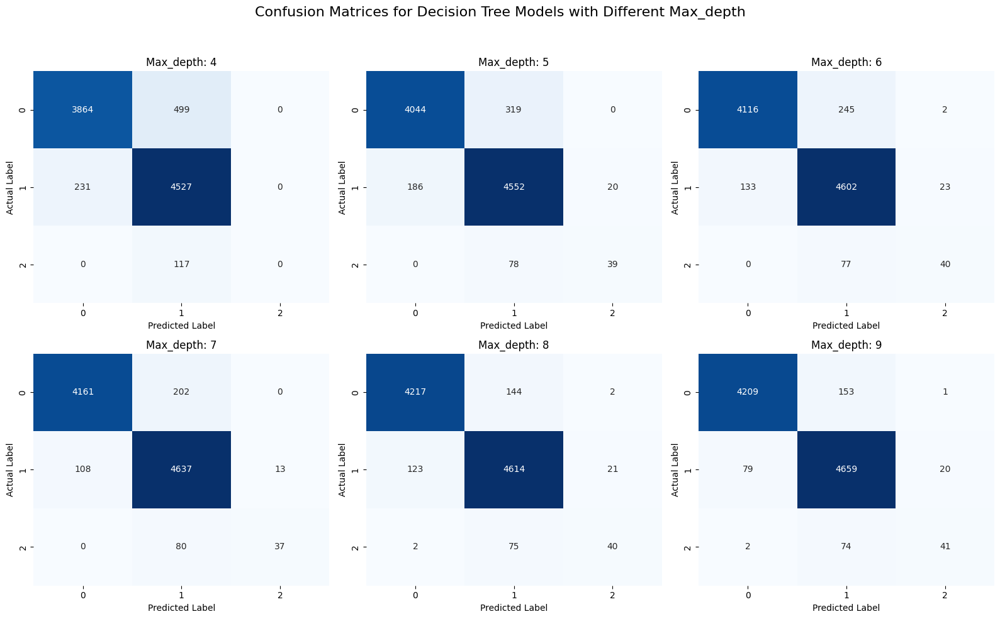

In [ ]:
# Plot confusion matrices for each max_depth
def plot_confusion_matrices():
    fig, axes = plt.subplots(2, 3, figsize=(16, 10))  # 2 rows, 3 columns grid
    fig.suptitle('Confusion Matrices for Decision Tree Models with Different Max_depth', fontsize=16)

    for i, max_depth in enumerate(max_depths):
        cm = results_df[results_df['Max_depth'] == max_depth]['Confusion Matrix'].values[0]
        ax = axes[i // 3, i % 3]
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, ax=ax)
        ax.set_title(f'Max_depth: {max_depth}')
        ax.set_xlabel('Predicted Label')
        ax.set_ylabel('Actual Label')

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust to make space for the title
    plt.show()

# Call the function to plot confusion matrices
plot_confusion_matrices()

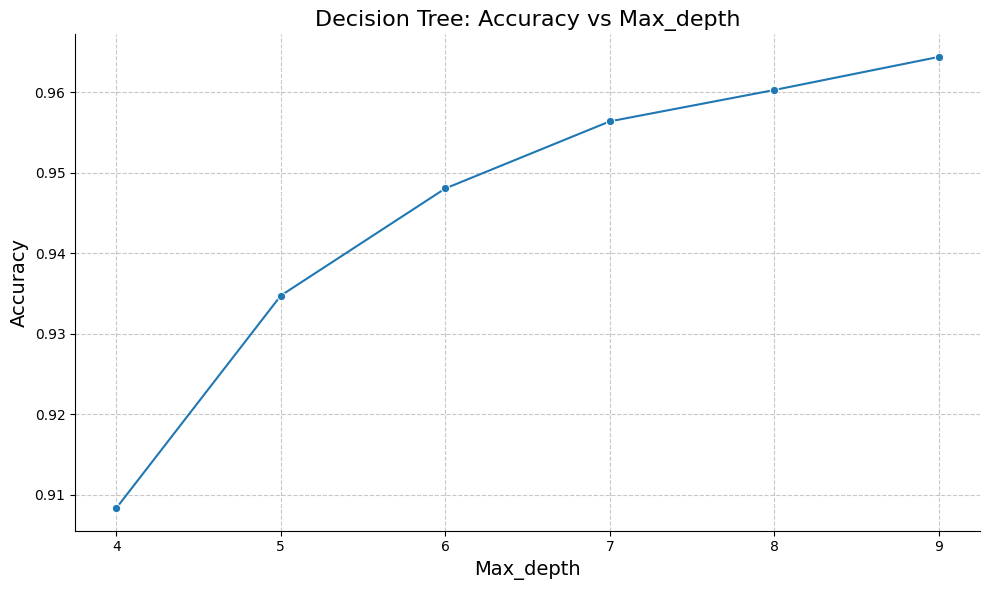

In [ ]:
# Plot Accuracy vs Max_depth
plt.figure(figsize=(10, 6))
sns.lineplot(x='Max_depth', y='Accuracy', marker='o', data=results_df)
plt.title('Decision Tree: Accuracy vs Max_depth', fontsize=16)
plt.ylabel('Accuracy', fontsize=14)
plt.xlabel('Max_depth', fontsize=14)
plt.xticks(max_depths)
sns.despine()  # Remove top and right borders for cleaner visuals
plt.grid(True, linestyle='--', alpha=0.7)  # Light grid lines for clarity
plt.tight_layout()
plt.show()

In [ ]:
results_df

,Max_depth,Accuracy,Precision,Recall,F1,Confusion Matrix
0,4,0.908313,0.899004,0.908313,0.902512,"[[3864, 499, 0], [231, 4527, 0], [0, 117, 0]]"
1,5,0.934726,0.933623,0.934726,0.933197,"[[4044, 319, 0], [186, 4552, 20], [0, 78, 39]]"
2,6,0.948041,0.946665,0.948041,0.946635,"[[4116, 245, 2], [133, 4602, 23], [0, 77, 40]]"
3,7,0.956376,0.955232,0.956376,0.954537,"[[4161, 202, 0], [108, 4637, 13], [0, 80, 37]]"
4,8,0.960273,0.958441,0.960273,0.958767,"[[4217, 144, 2], [123, 4614, 21], [2, 75, 40]]"
5,9,0.964386,0.962864,0.964386,0.962900,"[[4209, 153, 1], [79, 4659, 20], [2, 74, 41]]"


In [ ]:
# Save the dataframes locally as CSV files
file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_patient/results_df_dt.csv'

results_df.to_csv(file_path, index=False)

## Cross Validation on Decision Trees

In [ ]:
# Function to train, test, and evaluate a Decision Tree model with cross-validation
def train_evaluate_decision_tree_cv(X, y, max_depth, n_splits=5):
    # Stratified K-Fold for robust evaluation
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    # Initialize the Decision Tree model
    base_model = DecisionTreeClassifier(max_depth=max_depth, random_state=42)
    calibrated_model = CalibratedClassifierCV(base_model, method='sigmoid', cv=3)  # Calibration

    # Cross-validation predictions
    y_pred = cross_val_predict(calibrated_model, X, y, cv=skf, method='predict')
    y_proba = cross_val_predict(calibrated_model, X, y, cv=skf, method='predict_proba')

    # Performance metrics
    accuracy = accuracy_score(y, y_pred)
    precision = precision_score(y, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y, y_pred, average='weighted', zero_division=0)
    auc = roc_auc_score(y, y_proba, multi_class='ovr') if len(np.unique(y)) > 2 else np.nan

    return accuracy, precision, recall, f1, auc

In [ ]:
# Define max_depth values to evaluate
max_depths = [4, 5, 6, 7, 8, 9]

# Store results for cross-validation
cv_results = []

print("Performing cross-validation...")
for max_depth in max_depths:
    print(f"Evaluating Decision Tree model with max_depth={max_depth}...")
    accuracy, precision, recall, f1, auc = train_evaluate_decision_tree_cv(X_train_pca, y_train, max_depth)
    cv_results.append([max_depth, accuracy, precision, recall, f1, auc])

# Convert results to a DataFrame for better display
cv_results_df = pd.DataFrame(cv_results, columns=['Max_depth', 'Accuracy', 'Precision', 'Recall', 'F1', 'AUC'])

# Display the cross-validation results
print("Cross-Validation Results:")
print(cv_results_df)

Performing cross-validation...
Evaluating Decision Tree model with max_depth=4...
Evaluating Decision Tree model with max_depth=5...
Evaluating Decision Tree model with max_depth=6...
Evaluating Decision Tree model with max_depth=7...
Evaluating Decision Tree model with max_depth=8...
Evaluating Decision Tree model with max_depth=9...
Cross-Validation Results:
   Max_depth  Accuracy  Precision    Recall        F1       AUC
0          4  0.910444   0.901102  0.910444  0.904609  0.947686
1          5  0.939403   0.938222  0.939403  0.936648  0.960763
2          6  0.953233   0.953386  0.953233  0.950036  0.970551
3          7  0.960270   0.960179  0.960270  0.957560  0.972619
4          8  0.962705   0.962010  0.962705  0.960189  0.974838
5          9  0.963815   0.962731  0.963815  0.961504  0.971575


In [ ]:
cv_results_df

,Max_depth,Accuracy,Precision,Recall,F1,AUC
0,4,0.910444,0.901102,0.910444,0.904609,0.947686
1,5,0.939403,0.938222,0.939403,0.936648,0.960763
2,6,0.953233,0.953386,0.953233,0.950036,0.970551
3,7,0.960270,0.960179,0.960270,0.957560,0.972619
4,8,0.962705,0.962010,0.962705,0.960189,0.974838
5,9,0.963815,0.962731,0.963815,0.961504,0.971575


In [ ]:
# Save the dataframes locally as CSV files
file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_patient/results_df_dt_cv.csv'

cv_results_df.to_csv(file_path, index=False)

## Out-of-Sample Testing (Holdout Set)


In [ ]:
# Out-of-Sample Testing (Holdout Set)
max_depths = [4, 5, 6, 7, 8, 9]
print("\nTesting on the holdout set (out-of-sample)...")
holdout_results = []

for max_depth in max_depths:
    print(f"Evaluating Decision Tree model with max_depth={max_depth} on the holdout set...")
    model = DecisionTreeClassifier(max_depth=max_depth, random_state=42)
    calibrated_model = CalibratedClassifierCV(model, method='sigmoid', cv=3)
    calibrated_model.fit(X_train_pca, y_train)

    # Predictions and probabilities for the holdout set
    y_pred = calibrated_model.predict(X_test_pca)
    y_proba = calibrated_model.predict_proba(X_test_pca)

    # Holdout set metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)
    auc = roc_auc_score(y_test, y_proba, multi_class='ovr') if len(np.unique(y_test)) > 2 else np.nan

    holdout_results.append([max_depth, accuracy, precision, recall, f1, auc])


Testing on the holdout set (out-of-sample)...
Evaluating Decision Tree model with max_depth=4 on the holdout set...
Evaluating Decision Tree model with max_depth=5 on the holdout set...
Evaluating Decision Tree model with max_depth=6 on the holdout set...
Evaluating Decision Tree model with max_depth=7 on the holdout set...
Evaluating Decision Tree model with max_depth=8 on the holdout set...
Evaluating Decision Tree model with max_depth=9 on the holdout set...


In [ ]:
# Convert holdout results to DataFrame
holdout_results_df = pd.DataFrame(holdout_results, columns=['Max_depth', 'Accuracy', 'Precision', 'Recall', 'F1', 'AUC'])

# Display the holdout set results
print("\nOut-of-Sample Testing Results (Holdout Set):")
print(holdout_results_df)


Out-of-Sample Testing Results (Holdout Set):
   Max_depth  Accuracy  Precision    Recall        F1       AUC
0          4  0.909829   0.900592  0.909829  0.904020  0.953358
1          5  0.938731   0.938540  0.938731  0.935741  0.969674
2          6  0.952587   0.951704  0.952587  0.949399  0.976764
3          7  0.957675   0.956501  0.957675  0.955400  0.980572
4          8  0.963412   0.962366  0.963412  0.961098  0.980031
5          9  0.966226   0.965062  0.966226  0.964061  0.979285


In [ ]:
holdout_results_df

,Max_depth,Accuracy,Precision,Recall,F1,AUC
0,4,0.909829,0.900592,0.909829,0.904020,0.953358
1,5,0.938731,0.938540,0.938731,0.935741,0.969674
2,6,0.952587,0.951704,0.952587,0.949399,0.976764
3,7,0.957675,0.956501,0.957675,0.955400,0.980572
4,8,0.963412,0.962366,0.963412,0.961098,0.980031
5,9,0.966226,0.965062,0.966226,0.964061,0.979285


In [ ]:
# Save the dataframes locally as CSV files
file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_patient/results_df_holdout.csv'

holdout_results_df.to_csv(file_path, index=False)

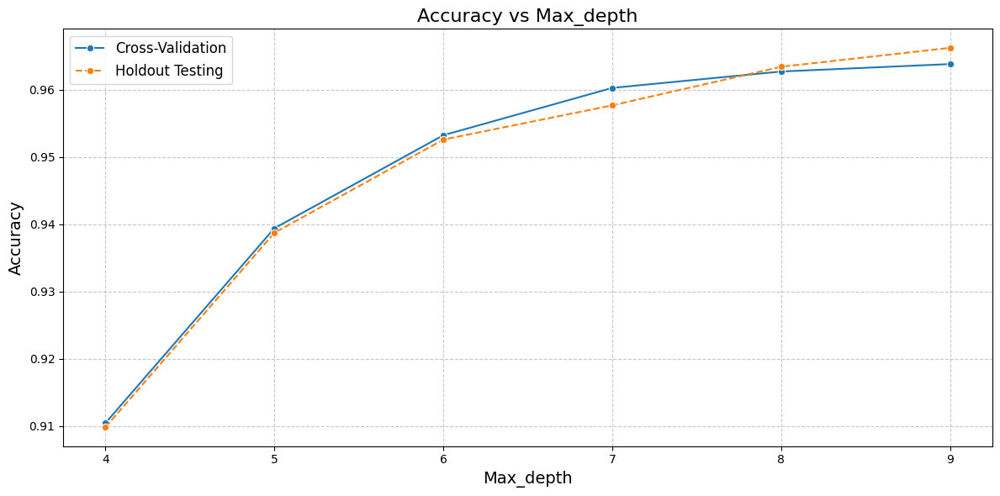

In [ ]:
# Visualization: Accuracy vs Max_depth
plt.figure(figsize=(12, 6))
sns.lineplot(x='Max_depth', y='Accuracy', data=cv_results_df, label='Cross-Validation', marker='o')
sns.lineplot(x='Max_depth', y='Accuracy', data=holdout_results_df, label='Holdout Testing', marker='o', linestyle='--')
plt.title('Accuracy vs Max_depth', fontsize=16)
plt.ylabel('Accuracy', fontsize=14)
plt.xlabel('Max_depth', fontsize=14)
plt.xticks(max_depths)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

## Logistic Regression and KNN

In [ ]:
# List of models to evaluate
models = {
    'Logistic Regression': LogisticRegression(class_weight='balanced', random_state=42),
    'KNN': KNeighborsClassifier(),
}

# Function to evaluate models without cross-validation
def evaluate_models_no_cv(models, X_train, y_train, X_test, y_test):
    results = []
    for name, model in models.items():
        print(f"Training {name}...")
        model.fit(X_train, y_train)  # Train the model
        y_pred = model.predict(X_test)  # Predict on test data

        # Calculate metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        # Collect results
        results.append([name, accuracy, precision, recall, f1])

    # Convert to DataFrame for better visualization
    results_df = pd.DataFrame(results, columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1'])
    return results_df

In [ ]:
# Evaluate the models
results_df = evaluate_models_no_cv(models, X_train_pca, y_train, X_test_pca, y_test)

# Display the results
print("Test Set Evaluation Results:")
print(results_df)

Training Logistic Regression...
Training KNN...
Test Set Evaluation Results:
                 Model  Accuracy  Precision    Recall        F1
0  Logistic Regression  0.999567   0.999569  0.999567  0.999568
1                  KNN  0.910045   0.909864  0.910045  0.907626


In [ ]:
results_df

,Model,Accuracy,Precision,Recall,F1
0,Logistic Regression,0.999567,0.999569,0.999567,0.999568
1,KNN,0.910045,0.909864,0.910045,0.907626


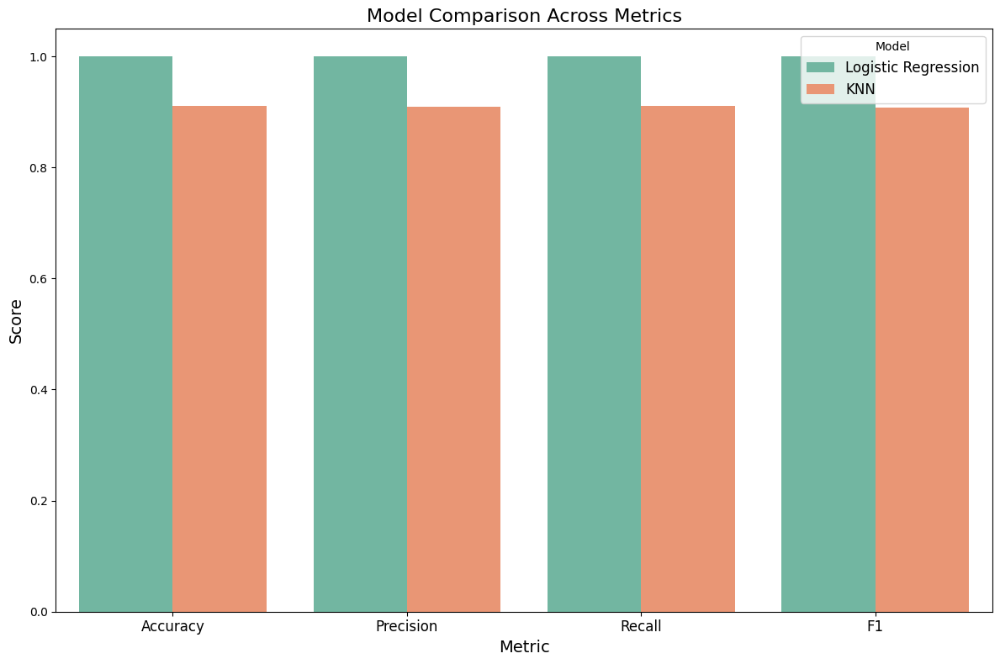

In [ ]:
# Plot the results
plt.figure(figsize=(12, 8))
sns.barplot(data=results_df.melt(id_vars='Model', var_name='Metric', value_name='Score'),
            x='Metric', y='Score', hue='Model', palette='Set2')
plt.title("Model Comparison Across Metrics", fontsize=16)
plt.ylabel("Score", fontsize=14)
plt.xlabel("Metric", fontsize=14)
plt.xticks(fontsize=12)
plt.legend(title='Model', fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
# Save the dataframes locally as CSV files
file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_patient/results_df_lr_knn_noCV.csv'

results_df.to_csv(file_path, index=False)

## Logistic Regression and KNN with Cross Validation

In [ ]:
from sklearn.model_selection import cross_val_score

In [ ]:
# List of models to evaluate
models = {
    'Logistic Regression': LogisticRegression(class_weight='balanced', random_state=42),
    'KNN': KNeighborsClassifier(),
}

# Function to evaluate models with cross-validation
def evaluate_models(models, X, y):
    results = []
    for name, model in models.items():
        print(f"Evaluating {name}...")
        # Cross-validation scores
        accuracy = cross_val_score(model, X, y, scoring='accuracy', cv=5).mean()
        precision = cross_val_score(model, X, y, scoring='precision_weighted', cv=5).mean()
        recall = cross_val_score(model, X, y, scoring='recall_weighted', cv=5).mean()
        f1 = cross_val_score(model, X, y, scoring='f1_weighted', cv=5).mean()

        # Collect results
        results.append([name, accuracy, precision, recall, f1])

    # Convert to DataFrame for better visualization
    results_df = pd.DataFrame(results, columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1'])
    return results_df

In [ ]:
# Evaluate the models
results_df = evaluate_models(models, X_train_pca, y_train)

# Display the results
print("Cross-Validation Results for Alternative Models:")
print(results_df)

Evaluating Logistic Regression...
Evaluating KNN...
Cross-Validation Results for Alternative Models:
                 Model  Accuracy  Precision    Recall        F1
0  Logistic Regression  0.999161   0.999181  0.999161  0.999167
1                  KNN  0.902514   0.901245  0.902514  0.899375


In [ ]:
results_df

,Model,Accuracy,Precision,Recall,F1
0,Logistic Regression,0.999161,0.999181,0.999161,0.999167
1,KNN,0.902514,0.901245,0.902514,0.899375


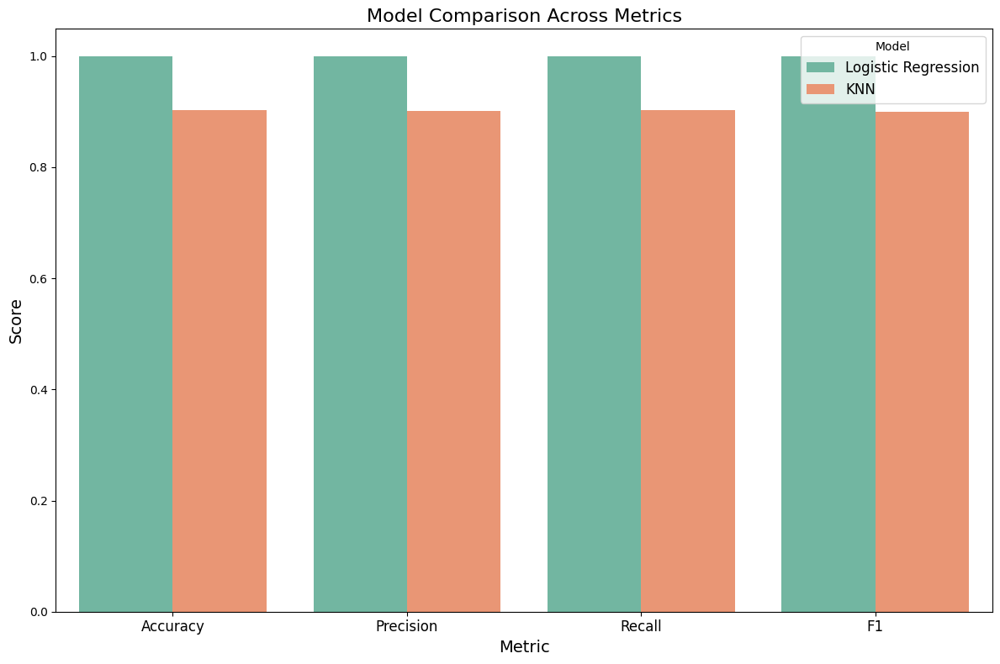

In [ ]:
# Plot the results
plt.figure(figsize=(12, 8))
sns.barplot(data=results_df.melt(id_vars='Model', var_name='Metric', value_name='Score'),
            x='Metric', y='Score', hue='Model', palette='Set2')
plt.title("Model Comparison Across Metrics", fontsize=16)
plt.ylabel("Score", fontsize=14)
plt.xlabel("Metric", fontsize=14)
plt.xticks(fontsize=12)
plt.legend(title='Model', fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
# Save the dataframes locally as CSV files
file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_patient/results_df_lr_knn_CV.csv'

results_df.to_csv(file_path, index=False)

## XGBoost and Random Forest Classifier

In [ ]:
# Define models to evaluate
models = {
    'Random Forest': RandomForestClassifier(class_weight='balanced', random_state=42),
    'XGBoost': xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
}

# Function to evaluate models
def evaluate_models_no_cv(models, X_train, y_train, X_test, y_test):
    results = []
    for name, model in models.items():
        print(f"Training and Evaluating {name}...")
        # Train the model
        model.fit(X_train, y_train)

        # Predict on test data
        y_pred = model.predict(X_test)

        # Compute metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        # Collect results
        results.append([name, accuracy, precision, recall, f1])

    # Convert to DataFrame for better visualization
    results_df = pd.DataFrame(results, columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1'])
    return results_df

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Remap the labels for y_train and y_test
label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform(y_train)
y_test = label_encoder.transform(y_test)

In [ ]:
# Evaluate the models
results_df = evaluate_models_no_cv(models, X_train_pca, y_train, X_test_pca, y_test)

# Display the results
print("Evaluation Results on Test Data:")
print(results_df)

Training and Evaluating Random Forest...
Training and Evaluating XGBoost...


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [16:51:19] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Evaluation Results on Test Data:
           Model  Accuracy  Precision    Recall        F1
0  Random Forest  0.962438   0.964964  0.962438  0.958218
1        XGBoost  0.990799   0.990615  0.990799  0.990013


In [ ]:
results_df

,Model,Accuracy,Precision,Recall,F1
0,Random Forest,0.962438,0.964964,0.962438,0.958218
1,XGBoost,0.990799,0.990615,0.990799,0.990013


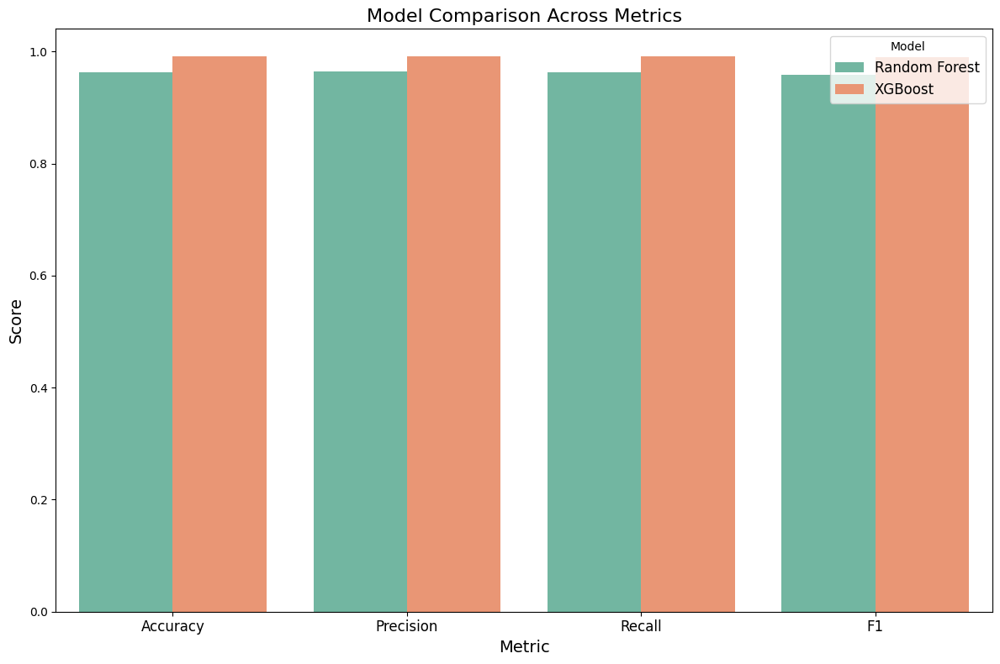

In [ ]:
# Plot the results
plt.figure(figsize=(12, 8))
sns.barplot(data=results_df.melt(id_vars='Model', var_name='Metric', value_name='Score'),
            x='Metric', y='Score', hue='Model', palette='Set2')
plt.title("Model Comparison Across Metrics", fontsize=16)
plt.ylabel("Score", fontsize=14)
plt.xlabel("Metric", fontsize=14)
plt.xticks(fontsize=12)
plt.legend(title='Model', fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
# Save the dataframes locally as CSV files
file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_patient/results_df_xgb_rf_noCV.csv'

results_df.to_csv(file_path, index=False)

## USING XGBOOST AND RANDOM FOREST CLASSIFIER WITH CROSS VALIDATION

In [ ]:
# List of models to evaluate
models = {
    'Random Forest': RandomForestClassifier(class_weight='balanced', random_state=42),
    'XGBoost': xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
}

# Function to evaluate models with cross-validation
def evaluate_models(models, X, y):
    results = []
    for name, model in models.items():
        print(f"Evaluating {name}...")
        # Cross-validation scores
        accuracy = cross_val_score(model, X, y, scoring='accuracy', cv=5).mean()
        precision = cross_val_score(model, X, y, scoring='precision_weighted', cv=5).mean()
        recall = cross_val_score(model, X, y, scoring='recall_weighted', cv=5).mean()
        f1 = cross_val_score(model, X, y, scoring='f1_weighted', cv=5).mean()

        # Collect results
        results.append([name, accuracy, precision, recall, f1])

    # Convert to DataFrame for better visualization
    results_df = pd.DataFrame(results, columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1'])
    return results_df

In [ ]:
# Evaluate the models
results_df = evaluate_models(models, X_train_pca, y_train)

# Display the results
print("Cross-Validation Results for Alternative Models:")
print(results_df)

Evaluating Random Forest...


In [ ]:
results_df

In [ ]:
# Save the dataframes locally as CSV files
file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_patient/results_df_xgb_rf_CV.csv'

results_df.to_csv(file_path, index=False)

In [ ]:
# Plot the results
plt.figure(figsize=(12, 8))
sns.barplot(data=results_df.melt(id_vars='Model', var_name='Metric', value_name='Score'),
            x='Metric', y='Score', hue='Model', palette='Set2')
plt.title("Model Comparison Across Metrics", fontsize=16)
plt.ylabel("Score", fontsize=14)
plt.xlabel("Metric", fontsize=14)
plt.xticks(fontsize=12)
plt.legend(title='Model', fontsize=12)
plt.tight_layout()
plt.show()

## CatBoost and LightGBM

In [ ]:
# Define models to evaluate
models = {
    'CatBoost': cb.CatBoostClassifier(silent=True, random_state=42),
    'LightGBM': lgb.LGBMClassifier(random_state=42)
}

In [ ]:
# Function to evaluate models
def evaluate_models_no_cv(models, X_train, y_train, X_test, y_test):
    results = []
    for name, model in models.items():
        print(f"Training and Evaluating {name}...")
        # Train the model
        model.fit(X_train, y_train)

        # Predict on test data
        y_pred = model.predict(X_test)

        # Compute metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        # Collect results
        results.append([name, accuracy, precision, recall, f1])

    # Convert to DataFrame for better visualization
    results_df = pd.DataFrame(results, columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1'])
    return results_df

In [ ]:
# Evaluate the models
results_df = evaluate_models_no_cv(models, X_train_pca, y_train, X_test_pca, y_test)

# Display the results
print("Evaluation Results on Test Data:")
print(results_df)

In [ ]:
results_df

In [ ]:
# Save the dataframes locally as CSV files
file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_patient/results_df_catboost_lightgbm.csv'

results_df.to_csv(file_path, index=False)

In [ ]:
# Plot the results
plt.figure(figsize=(12, 8))
sns.barplot(data=results_df.melt(id_vars='Model', var_name='Metric', value_name='Score'),
            x='Metric', y='Score', hue='Model', palette='Set2')
plt.title("Model Comparison Across Metrics", fontsize=16)
plt.ylabel("Score", fontsize=14)
plt.xlabel("Metric", fontsize=14)
plt.xticks(fontsize=12)
plt.legend(title='Model', fontsize=12)
plt.tight_layout()
plt.show()

## Adaboost and Gradient Boosting


In [ ]:
# Define models to evaluate
models = {
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'AdaBoost': AdaBoostClassifier(random_state=42)
}

# Function to evaluate models
def evaluate_models_no_cv(models, X_train, y_train, X_test, y_test):
    results = []
    for name, model in models.items():
        print(f"Training and Evaluating {name}...")
        # Train the model
        model.fit(X_train, y_train)

        # Predict on test data
        y_pred = model.predict(X_test)

        # Compute metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        # Collect results
        results.append([name, accuracy, precision, recall, f1])

    # Convert to DataFrame for better visualization
    results_df = pd.DataFrame(results, columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1'])
    return results_df

In [ ]:
# Evaluate the models
results_df = evaluate_models_no_cv(models, X_train_pca, y_train, X_test_pca, y_test)

# Display the results
print("Evaluation Results on Test Data:")
print(results_df)

In [ ]:
# Save the dataframes locally as CSV files
file_path = '/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_patient/results_df_adaboost_gradientboost.csv'

results_df.to_csv(file_path, index=False)

In [ ]:
# Plot the results
plt.figure(figsize=(14, 8))
sns.barplot(data=results_df.melt(id_vars='Model', var_name='Metric', value_name='Score'),
            x='Metric', y='Score', hue='Model', palette='Set3')
plt.title("Model Comparison Across Metrics", fontsize=16)
plt.ylabel("Score", fontsize=14)
plt.xlabel("Metric", fontsize=14)
plt.xticks(fontsize=12)
plt.legend(title='Model', fontsize=12)
plt.tight_layout()
plt.show()

## HoldOut And K-Fold Stacking

In [ ]:
# Models for stacking
base_models = [
    ('Gradient Boosting', GradientBoostingClassifier(random_state=42)),
    ('AdaBoost', AdaBoostClassifier(random_state=42))
]

meta_model = LogisticRegression(random_state=42)

In [ ]:
# Function for metrics
def evaluate_model(name, y_true, y_pred, results):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    conf_matrix = confusion_matrix(y_true, y_pred)
    results.append({
        'Model': name,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'Confusion Matrix': conf_matrix
    })

In [ ]:
X_train_pca = X_train_pca.iloc[:len(y_train)]  # Trim X_train_pca to match y_train length

# Splitting data for Holdout stacking
X_train_base, X_valid_meta, y_train_base, y_valid_meta = train_test_split(X_train_pca, y_train, test_size=0.2, random_state=42)


In [ ]:
# Results list
results = []

# Holdout stacking
print("Performing Holdout Stacking...")
holdout_stack_clf = StackingClassifier(estimators=base_models, final_estimator=meta_model, cv=None)
holdout_stack_clf.fit(X_train_base, y_train_base)

# Evaluate Holdout Stacking
y_pred_holdout = holdout_stack_clf.predict(X_test_pca)
evaluate_model("Holdout Stacking", y_test, y_pred_holdout, results)

# K-Fold stacking
print("Performing K-Fold Stacking...")
kf = KFold(n_splits=5, shuffle=True, random_state=42)
meta_features = np.zeros((len(X_train_pca), len(base_models)))

# Generate meta-features for training
for i, (_, model) in enumerate(base_models):
    meta_features[:, i] = cross_val_predict(model, X_train_pca, y_train, cv=kf, method='predict')

# Train meta-model on meta-features
meta_model.fit(meta_features, y_train)

# Generate meta-features for testing
test_meta_features = np.column_stack([model.fit(X_train_pca, y_train).predict(X_test_pca) for _, model in base_models])

# Predict with K-Fold Stacking
y_pred_kfold = meta_model.predict(test_meta_features)
evaluate_model("K-Fold Stacking", y_test, y_pred_kfold, results)

In [ ]:
# Convert results to DataFrame for better visualization
results_df = pd.DataFrame(results)

# Display results
print("Evaluation Results:")
print(results_df)

In [ ]:
# Plot the results
plt.figure(figsize=(14, 8))
sns.barplot(data=results_df.melt(id_vars='Model', var_name='Metric', value_name='Score'),
            x='Metric', y='Score', hue='Model', palette='Set2')
plt.title("Model Comparison Across Metrics", fontsize=16)
plt.ylabel("Score", fontsize=14)
plt.xlabel("Metric", fontsize=14)
plt.xticks(fontsize=12)
plt.legend(title='Model', fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
# Confusion matrices
def plot_confusion_matrices(results):
    num_models = len(results)
    fig, axes = plt.subplots(1, num_models, figsize=(5 * num_models, 5))
    fig.suptitle("Confusion Matrices", fontsize=16)

    for i, result in enumerate(results):
        cm = result['Confusion Matrix']
        ax = axes[i] if num_models > 1 else axes
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax, cbar=False)
        ax.set_title(result['Model'])
        ax.set_xlabel('Predicted Label')
        ax.set_ylabel('True Label')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

plot_confusion_matrices(results)

# NEURAL NETWORKS

In [ ]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
import os
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.neural_network import MLPClassifier
import joblib
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dropout, BatchNormalization, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Input, Add
from tensorflow.keras.models import load_model

**TARGET VARIABLE : INJURY TYPE**

In [ ]:
# ==================================
# Step 1: Preprocess Data
# ==================================

# Ensure the target variable is categorical
target_column = 'InjuryType'

# Debug: Print unique values before processing
print("Unique values in target before processing:", df_final[target_column].unique())

# Convert the target variable to discrete classes
if df_final[target_column].dtype != 'object' and df_final[target_column].dtype.name != 'category':
    print("The target variable appears to be continuous or improperly encoded.")
    # Factorize the target variable into discrete categories
    df_final[target_column], unique_classes = pd.factorize(df_final[target_column])

# Debug: Verify the transformation
print("Unique classes after factorization:", unique_classes)
print("Transformed target values:", df_final[target_column].unique())

# Split features and target
X = df_final.drop(columns=[target_column])
y = df_final[target_column]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Debug: Verify split
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")

# Scale the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Convert target variable to one-hot encoding for multi-class classification
num_classes = len(np.unique(y))
y_train = tf.keras.utils.to_categorical(y_train, num_classes)
y_test = tf.keras.utils.to_categorical(y_test, num_classes)

# Debug: Check shapes after one-hot encoding
print(f"y_train shape: {y_train.shape}, y_test shape: {y_test.shape}")

Unique values in target before processing: [0 1 2 3 4]
The target variable appears to be continuous or improperly encoded.
Unique classes after factorization: Index([0, 1, 2, 3, 4], dtype='int64')
Transformed target values: [0 1 2 3 4]
X_train shape: (36951, 825), y_train shape: (36951,)
X_test shape: (9238, 825), y_test shape: (9238,)
y_train shape: (36951, 5), y_test shape: (9238, 5)


In [ ]:
# ==================================
# Step 2: Define Neural Network Model
# ==================================
def build_model(input_dim, num_classes):
    model = Sequential()

    # Input layer
    model.add(Dense(128, activation='relu', input_dim=input_dim))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))

    # Hidden layers
    model.add(Dense(64, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))

    model.add(Dense(32, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))

    # Output layer for multi-class classification
    model.add(Dense(num_classes, activation='softmax'))

    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

# Build model
model = build_model(input_dim=X_train.shape[1], num_classes=num_classes)

# Debug: Print model summary
model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 128)                 │         105,728 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32)                  │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 5)                   │             165 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 117,125 (457.52 KB)

 Trainable params: 116,677 (455.77 KB)

 Non-trainable params: 448 (1.75 KB)

In [ ]:
# ==================================
# Step 3: Train the Model
# ==================================
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=100,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=1
)

Epoch 1/100
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 21s 9ms/step - accuracy: 0.6317 - loss: 1.0859 - val_accuracy: 0.8925 - val_loss: 0.3476
Epoch 2/100
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8788 - loss: 0.3936 - val_accuracy: 0.8975 - val_loss: 0.2986
Epoch 3/100
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8909 - loss: 0.3395 - val_accuracy: 0.9011 - val_loss: 0.2797
Epoch 4/100
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.8992 - loss: 0.3032 - val_accuracy: 0.9016 - val_loss: 0.2721
Epoch 5/100
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.9000 - loss: 0.2979 - val_accuracy: 0.9073 - val_loss: 0.2596
Epoch 6/100
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8989 - loss: 0.2892 - val_accuracy: 0.9090 - val_loss: 0.2568
Epoch 7/100
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - accuracy: 0.9029 - loss: 0.2777 - val_accuracy: 0.9119 - val_loss: 0.2506
Epoch 8/100
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.9076 - loss: 

289/289 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Predicted labels: [0 1 2 3 4]
True labels: [0 1 2 3 4]

Model Performance Metrics:
Accuracy: 0.9168
Precision: 0.9209
Recall: 0.9168
F1 Score: 0.9109

Confusion Matrix:
[[6936   11   11    0    0]
 [ 444  900    2    1    0]
 [ 211    2  479    1    8]
 [  33    1   18  104    0]
 [  16    0   10    0   50]]

Classification Report:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95      6958
           1       0.98      0.67      0.80      1347
           2       0.92      0.68      0.78       701
           3       0.98      0.67      0.79       156
           4       0.86      0.66      0.75        76

    accuracy                           0.92      9238
   macro avg       0.93      0.73      0.81      9238
weighted avg       0.92      0.92      0.91      9238



<Figure size 1000x800 with 0 Axes>

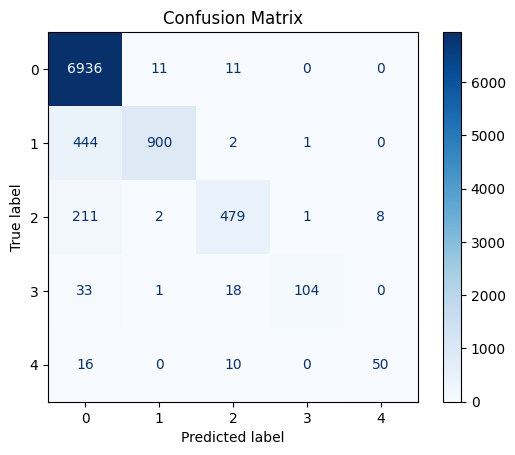

In [ ]:
# ==================================
# Step 4: Evaluate the Model
# ==================================
# Predictions
y_pred_proba = model.predict(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

# Debug: Check predictions
print(f"Predicted labels: {np.unique(y_pred)}")
print(f"True labels: {np.unique(y_test_labels)}")

# Metrics
accuracy = accuracy_score(y_test_labels, y_pred)
precision = precision_score(y_test_labels, y_pred, average='weighted')
recall = recall_score(y_test_labels, y_pred, average='weighted')
f1 = f1_score(y_test_labels, y_pred, average='weighted')
cm = confusion_matrix(y_test_labels, y_pred)

# Debug: Print performance metrics
print("\nModel Performance Metrics:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print("\nConfusion Matrix:")
print(cm)
print("\nClassification Report:\n", classification_report(y_test_labels, y_pred))

# Plot Confusion Matrix
cmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_test_labels))
plt.figure(figsize=(10, 8))
cmd.plot(cmap=plt.cm.Blues, colorbar=True)
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# Specify the new path in your Google Drive where the model will be saved
model_save_dir = '/content/drive/My Drive/FeedForwardNeuralNetworkModel/'
os.makedirs(model_save_dir, exist_ok=True)  # Create the directory if it doesn't exist
model_save_path = os.path.join(model_save_dir, 'feed_forward_nn_model.keras')

# Save the model in the recommended format
model.save(model_save_path)

print(f"Model saved to: {model_save_path}")

Model saved to: /content/drive/My Drive/FeedForwardNeuralNetworkModel/feed_forward_nn_model.keras


**MLP**

In [ ]:
# ==================================
# Step 1: Define and Train MLPClassifier
# ==================================
# Define the MLPClassifier
mlp = MLPClassifier(
    hidden_layer_sizes=(256, 128, 64),  # Three layers with decreasing size
    activation='relu',
    solver='adam',
    batch_size=32,
    max_iter=100,  # You can increase this for better performance
    random_state=42,
    early_stopping=True,
    validation_fraction=0.2
)
# Train the MLP model
mlp.fit(X_train, y_train)

MLPClassifier(batch_size=32, early_stopping=True,
              hidden_layer_sizes=(256, 128, 64), max_iter=100, random_state=42,
              validation_fraction=0.2)


Model Performance Metrics:
Accuracy: 0.9132
Precision: 0.9175
Recall: 0.9132
F1 Score: 0.9069

Confusion Matrix:
[[6926   24    7    1    0]
 [ 446  897    2    2    0]
 [ 232    6  461    0    2]
 [  40    0   11  105    0]
 [  21    0    8    0   47]]

Classification Report:
               precision    recall  f1-score   support

           0       0.90      1.00      0.95      6958
           1       0.97      0.67      0.79      1347
           2       0.94      0.66      0.77       701
           3       0.97      0.67      0.80       156
           4       0.96      0.62      0.75        76

    accuracy                           0.91      9238
   macro avg       0.95      0.72      0.81      9238
weighted avg       0.92      0.91      0.91      9238



<Figure size 1000x800 with 0 Axes>

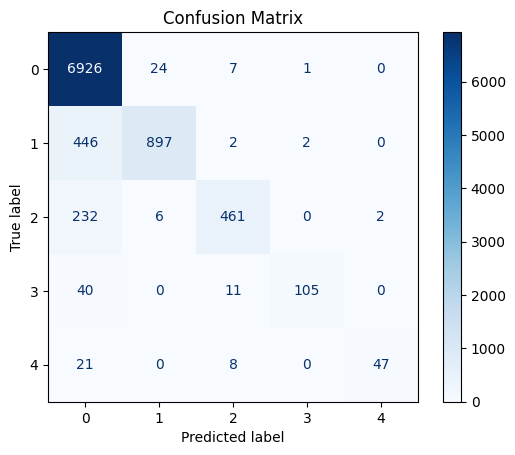

In [ ]:
# ==================================
# Step 2 : Convert Labels if Necessary
# ==================================
# Convert one-hot encoded labels to class indices if required
if len(y_test.shape) > 1:  # Check if one-hot encoded
    y_test_labels = np.argmax(y_test, axis=1)
else:
    y_test_labels = y_test

if len(y_pred.shape) > 1:  # Check if probabilities or one-hot encoded
    y_pred_labels = np.argmax(y_pred, axis=1)
else:
    y_pred_labels = y_pred

# ==================================
# Step 2 : Calculate Metrics
# ==================================
accuracy = accuracy_score(y_test_labels, y_pred_labels)
precision = precision_score(y_test_labels, y_pred_labels, average='weighted')
recall = recall_score(y_test_labels, y_pred_labels, average='weighted')
f1 = f1_score(y_test_labels, y_pred_labels, average='weighted')
cm = confusion_matrix(y_test_labels, y_pred_labels)

# Print Metrics
print("\nModel Performance Metrics:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print("\nConfusion Matrix:")
print(cm)

# Classification Report
print("\nClassification Report:\n", classification_report(y_test_labels, y_pred_labels))

# Plot Confusion Matrix
cmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_test_labels))
plt.figure(figsize=(10, 8))
cmd.plot(cmap=plt.cm.Blues, colorbar=True)
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# ==================================
# Step 3: Save the Checkpoint
# ==================================
# Specify the directory in your Google Drive where the checkpoint will be saved
checkpoint_dir = '/content/drive/My Drive/MLP_Models/'
os.makedirs(checkpoint_dir, exist_ok=True)  # Create the directory if it doesn't exist
checkpoint_path = os.path.join(checkpoint_dir, 'mlp_best_model_checkpoint.joblib')

# Save the model
joblib.dump(mlp, checkpoint_path)

print(f"Model checkpoint saved to: {checkpoint_path}")

Model checkpoint saved to: /content/drive/My Drive/MLP_Models/mlp_best_model_checkpoint.joblib


**1-D CNN**

In [ ]:
# ==================================
# Define CNN Model
# ==================================
def build_cnn_1d(input_shape, num_classes):
    print(f"Building CNN model with input shape {input_shape} and {num_classes} output classes.")
    model = Sequential()

    # 1D Convolutional Layer 1
    model.add(Conv1D(64, kernel_size=3, activation='relu', input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=2))
    model.add(Dropout(0.25))

    # 1D Convolutional Layer 2
    model.add(Conv1D(128, kernel_size=3, activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=2))
    model.add(Dropout(0.25))

    # Fully Connected Layer
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))

    # Output Layer
    model.add(Dense(num_classes, activation='softmax'))

    # Compile the model
    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    print("Model built and compiled successfully.")
    return model

# Build CNN model
input_shape = (X_train.shape[1], 1)
cnn_model = build_cnn_1d(input_shape=input_shape, num_classes=num_classes)

# Debug: Print model summary
print("\nCNN Model Summary:")
cnn_model.summary()

Building CNN model with input shape (825, 1) and 5 output classes.
Model built and compiled successfully.

CNN Model Summary:


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                      │ (None, 823, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 823, 64)             │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d (MaxPooling1D)         │ (None, 411, 64)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 411, 64)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_1 (Conv1D)                    │ (None, 409, 128)            │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 409, 128)            │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_1 (MaxPooling1D)       │ (None, 204, 128)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 204, 128)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 26112)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │       3,342,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 5)                   │             645 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,369,349 (12.85 MB)

 Trainable params: 3,368,709 (12.85 MB)

 Non-trainable params: 640 (2.50 KB)

In [ ]:
# ==================================
# Train the Model
# ==================================
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
print("\nStarting training...")
history = cnn_model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=50,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=1
)
print("Training completed.")


Starting training...
Epoch 1/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 28s 13ms/step - accuracy: 0.7825 - loss: 0.8300 - val_accuracy: 0.8903 - val_loss: 0.4034
Epoch 2/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - accuracy: 0.8837 - loss: 0.3750 - val_accuracy: 0.8587 - val_loss: 0.6949
Epoch 3/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 18s 15ms/step - accuracy: 0.8872 - loss: 0.3583 - val_accuracy: 0.8989 - val_loss: 0.3428
Epoch 4/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 13s 8ms/step - accuracy: 0.8981 - loss: 0.3113 - val_accuracy: 0.9014 - val_loss: 0.2858
Epoch 5/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 14s 12ms/step - accuracy: 0.8950 - loss: 0.3059 - val_accuracy: 0.9028 - val_loss: 0.3069
Epoch 6/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.9006 - loss: 0.2934 - val_accuracy: 0.9068 - val_loss: 0.2815
Epoch 7/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.9047 - loss: 0.2766 - val_accuracy: 0.9059 - val_loss: 0.2787
Epoch 8/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - ac


Evaluating the model...
289/289 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Predicted labels: [0 1 2 3 4]
True labels: [0 1 2 3 4]

Model Performance Metrics:
Accuracy: 0.9143
Precision: 0.9148
Recall: 0.9143
F1 Score: 0.9091

Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.99      0.95      6958
           1       0.91      0.69      0.78      1347
           2       0.94      0.68      0.79       701
           3       0.90      0.71      0.79       156
           4       0.89      0.67      0.77        76

    accuracy                           0.91      9238
   macro avg       0.91      0.75      0.82      9238
weighted avg       0.91      0.91      0.91      9238



<Figure size 1000x800 with 0 Axes>

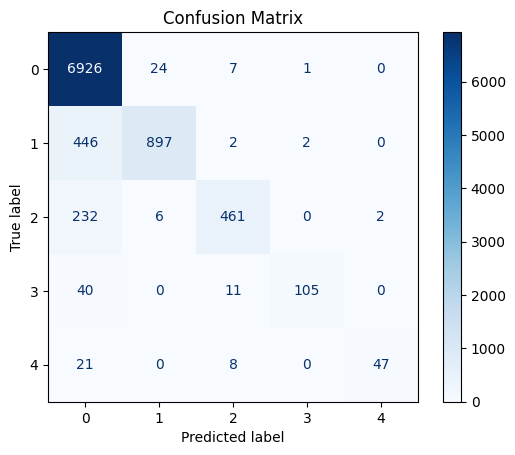

In [ ]:
# ==================================
# Evaluate the Model
# ==================================
print("\nEvaluating the model...")
y_pred_proba = cnn_model.predict(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

# Debug: Predictions and true labels
print(f"Predicted labels: {np.unique(y_pred)}")
print(f"True labels: {np.unique(y_test_labels)}")

# Metrics
accuracy = accuracy_score(y_test_labels, y_pred)
precision = precision_score(y_test_labels, y_pred, average='weighted')
recall = recall_score(y_test_labels, y_pred, average='weighted')
f1 = f1_score(y_test_labels, y_pred, average='weighted')
cm = confusion_matrix(y_test_labels, y_pred_labels)

# Print performance metrics
print("\nModel Performance Metrics:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

print("\nClassification Report:\n", classification_report(y_test_labels, y_pred))

# Plot Confusion Matrix
cmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_test_labels))
plt.figure(figsize=(10, 8))
cmd.plot(cmap=plt.cm.Blues, colorbar=True)
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# ==================================
# Save the Model Checkpoint
# ==================================

# Specify the directory in your Google Drive where the checkpoint will be saved
checkpoint_dir = '/content/drive/My Drive/CNN_Model/'
os.makedirs(checkpoint_dir, exist_ok=True)  # Create the directory if it doesn't exist
checkpoint_path = os.path.join(checkpoint_dir, 'cnn_model_checkpoint.keras')

# Save the model
cnn_model.save(checkpoint_path)

print(f"Model checkpoint saved to: {checkpoint_path}")

Model checkpoint saved to: /content/drive/My Drive/CNN_Model/cnn_model_checkpoint.keras


In [ ]:
# ==================================
# Step 2: Define the ResNet Model
# ==================================
def build_residual_block(input_layer, units):
    """Creates a single residual block with skip connection."""
    x = Dense(units, activation='relu')(input_layer)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)
    x = Dense(units, activation='relu')(x)
    x = BatchNormalization()(x)

    # Match dimensions of input_layer and x if they differ
    if input_layer.shape[-1] != units:
        input_layer = Dense(units)(input_layer)  # Linear transformation to match dimensions

    # Skip connection
    x = Add()([input_layer, x])
    return x

def build_resnet_model(input_dim, num_classes):
    """Builds a Residual Neural Network for tabular data."""
    input_layer = Input(shape=(input_dim,))

    # First Dense layer
    x = Dense(256, activation='relu')(input_layer)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)

    # Add residual blocks
    for units in [256, 128, 64]:
        x = build_residual_block(x, units)

    # Output layer
    output_layer = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

input_dim = X_train.shape[1]

resnet_model = build_resnet_model(input_dim=input_dim, num_classes=num_classes)
resnet_model.summary()

Model: "functional_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 825)            │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_16 (Dense)          │ (None, 256)            │        211,456 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_13    │ (None, 256)            │          1,024 │ dense_16[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_10 (Dropout)      │ (None, 256)            │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_17 (Dense)          │ (None, 256)            │         65,792 │ dropout_10[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_14    │ (None, 256)            │          1,024 │ dense_17[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_11 (Dropout)      │ (None, 256)            │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_18 (Dense)          │ (None, 256)            │         65,792 │ dropout_11[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_15    │ (None, 256)            │          1,024 │ dense_18[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_3 (Add)               │ (None, 256)            │              0 │ dropout_10[0][0],      │
│                           │                        │                │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_19 (Dense)          │ (None, 128)            │         32,896 │ add_3[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_16    │ (None, 128)            │            512 │ dense_19[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_12 (Dropout)      │ (None, 128)            │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_20 (Dense)          │ (None, 128)            │         16,512 │ dropout_12[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_21 (Dense)          │ (None, 128)            │         32,896 │ add_3[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_17    │ (None, 128)            │            512 │ dense_20[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├──────────────────────

 Total params: 450,949 (1.72 MB)

 Trainable params: 448,645 (1.71 MB)

 Non-trainable params: 2,304 (9.00 KB)

In [ ]:
# ==================================
# Step 3: Build and Train the ResNet Model
# ==================================

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=10, restore_best_weights=True
)

history = resnet_model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=50,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=1
)

Epoch 1/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 31s 13ms/step - accuracy: 0.7414 - loss: 0.9820 - val_accuracy: 0.8971 - val_loss: 0.3371
Epoch 2/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - accuracy: 0.8817 - loss: 0.3675 - val_accuracy: 0.9034 - val_loss: 0.2972
Epoch 3/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.8994 - loss: 0.2980 - val_accuracy: 0.9100 - val_loss: 0.2819
Epoch 4/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.9036 - loss: 0.2689 - val_accuracy: 0.9072 - val_loss: 0.2711
Epoch 5/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9104 - loss: 0.2537 - val_accuracy: 0.9104 - val_loss: 0.2519
Epoch 6/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.9117 - loss: 0.2458 - val_accuracy: 0.9153 - val_loss: 0.2669
Epoch 7/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.9142 - loss: 0.2361 - val_accuracy: 0.9151 - val_loss: 0.2527
Epoch 8/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9182 - loss: 0.2279

289/289 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step

Model Performance Metrics:
Accuracy: 0.9149
Precision: 0.9161
Recall: 0.9149
F1 Score: 0.9099

Confusion Matrix:
[[6926   24    7    1    0]
 [ 446  897    2    2    0]
 [ 232    6  461    0    2]
 [  40    0   11  105    0]
 [  21    0    8    0   47]]

Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.99      0.95      6958
           1       0.96      0.67      0.79      1347
           2       0.84      0.72      0.77       701
           3       0.93      0.71      0.81       156
           4       0.86      0.63      0.73        76

    accuracy                           0.91      9238
   macro avg       0.90      0.74      0.81      9238
weighted avg       0.92      0.91      0.91      9238



<Figure size 1000x800 with 0 Axes>

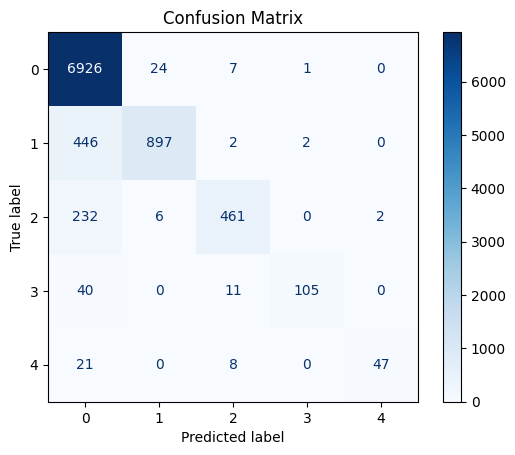

In [ ]:
# ==================================
# Step 4: Evaluate the ResNet Model
# ==================================
y_pred_proba = resnet_model.predict(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

accuracy = accuracy_score(y_test_labels, y_pred)
precision = precision_score(y_test_labels, y_pred, average='weighted')
recall = recall_score(y_test_labels, y_pred, average='weighted')
f1 = f1_score(y_test_labels, y_pred, average='weighted')
cm = confusion_matrix(y_test_labels, y_pred_labels)

print("\nModel Performance Metrics:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print("\nConfusion Matrix:")
print(cm)

print("\nClassification Report:\n", classification_report(y_test_labels, y_pred))

# Plot Confusion Matrix
cmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_test_labels))
plt.figure(figsize=(10, 8))
cmd.plot(cmap=plt.cm.Blues, colorbar=True)
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# ==================================
# Save the Model Checkpoint
# ==================================

# Specify the directory in your Google Drive where the checkpoint will be saved
checkpoint_directory = '/content/drive/My Drive/ResNet_Model/'
os.makedirs(checkpoint_directory, exist_ok=True)  # Create the directory if it doesn't exist
checkpoint_file_path = os.path.join(checkpoint_directory, 'resnet_model_checkpoint.keras')

# Save the model
resnet_model.save(checkpoint_file_path)

print(f"Model checkpoint saved to: {checkpoint_file_path}")

Model checkpoint saved to: /content/drive/My Drive/ResNet_Model/resnet_model_checkpoint.keras


**ENSEMBLE OF THE NEURAL NETWORK MODELS**

In [ ]:
# ==================================
# Step 1: Load Saved Models
# ==================================
# FeedForward Neural Network Model
ffnn_model_path = '/content/drive/My Drive/FeedForwardNeuralNetworkModel/feed_forward_nn_model.keras'
ffnn_model = load_model(ffnn_model_path)
print("FeedForward Neural Network model loaded.")

# MLP Model
mlp_model_path = '/content/drive/My Drive/MLP_Models/mlp_best_model_checkpoint.joblib'
mlp_model = joblib.load(mlp_model_path)
print("MLP model loaded.")

# CNN Model
cnn_model_path = '/content/drive/My Drive/CNN_Model/cnn_model_checkpoint.keras'
cnn_model = load_model(cnn_model_path)
print("CNN model loaded.")

# ResNet Model
resnet_model_path = '/content/drive/My Drive/ResNet_Model/resnet_model_checkpoint.keras'
resnet_model = load_model(resnet_model_path)
print("ResNet model loaded.")

FeedForward Neural Network model loaded.
MLP model loaded.
CNN model loaded.
ResNet model loaded.


**Average predictions from all models**

In [ ]:
# ==================================
# Step 2: Make Predictions with Each Model
# ==================================
ffnn_pred_proba = ffnn_model.predict(X_test)
mlp_pred_proba = mlp_model.predict_proba(X_test)
cnn_pred_proba = cnn_model.predict(X_test)
resnet_pred_proba = resnet_model.predict(X_test)

ensemble_pred_proba = (
    ffnn_pred_proba + mlp_pred_proba + cnn_pred_proba + resnet_pred_proba
) / 4

# Convert probabilities to class predictions
ensemble_pred = np.argmax(ensemble_pred_proba, axis=1)

289/289 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
289/289 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step
289/289 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step


Ensemble Model Metrics:
Accuracy: 0.9198
Precision: 0.9247
Recall: 0.9198
F1 Score: 0.9143

Confusion Matrix:
[[6940   10    7    1    0]
 [ 440  904    3    0    0]
 [ 208    2  489    0    2]
 [  33    0   12  111    0]
 [  17    0    6    0   53]]

Ensemble Model Classification Report:

              precision    recall  f1-score   support

           0       0.91      1.00      0.95      6958
           1       0.99      0.67      0.80      1347
           2       0.95      0.70      0.80       701
           3       0.99      0.71      0.83       156
           4       0.96      0.70      0.81        76

    accuracy                           0.92      9238
   macro avg       0.96      0.76      0.84      9238
weighted avg       0.92      0.92      0.91      9238



<Figure size 1000x800 with 0 Axes>

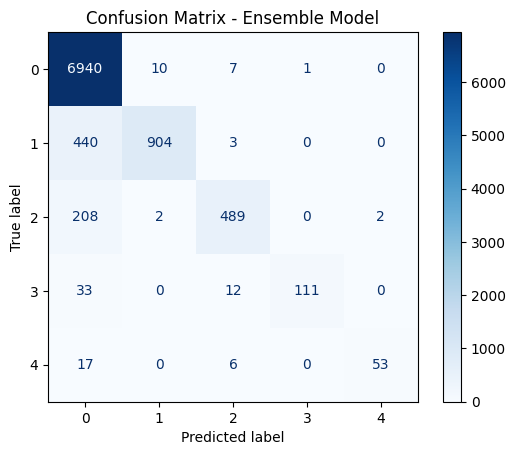

In [ ]:
# ==================================
# Step 3: Evaluate Ensemble Model
# ==================================
if len(y_test.shape) > 1:
    y_test_labels = np.argmax(y_test, axis=1)
else:
    y_test_labels = y_test

# Metrics
ensemble_accuracy = accuracy_score(y_test_labels, ensemble_pred)
ensemble_precision = precision_score(y_test_labels, ensemble_pred, average='weighted')
ensemble_recall = recall_score(y_test_labels, ensemble_pred, average='weighted')
ensemble_f1 = f1_score(y_test_labels, ensemble_pred, average='weighted')
cm = confusion_matrix(y_test_labels, ensemble_pred)

# Print Metrics
print(f"Ensemble Model Metrics:")
print(f"Accuracy: {ensemble_accuracy:.4f}")
print(f"Precision: {ensemble_precision:.4f}")
print(f"Recall: {ensemble_recall:.4f}")
print(f"F1 Score: {ensemble_f1:.4f}")
print("\nConfusion Matrix:")
print(cm)

# Classification Report
print("\nEnsemble Model Classification Report:\n")
print(classification_report(y_test_labels, ensemble_pred))

# Plot Confusion Matrix
cmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_test_labels))
plt.figure(figsize=(10, 8))
cmd.plot(cmap=plt.cm.Blues, colorbar=True)
plt.title("Confusion Matrix - Ensemble Model")
plt.show()

**STACKING**

In [ ]:
# ==================================
# Step 1: Prepare Stacking Data
# ==================================
# Concatenate model predictions (as features for the meta-model)
stacking_features = np.hstack((ffnn_pred_proba, mlp_pred_proba, cnn_pred_proba, resnet_pred_proba))

# Split stacking data into train and validation sets
X_train_meta, X_val_meta, y_train_meta, y_val_meta = train_test_split(
    stacking_features, y_test_labels, test_size=0.2, random_state=42
)

In [ ]:
# ==================================
# Step 2: Train Meta-Models
# ==================================

# Logistic Regression Meta-Model
meta_model_lr = LogisticRegression(max_iter=1000, random_state=42)
meta_model_lr.fit(X_train_meta, y_train_meta)

LogisticRegression(max_iter=1000, random_state=42)

In [ ]:
# XGBoost Meta-Model
meta_model_xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
meta_model_xgb.fit(X_train_meta, y_train_meta)

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [11:45:59] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, objective='multi:softprob', ...)

In [ ]:
# ==================================
# Step 3: Make Predictions with Meta-Models
# ==================================

# Logistic Regression Predictions
meta_pred_lr = meta_model_lr.predict(X_val_meta)
meta_pred_proba_lr = meta_model_lr.predict_proba(X_val_meta)

# XGBoost Predictions
meta_pred_xgb = meta_model_xgb.predict(X_val_meta)
meta_pred_proba_xgb = meta_model_xgb.predict_proba(X_val_meta)


Meta-Model (Logistic Regression) Performance:
Accuracy: 0.9172
Precision: 0.9190
Recall: 0.9172
F1 Score: 0.9127

Confusion Matrix (Meta-Model (Logistic Regression)):
[[1361   13    2    0    0]
 [  76  179    0    0    0]
 [  46    3  115    0    0]
 [   8    1    1   27    0]
 [   1    0    2    0   13]]


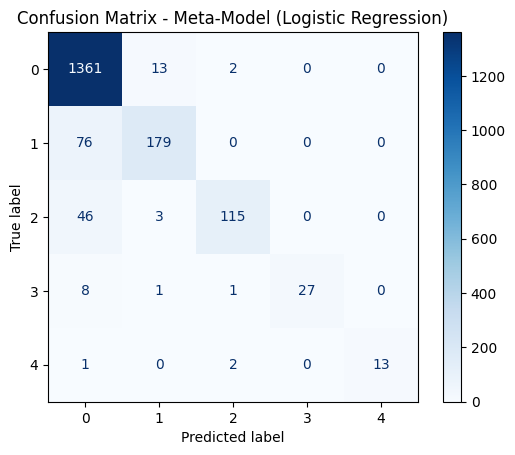


Meta-Model (XGBoost) Performance:
Accuracy: 0.9075
Precision: 0.9065
Recall: 0.9075
F1 Score: 0.9040

Confusion Matrix (Meta-Model (XGBoost)):
[[1340   32    4    0    0]
 [  68  185    2    0    0]
 [  39   11  113    0    1]
 [  10    0    1   26    0]
 [   1    0    1    1   13]]


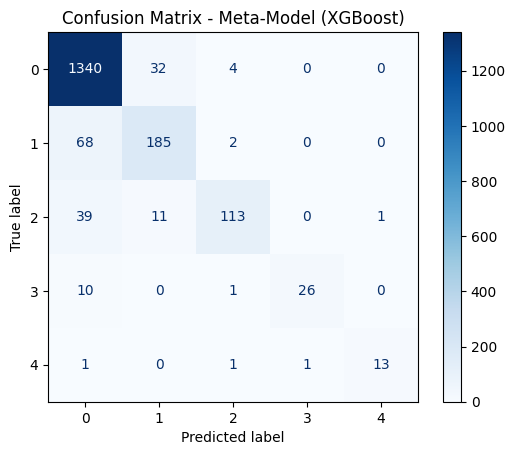

In [ ]:
# ==================================
# Step 4: Evaluate Meta-Model Performance
# ==================================
def evaluate_model(y_true, y_pred, model_name):
    """
    Evaluates a meta-model's performance and plots the confusion matrix.
    """
    # Metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')

    # Print Metrics
    print(f"\n{model_name} Performance:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")

    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    print(f"\nConfusion Matrix ({model_name}):\n{cm}")

    # Plot Confusion Matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_true))
    disp.plot(cmap=plt.cm.Blues, colorbar=True)
    plt.title(f"Confusion Matrix - {model_name}")
    plt.show()

# Evaluate Logistic Regression
evaluate_model(y_val_meta, meta_pred_lr, "Meta-Model (Logistic Regression)")

# Evaluate XGBoost
evaluate_model(y_val_meta, meta_pred_xgb, "Meta-Model (XGBoost)")

FeedForward Neural Network model loaded.
MLP model loaded.
CNN model loaded.
ResNet model loaded.
289/289 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
289/289 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
289/289 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


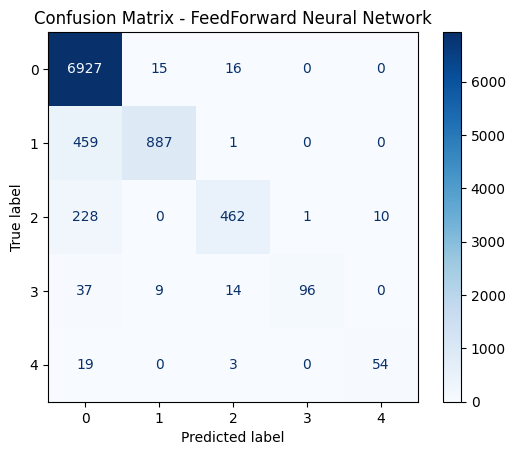

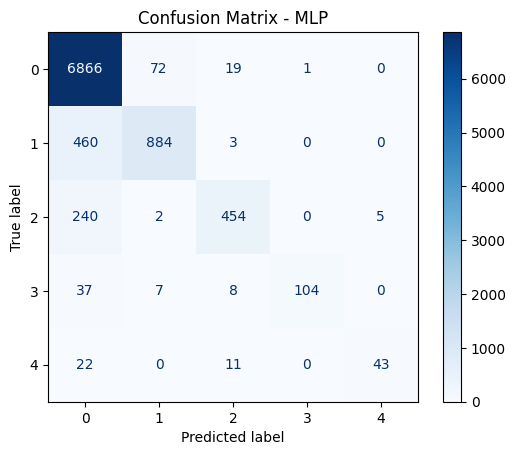

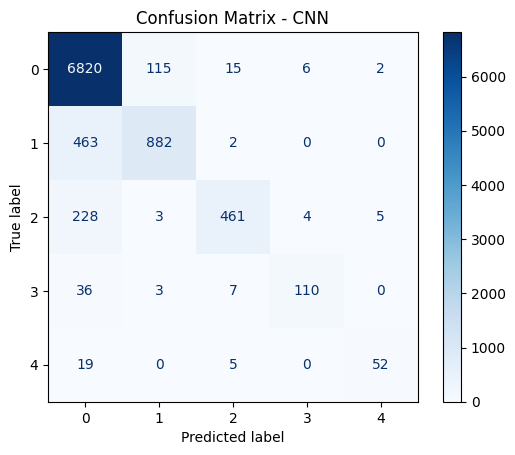

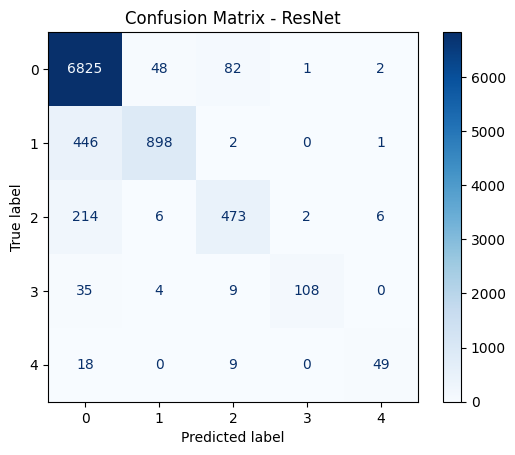


Model Performance Summary:
                        Model  Accuracy  Precision    Recall  F1 Score  \
0  FeedForward Neural Network  0.912102   0.916535  0.912102  0.905634   
1                         MLP  0.903984   0.905484  0.903984  0.897516   
2                         CNN  0.901169   0.901271  0.901169  0.895343   
3                      ResNet  0.904200   0.904717  0.904200  0.898883   

                                    Confusion Matrix  
0  [[6927, 15, 16, 0, 0], [459, 887, 1, 0, 0], [2...  
1  [[6866, 72, 19, 1, 0], [460, 884, 3, 0, 0], [2...  
2  [[6820, 115, 15, 6, 2], [463, 882, 2, 0, 0], [...  
3  [[6825, 48, 82, 1, 2], [446, 898, 2, 0, 1], [2...  


In [ ]:
# ==================================
# Step 1: Load Saved Models
# ==================================
# Load models from their respective paths
ffnn_model_path = '/content/drive/My Drive/FeedForwardNeuralNetworkModel/feed_forward_nn_model.keras'
ffnn_model = load_model(ffnn_model_path)
print("FeedForward Neural Network model loaded.")

mlp_model_path = '/content/drive/My Drive/MLP_Models/mlp_best_model_checkpoint.joblib'
mlp_model = joblib.load(mlp_model_path)
print("MLP model loaded.")

cnn_model_path = '/content/drive/My Drive/CNN_Model/cnn_model_checkpoint.keras'
cnn_model = load_model(cnn_model_path)
print("CNN model loaded.")

resnet_model_path = '/content/drive/My Drive/ResNet_Model/resnet_model_checkpoint.keras'
resnet_model = load_model(resnet_model_path)
print("ResNet model loaded.")

# ==================================
# Step 2: Make Predictions with Each Model
# ==================================
# Ensure predictions are converted to class labels
ffnn_pred = np.argmax(ffnn_model.predict(X_test), axis=1)
mlp_pred = np.argmax(mlp_model.predict_proba(X_test), axis=1)
cnn_pred = np.argmax(cnn_model.predict(X_test), axis=1)
resnet_pred = np.argmax(resnet_model.predict(X_test), axis=1)

# ==================================
# Step 3: Define Evaluation Function
# ==================================
def evaluate_model(y_true, y_pred, model_name, results_list):
    """
    Evaluates a model's performance and appends metrics to results_list.
    """
    # Compute Metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_true, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_true, y_pred, average='weighted', zero_division=0)
    cm = confusion_matrix(y_true, y_pred)

    # Plot confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_true))
    disp.plot(cmap=plt.cm.Blues, colorbar=True)
    plt.title(f"Confusion Matrix - {model_name}")
    plt.show()

    # Append to results
    results_list.append({
        'Model': model_name,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'Confusion Matrix': cm
    })
# ==================================
# Step 4: Evaluate All Models
# ==================================
# List to store results
results = []

# Evaluate each model
evaluate_model(y_test_labels, ffnn_pred, "FeedForward Neural Network", results)
evaluate_model(y_test_labels, mlp_pred, "MLP", results)
evaluate_model(y_test_labels, cnn_pred, "CNN", results)
evaluate_model(y_test_labels, resnet_pred, "ResNet", results)

# ==================================
# Step 5: Display Results Summary
# ==================================
# Convert results list to a DataFrame
neural_networks_InjuryType_results_df = pd.DataFrame(results)

# Display the summary table
print("\nModel Performance Summary:")
print(neural_networks_InjuryType_results_df)

In [ ]:
# Save results locally in Google Drive
results_save_path = '/content/drive/My Drive/neural_networks_InjuryType_results_summary.csv'
neural_networks_InjuryType_results_df.to_csv(results_save_path, index=False)
print(f"\nResults saved to: {results_save_path}")


Results saved to: /content/drive/My Drive/neural_networks_InjuryType_results_summary.csv


In [ ]:
# Path to the saved CSV file in Google Drive
results_load_path = '/content/drive/My Drive/neural_networks_InjuryType_results_summary.csv'

# Load the CSV file into a DataFrame
neural_networks_InjuryType_results_df = pd.read_csv(results_load_path)

# Display the loaded results
print("\nLoaded Model Performance Summary:")
print(neural_networks_InjuryType_results_df)


Loaded Model Performance Summary:
                        Model  Accuracy  Precision    Recall  F1 Score  \
0  FeedForward Neural Network  0.912102   0.916535  0.912102  0.905634   
1                         MLP  0.903984   0.905484  0.903984  0.897516   
2                         CNN  0.901169   0.901271  0.901169  0.895343   
3                      ResNet  0.904200   0.904717  0.904200  0.898883   

                                    Confusion Matrix  
0  [[6927   15   16    0    0]\n [ 459  887    1 ...  
1  [[6866   72   19    1    0]\n [ 460  884    3 ...  
2  [[6820  115   15    6    2]\n [ 463  882    2 ...  
3  [[6825   48   82    1    2]\n [ 446  898    2 ...  


**TARGET VARIABLE : PATIENT STATUS**

In [ ]:
# ==================================
# Step 1: Preprocess Data
# ==================================

# Ensure the target variable is categorical
target_column = 'PatientStatus'

# Debug: Print unique values before processing
print("Unique values in target before processing:", df_final[target_column].unique())

# Convert the target variable to discrete classes
if df_final[target_column].dtype != 'object' and df_final[target_column].dtype.name != 'category':
    print("The target variable appears to be continuous or improperly encoded.")
    # Factorize the target variable into discrete categories
    df_final[target_column], unique_classes = pd.factorize(df_final[target_column])

# Debug: Verify the transformation
print("Unique classes after factorization:", unique_classes)
print("Transformed target values:", df_final[target_column].unique())

# Split features and target
X = df_final.drop(columns=[target_column])
y = df_final[target_column]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Debug: Verify split
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")

# Scale the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Convert target variable to one-hot encoding for multi-class classification
num_classes = len(np.unique(y))
y_train = tf.keras.utils.to_categorical(y_train, num_classes)
y_test = tf.keras.utils.to_categorical(y_test, num_classes)

# Debug: Check shapes after one-hot encoding
print(f"y_train shape: {y_train.shape}, y_test shape: {y_test.shape}")

Unique values in target before processing: [0 1 2]
The target variable appears to be continuous or improperly encoded.
Unique classes after factorization: Index([0, 1, 2], dtype='int64')
Transformed target values: [0 1 2]
X_train shape: (36951, 825), y_train shape: (36951,)
X_test shape: (9238, 825), y_test shape: (9238,)
y_train shape: (36951, 3), y_test shape: (9238, 3)


In [ ]:
# ==================================
# Step 2: Define Neural Network Model
# ==================================
def build_model(input_dim, num_classes):
    model = Sequential()

    # Input layer
    model.add(Dense(128, activation='relu', input_dim=input_dim))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))

    # Hidden layers
    model.add(Dense(64, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))

    model.add(Dense(32, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))

    # Output layer for multi-class classification
    model.add(Dense(num_classes, activation='softmax'))

    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

# Build model
model = build_model(input_dim=X_train.shape[1], num_classes=num_classes)

# Debug: Print model summary
model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_26 (Dense)                     │ (None, 128)                 │         105,728 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_20               │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_14 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_27 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_21               │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_15 (Dropout)                 │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_28 (Dense)                     │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_22               │ (None, 32)                  │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_16 (Dropout)                 │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_29 (Dense)                     │ (None, 3)                   │              99 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 117,059 (457.26 KB)

 Trainable params: 116,611 (455.51 KB)

 Non-trainable params: 448 (1.75 KB)

In [ ]:
# ==================================
# Step 3: Train the Model
# ==================================
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=100,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=1
)

Epoch 1/100
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 37s 16ms/step - accuracy: 0.7333 - loss: 0.6867 - val_accuracy: 0.8980 - val_loss: 0.2441
Epoch 2/100
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - accuracy: 0.8834 - loss: 0.2666 - val_accuracy: 0.9126 - val_loss: 0.2073
Epoch 3/100
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.9025 - loss: 0.2307 - val_accuracy: 0.9187 - val_loss: 0.1953
Epoch 4/100
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - accuracy: 0.9131 - loss: 0.2096 - val_accuracy: 0.9166 - val_loss: 0.1924
Epoch 5/100
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.9167 - loss: 0.2041 - val_accuracy: 0.9191 - val_loss: 0.1863
Epoch 6/100
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.9186 - loss: 0.1965 - val_accuracy: 0.9190 - val_loss: 0.1862
Epoch 7/100
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9224 - loss: 0.1882 - val_accuracy: 0.9199 - val_loss: 0.1835
Epoch 8/100
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.9220 - loss

289/289 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step
Predicted labels: [0 1 2]
True labels: [0 1 2]

Model Performance Metrics:
Accuracy: 0.9209
Precision: 0.9215
Recall: 0.9209
F1 Score: 0.9207

Confusion Matrix:
[[4303  444   11]
 [ 244 4119    0]
 [  32    0   85]]

Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.90      0.92      4758
           1       0.90      0.94      0.92      4363
           2       0.89      0.73      0.80       117

    accuracy                           0.92      9238
   macro avg       0.91      0.86      0.88      9238
weighted avg       0.92      0.92      0.92      9238



<Figure size 1000x800 with 0 Axes>

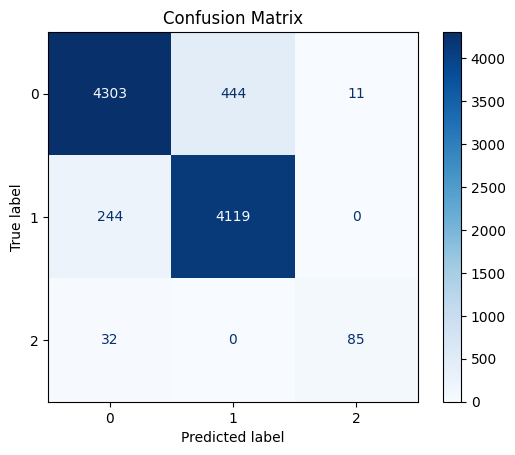

In [ ]:
# ==================================
# Step 4: Evaluate the Model
# ==================================
# Predictions
y_pred_proba = model.predict(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

# Debug: Check predictions
print(f"Predicted labels: {np.unique(y_pred)}")
print(f"True labels: {np.unique(y_test_labels)}")

# Metrics
accuracy = accuracy_score(y_test_labels, y_pred)
precision = precision_score(y_test_labels, y_pred, average='weighted')
recall = recall_score(y_test_labels, y_pred, average='weighted')
f1 = f1_score(y_test_labels, y_pred, average='weighted')
cm = confusion_matrix(y_test_labels, y_pred)

# Debug: Print performance metrics
print("\nModel Performance Metrics:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print("\nConfusion Matrix:")
print(cm)
print("\nClassification Report:\n", classification_report(y_test_labels, y_pred))

# Plot Confusion Matrix
cmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_test_labels))
plt.figure(figsize=(10, 8))
cmd.plot(cmap=plt.cm.Blues, colorbar=True)
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# Specify the new path in your Google Drive where the model will be saved
model_save_dir = '/content/drive/My Drive/FeedForwardNeuralNetworkModel(PatientStatus)/'
os.makedirs(model_save_dir, exist_ok=True)  # Create the directory if it doesn't exist
model_save_path = os.path.join(model_save_dir, 'feed_forward_nn_model(PatientStatus).keras')

# Save the model in the recommended format
model.save(model_save_path)

print(f"Model saved to: {model_save_path}")

Model saved to: /content/drive/My Drive/FeedForwardNeuralNetworkModel(PatientStatus)/feed_forward_nn_model(PatientStatus).keras


**MLP**

In [ ]:
# ==================================
# Step 1: Define and Train MLPClassifier
# ==================================
# Define the MLPClassifier
mlp = MLPClassifier(
    hidden_layer_sizes=(256, 128, 64),  # Three layers with decreasing size
    activation='relu',
    solver='adam',
    batch_size=32,
    max_iter=100,  # You can increase this for better performance
    random_state=42,
    early_stopping=True,
    validation_fraction=0.2
)
# Train the MLP model
mlp.fit(X_train, y_train)

MLPClassifier(batch_size=32, early_stopping=True,
              hidden_layer_sizes=(256, 128, 64), max_iter=100, random_state=42,
              validation_fraction=0.2)


Model Performance Metrics:
Accuracy: 0.9209
Precision: 0.9215
Recall: 0.9209
F1 Score: 0.9207

Confusion Matrix:
[[4303  444   11]
 [ 244 4119    0]
 [  32    0   85]]

Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.90      0.92      4758
           1       0.90      0.94      0.92      4363
           2       0.89      0.73      0.80       117

    accuracy                           0.92      9238
   macro avg       0.91      0.86      0.88      9238
weighted avg       0.92      0.92      0.92      9238



<Figure size 1000x800 with 0 Axes>

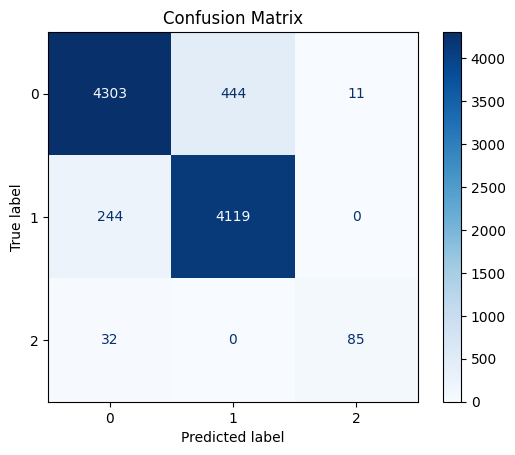

In [ ]:
# ==================================
# Step 2 : Convert Labels if Necessary
# ==================================
# Convert one-hot encoded labels to class indices if required
if len(y_test.shape) > 1:  # Check if one-hot encoded
    y_test_labels = np.argmax(y_test, axis=1)
else:
    y_test_labels = y_test

if len(y_pred.shape) > 1:  # Check if probabilities or one-hot encoded
    y_pred_labels = np.argmax(y_pred, axis=1)
else:
    y_pred_labels = y_pred

# ==================================
# Step 2 : Calculate Metrics
# ==================================
accuracy = accuracy_score(y_test_labels, y_pred_labels)
precision = precision_score(y_test_labels, y_pred_labels, average='weighted')
recall = recall_score(y_test_labels, y_pred_labels, average='weighted')
f1 = f1_score(y_test_labels, y_pred_labels, average='weighted')
cm = confusion_matrix(y_test_labels, y_pred_labels)

# Print Metrics
print("\nModel Performance Metrics:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print("\nConfusion Matrix:")
print(cm)

# Classification Report
print("\nClassification Report:\n", classification_report(y_test_labels, y_pred_labels))

# Plot Confusion Matrix
cmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_test_labels))
plt.figure(figsize=(10, 8))
cmd.plot(cmap=plt.cm.Blues, colorbar=True)
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# ==================================
# Step 3: Save the Checkpoint
# ==================================
# Specify the directory in your Google Drive where the checkpoint will be saved
checkpoint_dir = '/content/drive/My Drive/MLP_Models(PatientStatus)/'
os.makedirs(checkpoint_dir, exist_ok=True)  # Create the directory if it doesn't exist
checkpoint_path = os.path.join(checkpoint_dir, 'mlp_best_model_checkpoint(PatientStatus).joblib')

# Save the model
joblib.dump(mlp, checkpoint_path)

print(f"Model checkpoint saved to: {checkpoint_path}")

Model checkpoint saved to: /content/drive/My Drive/MLP_Models(PatientStatus)/mlp_best_model_checkpoint(PatientStatus).joblib


**1-D CNN**

In [ ]:
# ==================================
# Define CNN Model
# ==================================
def build_cnn_1d(input_shape, num_classes):
    print(f"Building CNN model with input shape {input_shape} and {num_classes} output classes.")
    model = Sequential()

    # 1D Convolutional Layer 1
    model.add(Conv1D(64, kernel_size=3, activation='relu', input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=2))
    model.add(Dropout(0.25))

    # 1D Convolutional Layer 2
    model.add(Conv1D(128, kernel_size=3, activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=2))
    model.add(Dropout(0.25))

    # Fully Connected Layer
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))

    # Output Layer
    model.add(Dense(num_classes, activation='softmax'))

    # Compile the model
    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    print("Model built and compiled successfully.")
    return model

# Build CNN model
input_shape = (X_train.shape[1], 1)
cnn_model = build_cnn_1d(input_shape=input_shape, num_classes=num_classes)

# Debug: Print model summary
print("\nCNN Model Summary:")
cnn_model.summary()

Building CNN model with input shape (825, 1) and 3 output classes.
Model built and compiled successfully.

CNN Model Summary:


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_2 (Conv1D)                    │ (None, 823, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_23               │ (None, 823, 64)             │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_2 (MaxPooling1D)       │ (None, 411, 64)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_17 (Dropout)                 │ (None, 411, 64)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_3 (Conv1D)                    │ (None, 409, 128)            │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_24               │ (None, 409, 128)            │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_3 (MaxPooling1D)       │ (None, 204, 128)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_18 (Dropout)                 │ (None, 204, 128)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 26112)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_30 (Dense)                     │ (None, 128)                 │       3,342,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_25               │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_19 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_31 (Dense)                     │ (None, 3)                   │             387 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,369,091 (12.85 MB)

 Trainable params: 3,368,451 (12.85 MB)

 Non-trainable params: 640 (2.50 KB)

In [ ]:
# ==================================
# Train the Model
# ==================================
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
print("\nStarting training...")
history = cnn_model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=50,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=1
)
print("Training completed.")


Starting training...
Epoch 1/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 51s 34ms/step - accuracy: 0.8014 - loss: 0.5955 - val_accuracy: 0.8980 - val_loss: 0.2523
Epoch 2/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 54s 18ms/step - accuracy: 0.8873 - loss: 0.2658 - val_accuracy: 0.9089 - val_loss: 0.2204
Epoch 3/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 28s 7ms/step - accuracy: 0.9027 - loss: 0.2296 - val_accuracy: 0.9172 - val_loss: 0.2078
Epoch 4/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 15s 13ms/step - accuracy: 0.9103 - loss: 0.2127 - val_accuracy: 0.9204 - val_loss: 0.1914
Epoch 5/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 20s 17ms/step - accuracy: 0.9074 - loss: 0.2202 - val_accuracy: 0.9120 - val_loss: 0.2078
Epoch 6/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 17s 15ms/step - accuracy: 0.9147 - loss: 0.2033 - val_accuracy: 0.9189 - val_loss: 0.2443
Epoch 7/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 13s 11ms/step - accuracy: 0.9192 - loss: 0.1902 - val_accuracy: 0.9163 - val_loss: 0.2165
Epoch 8/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step


Evaluating the model...
289/289 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Predicted labels: [0 1 2]
True labels: [0 1 2]

Model Performance Metrics:
Accuracy: 0.9212
Precision: 0.9210
Recall: 0.9212
F1 Score: 0.9211

Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.92      0.92      4758
           1       0.92      0.92      0.92      4363
           2       0.81      0.73      0.77       117

    accuracy                           0.92      9238
   macro avg       0.88      0.86      0.87      9238
weighted avg       0.92      0.92      0.92      9238



<Figure size 1000x800 with 0 Axes>

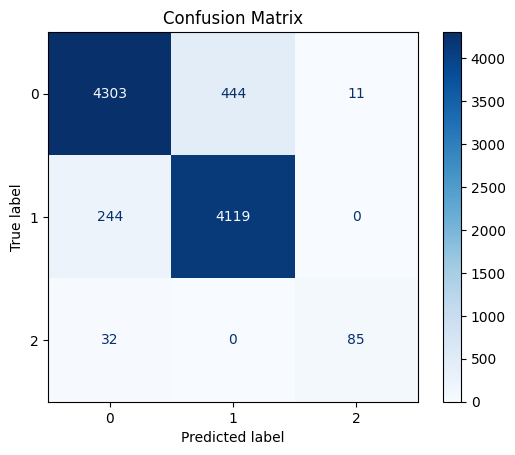

In [ ]:
# ==================================
# Evaluate the Model
# ==================================
print("\nEvaluating the model...")
y_pred_proba = cnn_model.predict(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

# Debug: Predictions and true labels
print(f"Predicted labels: {np.unique(y_pred)}")
print(f"True labels: {np.unique(y_test_labels)}")

# Metrics
accuracy = accuracy_score(y_test_labels, y_pred)
precision = precision_score(y_test_labels, y_pred, average='weighted')
recall = recall_score(y_test_labels, y_pred, average='weighted')
f1 = f1_score(y_test_labels, y_pred, average='weighted')
cm = confusion_matrix(y_test_labels, y_pred_labels)

# Print performance metrics
print("\nModel Performance Metrics:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

print("\nClassification Report:\n", classification_report(y_test_labels, y_pred))

# Plot Confusion Matrix
cmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_test_labels))
plt.figure(figsize=(10, 8))
cmd.plot(cmap=plt.cm.Blues, colorbar=True)
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# ==================================
# Save the Model Checkpoint
# ==================================

# Specify the directory in your Google Drive where the checkpoint will be saved
checkpoint_dir = '/content/drive/My Drive/CNN_Model(PatientStatus)/'
os.makedirs(checkpoint_dir, exist_ok=True)  # Create the directory if it doesn't exist
checkpoint_path = os.path.join(checkpoint_dir, 'cnn_model_checkpoint(PatientStatus).keras')

# Save the model
cnn_model.save(checkpoint_path)

print(f"Model checkpoint saved to: {checkpoint_path}")

Model checkpoint saved to: /content/drive/My Drive/CNN_Model(PatientStatus)/cnn_model_checkpoint(PatientStatus).keras


**RESNET**

In [ ]:
# ==================================
# Step 2: Define the ResNet Model
# ==================================
def build_residual_block(input_layer, units):
    """Creates a single residual block with skip connection."""
    x = Dense(units, activation='relu')(input_layer)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)
    x = Dense(units, activation='relu')(x)
    x = BatchNormalization()(x)

    # Match dimensions of input_layer and x if they differ
    if input_layer.shape[-1] != units:
        input_layer = Dense(units)(input_layer)  # Linear transformation to match dimensions

    # Skip connection
    x = Add()([input_layer, x])
    return x

def build_resnet_model(input_dim, num_classes):
    """Builds a Residual Neural Network for tabular data."""
    input_layer = Input(shape=(input_dim,))

    # First Dense layer
    x = Dense(256, activation='relu')(input_layer)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)

    # Add residual blocks
    for units in [256, 128, 64]:
        x = build_residual_block(x, units)

    # Output layer
    output_layer = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

input_dim = X_train.shape[1]

resnet_model = build_resnet_model(input_dim=input_dim, num_classes=num_classes)
resnet_model.summary()

Model: "functional_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 825)            │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_32 (Dense)          │ (None, 256)            │        211,456 │ input_layer_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_26    │ (None, 256)            │          1,024 │ dense_32[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_20 (Dropout)      │ (None, 256)            │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_33 (Dense)          │ (None, 256)            │         65,792 │ dropout_20[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_27    │ (None, 256)            │          1,024 │ dense_33[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_21 (Dropout)      │ (None, 256)            │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_34 (Dense)          │ (None, 256)            │         65,792 │ dropout_21[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_28    │ (None, 256)            │          1,024 │ dense_34[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_6 (Add)               │ (None, 256)            │              0 │ dropout_20[0][0],      │
│                           │                        │                │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_35 (Dense)          │ (None, 128)            │         32,896 │ add_6[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_29    │ (None, 128)            │            512 │ dense_35[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_22 (Dropout)      │ (None, 128)            │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_36 (Dense)          │ (None, 128)            │         16,512 │ dropout_22[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_37 (Dense)          │ (None, 128)            │         32,896 │ add_6[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_30    │ (None, 128)            │            512 │ dense_36[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├──────────────────────

 Total params: 450,819 (1.72 MB)

 Trainable params: 448,515 (1.71 MB)

 Non-trainable params: 2,304 (9.00 KB)

In [ ]:
# ==================================
# Step 3: Build and Train the ResNet Model
# ==================================

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=10, restore_best_weights=True
)

history = resnet_model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=50,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=1
)

Epoch 1/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 28s 16ms/step - accuracy: 0.7941 - loss: 0.6026 - val_accuracy: 0.9011 - val_loss: 0.2374
Epoch 2/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.8950 - loss: 0.2435 - val_accuracy: 0.9100 - val_loss: 0.2243
Epoch 3/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.9093 - loss: 0.2131 - val_accuracy: 0.9134 - val_loss: 0.2052
Epoch 4/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - accuracy: 0.9198 - loss: 0.1860 - val_accuracy: 0.9181 - val_loss: 0.1999
Epoch 5/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.9175 - loss: 0.1849 - val_accuracy: 0.9207 - val_loss: 0.1901
Epoch 6/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.9251 - loss: 0.1734 - val_accuracy: 0.9199 - val_loss: 0.1919
Epoch 7/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.9272 - loss: 0.1693 - val_accuracy: 0.9116 - val_loss: 0.2018
Epoch 8/50
1155/1155 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.9291 - loss: 0.165

289/289 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Predicted labels: [0 1 2]
True labels: [0 1 2]

Model Performance Metrics:
Accuracy: 0.9207
Precision: 0.9208
Recall: 0.9207
F1 Score: 0.9205

Confusion Matrix:
[[4303  444   11]
 [ 244 4119    0]
 [  32    0   85]]

Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.91      0.92      4758
           1       0.91      0.93      0.92      4363
           2       0.86      0.70      0.77       117

    accuracy                           0.92      9238
   macro avg       0.90      0.85      0.87      9238
weighted avg       0.92      0.92      0.92      9238



<Figure size 1000x800 with 0 Axes>

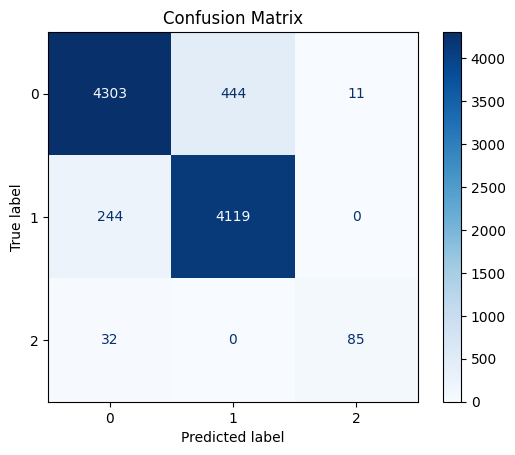

In [ ]:
# ==================================
# Step 4: Evaluate the ResNet Model
# ==================================

y_pred_proba = resnet_model.predict(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

# Debug: Check predictions
print(f"Predicted labels: {np.unique(y_pred)}")
print(f"True labels: {np.unique(y_test_labels)}")

accuracy = accuracy_score(y_test_labels, y_pred)
precision = precision_score(y_test_labels, y_pred, average='weighted')
recall = recall_score(y_test_labels, y_pred, average='weighted')
f1 = f1_score(y_test_labels, y_pred, average='weighted')
cm = confusion_matrix(y_test_labels, y_pred_labels)

print("\nModel Performance Metrics:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print("\nConfusion Matrix:")
print(cm)

print("\nClassification Report:\n", classification_report(y_test_labels, y_pred))

# Plot Confusion Matrix
cmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_test_labels))
plt.figure(figsize=(10, 8))
cmd.plot(cmap=plt.cm.Blues, colorbar=True)
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# ==================================
# Save the Model Checkpoint
# ==================================

# Specify the directory in your Google Drive where the checkpoint will be saved
checkpoint_directory = '/content/drive/My Drive/ResNet_Model(PatientStatus)/'
os.makedirs(checkpoint_directory, exist_ok=True)  # Create the directory if it doesn't exist
checkpoint_file_path = os.path.join(checkpoint_directory, 'resnet_model_checkpoint(PatientStatus).keras')

# Save the model
resnet_model.save(checkpoint_file_path)

print(f"Model checkpoint saved to: {checkpoint_file_path}")

Model checkpoint saved to: /content/drive/My Drive/ResNet_Model(PatientStatus)/resnet_model_checkpoint(PatientStatus).keras


**ENSEMBLE OF THE NEURAL NETWORK MODELS (TARGET VARIABLE - PatientStatus)**

In [ ]:
# ==================================
# Step 1: Load Saved Models
# ==================================
# FeedForward Neural Network Model
ffnn_model_path = '/content/drive/My Drive/FeedForwardNeuralNetworkModel(PatientStatus)/feed_forward_nn_model(PatientStatus).keras'
ffnn_model = load_model(ffnn_model_path)
print("FeedForward Neural Network model loaded.")

# MLP Model
mlp_model_path = '/content/drive/My Drive/MLP_Models(PatientStatus)/mlp_best_model_checkpoint(PatientStatus).joblib'
mlp_model = joblib.load(mlp_model_path)
print("MLP model loaded.")

# CNN Model
cnn_model_path = '/content/drive/My Drive/CNN_Model(PatientStatus)/cnn_model_checkpoint(PatientStatus).keras'
cnn_model = load_model(cnn_model_path)
print("CNN model loaded.")

# ResNet Model
resnet_model_path = '/content/drive/My Drive/ResNet_Model(PatientStatus)/resnet_model_checkpoint(PatientStatus).keras'
resnet_model = load_model(resnet_model_path)
print("ResNet model loaded.")

FeedForward Neural Network model loaded.
MLP model loaded.
CNN model loaded.
ResNet model loaded.


In [ ]:
# ==================================
# Step 2: Make Predictions with Each Model
# ==================================
ffnn_pred_proba = ffnn_model.predict(X_test)
mlp_pred_proba = mlp_model.predict_proba(X_test)
cnn_pred_proba = cnn_model.predict(X_test)
resnet_pred_proba = resnet_model.predict(X_test)

ensemble_pred_proba = (
    ffnn_pred_proba + mlp_pred_proba + cnn_pred_proba + resnet_pred_proba
) / 4

# Convert probabilities to class predictions
ensemble_pred = np.argmax(ensemble_pred_proba, axis=1)

289/289 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
289/289 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
289/289 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


Ensemble Model Metrics:
Accuracy: 0.9244
Precision: 0.9248
Recall: 0.9244
F1 Score: 0.9243

Confusion Matrix:
[[4357  395    6]
 [ 266 4097    0]
 [  31    0   86]]

Ensemble Model Classification Report:

              precision    recall  f1-score   support

           0       0.94      0.92      0.93      4758
           1       0.91      0.94      0.93      4363
           2       0.93      0.74      0.82       117

    accuracy                           0.92      9238
   macro avg       0.93      0.86      0.89      9238
weighted avg       0.92      0.92      0.92      9238



<Figure size 1000x800 with 0 Axes>

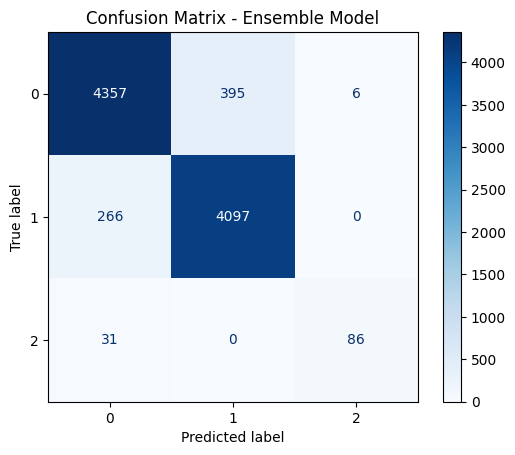

In [ ]:
# ==================================
# Step 3: Evaluate Ensemble Model
# ==================================
if len(y_test.shape) > 1:
    y_test_labels = np.argmax(y_test, axis=1)
else:
    y_test_labels = y_test

# Metrics
ensemble_accuracy = accuracy_score(y_test_labels, ensemble_pred)
ensemble_precision = precision_score(y_test_labels, ensemble_pred, average='weighted')
ensemble_recall = recall_score(y_test_labels, ensemble_pred, average='weighted')
ensemble_f1 = f1_score(y_test_labels, ensemble_pred, average='weighted')
cm = confusion_matrix(y_test_labels, ensemble_pred)

# Print Metrics
print(f"Ensemble Model Metrics:")
print(f"Accuracy: {ensemble_accuracy:.4f}")
print(f"Precision: {ensemble_precision:.4f}")
print(f"Recall: {ensemble_recall:.4f}")
print(f"F1 Score: {ensemble_f1:.4f}")
print("\nConfusion Matrix:")
print(cm)

# Classification Report
print("\nEnsemble Model Classification Report:\n")
print(classification_report(y_test_labels, ensemble_pred))

# Plot Confusion Matrix
cmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_test_labels))
plt.figure(figsize=(10, 8))
cmd.plot(cmap=plt.cm.Blues, colorbar=True)
plt.title("Confusion Matrix - Ensemble Model")
plt.show()

**STACKING**

In [ ]:
# ==================================
# Step 1: Prepare Stacking Data
# ==================================
# Concatenate model predictions (as features for the meta-model)
stacking_features = np.hstack((ffnn_pred_proba, mlp_pred_proba, cnn_pred_proba, resnet_pred_proba))

# Split stacking data into train and validation sets
X_train_meta, X_val_meta, y_train_meta, y_val_meta = train_test_split(
    stacking_features, y_test_labels, test_size=0.2, random_state=42
)

In [ ]:
# ==================================
# Step 2: Train Meta-Models
# ==================================

# Logistic Regression Meta-Model
meta_model_lr = LogisticRegression(max_iter=1000, random_state=42)
meta_model_lr.fit(X_train_meta, y_train_meta)

LogisticRegression(max_iter=1000, random_state=42)

In [ ]:
# XGBoost Meta-Model
meta_model_xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
meta_model_xgb.fit(X_train_meta, y_train_meta)

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [12:26:36] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, objective='multi:softprob', ...)

In [ ]:
# ==================================
# Step 3: Make Predictions with Meta-Models
# ==================================

# Logistic Regression Predictions
meta_pred_lr = meta_model_lr.predict(X_val_meta)
meta_pred_proba_lr = meta_model_lr.predict_proba(X_val_meta)

# XGBoost Predictions
meta_pred_xgb = meta_model_xgb.predict(X_val_meta)
meta_pred_proba_xgb = meta_model_xgb.predict_proba(X_val_meta)


Meta-Model (Logistic Regression) Performance:
Accuracy: 0.9286
Precision: 0.9289
Recall: 0.9286
F1 Score: 0.9284

Confusion Matrix (Meta-Model (Logistic Regression)):
[[881  73   1]
 [ 51 815   0]
 [  6   1  20]]


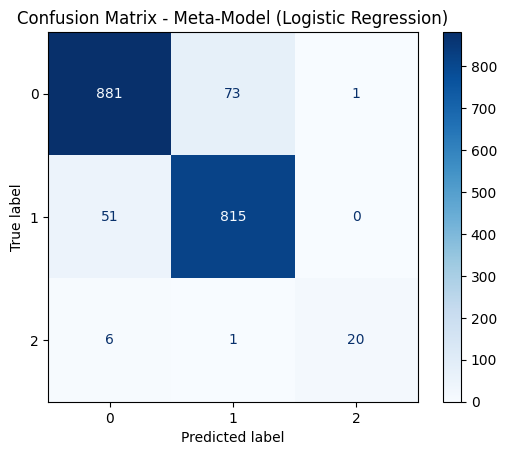


Meta-Model (XGBoost) Performance:
Accuracy: 0.9188
Precision: 0.9190
Recall: 0.9188
F1 Score: 0.9186

Confusion Matrix (Meta-Model (XGBoost)):
[[879  75   1]
 [ 66 800   0]
 [  8   0  19]]


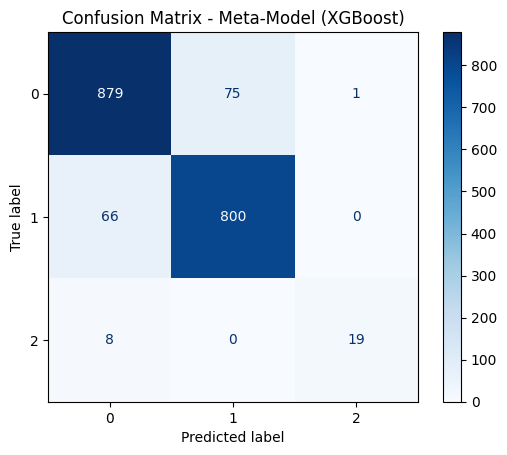

In [ ]:
# ==================================
# Step 4: Evaluate Meta-Model Performance
# ==================================
def evaluate_model(y_true, y_pred, model_name):
    """
    Evaluates a meta-model's performance and plots the confusion matrix.
    """
    # Metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')

    # Print Metrics
    print(f"\n{model_name} Performance:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")

    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    print(f"\nConfusion Matrix ({model_name}):\n{cm}")

    # Plot Confusion Matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_true))
    disp.plot(cmap=plt.cm.Blues, colorbar=True)
    plt.title(f"Confusion Matrix - {model_name}")
    plt.show()

# Evaluate Logistic Regression
evaluate_model(y_val_meta, meta_pred_lr, "Meta-Model (Logistic Regression)")

# Evaluate XGBoost
evaluate_model(y_val_meta, meta_pred_xgb, "Meta-Model (XGBoost)")

**FINAL RESULTS FOR THE TARGET VARIABLE - PatientStatus**

FeedForward Neural Network model loaded.
MLP model loaded.
CNN model loaded.
ResNet model loaded.
289/289 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
289/289 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
289/289 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


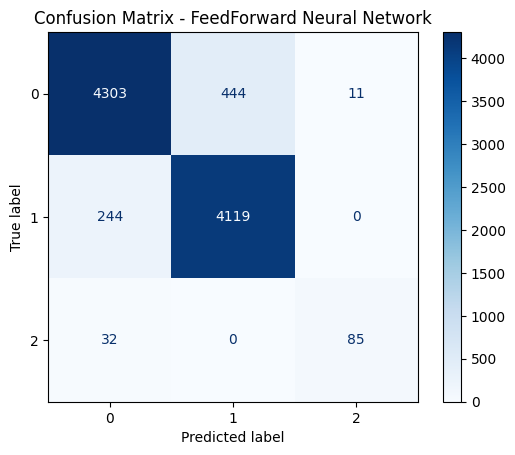

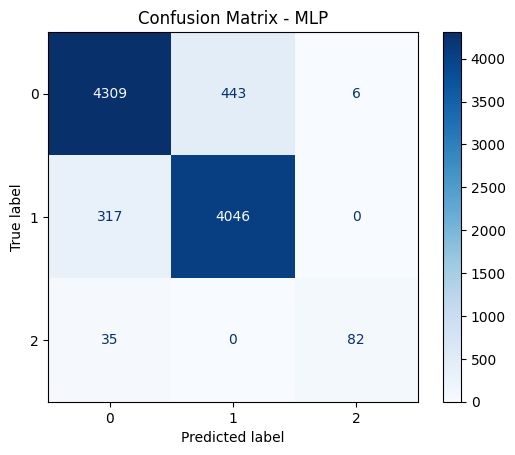

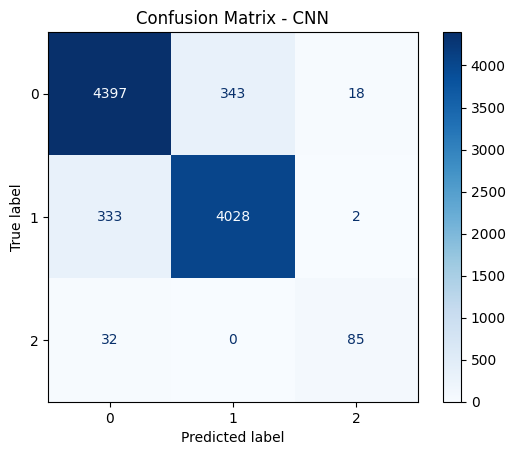

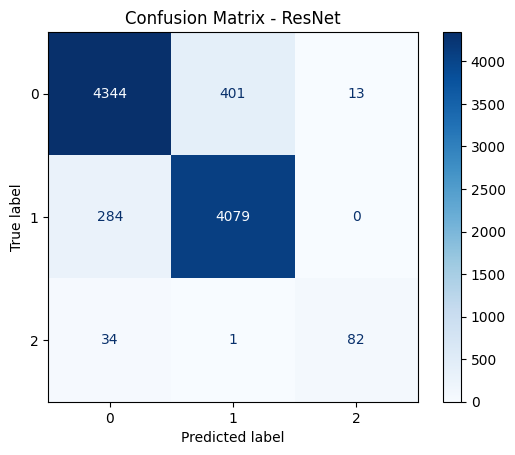


Model Performance Summary:
                        Model  Accuracy  Precision  Recall  F1 Score  \
0  FeedForward Neural Network    0.9209     0.9215  0.9209    0.9207   
1                         MLP    0.9133     0.9136  0.9133    0.9131   
2                         CNN    0.9212     0.9210  0.9212    0.9211   
3                      ResNet    0.9207     0.9208  0.9207    0.9205   

                                 Confusion Matrix  
0  [[4303, 444, 11], [244, 4119, 0], [32, 0, 85]]  
1   [[4309, 443, 6], [317, 4046, 0], [35, 0, 82]]  
2  [[4397, 343, 18], [333, 4028, 2], [32, 0, 85]]  
3  [[4344, 401, 13], [284, 4079, 0], [34, 1, 82]]  


In [ ]:
# ==================================
# Step 1: Load Saved Models
# ==================================
# FeedForward Neural Network Model
ffnn_model_path = '/content/drive/My Drive/FeedForwardNeuralNetworkModel(PatientStatus)/feed_forward_nn_model(PatientStatus).keras'
ffnn_model = load_model(ffnn_model_path)
print("FeedForward Neural Network model loaded.")

# MLP Model
mlp_model_path = '/content/drive/My Drive/MLP_Models(PatientStatus)/mlp_best_model_checkpoint(PatientStatus).joblib'
mlp_model = joblib.load(mlp_model_path)
print("MLP model loaded.")

# CNN Model
cnn_model_path = '/content/drive/My Drive/CNN_Model(PatientStatus)/cnn_model_checkpoint(PatientStatus).keras'
cnn_model = load_model(cnn_model_path)
print("CNN model loaded.")

# ResNet Model
resnet_model_path = '/content/drive/My Drive/ResNet_Model(PatientStatus)/resnet_model_checkpoint(PatientStatus).keras'
resnet_model = load_model(resnet_model_path)
print("ResNet model loaded.")

# ==================================
# Step 2: Generate Predictions
# ==================================
# FeedForward Neural Network Predictions
ffnn_pred = np.argmax(ffnn_model.predict(X_test), axis=1)

# MLP Predictions
mlp_pred = np.argmax(mlp_model.predict_proba(X_test), axis=1)  # Ensure predictions are single-label

# CNN Predictions
cnn_pred = np.argmax(cnn_model.predict(X_test), axis=1)

# ResNet Predictions
resnet_pred = np.argmax(resnet_model.predict(X_test), axis=1)

# ==================================
# Step 3: Evaluate Models and Plot Confusion Matrices
# ==================================
# Helper function to calculate metrics and plot confusion matrix
def evaluate_model_and_plot_confusion(y_true, y_pred, model_name):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')

    # Calculate confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # Plot confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_true))
    disp.plot(cmap=plt.cm.Blues, colorbar=True)
    plt.title(f"Confusion Matrix - {model_name}")
    plt.show()

    # Append results
    results.append({
        'Model': model_name,
        'Accuracy': round(accuracy, 4),
        'Precision': round(precision, 4),
        'Recall': round(recall, 4),
        'F1 Score': round(f1, 4),
        'Confusion Matrix': cm
    })

results = []

# Evaluate and plot for FeedForward Neural Network
evaluate_model_and_plot_confusion(y_test_labels, ffnn_pred, "FeedForward Neural Network")

# Evaluate and plot for MLP
evaluate_model_and_plot_confusion(y_test_labels, mlp_pred, "MLP")

# Evaluate and plot for CNN
evaluate_model_and_plot_confusion(y_test_labels, cnn_pred, "CNN")

# Evaluate and plot for ResNet
evaluate_model_and_plot_confusion(y_test_labels, resnet_pred, "ResNet")

# ==================================
# Step 5: Display Results Table
# ==================================
# Convert results to a DataFrame
neural_networks_PatientStatus_results_df = pd.DataFrame(results)

# Display the table
print("\nModel Performance Summary:")
print(neural_networks_PatientStatus_results_df)

In [ ]:
# Save results locally in Google Drive
results_save_path = '/content/drive/My Drive/neural_networks_Patient_Status_results_summary.csv'
neural_networks_PatientStatus_results_df.to_csv(results_save_path, index=False)
print(f"\nResults saved to: {results_save_path}")


Results saved to: /content/drive/My Drive/neural_networks_PatientStatus_results_summary.csv


In [ ]:
# Define the path where the results are stored on your Google Drive
results_file_path = '/content/drive/My Drive/neural_networks_Patient_Status_results_summary.csv'

# Load the results into a DataFrame
loaded_results_df = pd.read_csv(results_file_path)

# Display the loaded DataFrame
print("Loaded Results:")
print(loaded_results_df)

Loaded Results:
                        Model  Accuracy  Precision  Recall  F1 Score  \
0  FeedForward Neural Network    0.9209     0.9215  0.9209    0.9207   
1                         MLP    0.9133     0.9136  0.9133    0.9131   
2                         CNN    0.9212     0.9210  0.9212    0.9211   
3                      ResNet    0.9207     0.9208  0.9207    0.9205   

                                    Confusion Matrix  
0  [[4303  444   11]\n [ 244 4119    0]\n [  32  ...  
1  [[4309  443    6]\n [ 317 4046    0]\n [  35  ...  
2  [[4397  343   18]\n [ 333 4028    2]\n [  32  ...  
3  [[4344  401   13]\n [ 284 4079    0]\n [  34  ...  


# <font color="red">**Final Result**

## Before Feature Engineering [Phase 1-4]

### DFs

In [ ]:
all_results_injurytype_sorted

,Model,Hyperparameter,Accuracy,Precision,Recall,F1,Phase
7,"Voting (Soft, Tuned)",def,0.761961,0.699213,0.761961,0.672921,Advanced Ensemble
6,"Voting (Hard, Tuned)",def,0.761204,0.708806,0.761204,0.668000,Advanced Ensemble
3,XGBoost,def,0.760879,0.698433,0.760879,0.675207,Advanced Ensemble
4,LightGBM,def,0.760879,0.691283,0.760879,0.673121,Advanced Ensemble
43,SVM,Kernel=poly,0.760662,0.624250,0.760662,0.665163,Phase 1-3
...,...,...,...,...,...,...,...
1,random_forest,def,0.754817,0.677973,0.754817,0.683065,Ensemble
40,Decision Tree,Max_depth=8,0.754384,0.683639,0.754384,0.681141,Phase 1-3
0,bagging,def,0.751894,0.692142,0.751894,0.702200,Ensemble
41,Decision Tree,Max_depth=9,0.750704,0.669869,0.750704,0.676428,Phase 1-3


In [ ]:
all_results_patientstatus_sorted

,Model,Hyperparameter,Accuracy,Precision,Recall,F1,Phase
4,xgboost,def,0.841524,0.842948,0.841524,0.840701,Ensemble
8,voting_soft,def,0.839359,0.840822,0.839359,0.838059,Ensemble
6,catboost,def,0.837735,0.838791,0.837735,0.836486,Ensemble
4,LightGBM,def,0.832864,0.834362,0.832864,0.831808,Advanced Ensemble
0,bagging,def,0.830916,0.833581,0.830916,0.830033,Ensemble
...,...,...,...,...,...,...,...
1,AdaBoost,def,0.765209,0.766444,0.765209,0.763017,Advanced Ensemble
36,Decision Tree,Max_depth=4,0.764126,0.764433,0.764126,0.763028,Phase 1-3
2,adaboost,def,0.762719,0.762708,0.762719,0.760310,Ensemble
42,SVM,Kernel=linear,0.754492,0.760508,0.754492,0.751418,Phase 1-3


### Results Visualization

#### InjuryType

Model vs Accuracy by Phase (InjuryType)

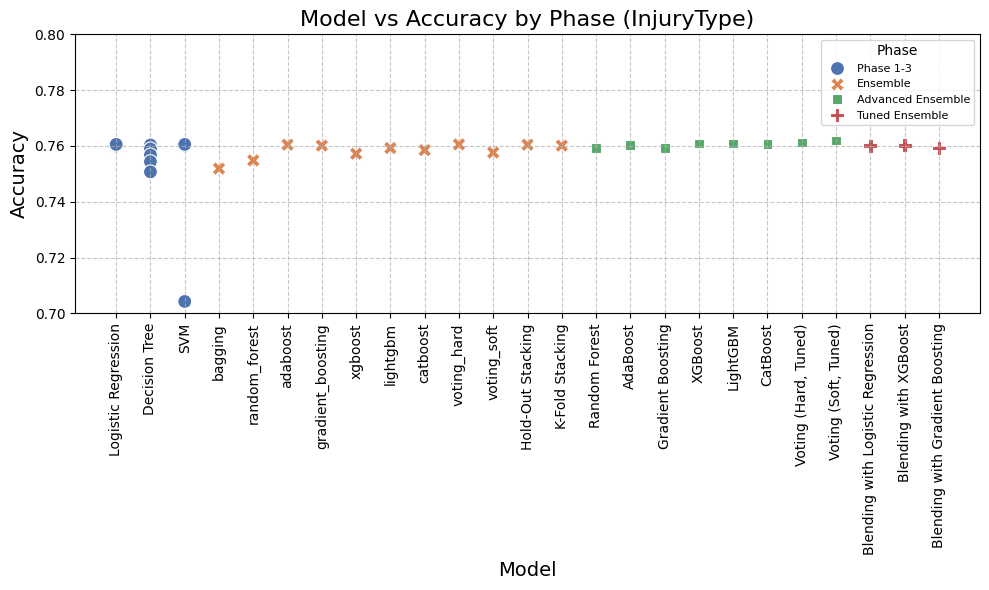

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=all_results_injurytype,
    x='Model',
    y='Accuracy',
    hue='Phase',
    style='Phase',
    s=100,
    palette='deep'
)

plt.title('Model vs Accuracy by Phase (InjuryType)', fontsize=16)
plt.xlabel('Model', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.legend(title='Phase', fontsize=8)
plt.xticks(rotation=90)
plt.ylim(0.7, 0.8)  # Set y-axis range
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

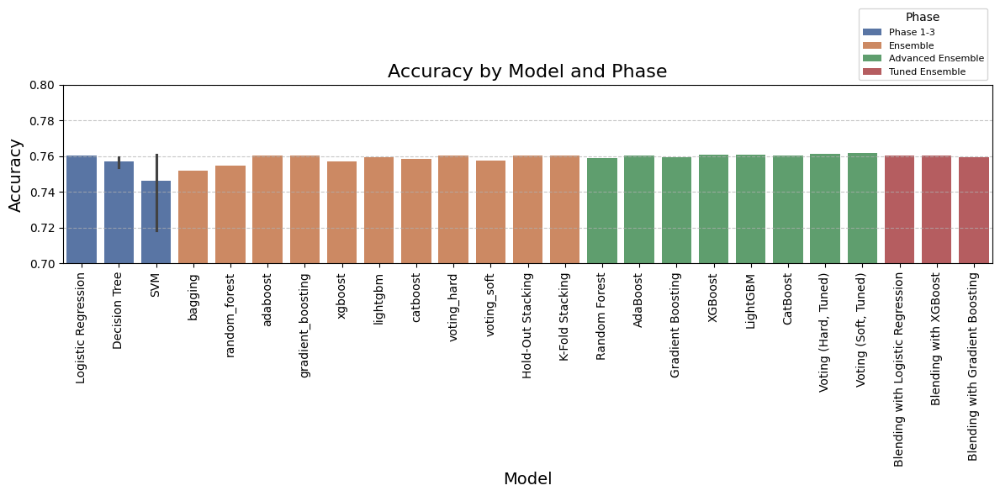

In [ ]:
plt.figure(figsize=(12, 6))
sns.barplot(
    data=all_results_injurytype,
    x='Model',
    y='Accuracy',
    hue='Phase',
    palette='deep'
)

plt.title('Accuracy by Model and Phase', fontsize=16)
plt.xlabel('Model', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.xticks(rotation=90)
plt.ylim(0.7, 0.8)  # Set y-axis range
plt.legend(title='Phase', fontsize=8, loc='lower right', bbox_to_anchor=(1, 1))
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

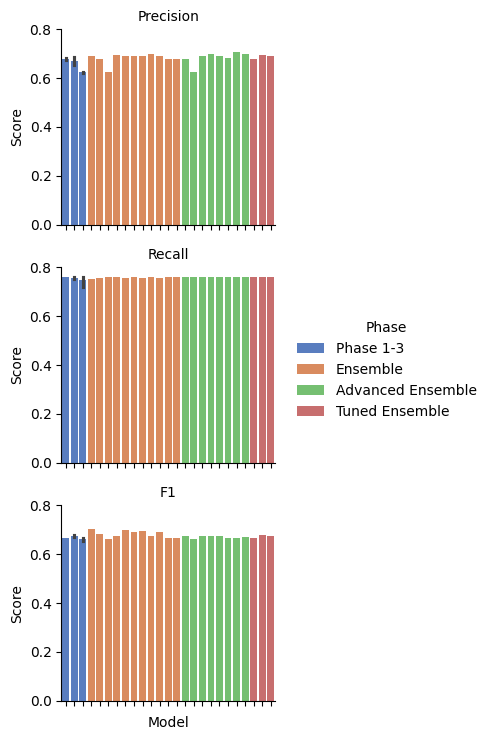

In [ ]:
melted_results = all_results_injurytype.melt(
    id_vars=['Model', 'Phase'],
    value_vars=['Precision', 'Recall', 'F1'],
    var_name='Metric',
    value_name='Score'
)

g = sns.catplot(
    data=melted_results,
    x='Model',
    y='Score',
    hue='Phase',
    col='Metric',
    kind='bar',
    col_wrap=1,
    height=2.5,
    aspect=1.2,
    palette='muted',

)

g.set_titles("{col_name}")
g.set_xticklabels(rotation=90)
g.set_axis_labels('Model', 'Score')
g.tight_layout()
plt.show()

#### PatientStatus

Model vs Accuracy by Phase (PatientStatus)

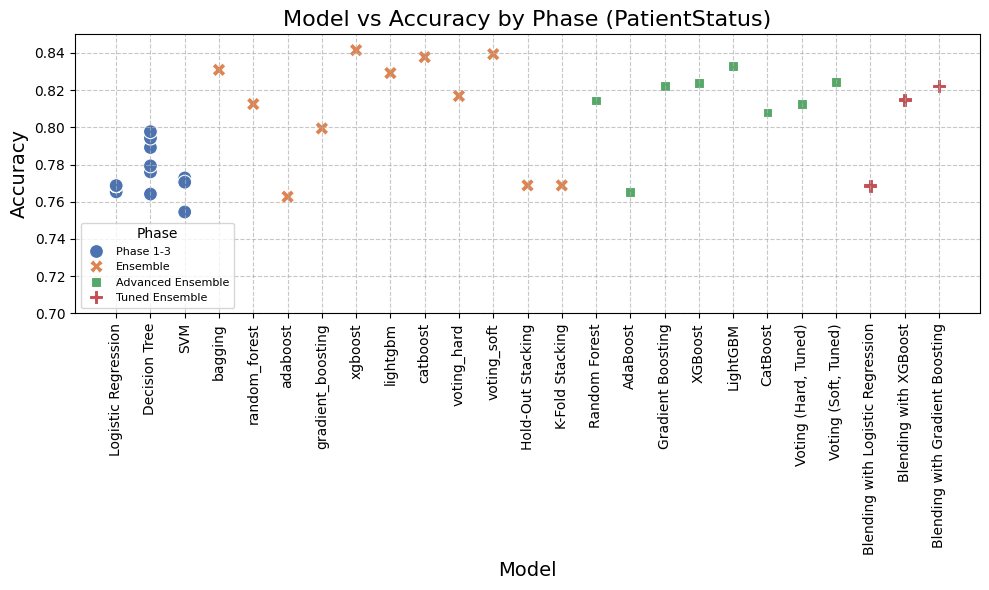

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=all_results_patientstatus,
    x='Model',
    y='Accuracy',
    hue='Phase',
    style='Phase',
    s=100,
    palette='deep'
)

plt.title('Model vs Accuracy by Phase (PatientStatus)', fontsize=16)
plt.xlabel('Model', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.legend(title='Phase', fontsize=8)
plt.xticks(rotation=90)
plt.ylim(0.7, 0.85)  # Set y-axis range
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

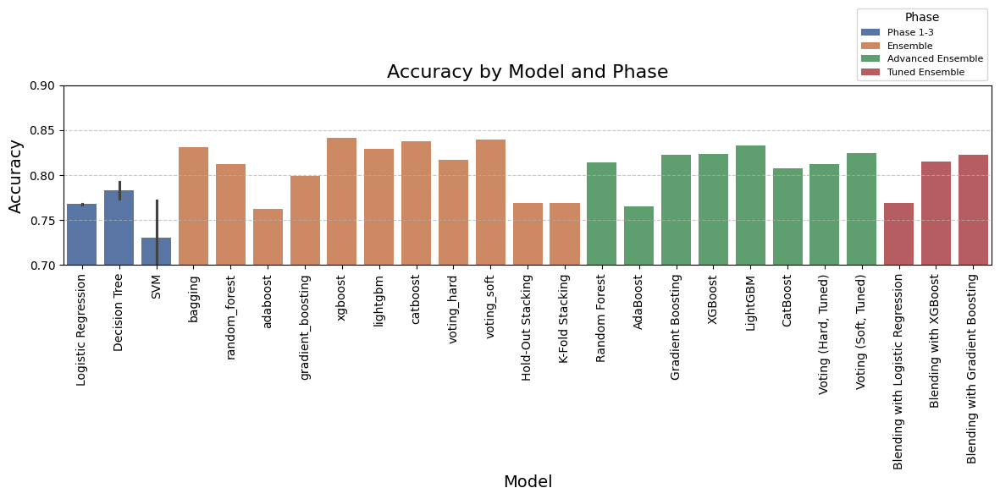

In [ ]:
plt.figure(figsize=(12, 6))
sns.barplot(
    data=all_results_patientstatus,
    x='Model',
    y='Accuracy',
    hue='Phase',
    palette='deep'
)

plt.title('Accuracy by Model and Phase', fontsize=16)
plt.xlabel('Model', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.xticks(rotation=90)
plt.ylim(0.7, 0.9)  # Set y-axis range
plt.legend(title='Phase', fontsize=8, loc='lower right', bbox_to_anchor=(1, 1))
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

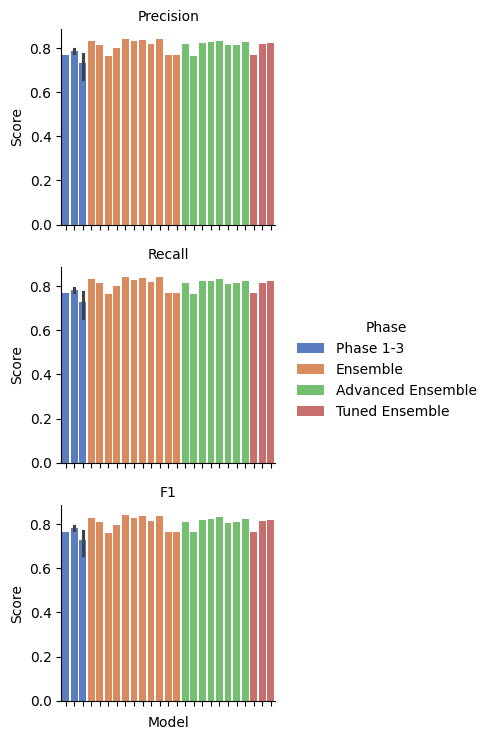

In [ ]:
melted_results = all_results_patientstatus.melt(
    id_vars=['Model', 'Phase'],
    value_vars=['Precision', 'Recall', 'F1'],
    var_name='Metric',
    value_name='Score'
)

g = sns.catplot(
    data=melted_results,
    x='Model',
    y='Score',
    hue='Phase',
    col='Metric',
    kind='bar',
    col_wrap=1,
    height=2.5,
    aspect=1.2,
    palette='muted',

)

g.set_titles("{col_name}")
g.set_xticklabels(rotation=90)
g.set_axis_labels('Model', 'Score')
g.tight_layout()
plt.show()

## Extra Experiments [Bonus]

### InjuryType

#### Load DFs

In [ ]:
results_df_dt = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_injury/results_df_dt.csv')
results_df_dt_cv = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_injury/results_df_dt_cv.csv')

results_df_holdout = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_injury/results_df_holdout.csv')

results_df_lr_knn_noCV = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_injury/results_df_lr_knn_noCV.csv')
results_df_lr_knn_CV = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_injury/results_df_lr_knn_CV.csv')

results_df_xgb_rf_noCV = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_injury/results_df_xgb_rf_noCV.csv')
results_df_xgb_rf_CV = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_injury/results_df_xgb_rf_CV.csv')

results_df_adaboost_gradientboost = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_injury/results_df_adaboost_gradientboost.csv')
results_df_catboost_lightgbm = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_injury/results_df_catboost_lightgbm.csv')

#### Format DF to combine

In [ ]:
results_df_dt

,Max_depth,Accuracy,Precision,Recall,F1,Confusion Matrix
0,4,0.789781,0.730511,0.789781,0.742520,[[6712 164 0 82 0]\n [1057 168 0 ...
1,5,0.798874,0.749147,0.798874,0.759278,[[6643 169 0 146 0]\n [1000 217 0 ...
2,6,0.809158,0.777650,0.809158,0.791808,[[6478 393 0 87 0]\n [ 754 494 0 ...
3,7,0.819333,0.798727,0.819333,0.806932,[[6484 409 3 62 0]\n [ 677 585 1 ...
4,8,0.825503,0.805340,0.825503,0.813589,[[6489 418 3 47 1]\n [ 653 621 0 ...
5,9,0.828210,0.813134,0.828210,0.819663,[[6460 438 11 47 2]\n [ 619 658 8 ...


In [ ]:
results_df_dt['Model'] = "Decision Tree"
results_df_dt = results_df_dt.drop(columns=['Confusion Matrix'], errors='ignore')
results_df_dt

,Max_depth,Accuracy,Precision,Recall,F1,Model
0,4,0.789781,0.730511,0.789781,0.742520,Decision Tree
1,5,0.798874,0.749147,0.798874,0.759278,Decision Tree
2,6,0.809158,0.777650,0.809158,0.791808,Decision Tree
3,7,0.819333,0.798727,0.819333,0.806932,Decision Tree
4,8,0.825503,0.805340,0.825503,0.813589,Decision Tree
5,9,0.828210,0.813134,0.828210,0.819663,Decision Tree


In [ ]:
results_df_dt_cv

,Max_depth,Accuracy,Precision,Recall,F1,AUC,Model
0,4,0.797802,0.735995,0.797802,0.749882,0.883253,Decision Tree (CV)
1,5,0.810468,0.756811,0.810468,0.767350,0.898874,Decision Tree (CV)
2,6,0.820130,0.774470,0.820130,0.782988,0.911400,Decision Tree (CV)
3,7,0.828358,0.795162,0.828358,0.793503,0.917217,Decision Tree (CV)
4,8,0.832959,0.796847,0.832959,0.798725,0.919888,Decision Tree (CV)
5,9,0.834447,0.798838,0.834447,0.801088,0.914512,Decision Tree (CV)


In [ ]:
results_df_dt['Model'] = "Decision Tree (CV)"
results_df_dt_cv = results_df_dt_cv.drop(columns=['AUC'], errors='ignore')
results_df_dt_cv

,Max_depth,Accuracy,Precision,Recall,F1,Model
0,4,0.797802,0.735995,0.797802,0.749882,Decision Tree (CV)
1,5,0.810468,0.756811,0.810468,0.767350,Decision Tree (CV)
2,6,0.820130,0.774470,0.820130,0.782988,Decision Tree (CV)
3,7,0.828358,0.795162,0.828358,0.793503,Decision Tree (CV)
4,8,0.832959,0.796847,0.832959,0.798725,Decision Tree (CV)
5,9,0.834447,0.798838,0.834447,0.801088,Decision Tree (CV)


In [ ]:
results_df_holdout

,Max_depth,Accuracy,Precision,Recall,F1,AUC
0,4,0.794544,0.740539,0.794544,0.759373,0.882179
1,5,0.809158,0.754557,0.809158,0.766349,0.898863
2,6,0.822905,0.777130,0.822905,0.789830,0.912848
3,7,0.831241,0.792226,0.831241,0.800583,0.920660
4,8,0.835354,0.799145,0.835354,0.806422,0.922608
5,9,0.836761,0.799937,0.836761,0.807137,0.922152


In [ ]:
results_df_holdout = results_df_holdout.drop(columns=['AUC'], errors='ignore')
results_df_holdout['Model'] = "Hold Out"
results_df_holdout

,Max_depth,Accuracy,Precision,Recall,F1,Model
0,4,0.794544,0.740539,0.794544,0.759373,Hold Out
1,5,0.809158,0.754557,0.809158,0.766349,Hold Out
2,6,0.822905,0.777130,0.822905,0.789830,Hold Out
3,7,0.831241,0.792226,0.831241,0.800583,Hold Out
4,8,0.835354,0.799145,0.835354,0.806422,Hold Out
5,9,0.836761,0.799937,0.836761,0.807137,Hold Out


In [ ]:
results_df_lr_knn_noCV

,Model,Accuracy,Precision,Recall,F1
0,Logistic Regression,0.993072,0.993169,0.993072,0.993105
1,KNN,0.830483,0.793076,0.830483,0.800666


In [ ]:
results_df_lr_knn_CV

,Model,Accuracy,Precision,Recall,F1
0,Logistic Regression,0.990500,0.991204,0.990500,0.990741
1,KNN,0.825219,0.784983,0.825219,0.792952


In [ ]:
results_df_lr_knn_CV['Model'] = results_df_lr_knn_CV['Model'] + " (CV)"
results_df_lr_knn_CV

,Model,Accuracy,Precision,Recall,F1
0,Logistic Regression (CV),0.990500,0.991204,0.990500,0.990741
1,KNN (CV),0.825219,0.784983,0.825219,0.792952


In [ ]:
results_df_xgb_rf_noCV

,Model,Accuracy,Precision,Recall,F1
0,Random Forest,0.836978,0.824254,0.836978,0.789718
1,XGBoost,0.962546,0.957562,0.962546,0.954454


In [ ]:
results_df_xgb_rf_CV

,Model,Accuracy,Precision,Recall,F1
0,Random Forest,0.828981,0.824391,0.828981,0.778497
1,XGBoost,0.954965,0.948873,0.954965,0.946076


In [ ]:
results_df_xgb_rf_CV['Model'] = results_df_xgb_rf_CV['Model'] + " (CV)"
results_df_xgb_rf_CV

,Model,Accuracy,Precision,Recall,F1
0,Random Forest (CV),0.828981,0.824391,0.828981,0.778497
1,XGBoost (CV),0.954965,0.948873,0.954965,0.946076


In [ ]:
results_df_catboost_lightgbm

,Model,Accuracy,Precision,Recall,F1
0,CatBoost,0.979974,0.980415,0.979974,0.977152
1,LightGBM,0.955077,0.947245,0.955077,0.946438


In [ ]:
results_df_adaboost_gradientboost

,Model,Accuracy,Precision,Recall,F1
0,Gradient Boosting,0.913509,0.897294,0.913509,0.900454
1,AdaBoost,0.804070,0.851988,0.804070,0.814219


#### Combine Result DFs

In [ ]:
combined_df_fe = pd.concat([
    results_df_dt,
    results_df_dt_cv,
    results_df_holdout,
    results_df_lr_knn_noCV,
    results_df_lr_knn_CV,
    results_df_xgb_rf_noCV,
    results_df_xgb_rf_CV,
    results_df_adaboost_gradientboost,
    results_df_catboost_lightgbm
], ignore_index=True)
combined_df_fe = combined_df_fe.reset_index(drop=True)

In [ ]:
combined_df_fe_sorted = combined_df_fe.sort_values(by='Accuracy', ascending=False)
combined_df_fe_sorted

,Max_depth,Accuracy,Precision,Recall,F1,Model
18,NaN,0.993072,0.993169,0.993072,0.993105,Logistic Regression
20,NaN,0.990500,0.991204,0.990500,0.990741,Logistic Regression (CV)
28,NaN,0.979974,0.980415,0.979974,0.977152,CatBoost
23,NaN,0.962546,0.957562,0.962546,0.954454,XGBoost
29,NaN,0.955077,0.947245,0.955077,0.946438,LightGBM
25,NaN,0.954965,0.948873,0.954965,0.946076,XGBoost (CV)
26,NaN,0.913509,0.897294,0.913509,0.900454,Gradient Boosting
22,NaN,0.836978,0.824254,0.836978,0.789718,Random Forest
17,9.0,0.836761,0.799937,0.836761,0.807137,Hold Out
16,8.0,0.835354,0.799145,0.835354,0.806422,Hold Out


#### Visualizations

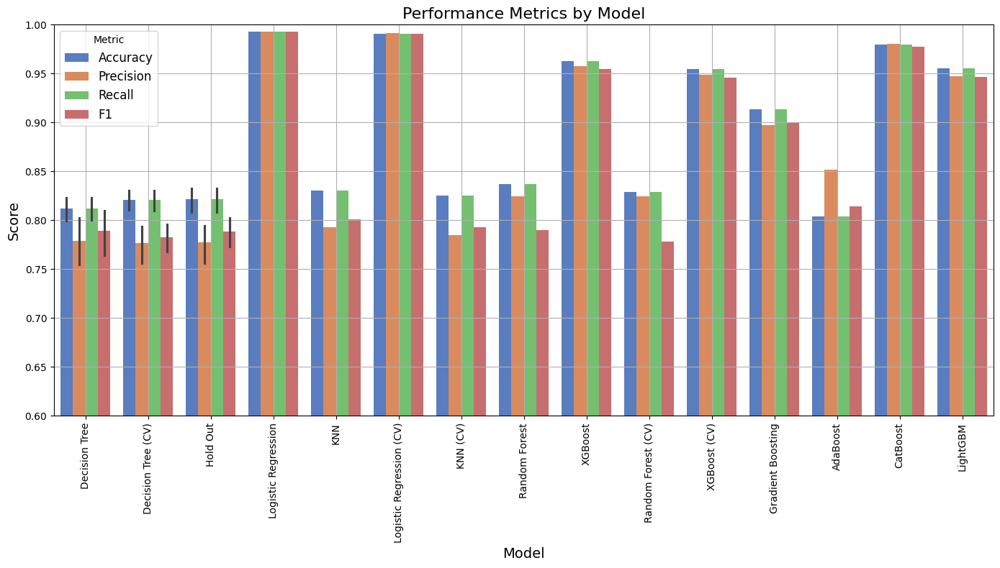

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Melt the combined dataframe for grouped bar plots
melted_combined_df = combined_df_fe.melt(
    id_vars=['Model'],
    value_vars=['Accuracy', 'Precision', 'Recall', 'F1'],
    var_name='Metric',
    value_name='Score'
)

# Plot grouped bar chart for all models and metrics
plt.figure(figsize=(14, 8))
sns.barplot(data=melted_combined_df, x='Model', y='Score', hue='Metric', palette='muted')

plt.title('Performance Metrics by Model', fontsize=16)
plt.xlabel('Model', fontsize=14)
plt.ylabel('Score', fontsize=14)
plt.xticks(rotation=90)
plt.legend(title='Metric', fontsize=12)
plt.ylim(0.6, 1)  # Set y-axis range
plt.grid()
plt.tight_layout()
plt.show()

### PatientStatus

#### Load DFs

In [ ]:
results_df_dt = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_patient/results_df_dt.csv')
results_df_dt_cv = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_patient/results_df_dt_cv.csv')

results_df_holdout = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_patient/results_df_holdout.csv')

results_df_lr_knn_noCV = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_patient/results_df_lr_knn_noCV.csv')
results_df_lr_knn_CV = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_patient/results_df_lr_knn_CV.csv')

results_df_xgb_rf_noCV = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_patient/results_df_xgb_rf_noCV.csv')
# results_df_xgb_rf_CV = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/fe_patient/results_df_xgb_rf_CV.csv')

# results_df_adaboost_gradientboost = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/fe_patient/fe_injury/results_df_adaboost_gradientboost.csv')
# results_df_catboost_lightgbm = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/fe_patient/fe_injury/results_df_catboost_lightgbm.csv')

#### Format to combine

In [ ]:
results_df_dt

,Max_depth,Accuracy,Precision,Recall,F1,Confusion Matrix
0,4,0.908313,0.899004,0.908313,0.902512,[[3864 499 0]\n [ 231 4527 0]\n [ 0 ...
1,5,0.934726,0.933623,0.934726,0.933197,[[4044 319 0]\n [ 186 4552 20]\n [ 0 ...
2,6,0.948041,0.946665,0.948041,0.946635,[[4116 245 2]\n [ 133 4602 23]\n [ 0 ...
3,7,0.956376,0.955232,0.956376,0.954537,[[4161 202 0]\n [ 108 4637 13]\n [ 0 ...
4,8,0.960273,0.958441,0.960273,0.958767,[[4217 144 2]\n [ 123 4614 21]\n [ 2 ...
5,9,0.964386,0.962864,0.964386,0.962900,[[4209 153 1]\n [ 79 4659 20]\n [ 2 ...


In [ ]:
results_df_dt['Model'] = "Decision Tree"
results_df_dt = results_df_dt.drop(columns=['Confusion Matrix'], errors='ignore')
results_df_dt

,Max_depth,Accuracy,Precision,Recall,F1,Model
0,4,0.908313,0.899004,0.908313,0.902512,Decision Tree
1,5,0.934726,0.933623,0.934726,0.933197,Decision Tree
2,6,0.948041,0.946665,0.948041,0.946635,Decision Tree
3,7,0.956376,0.955232,0.956376,0.954537,Decision Tree
4,8,0.960273,0.958441,0.960273,0.958767,Decision Tree
5,9,0.964386,0.962864,0.964386,0.962900,Decision Tree


In [ ]:
results_df_dt_cv

,Max_depth,Accuracy,Precision,Recall,F1,AUC
0,4,0.910444,0.901102,0.910444,0.904609,0.947686
1,5,0.939403,0.938222,0.939403,0.936648,0.960763
2,6,0.953233,0.953386,0.953233,0.950036,0.970551
3,7,0.960270,0.960179,0.960270,0.957560,0.972619
4,8,0.962705,0.962010,0.962705,0.960189,0.974838
5,9,0.963815,0.962731,0.963815,0.961504,0.971575


In [ ]:
results_df_dt_cv['Model'] = "Decision Tree (CV)"
results_df_dt_cv = results_df_dt_cv.drop(columns=['AUC'], errors='ignore')
results_df_dt_cv

,Max_depth,Accuracy,Precision,Recall,F1,Model
0,4,0.910444,0.901102,0.910444,0.904609,Decision Tree (CV)
1,5,0.939403,0.938222,0.939403,0.936648,Decision Tree (CV)
2,6,0.953233,0.953386,0.953233,0.950036,Decision Tree (CV)
3,7,0.960270,0.960179,0.960270,0.957560,Decision Tree (CV)
4,8,0.962705,0.962010,0.962705,0.960189,Decision Tree (CV)
5,9,0.963815,0.962731,0.963815,0.961504,Decision Tree (CV)


In [ ]:
results_df_holdout

,Max_depth,Accuracy,Precision,Recall,F1,AUC
0,4,0.909829,0.900592,0.909829,0.904020,0.953358
1,5,0.938731,0.938540,0.938731,0.935741,0.969674
2,6,0.952587,0.951704,0.952587,0.949399,0.976764
3,7,0.957675,0.956501,0.957675,0.955400,0.980572
4,8,0.963412,0.962366,0.963412,0.961098,0.980031
5,9,0.966226,0.965062,0.966226,0.964061,0.979285


In [ ]:
results_df_holdout['Model'] = "Hold Out"
results_df_holdout = results_df_holdout.drop(columns=['AUC'], errors='ignore')
results_df_holdout

,Max_depth,Accuracy,Precision,Recall,F1,Model
0,4,0.909829,0.900592,0.909829,0.904020,Hold Out
1,5,0.938731,0.938540,0.938731,0.935741,Hold Out
2,6,0.952587,0.951704,0.952587,0.949399,Hold Out
3,7,0.957675,0.956501,0.957675,0.955400,Hold Out
4,8,0.963412,0.962366,0.963412,0.961098,Hold Out
5,9,0.966226,0.965062,0.966226,0.964061,Hold Out


In [ ]:
results_df_lr_knn_noCV

,Model,Accuracy,Precision,Recall,F1
0,Logistic Regression,0.999567,0.999569,0.999567,0.999568
1,KNN,0.910045,0.909864,0.910045,0.907626


In [ ]:
results_df_lr_knn_CV

,Model,Accuracy,Precision,Recall,F1
0,Logistic Regression,0.999161,0.999181,0.999161,0.999167
1,KNN,0.902514,0.901245,0.902514,0.899375


In [ ]:
results_df_lr_knn_CV['Model'] = results_df_lr_knn_CV['Model'] + " (CV)"

In [ ]:
results_df_lr_knn_CV

,Model,Accuracy,Precision,Recall,F1
0,Logistic Regression (CV),0.999161,0.999181,0.999161,0.999167
1,KNN (CV),0.902514,0.901245,0.902514,0.899375


In [ ]:
results_df_xgb_rf_noCV

,Model,Accuracy,Precision,Recall,F1
0,Random Forest,0.962438,0.964964,0.962438,0.958218
1,XGBoost,0.990799,0.990615,0.990799,0.990013


#### Combine Results DF

In [ ]:
combined_df_fe_patient = pd.concat([
    results_df_dt,
    results_df_dt_cv,
    results_df_holdout,
    results_df_lr_knn_noCV,
    results_df_lr_knn_CV,
    results_df_xgb_rf_noCV,
], ignore_index=True)
combined_df_fe_patient = combined_df_fe_patient.reset_index(drop=True)

In [ ]:
combined_df_fe_patient_sorted = combined_df_fe_patient.sort_values(by='Accuracy', ascending=False)
combined_df_fe_patient_sorted

,Max_depth,Accuracy,Precision,Recall,F1,Model
18,NaN,0.999567,0.999569,0.999567,0.999568,Logistic Regression
20,NaN,0.999161,0.999181,0.999161,0.999167,Logistic Regression (CV)
23,NaN,0.990799,0.990615,0.990799,0.990013,XGBoost
17,9.0,0.966226,0.965062,0.966226,0.964061,Hold Out
5,9.0,0.964386,0.962864,0.964386,0.962900,Decision Tree
11,9.0,0.963815,0.962731,0.963815,0.961504,Decision Tree (CV)
16,8.0,0.963412,0.962366,0.963412,0.961098,Hold Out
10,8.0,0.962705,0.962010,0.962705,0.960189,Decision Tree (CV)
22,NaN,0.962438,0.964964,0.962438,0.958218,Random Forest
4,8.0,0.960273,0.958441,0.960273,0.958767,Decision Tree


#### Visualization

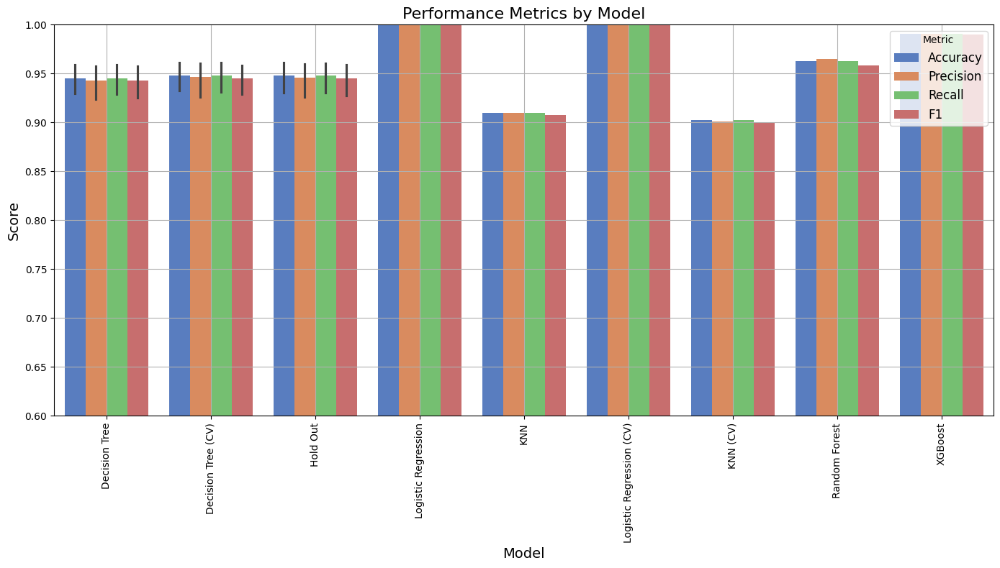

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Melt the combined dataframe for grouped bar plots
melted_combined_df = combined_df_fe_patient.melt(
    id_vars=['Model'],
    value_vars=['Accuracy', 'Precision', 'Recall', 'F1'],
    var_name='Metric',
    value_name='Score'
)

# Plot grouped bar chart for all models and metrics
plt.figure(figsize=(14, 8))
sns.barplot(data=melted_combined_df, x='Model', y='Score', hue='Metric', palette='muted')

plt.title('Performance Metrics by Model', fontsize=16)
plt.xlabel('Model', fontsize=14)
plt.ylabel('Score', fontsize=14)
plt.xticks(rotation=90)
plt.legend(title='Metric', fontsize=12)
plt.ylim(0.6, 1)  # Set y-axis range
plt.grid()
plt.tight_layout()
plt.show()

## Neural Network

### InjuryType

In [ ]:
results_df_nn_injurytype = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/neural_network/results_df_nn_injurytype.csv')

In [ ]:
results_df_nn_injurytype

,Model,Accuracy,Precision,Recall,F1 Score,Confusion Matrix
0,FeedForward Neural Network,0.912102,0.916535,0.912102,0.905634,[[6927 15 16 0 0]\n [ 459 887 1 ...
1,MLP,0.903984,0.905484,0.903984,0.897516,[[6866 72 19 1 0]\n [ 460 884 3 ...
2,CNN,0.901169,0.901271,0.901169,0.895343,[[6820 115 15 6 2]\n [ 463 882 2 ...
3,ResNet,0.904200,0.904717,0.904200,0.898883,[[6825 48 82 1 2]\n [ 446 898 2 ...


In [ ]:
results_df_nn_injurytype_sorted = results_df_nn_injurytype.sort_values(by='Accuracy', ascending=False)
results_df_nn_injurytype_sorted = results_df_nn_injurytype_sorted.drop(columns=['Confusion Matrix']).reset_index(drop=True)
print(results_df_nn_injurytype_sorted)

                        Model  Accuracy  Precision    Recall  F1 Score
0  FeedForward Neural Network  0.912102   0.916535  0.912102  0.905634
1                      ResNet  0.904200   0.904717  0.904200  0.898883
2                         MLP  0.903984   0.905484  0.903984  0.897516
3                         CNN  0.901169   0.901271  0.901169  0.895343


#### Result Visualization

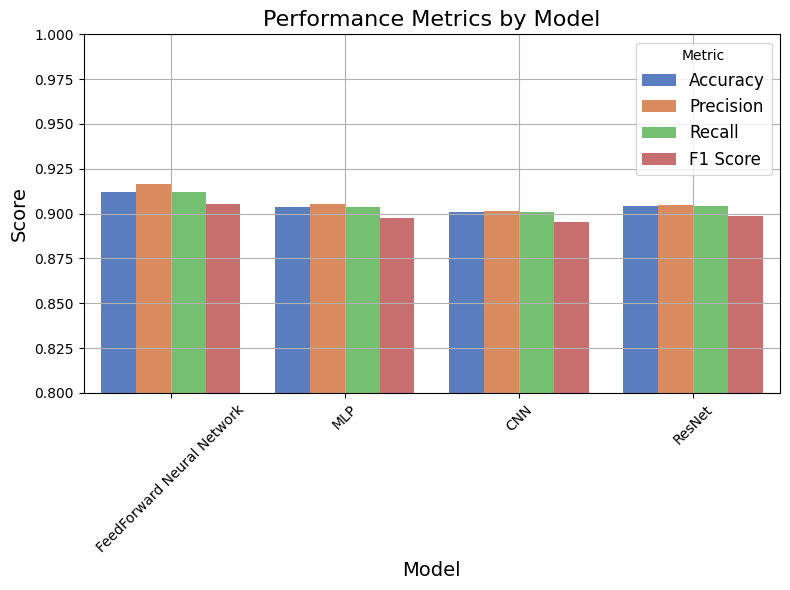

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Melt the DataFrame to use for grouped bar plots
melted_results = results_df_nn_injurytype.melt(
    id_vars=['Model'],
    value_vars=['Accuracy', 'Precision', 'Recall', 'F1 Score'],
    var_name='Metric',
    value_name='Score'
)

# Plot grouped bar chart
plt.figure(figsize=(8, 6))
sns.barplot(data=melted_results, x='Model', y='Score', hue='Metric', palette='muted')

plt.title('Performance Metrics by Model', fontsize=16)
plt.xlabel('Model', fontsize=14)
plt.ylabel('Score', fontsize=14)
plt.ylim(0.8, 1)  # Set y-axis range
plt.xticks(rotation=45)
plt.legend(title='Metric', fontsize=12)
plt.grid()
plt.tight_layout()
plt.show()

### PatientStatus

In [ ]:
results_df_nn_patientstatus = pd.read_csv('/content/drive/MyDrive/Varsity/CSE445_SVa/new_df/neural_network/results_df_nn_patientstatus.csv')

In [ ]:
results_df_nn_patientstatus

,Model,Accuracy,Precision,Recall,F1 Score,Confusion Matrix
0,FeedForward Neural Network,0.9209,0.9215,0.9209,0.9207,[[4303 444 11]\n [ 244 4119 0]\n [ 32 ...
1,MLP,0.9133,0.9136,0.9133,0.9131,[[4309 443 6]\n [ 317 4046 0]\n [ 35 ...
2,CNN,0.9212,0.9210,0.9212,0.9211,[[4397 343 18]\n [ 333 4028 2]\n [ 32 ...
3,ResNet,0.9207,0.9208,0.9207,0.9205,[[4344 401 13]\n [ 284 4079 0]\n [ 34 ...


In [ ]:
results_df_nn_patientstatus_sorted = results_df_nn_patientstatus.sort_values(by='Accuracy', ascending=False)
results_df_nn_patientstatus_sorted = results_df_nn_patientstatus_sorted.drop(columns=['Confusion Matrix']).reset_index(drop=True)
print(results_df_nn_patientstatus_sorted)

                        Model  Accuracy  Precision  Recall  F1 Score
0                         CNN    0.9212     0.9210  0.9212    0.9211
1  FeedForward Neural Network    0.9209     0.9215  0.9209    0.9207
2                      ResNet    0.9207     0.9208  0.9207    0.9205
3                         MLP    0.9133     0.9136  0.9133    0.9131


#### Result Visualization

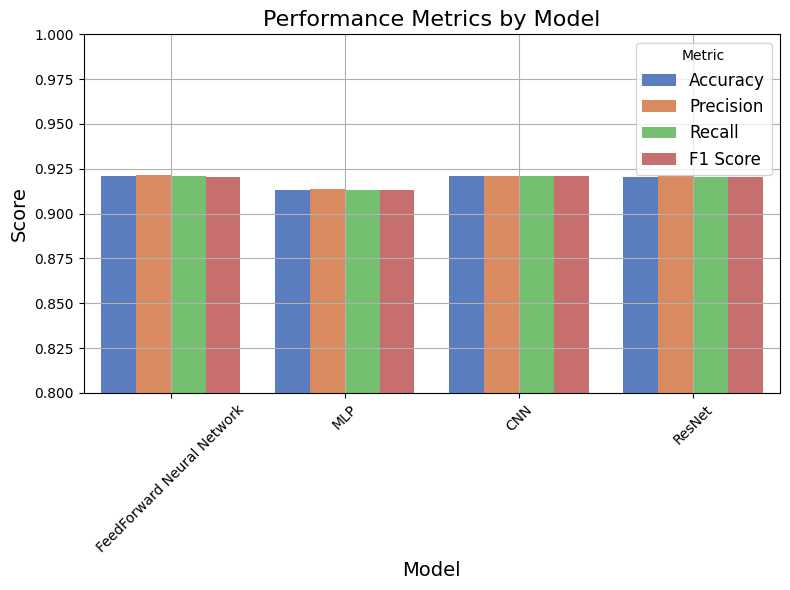

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Melt the DataFrame to use for grouped bar plots
melted_results = results_df_nn_patientstatus.melt(
    id_vars=['Model'],
    value_vars=['Accuracy', 'Precision', 'Recall', 'F1 Score'],
    var_name='Metric',
    value_name='Score'
)

# Plot grouped bar chart
plt.figure(figsize=(8, 6))
sns.barplot(data=melted_results, x='Model', y='Score', hue='Metric', palette='muted')

plt.title('Performance Metrics by Model', fontsize=16)
plt.xlabel('Model', fontsize=14)
plt.ylabel('Score', fontsize=14)
plt.ylim(0.8, 1)  # Set y-axis range
plt.xticks(rotation=45)
plt.legend(title='Metric', fontsize=12)
plt.grid()
plt.tight_layout()
plt.show()